In [3]:
import zstandard as zstd

In [5]:
def decompress_pgn_zst(file_path, output_path):
    with open(file_path, 'rb') as compressed_file:
        dctx = zstd.ZstdDecompressor()
    
        with open(output_path, 'wb') as decompressed_file:
            dctx.copy_stream(compressed_file, decompressed_file)
    

compressed_file_path = r'C:\Users\johns\OneDrive\Desktop\Programming\Python\AI\Projects\chess.ai\lichess_db_standard_rated_2016-03.pgn.zst'
decompressed_file_path = r'testdb.pgn'

decompress_pgn_zst(compressed_file_path, decompressed_file_path)
print(f'Decompressed file saved to {decompressed_file_path}')

Decompressed file saved to testdb.pgn


In [1]:
False and False

False

In [2]:
import numpy as np

def make_list(batch_size, seq_len):
    l = [[0] * seq_len for _ in range(batch_size)]

    for i in range(batch_size):
        for x in range(seq_len):
            l[i][x] = (i * seq_len) + x
    return l
np_array = np.array(make_list(32, 10))

len(np_array)

32

In [5]:
import numpy as np
import chess.pgn

def board_to_tensor(board):
    tensor = np.zeros((8, 8, 14), dtype=np.float32)
    p_map = {
        chess.PAWN: 0,
        chess.KNIGHT: 1,
        chess.BISHOP: 2,
        chess.ROOK: 3,
        chess.QUEEN: 4,
        chess.KING: 5
    }

    for square in chess.SQUARES:
        piece = board.piece_at(square)
        if piece:
            channel = p_map[piece.piece_type] + (6 if piece.color == chess.BLACK else 0)
            row, col = divmod(square, 8)
            tensor[row, col, channel] = 1
    if board.has_kingside_castling_rights(chess.WHITE):
        tensor[:, :, 12] = 1
    if board.has_kingside_castling_rights(chess.BLACK):
        tensor[:, :, 13] = 1

    # Set castling channels
    if board.has_kingside_castling_rights(chess.WHITE):
        tensor[0, 7, 12] = 1  # H1 square
    if board.has_kingside_castling_rights(chess.BLACK):
        tensor[7, 7, 13] = 1  # H8 square


    return tensor

In [3]:
import chess.pgn
def extract_data(pgn_file_path, output_file=None):
    data=[]
    with open(pgn_file_path, 'r') as pgn_file:
        while True:
            game = chess.pgn.read_game(pgn_file)
            if game is None:
                break
            board = game.board()
            for move in game.mainline_moves():
                position = board_to_tensor(board)
                board.push(move)
                next_move = move.uci()
                data.append((position, next_move))
    
    if output_file:
        np.save(output_file, data)
    return data

pgn_file_path = r'C:\Users\johns\OneDrive\Desktop\Programming\Python\AI\Projects\chess.ai\testdb.pgn'
output_file = r'testdata.npy'
data = extract_data(pgn_file_path=pgn_file_path, output_file=output_file)

NameError: name 'board_to_tensor' is not defined

In [6]:
import pickle

def load_data_from_pickle(file_path, num_to_load):
    """
    Load data stored in a pickle file incrementally.
    """
    data = []
    with open(file_path, 'rb') as f:
        count = 1
        while count <= num_to_load:
            try:
                chunk = pickle.load(f)
                data.extend(chunk)  # Add chunk to data list
                count += 1
                print(f'Chunk: {count}')
            except EOFError:
                break  # Reached the end of the file
    return data

# File path to the .pkl file
# pickle_file_path = r'testdata.pkl'

# # Load data
# data = load_data_from_pickle(pickle_file_path, num_to_load=100)

# Example: Access the first (position, move) pai

In [7]:
data = load_data_from_pickle('testdata.pkl', 1)

Chunk: 2


In [8]:
pos, move = data[0]

In [9]:
pos

array([[[0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]],

       [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        

In [3]:
len(data)

1000

In [4]:
position, move = data[0]

In [5]:
len(position), len(move)

(8, 4)

In [12]:
position

array([[[0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.]],

       [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
        

In [27]:
import chess
import chess.svg
from IPython.display import display, SVG

# Function to reconstruct the board
def visualize_board(position_tensor):
    board = chess.Board()
    board.clear()  # Start with an empty board

    piece_map = {
        0: chess.PAWN,
        1: chess.KNIGHT,
        2: chess.BISHOP,
        3: chess.ROOK,
        4: chess.QUEEN,
        5: chess.KING,
    }

    for row in range(8):
        for col in range(8):
            for channel in range(12):  # First 12 channels for pieces
                if position_tensor[row, col, channel] == 1:
                    color = chess.WHITE if channel < 6 else chess.BLACK
                    piece_type = piece_map[channel % 6]
                    square = chess.square(col, 7 - row)  # Convert row/col to square
                    board.set_piece_at(square, chess.Piece(piece_type, color))

    return board

# # Visualize the first position
# position, next_move = data[0]
# board = visualize_board(position)

# # Display the board
# display(SVG(chess.svg.board(board=board, size=500)))
# print(f"Next move: {next_move}")

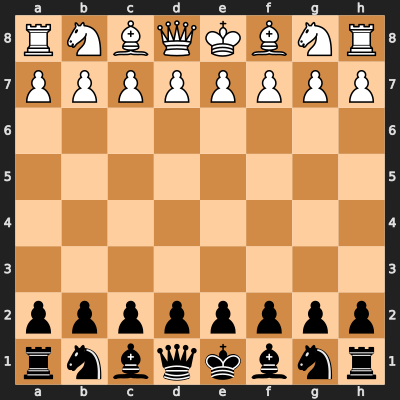

is inital board state


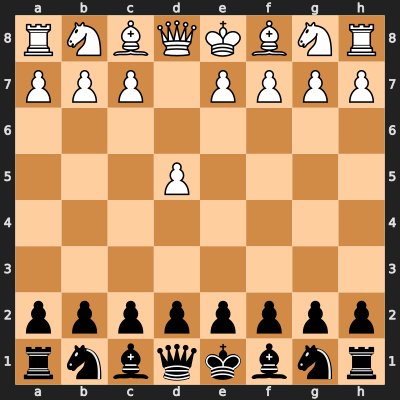

is inital board state


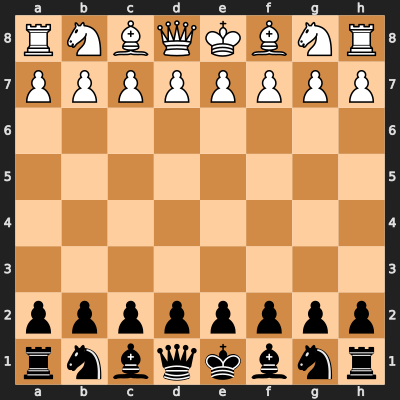

is inital board state


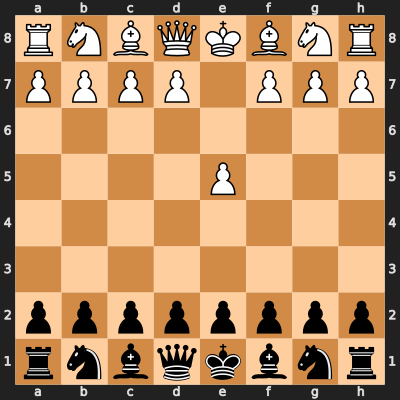

is inital board state


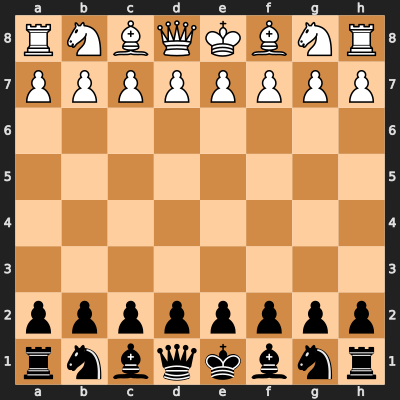

is inital board state


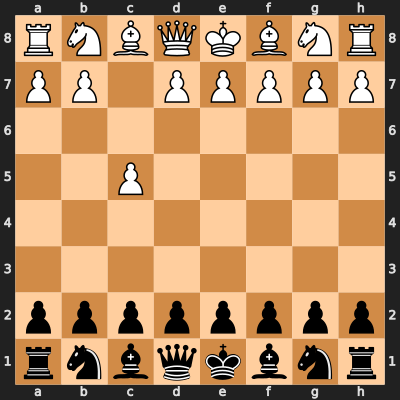

is inital board state


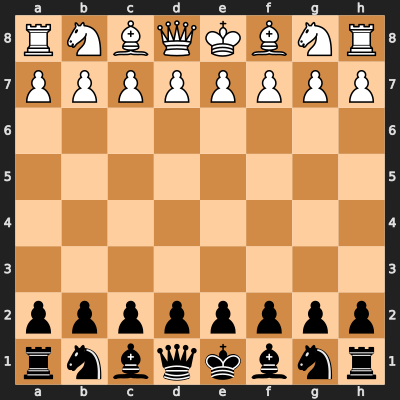

is inital board state


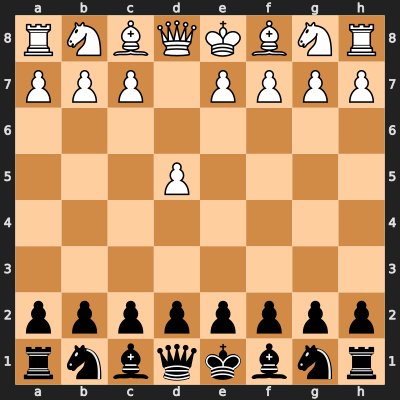

is inital board state


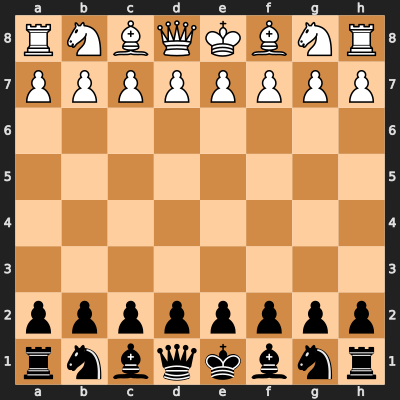

is inital board state


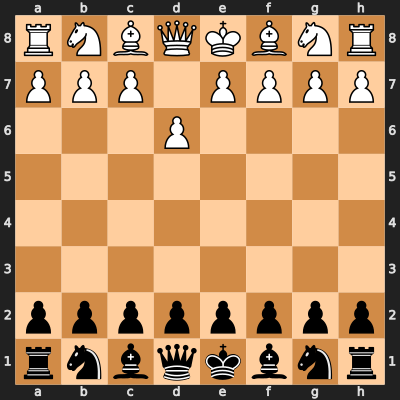

is inital board state


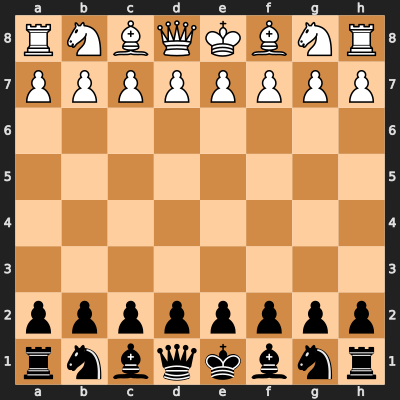

is inital board state


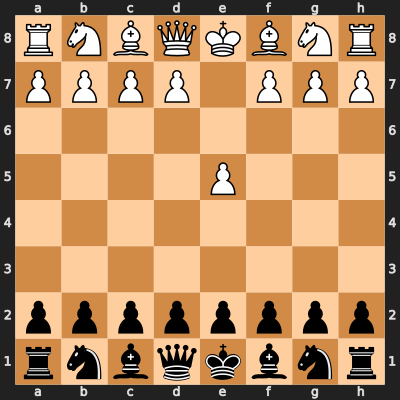

is inital board state


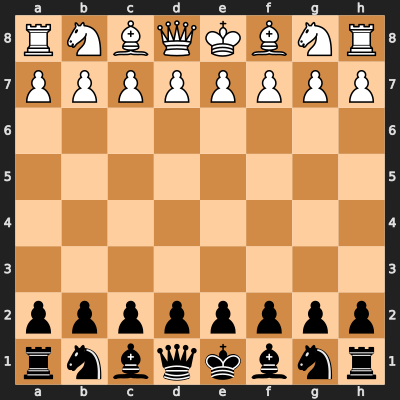

is inital board state


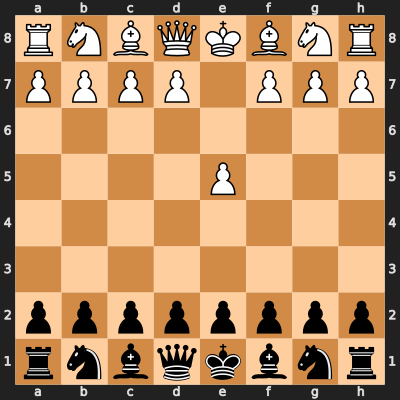

is inital board state


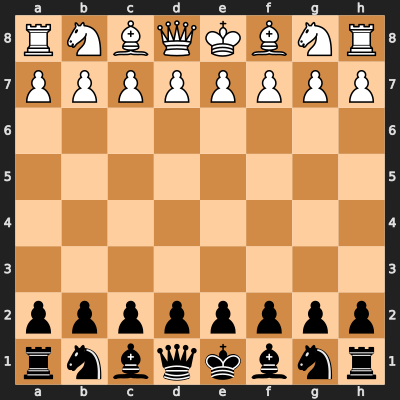

is inital board state


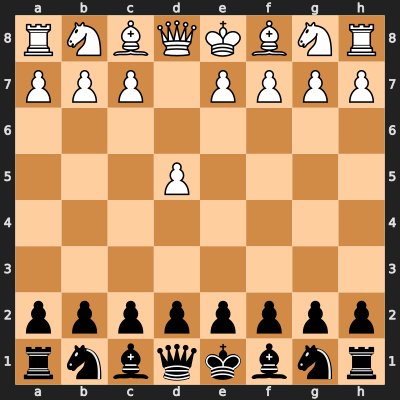

is inital board state


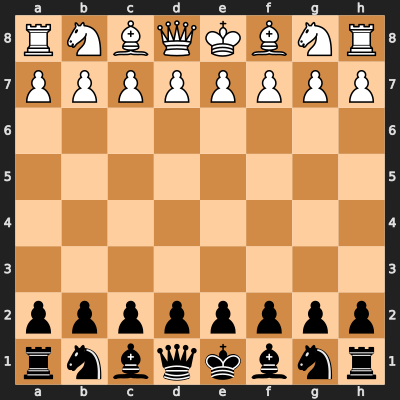

is inital board state


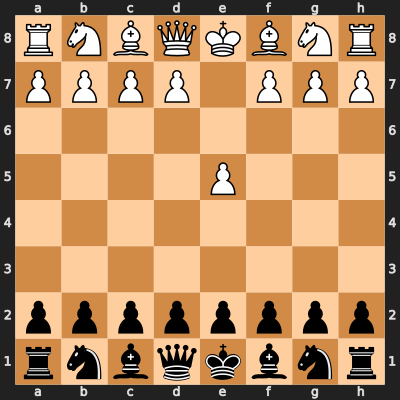

is inital board state


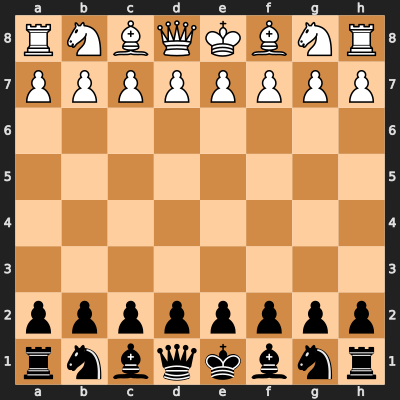

is inital board state


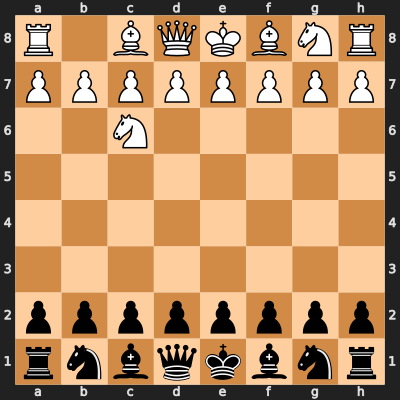

is inital board state


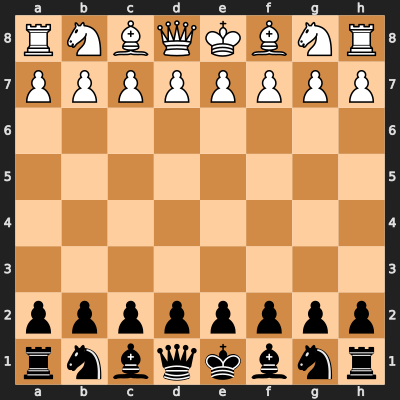

is inital board state


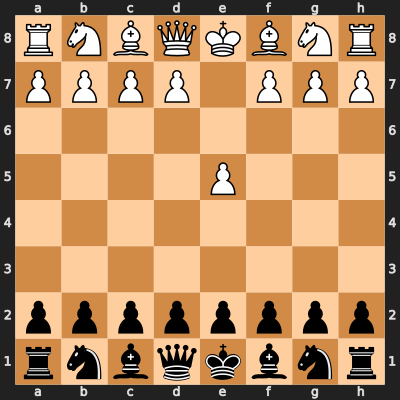

is inital board state


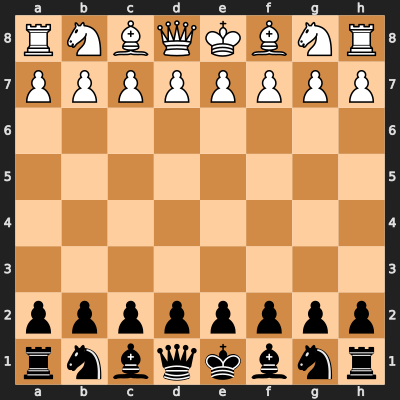

is inital board state


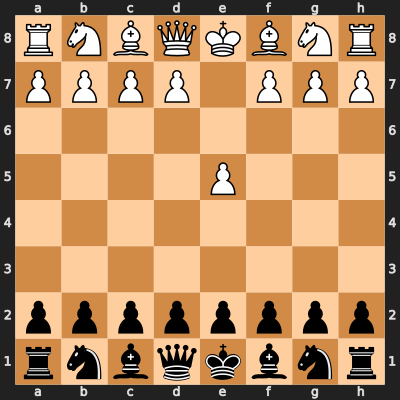

is inital board state


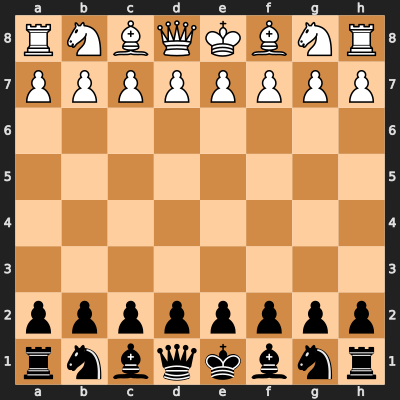

is inital board state


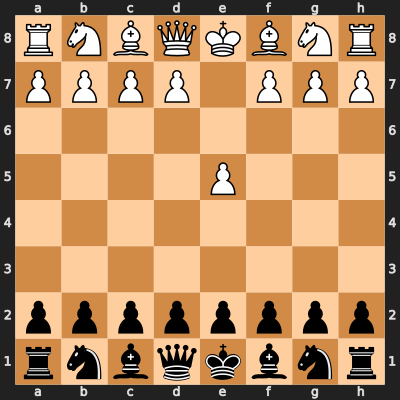

is inital board state


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [5]:
import chess.svg
from IPython.display import display, SVG
import torch
import pickle
import numpy as np

def display_chessboard(board):
    """Render the chessboard as an SVG."""
    if not isinstance(board, chess.Board):  # ✅ Prevent errors
        raise ValueError("Expected a chess.Board object but got", type(board))

    svg = chess.svg.board(board, size=400)  # Adjust size as needed
    display(SVG(svg))  # Display in Jupyter Notebook or console

def tensor_to_board_14x8x8(tensor):
    """
    Converts a 14x8x8 NumPy array to a chess.Board object.
    """
    board = chess.Board()
    board.clear()  # Clear the board for custom setup

    # Mapping tensor channels to chess pieces
    piece_map = {
        0: chess.PAWN,
        1: chess.KNIGHT,
        2: chess.BISHOP,
        3: chess.ROOK,
        4: chess.QUEEN,
        5: chess.KING
    }

    for row in range(8):
        for col in range(8):
            for channel in range(12):  # Ignore castling metadata
                if tensor[channel, row, col] == 1:
                    piece_type = piece_map[channel % 6]  # Map to piece type
                    color = chess.WHITE if channel < 6 else chess.BLACK
                    square = chess.square(col, 7 - row)  # Correct square indexing

                    board.set_piece_at(square, chess.Piece(piece_type, color))

    return board  # ✅ Ensure only the `chess.Board` is returned

def load_data_in_chunks(file_path):
    with open(file_path, 'rb') as f:
        while True:
            try:
                chunk = pickle.load(f)
                yield chunk
            except EOFError:
                break

def move_to_integer(move):
    move = chess.Move.from_uci(move)
    from_square = move.from_square
    to_square   = move.to_square

    # # Determine if there's a promotion
    # if move.promotion is not None:
    #     promotion_code = PROMOTION_MAP[move.promotion]
    # else:
    #     promotion_code = PROMOTION_MAP[None]

    return from_square * 64 + to_square + 4096 * 0

def is_inital_board(board):
    INITIAL_FEN = "RNBQKBNR/PPPPPPPP/8/8/8/8/pppppppp/rnbqkbnr w - - 0 1"
    return board.fen() == INITIAL_FEN

def tensor_to_board_14x8x8(tensor):
    """
    Converts a 14x8x8 NumPy array to a chess.Board object.
    """
    board = chess.Board()
    board.clear()  # Clear the board for custom setup

    # Mapping tensor channels to chess pieces
    piece_map = {
        0: chess.PAWN,
        1: chess.KNIGHT,
        2: chess.BISHOP,
        3: chess.ROOK,
        4: chess.QUEEN,
        5: chess.KING
    }

    for row in range(8):
        for col in range(8):
            for channel in range(12):  # Ignore castling metadata
                if tensor[channel, row, col] == 1:
                    piece_type = piece_map[channel % 6]  # Map to piece type
                    color = chess.WHITE if channel < 6 else chess.BLACK
                    square = chess.square(col, 7 - row)  # Correct square indexing

                    board.set_piece_at(square, chess.Piece(piece_type, color))

    return board  # ✅ Ensure only the `chess.Board` is returned

def generate_batches_in_sequence(file_path, batch_size, seq_len=1000, start_chunk=0, end_chunk=None):
    buffer_x = []
    buffer_y = []
    
    for chunk_idx, chunk in enumerate(load_data_in_chunks(file_path)):
        if chunk_idx < start_chunk:
            continue
        if end_chunk is not None and chunk_idx >= end_chunk:
            break
        
        seq_x = []
        seq_y = []
        is_next = 0
        for (position, next_move) in chunk:
            position_14x8x8 = np.transpose(position, (2, 0, 1))
            board = tensor_to_board_14x8x8(position_14x8x8)
            if is_inital_board(board) or is_next == 1:
                is_next += 1
                display_chessboard(board)
                print('is inital board state')
            else:
                is_next = 0

            seq_x.append(position_14x8x8)
            #seq_y.append(move_to_integer(next_move))

            if len(seq_x) == seq_len:
                buffer_x.append(seq_x)
                buffer_y.append(move_to_integer(next_move))
                seq_x = []
                #seq_y = []

            if len(buffer_x) == batch_size:
                x_batch = np.array(buffer_x, dtype=np.float32)
                y_batch = np.array(buffer_y, dtype=np.int64) 
                yield (x_batch, y_batch)
                buffer_x = []
                buffer_y = []
            
    if buffer_x:
        x_batch = np.array(buffer_x, dtype=np.float32)
        y_batch = buffer_y[:]
        yield (x_batch, y_batch)

file_path = r'C:\Users\johns\OneDrive\Desktop\Programming\Python\AI\Projects\chess.ai\Data\1000-2000_elo_games.pkl'
batch_size = 1

def get_batch(generator):
    try:
        X_np, Y_np = next(generator)
    except StopIteration:
        generator = generate_batches_in_sequence(file_path, batch_size=batch_size)
        X_np, Y_np = next(generator)

    X = torch.from_numpy(X_np).to('cuda')
    Y = torch.tensor(Y_np, dtype=torch.long).to('cuda')

    return X, Y, generator


num_steps = 1_000_000
data_length = 83175752
data_chunks = 83176
num_batches = 649810
train_split_idx = data_chunks - (int)(data_chunks * 0.99975)
val_split_idx = ((int)(data_chunks * 0.00025))

train_generator = generate_batches_in_sequence(file_path, batch_size=batch_size, start_chunk=train_split_idx, end_chunk=None)
val_generator = generate_batches_in_sequence(file_path, batch_size, start_chunk=0, end_chunk=val_split_idx)

for _ in range(20):
    
    X, Y, train_generator = get_batch(val_generator)
    X_np = X[0].cpu().numpy()
    board = tensor_to_board_14x8x8(X_np)

    print("Type of board returned:", type(board))  # Should be <class 'chess.Board'>
    display_chessboard(board)

    print("Y", Y)
    input()


In [2]:
chess.KING

6

In [9]:
piece_map = {
    chess.KING: 1,
    chess.QUEEN: 2,
    chess.PAWN: 3
}

In [11]:
piece_map[chess.KING]

1

Batch: 0
Idx 0


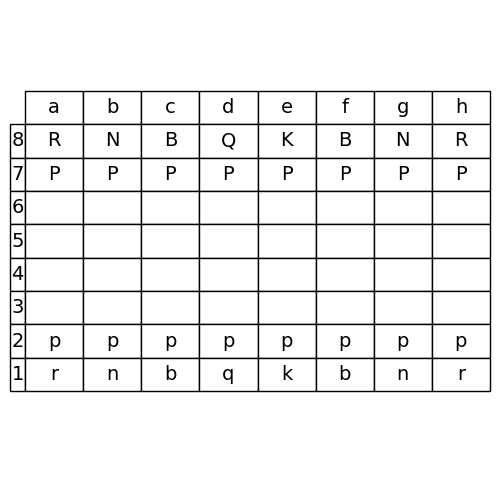

Next of batch 0
Idx 1


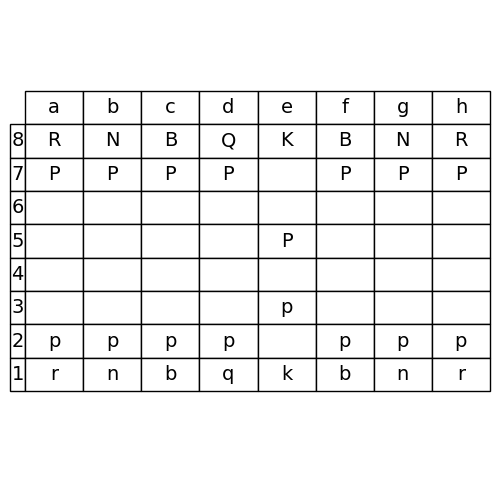

Batch: 1
Idx 2


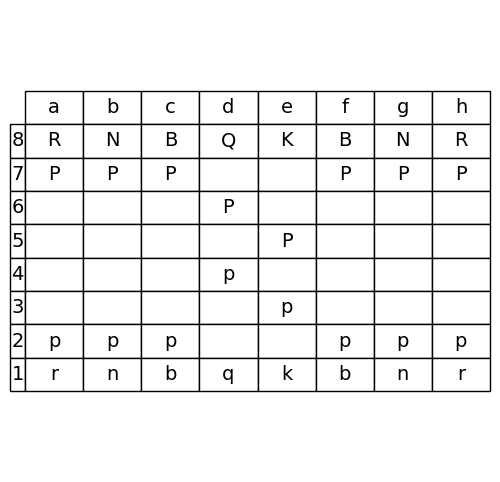

Next of batch 1
Idx 3


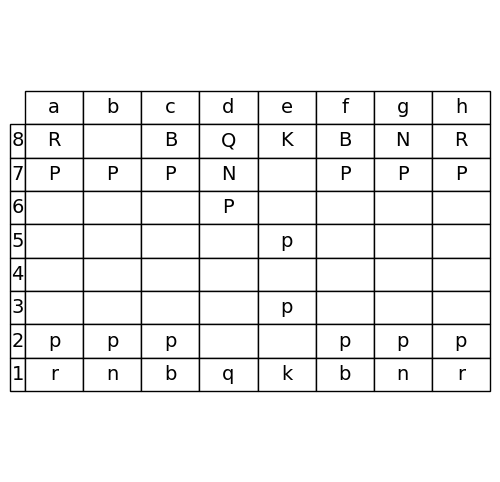

Batch: 2
Idx 4


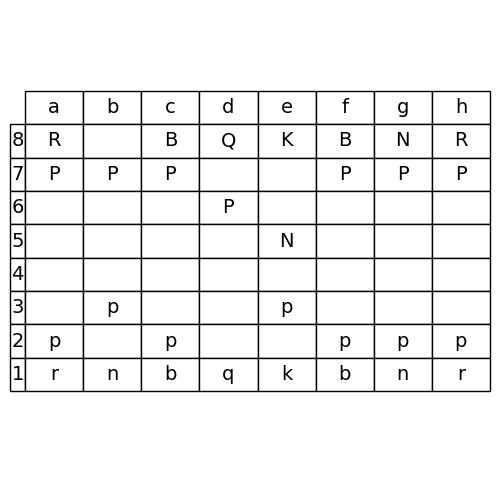

Next of batch 2
Idx 5


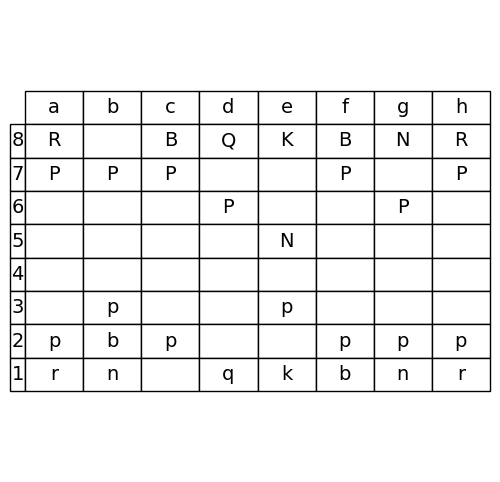

Batch: 3
Idx 6


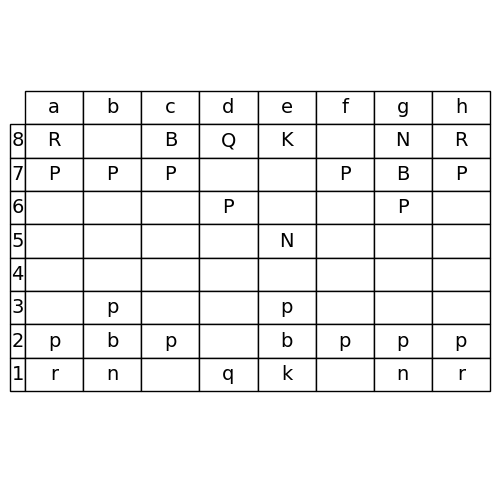

Next of batch 3
Idx 7


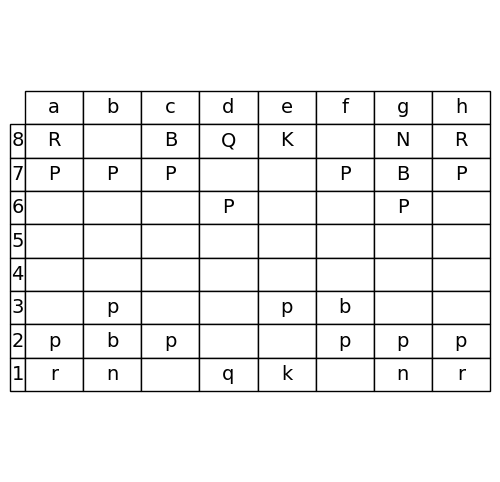

Batch: 4
Idx 8


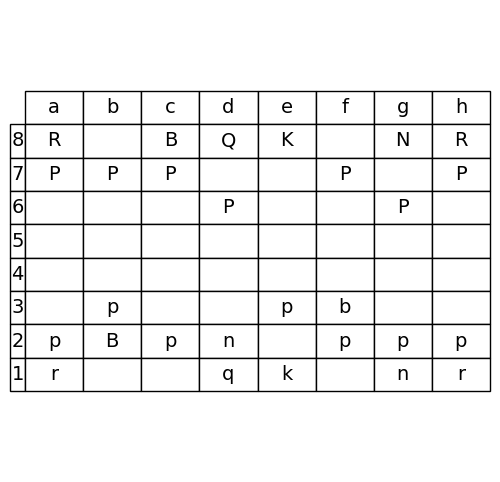

Next of batch 4
Idx 9


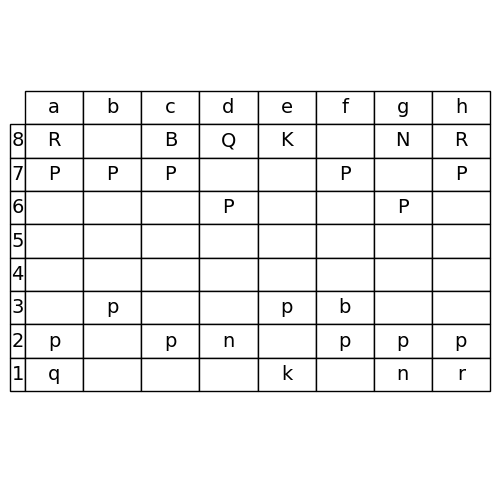

Batch: 5
Idx 10


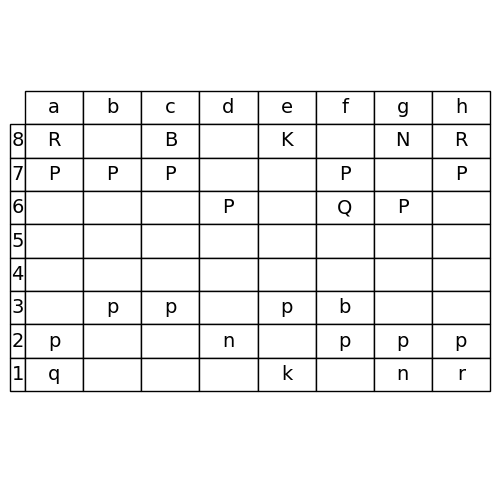

Next of batch 5
Idx 11


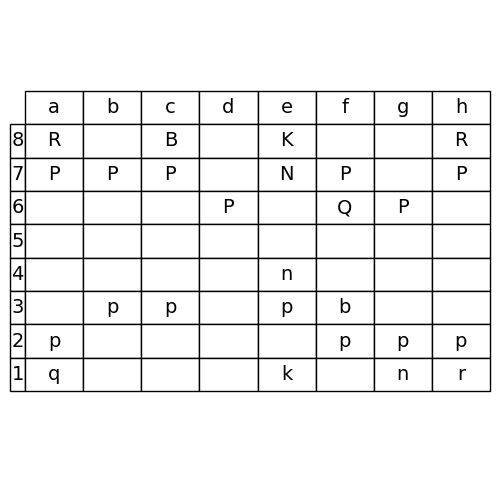

Batch: 6
Idx 12


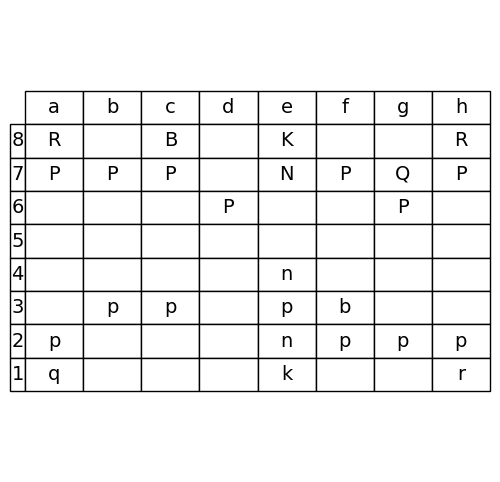

Next of batch 6
Idx 13


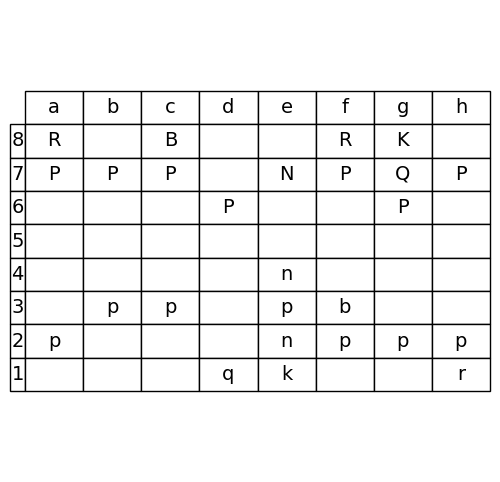

Batch: 7
Idx 14


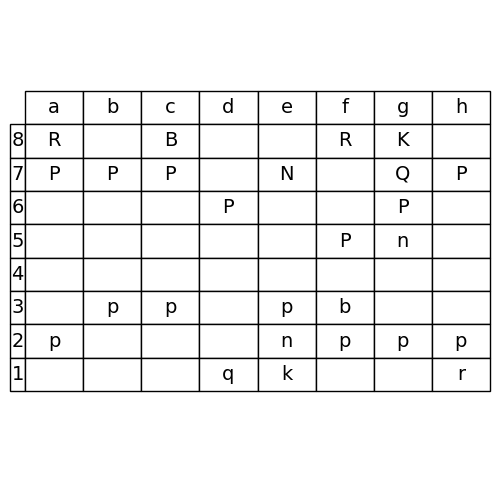

Next of batch 7
Idx 15


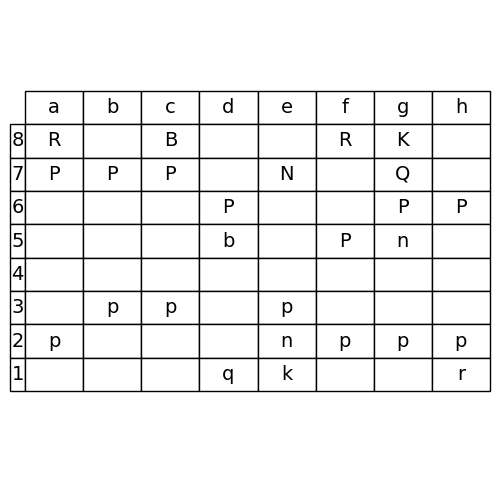

Batch: 8
Idx 16


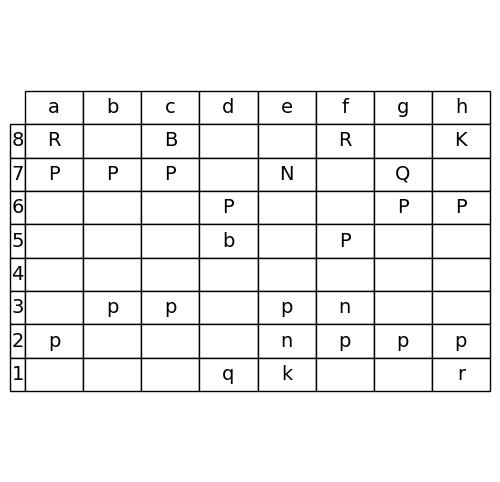

Next of batch 8
Idx 17


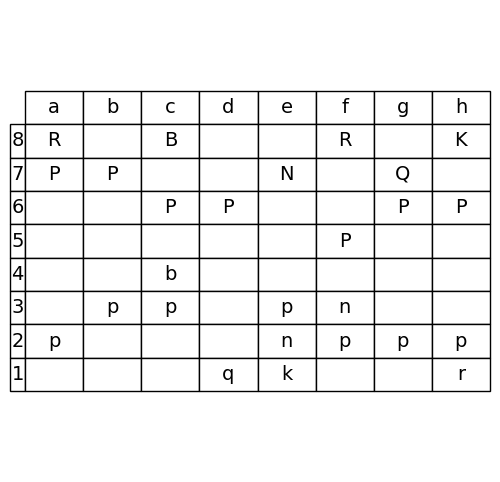

Batch: 9
Idx 18


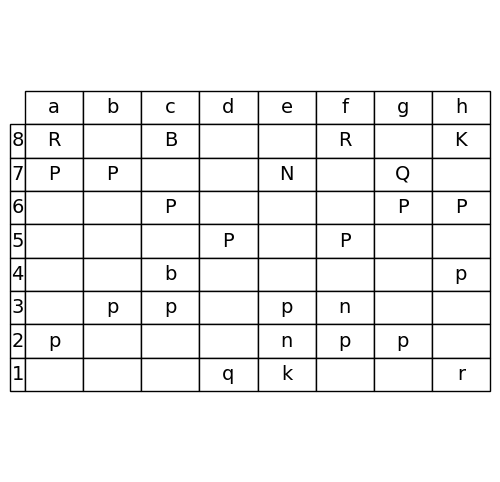

Next of batch 9
Idx 19


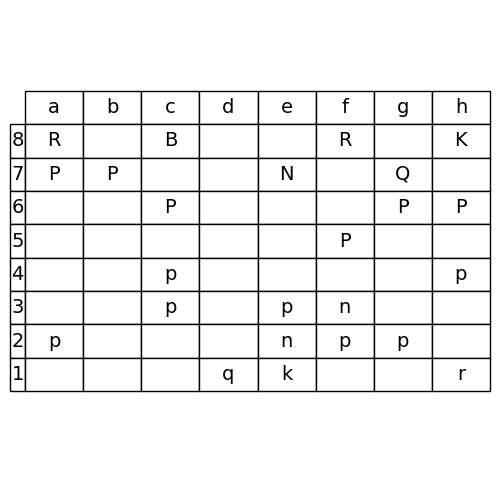

Batch: 10
Idx 20


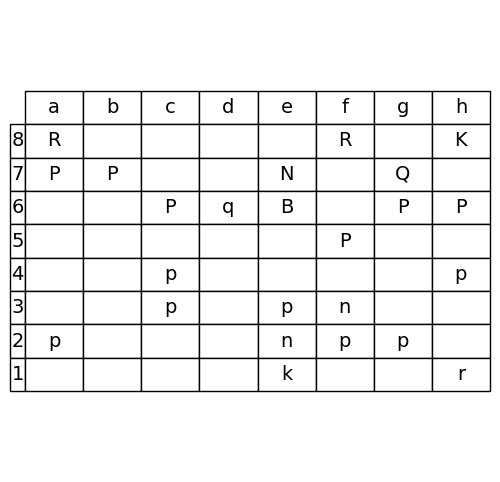

Next of batch 10
Idx 21


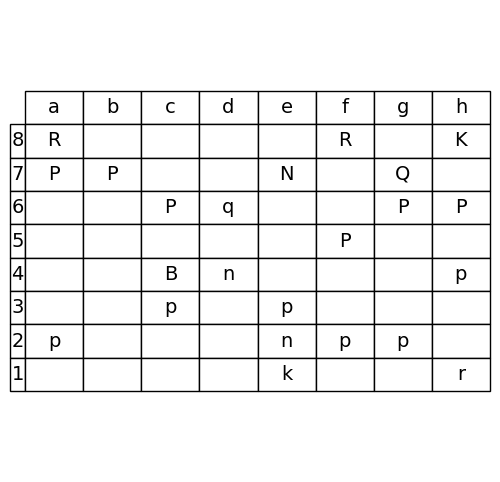

Batch: 11
Idx 22


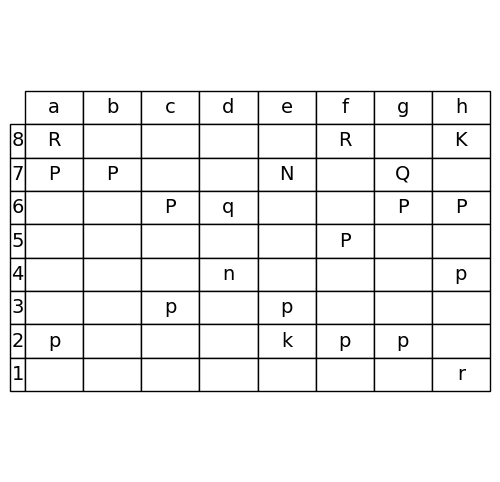

Next of batch 11
Idx 23


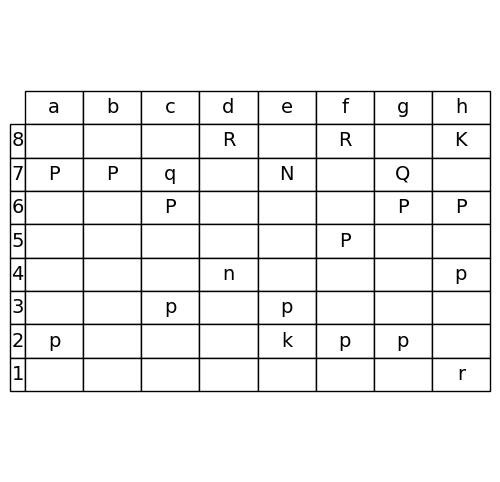

Batch: 12
Idx 24


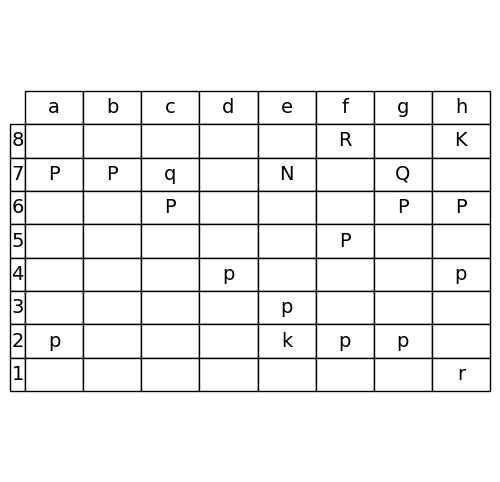

Next of batch 12
Idx 25


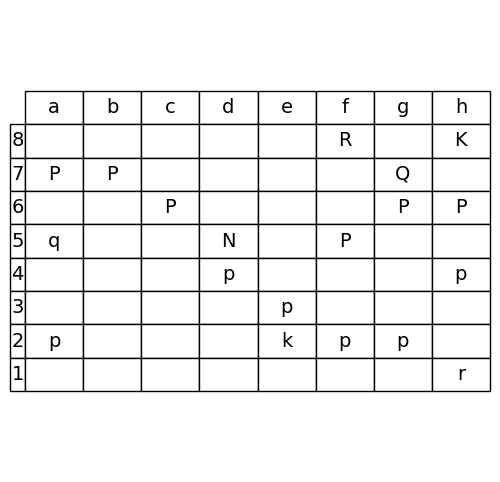

Batch: 13
Idx 26


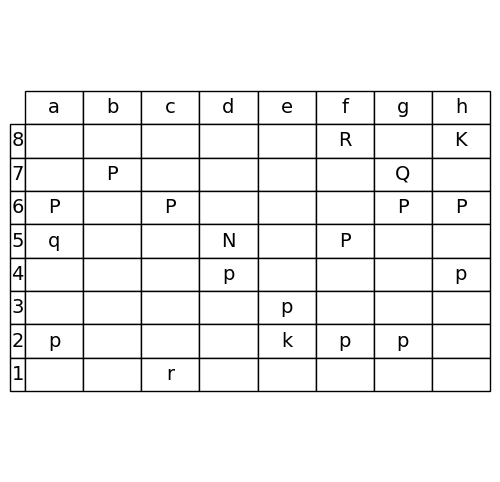

Next of batch 13
Idx 27


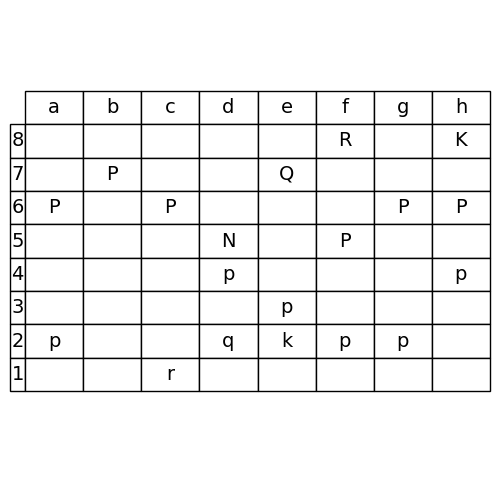

Batch: 14
Idx 28


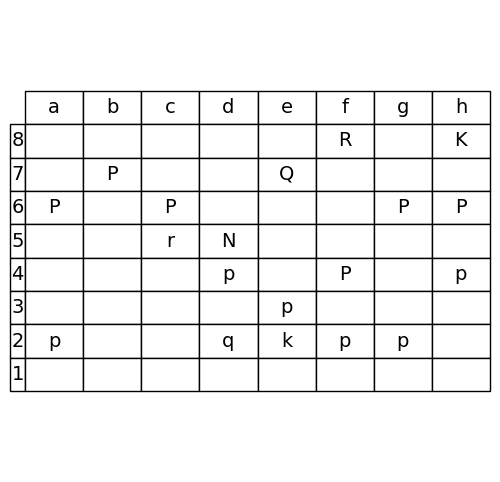

Next of batch 14
Idx 29


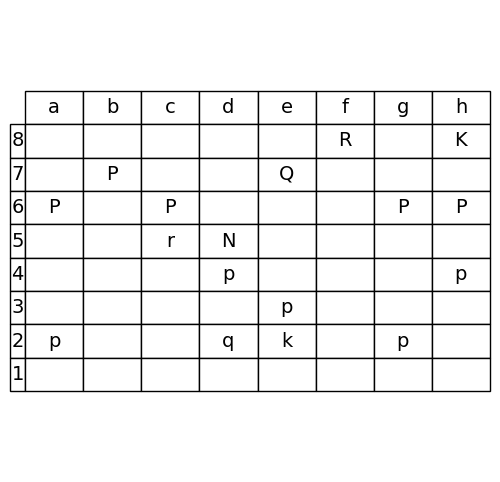

Batch: 15
Idx 30


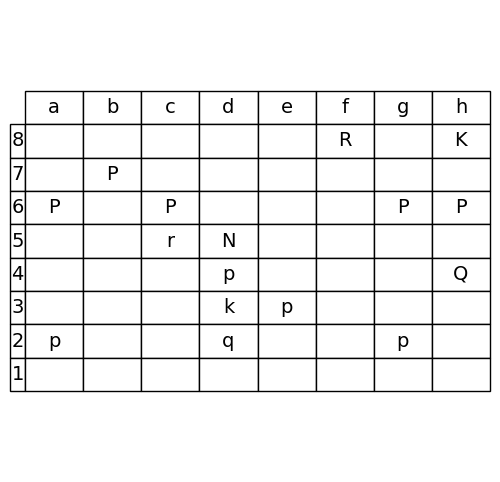

Next of batch 15
Idx 31


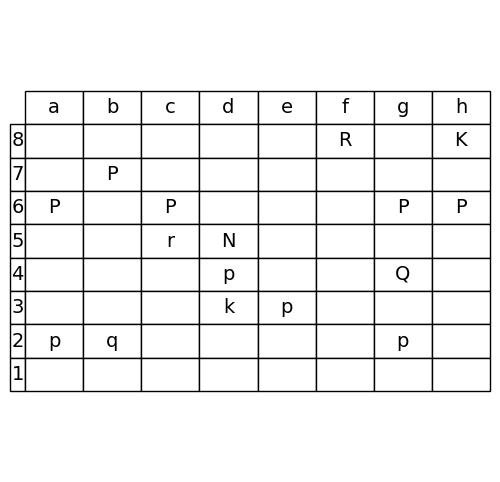

Batch: 16
Idx 32


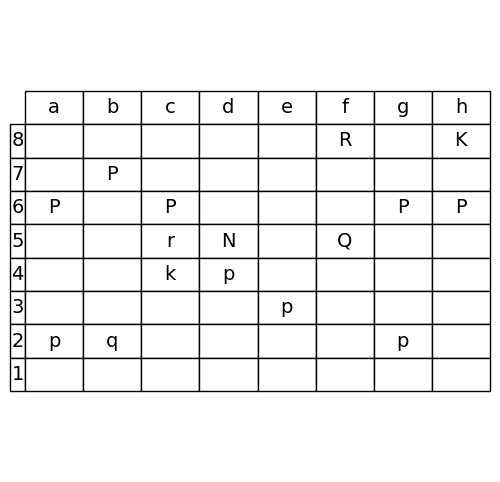

Next of batch 16
Idx 33


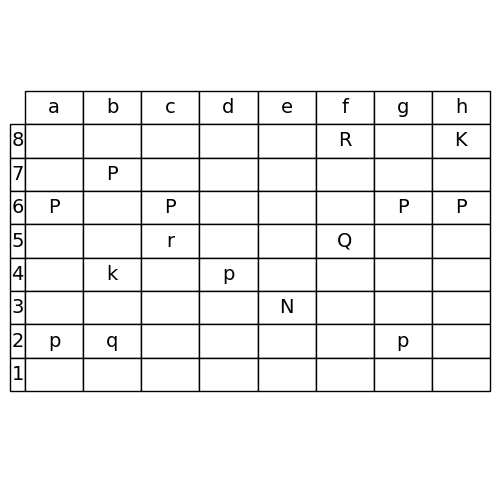

Batch: 17
Idx 34


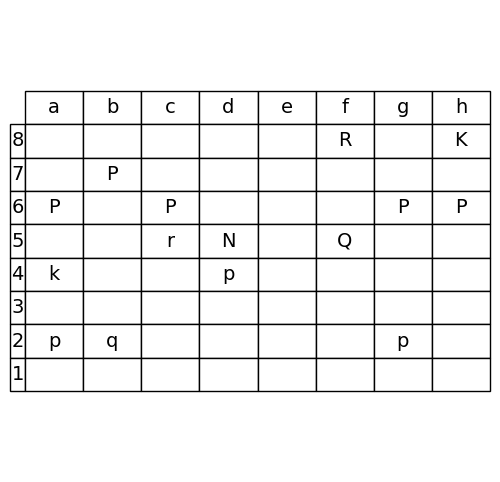

Next of batch 17
Idx 35


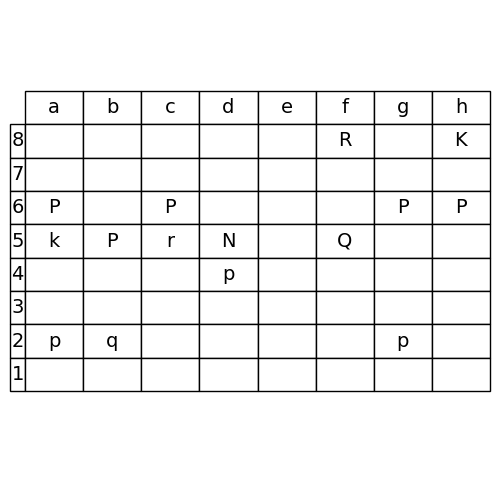

Batch: 18
Idx 36


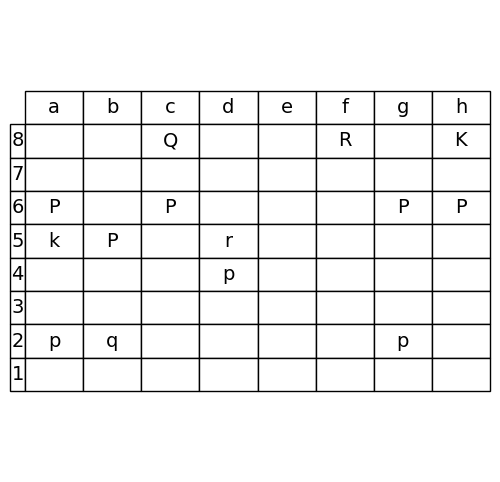

Next of batch 18
Idx 37


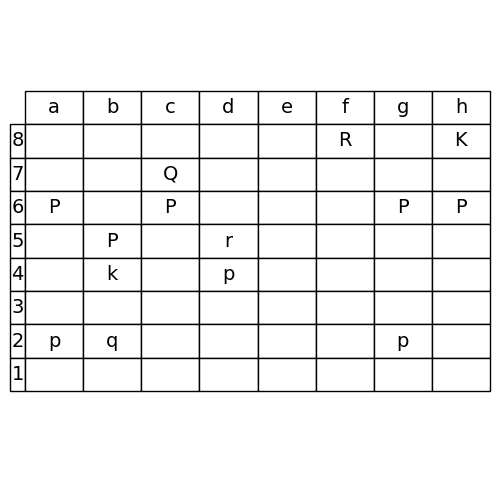

Batch: 19
Idx 38


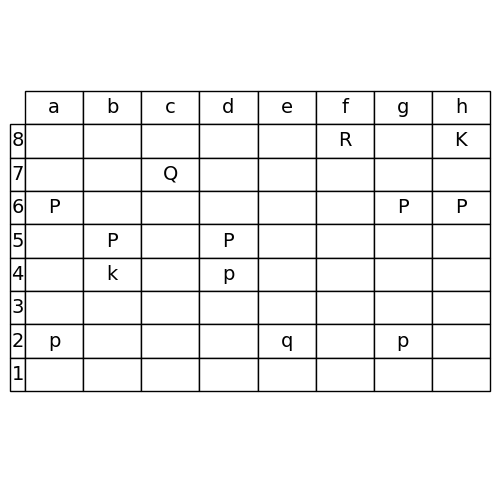

Next of batch 19
Idx 39


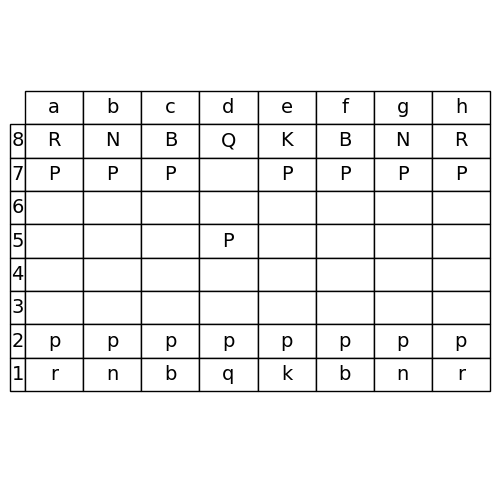

Batch: 20
Idx 40


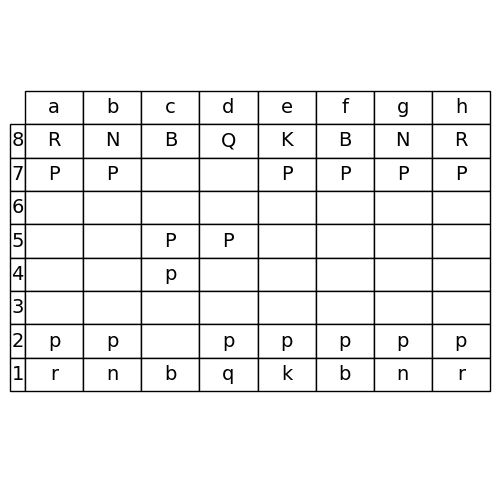

Next of batch 20
Idx 41


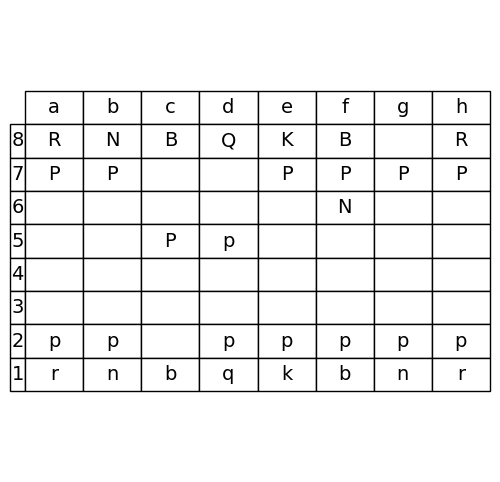

Batch: 21
Idx 42


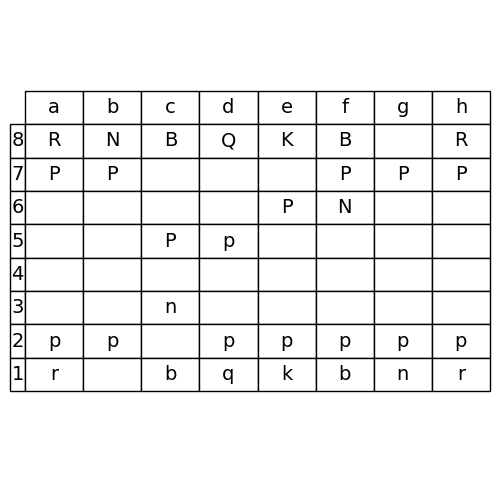

Next of batch 21
Idx 43


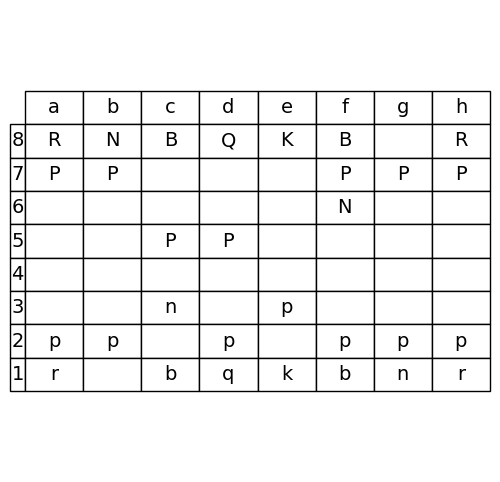

Batch: 22
Idx 44


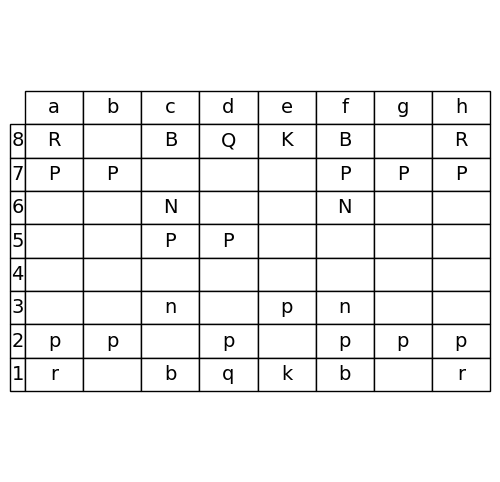

Next of batch 22
Idx 45


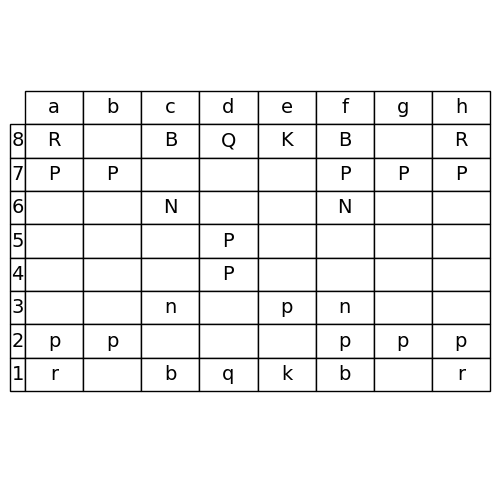

Batch: 23
Idx 46


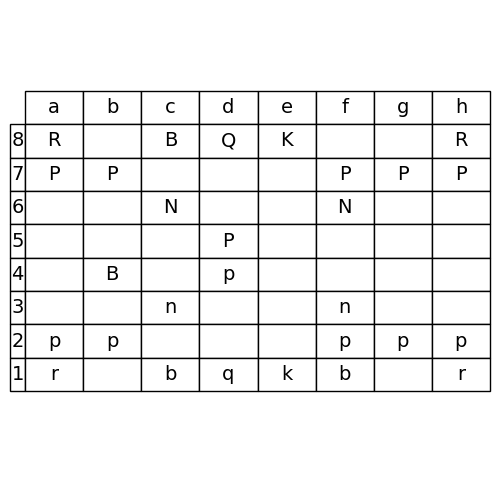

Next of batch 23
Idx 47


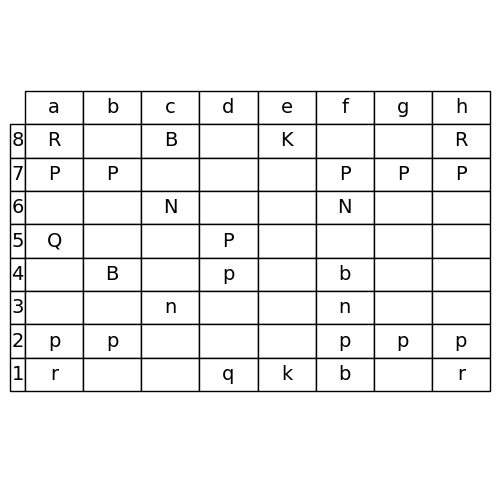

Batch: 24
Idx 48


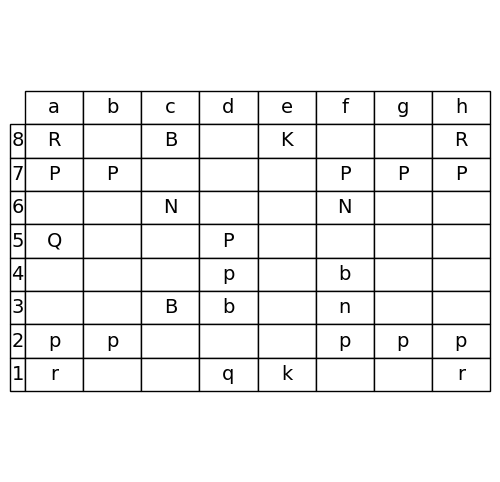

Next of batch 24
Idx 49


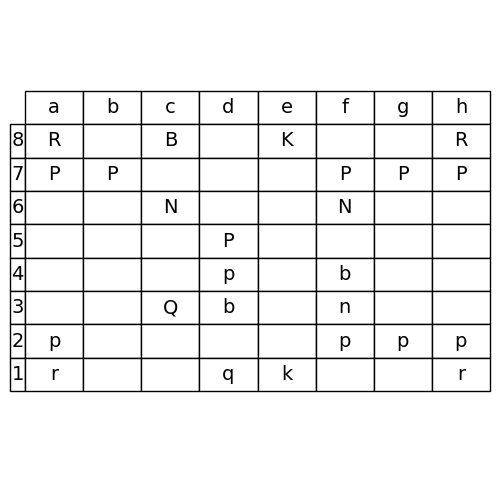

Batch: 25
Idx 50


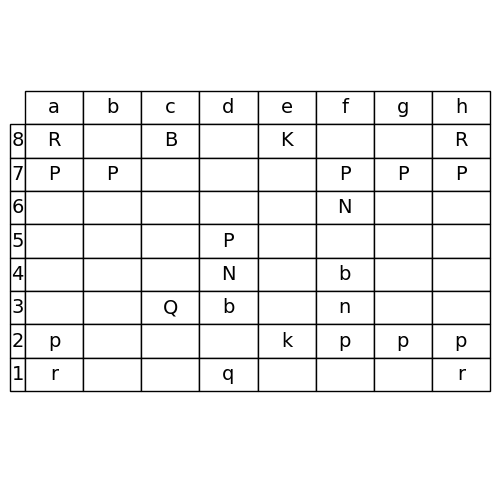

Next of batch 25
Idx 51


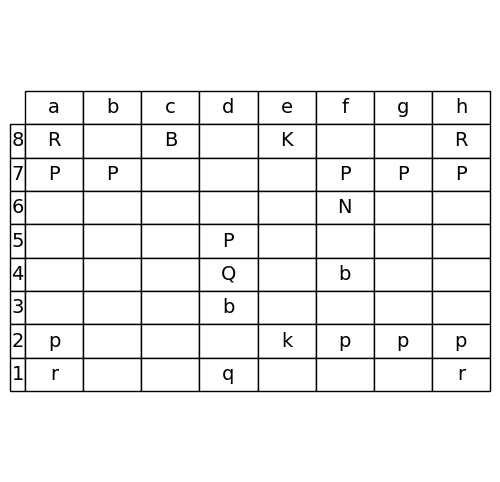

Batch: 26
Idx 52


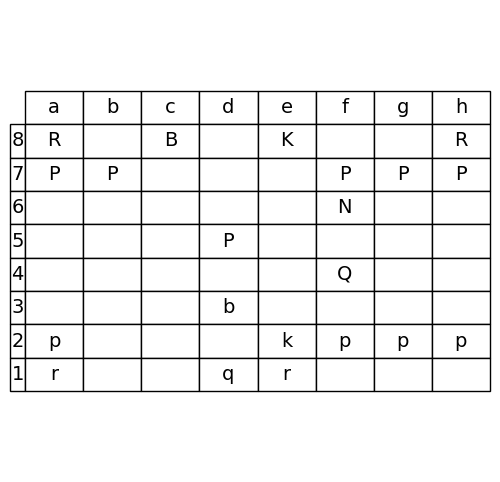

Next of batch 26
Idx 53


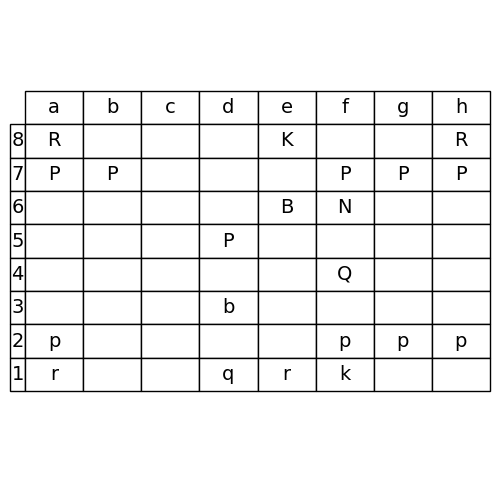

Batch: 27
Idx 54


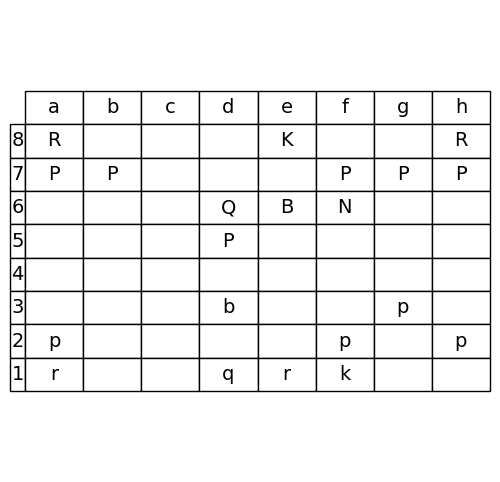

Next of batch 27
Idx 55


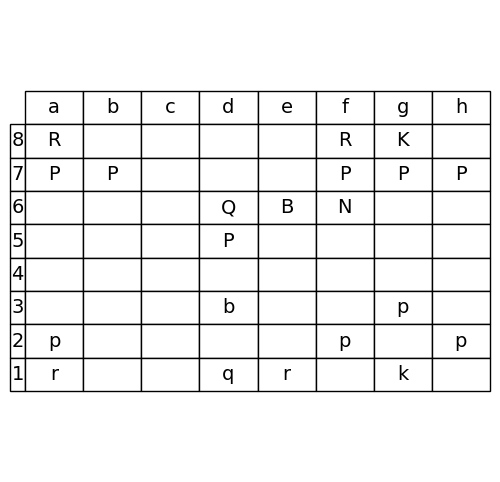

Batch: 28
Idx 56


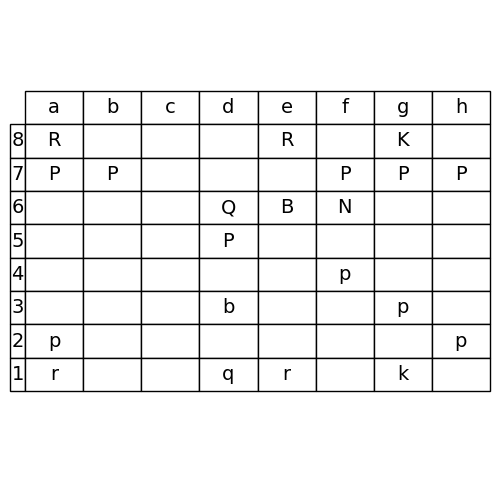

Next of batch 28
Idx 57


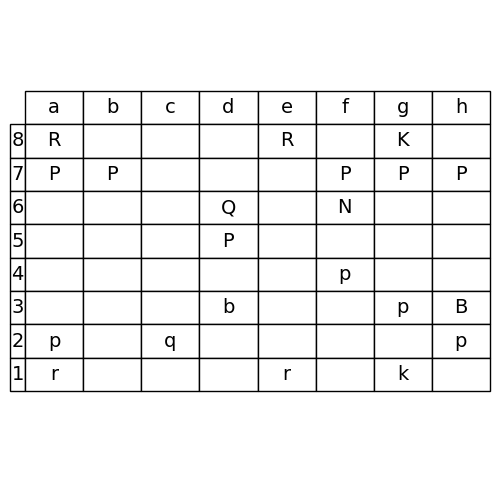

Batch: 29
Idx 58


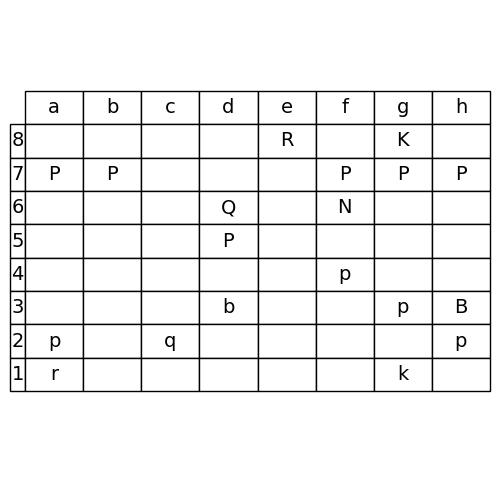

Next of batch 29
Idx 59


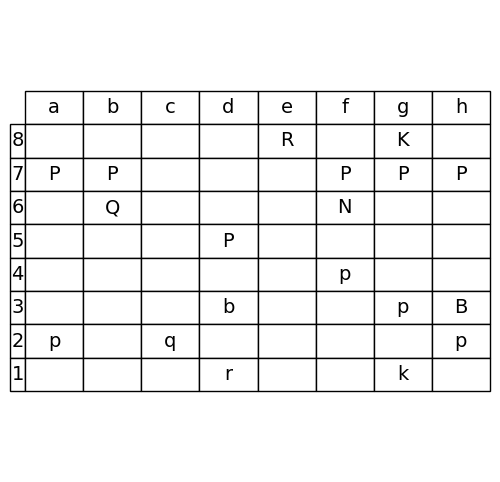

Batch: 30
Idx 60


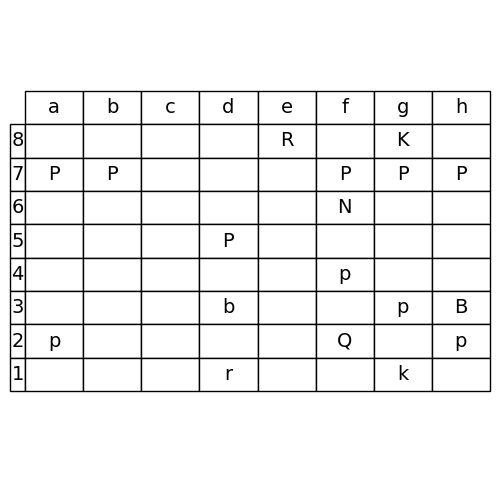

Next of batch 30
Idx 61


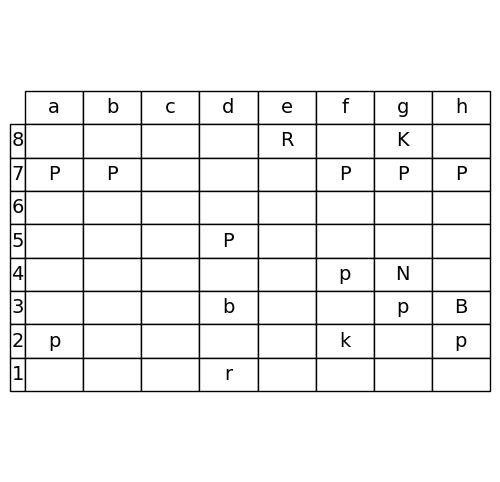

Batch: 31
Idx 62


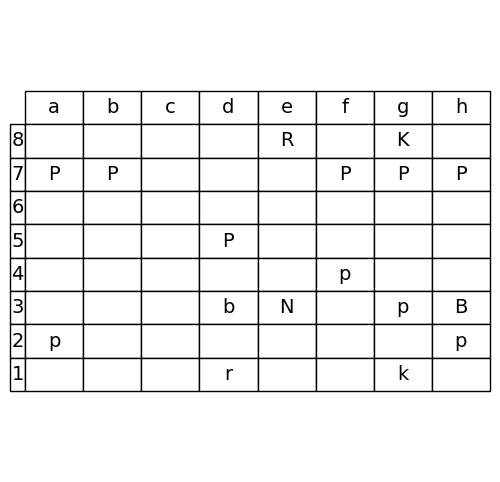

Next of batch 31
Idx 63


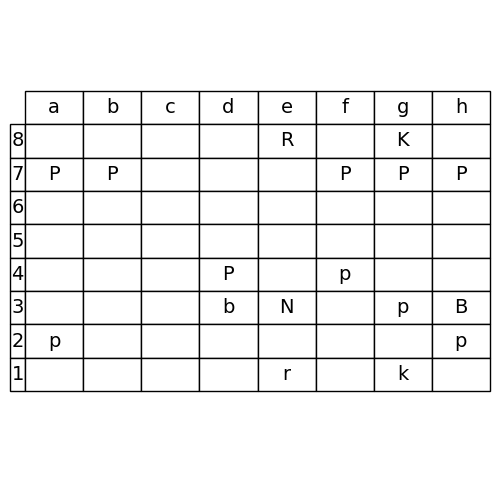

Batch: 32
Idx 64


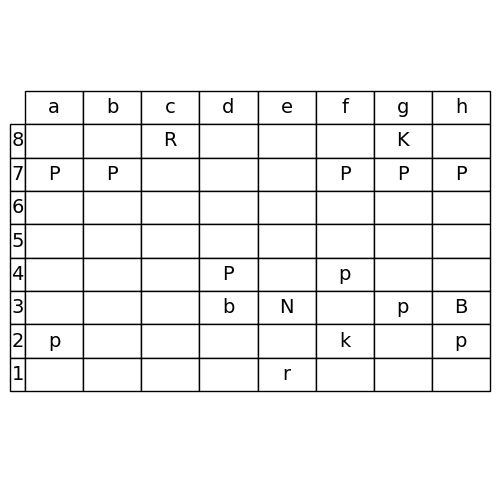

Next of batch 32
Idx 65


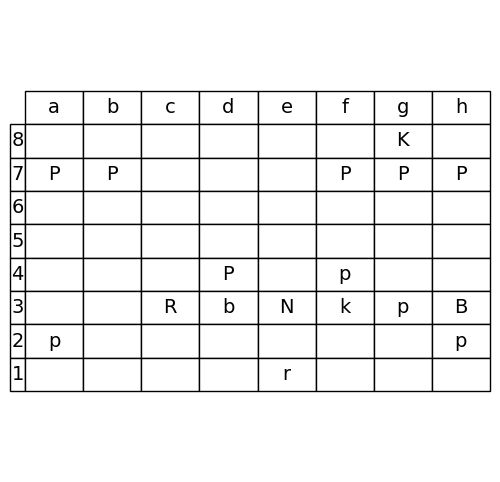

Batch: 33
Idx 66


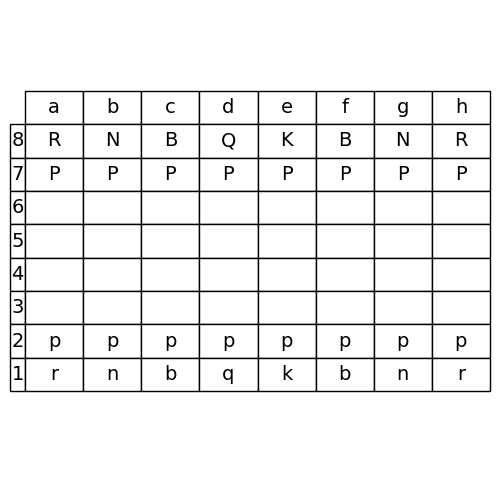

Next of batch 33
Idx 67


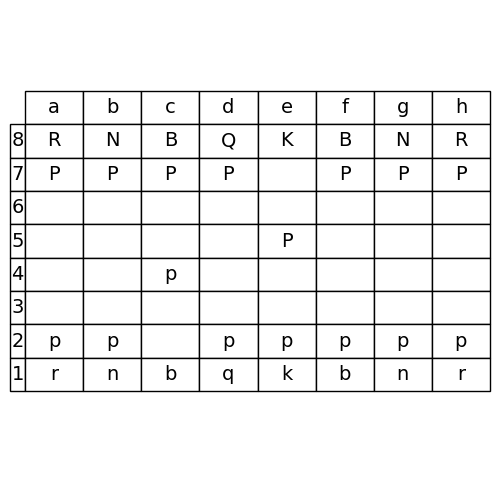

Batch: 34
Idx 68


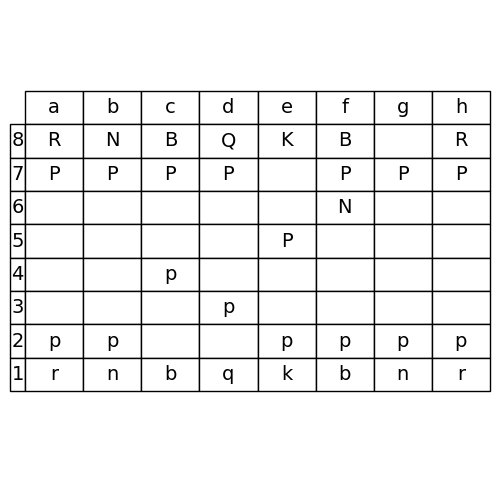

Next of batch 34
Idx 69


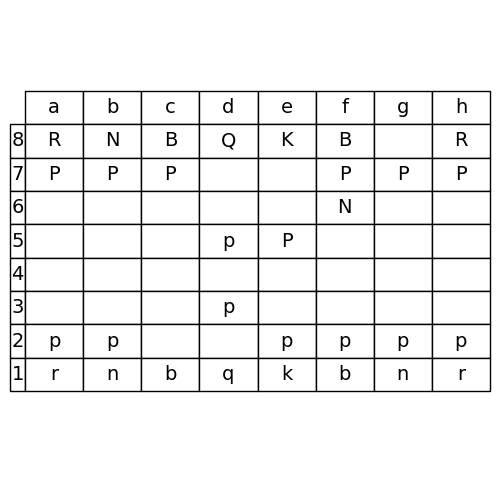

Batch: 35
Idx 70


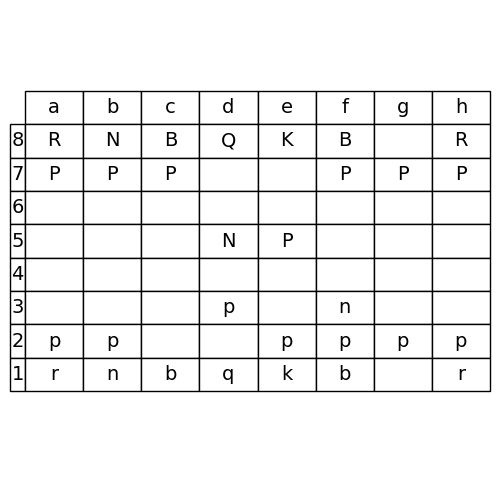

Next of batch 35
Idx 71


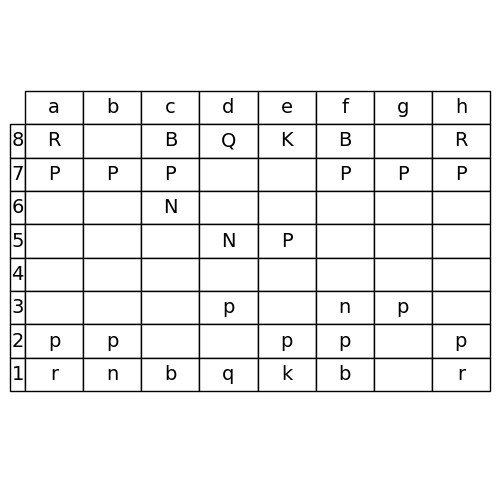

Batch: 36
Idx 72


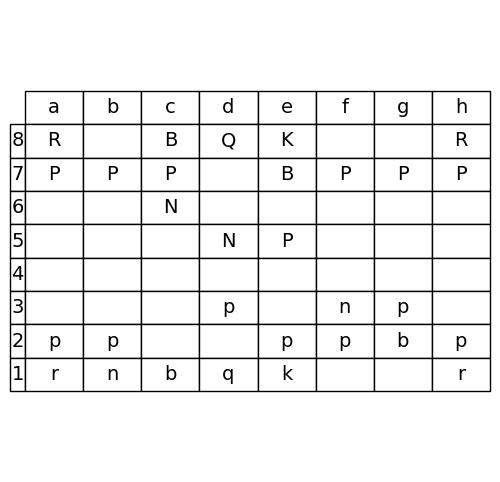

Next of batch 36
Idx 73


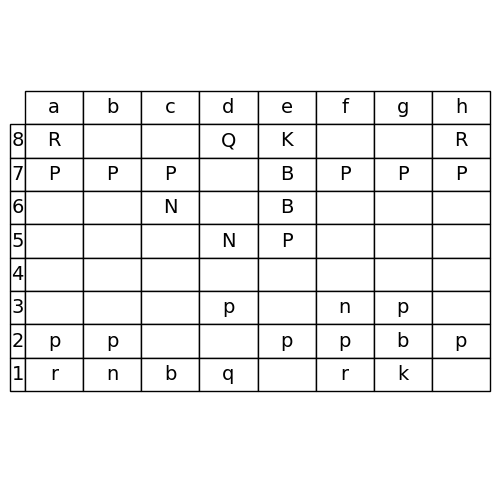

Batch: 37
Idx 74


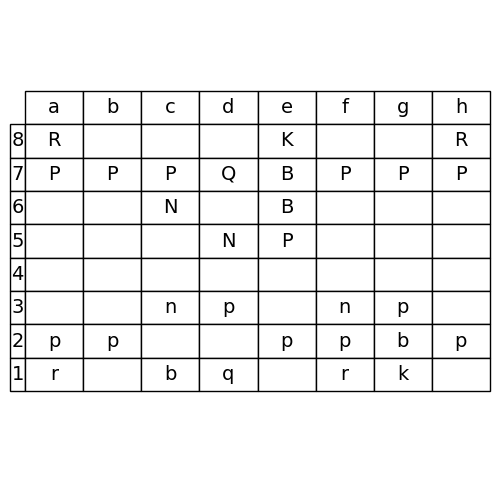

Next of batch 37
Idx 75


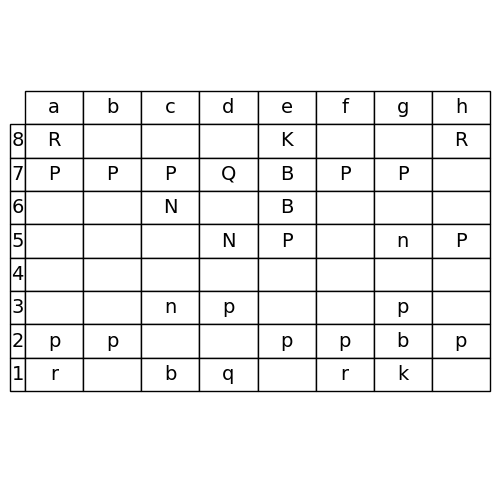

Batch: 38
Idx 76


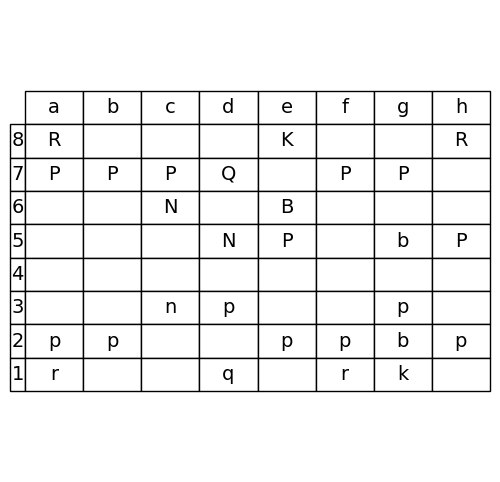

Next of batch 38
Idx 77


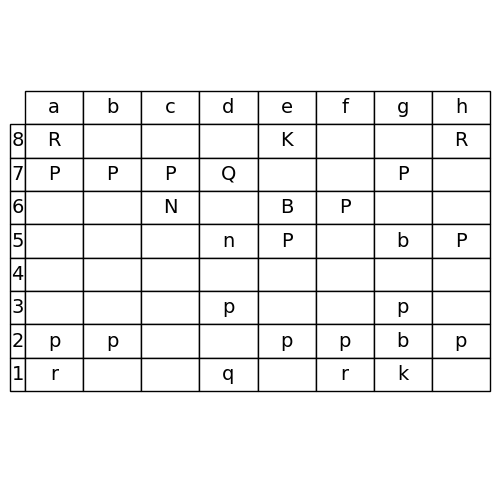

Batch: 39
Idx 78


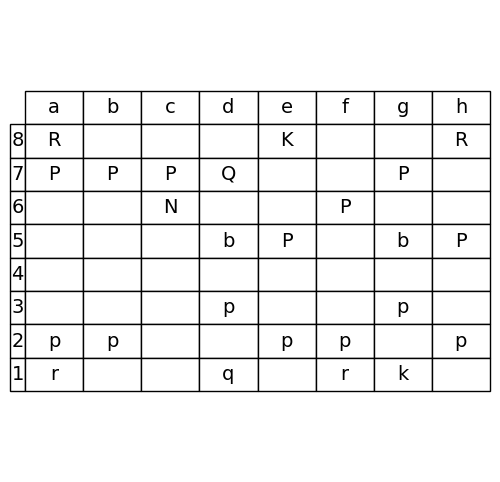

Next of batch 39
Idx 79


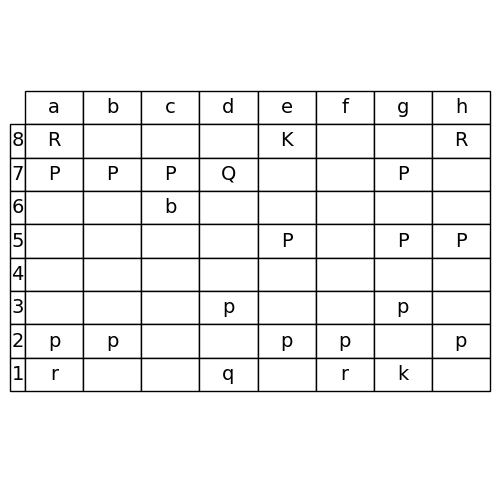

Batch: 40
Idx 80


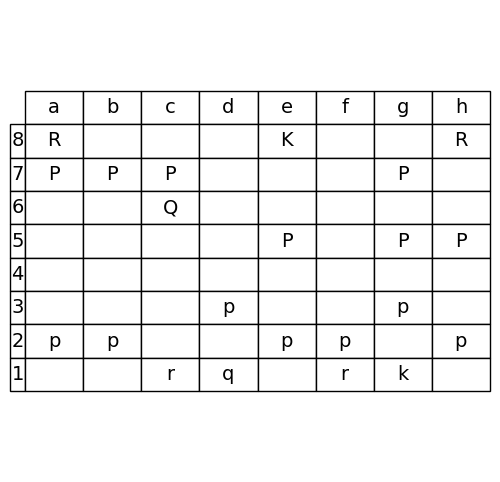

Next of batch 40
Idx 81


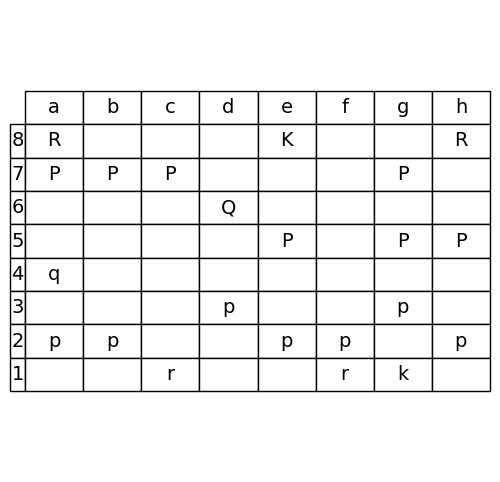

Batch: 41
Idx 82


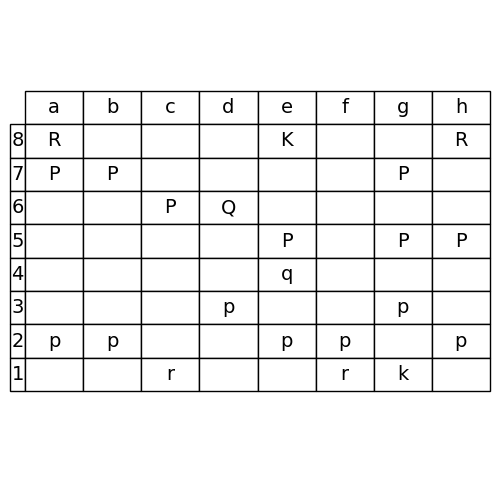

Next of batch 41
Idx 83


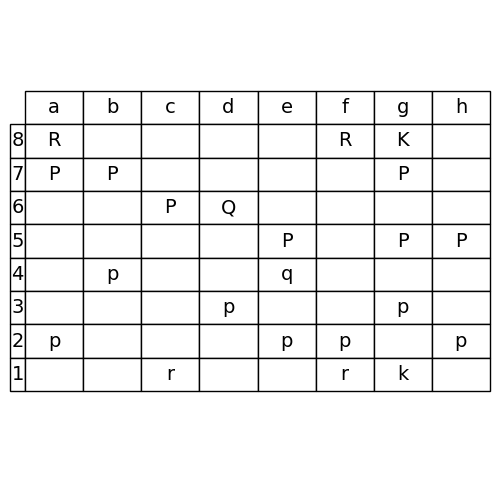

Batch: 42
Idx 84


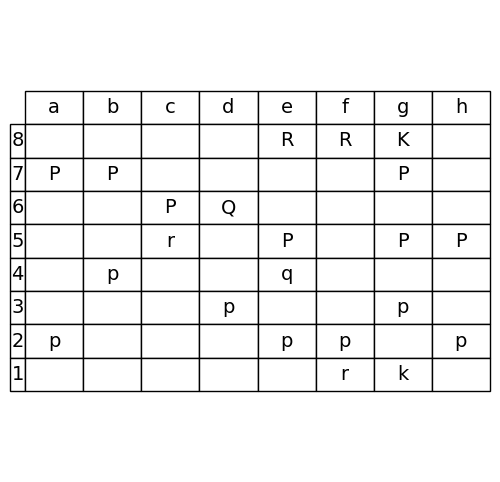

Next of batch 42
Idx 85


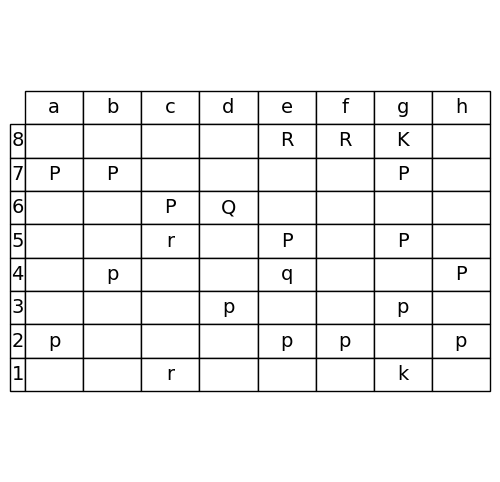

Batch: 43
Idx 86


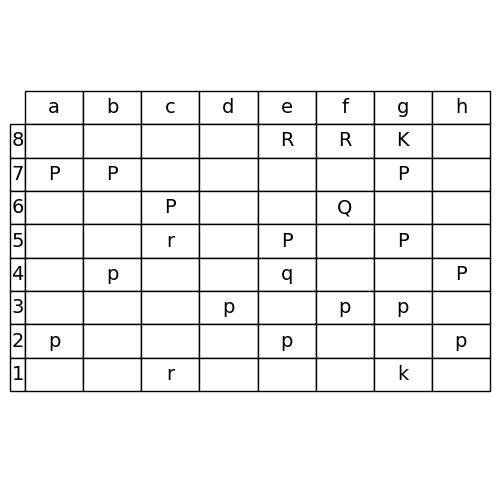

Next of batch 43
Idx 87


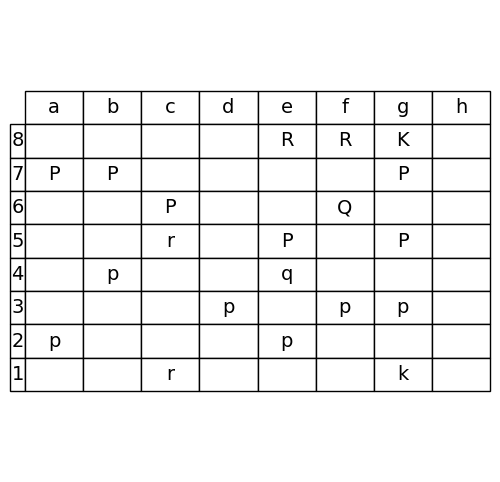

Batch: 44
Idx 88


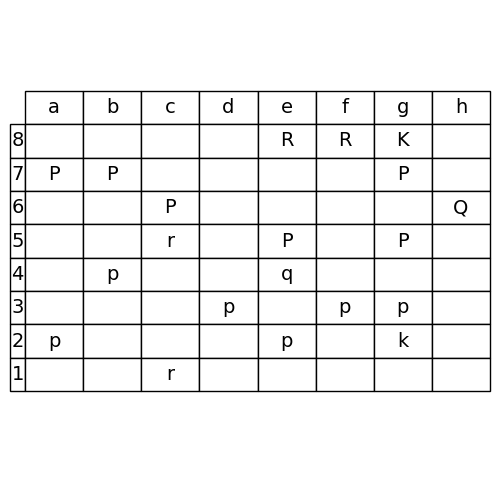

Next of batch 44
Idx 89


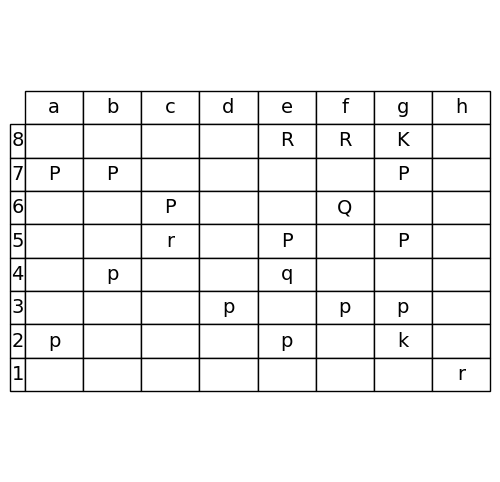

Batch: 45
Idx 90


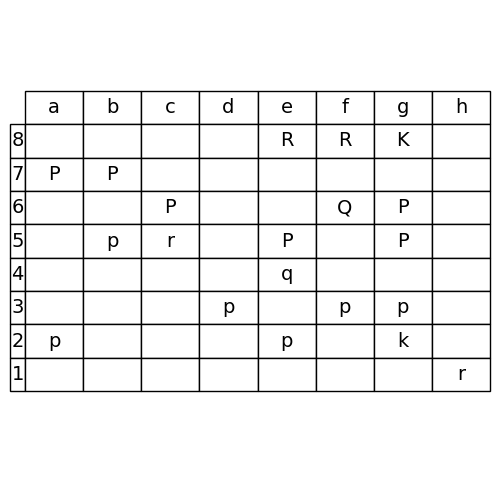

Next of batch 45
Idx 91


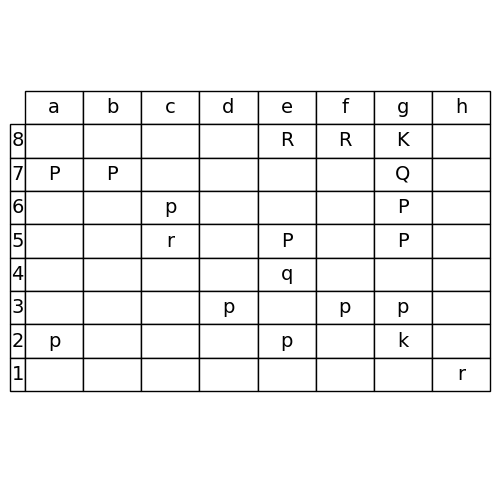

Batch: 46
Idx 92


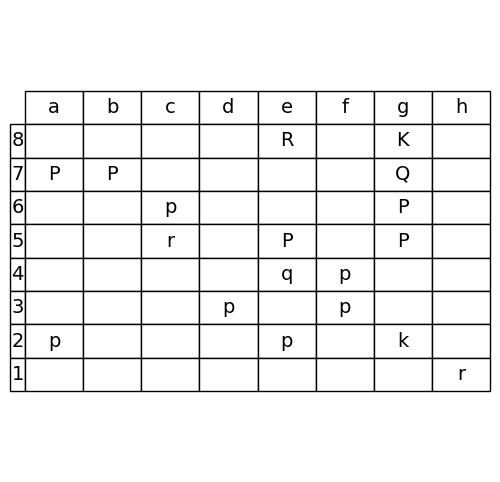

Next of batch 46
Idx 93


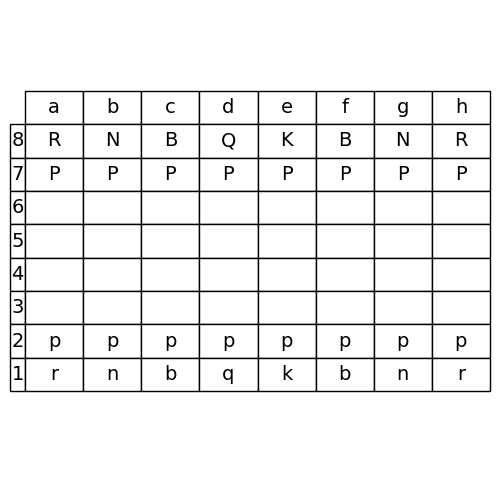

Batch: 47
Idx 94


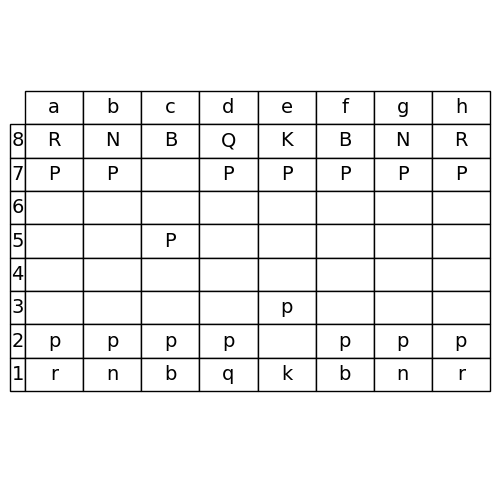

Next of batch 47
Idx 95


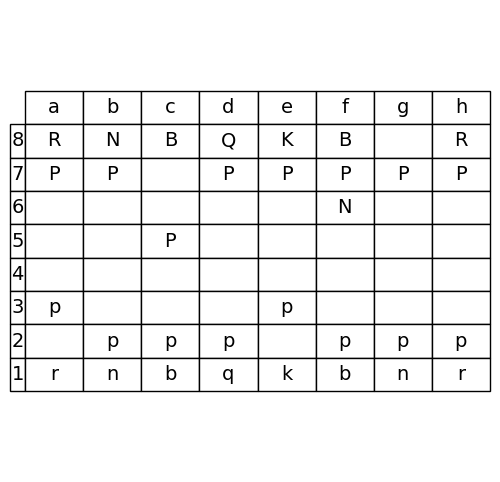

Batch: 48
Idx 96


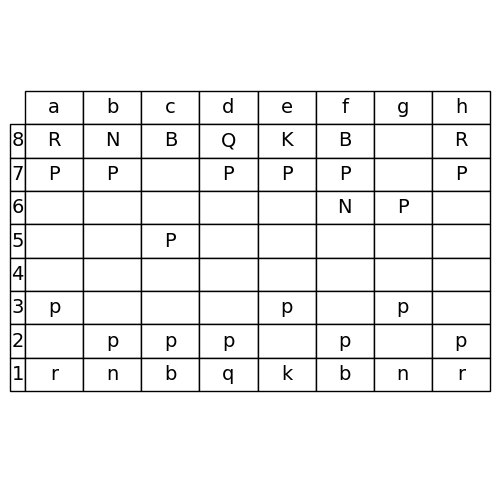

Next of batch 48
Idx 97


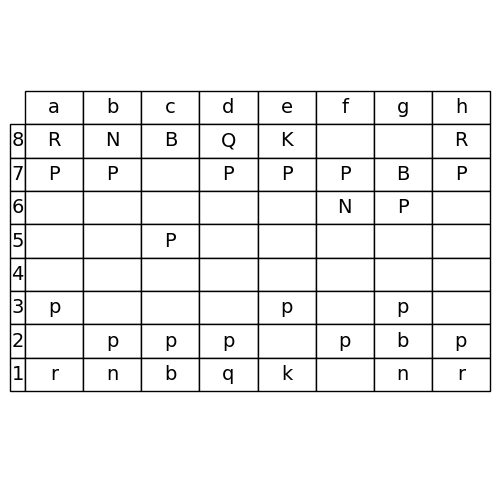

Batch: 49
Idx 98


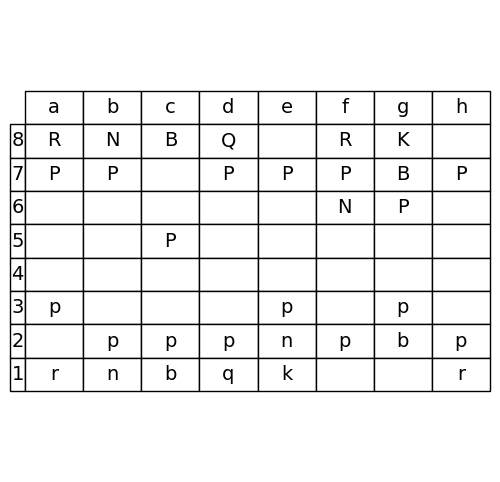

Next of batch 49
Idx 99


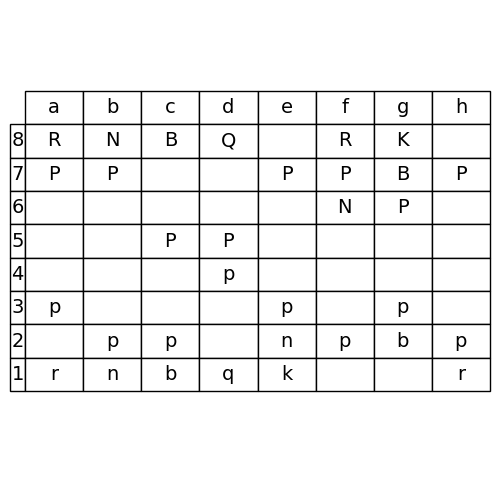

Batch: 50
Idx 100


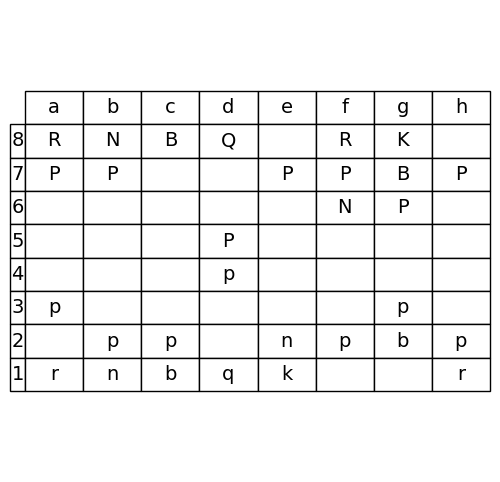

Next of batch 50
Idx 101


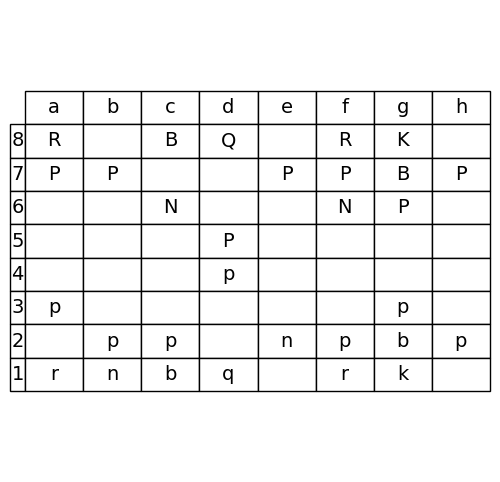

Batch: 51
Idx 102


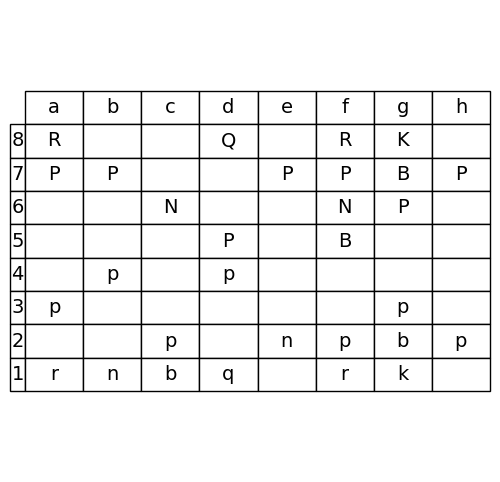

Next of batch 51
Idx 103


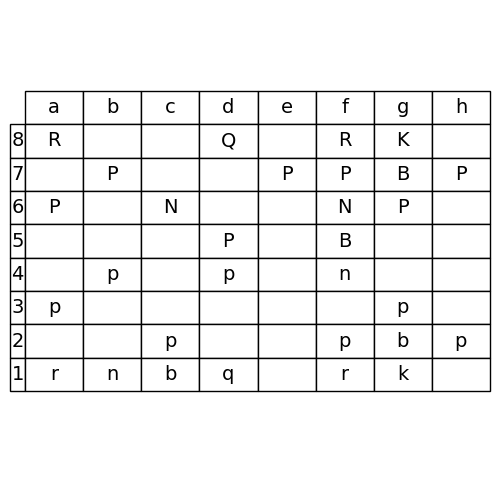

Batch: 52
Idx 104


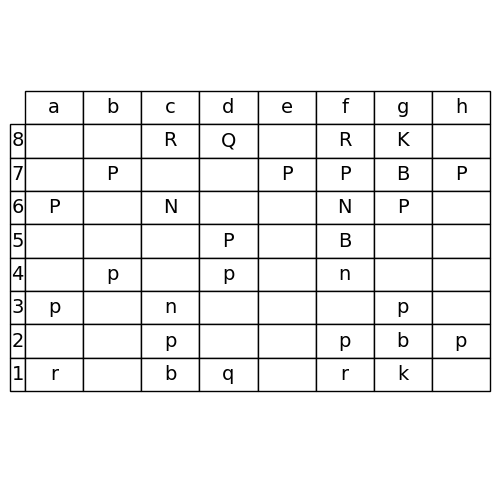

Next of batch 52
Idx 105


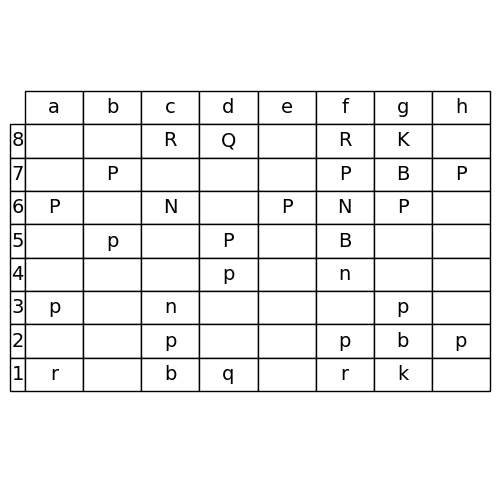

Batch: 53
Idx 106


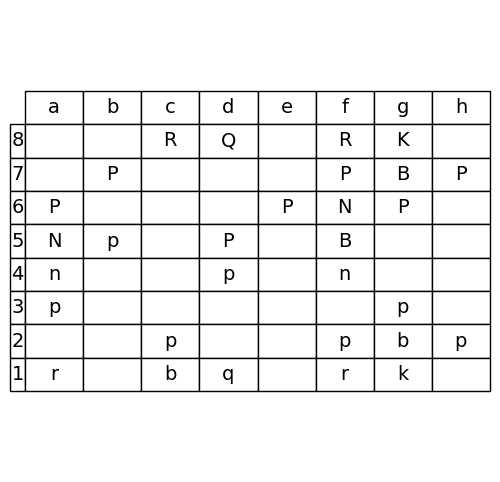

Next of batch 53
Idx 107


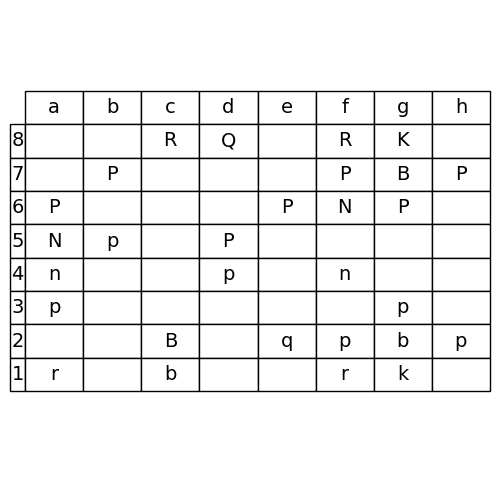

Batch: 54
Idx 108


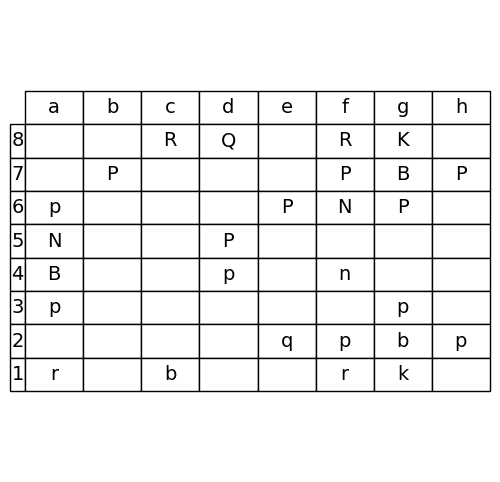

Next of batch 54
Idx 109


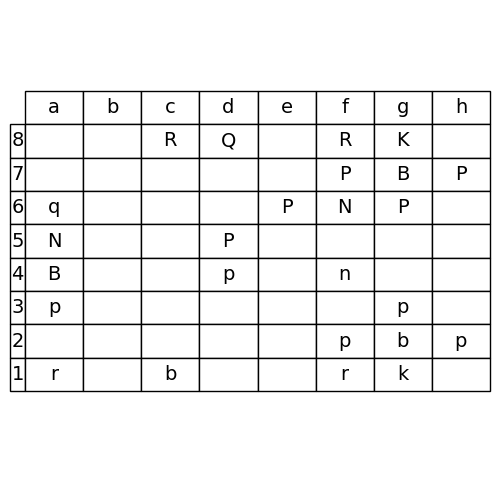

Batch: 55
Idx 110


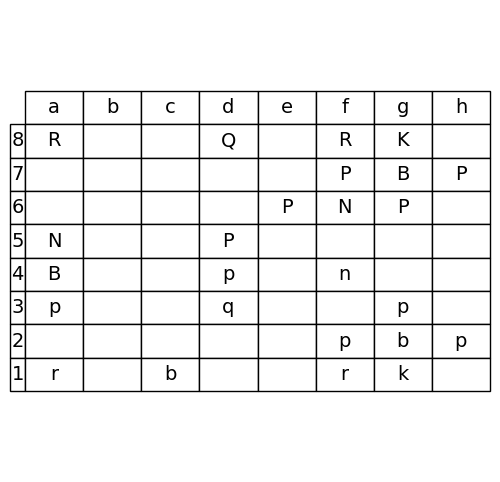

Next of batch 55
Idx 111


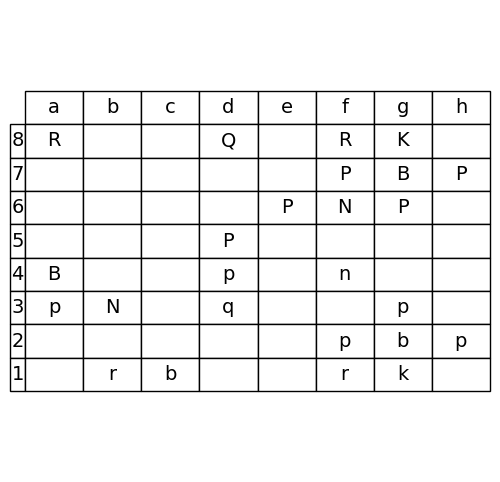

Batch: 56
Idx 112


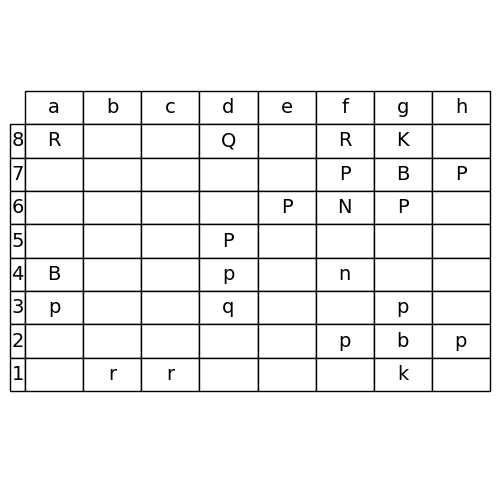

Next of batch 56
Idx 113


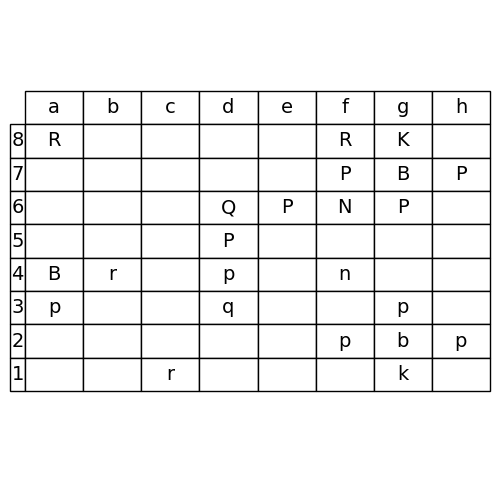

Batch: 57
Idx 114


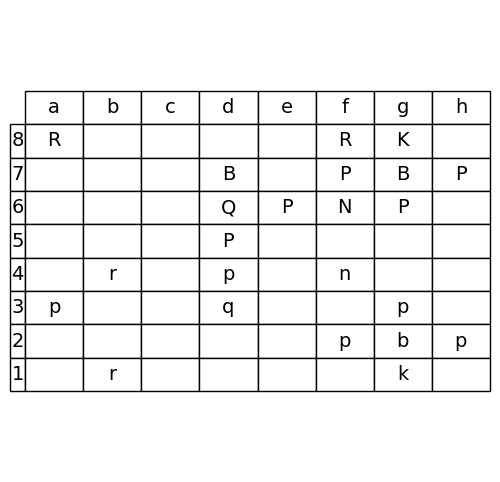

Next of batch 57
Idx 115


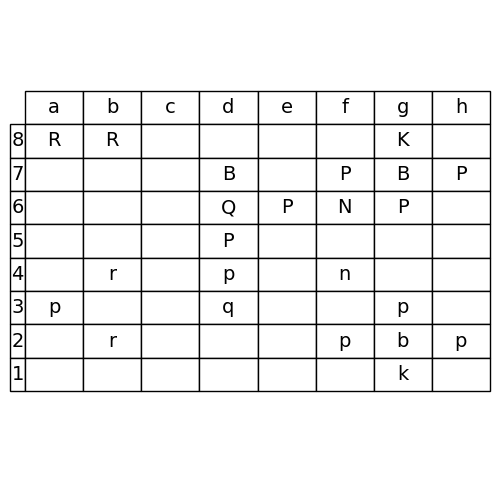

Batch: 58
Idx 116


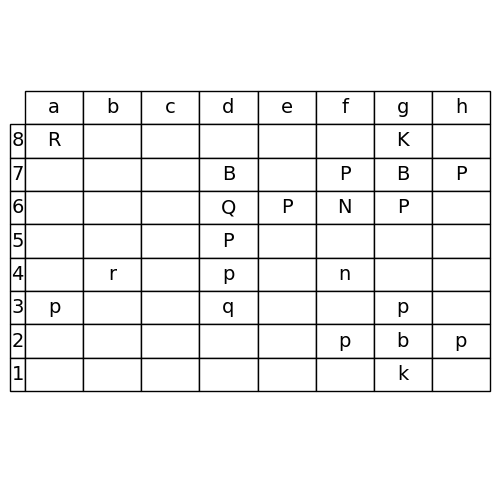

Next of batch 58
Idx 117


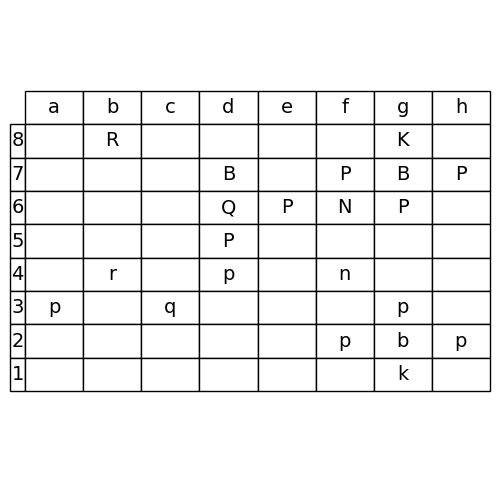

Batch: 59
Idx 118


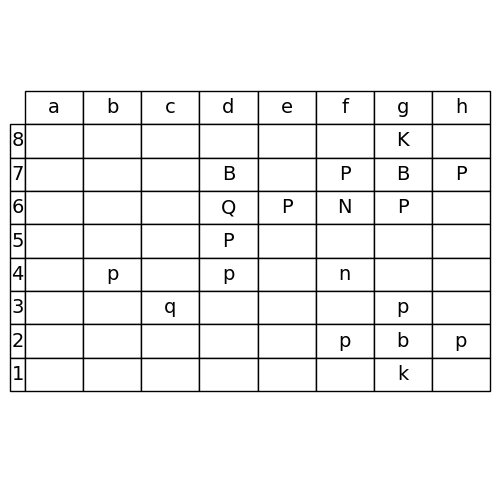

Next of batch 59
Idx 119


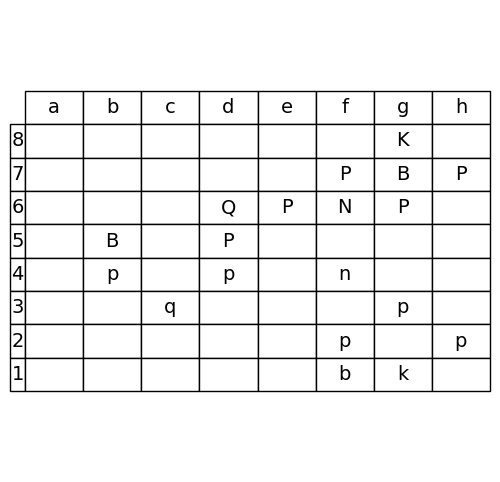

Batch: 60
Idx 120


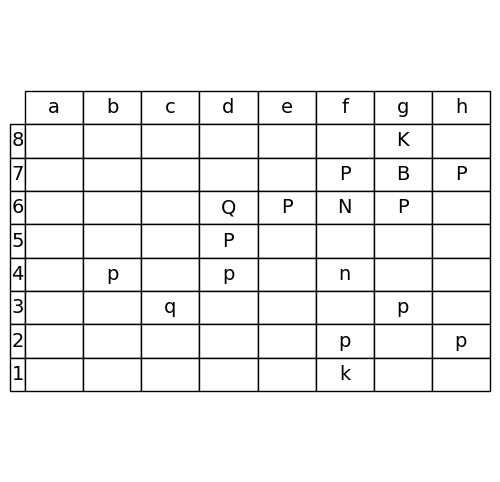

Next of batch 60
Idx 121


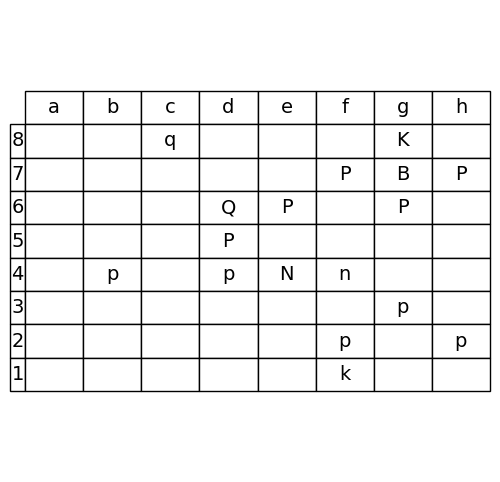

Batch: 61
Idx 122


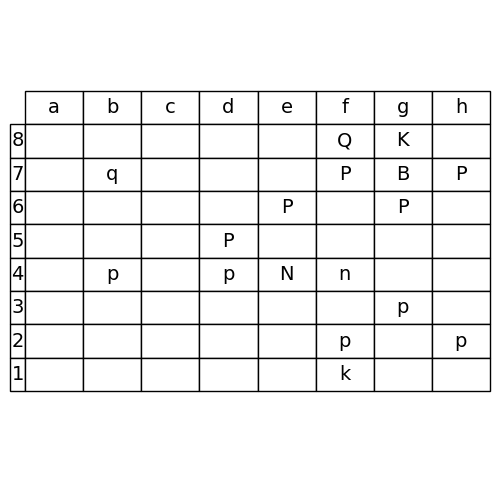

Next of batch 61
Idx 123


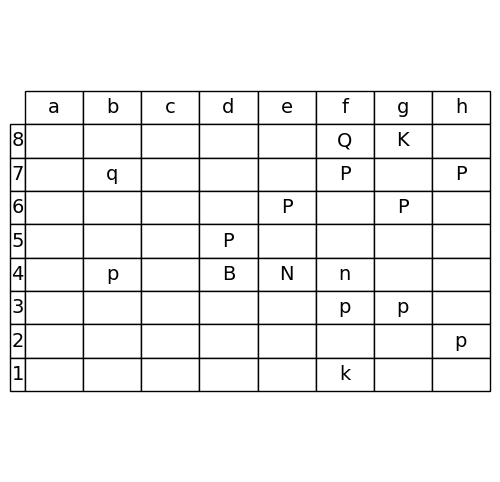

Batch: 62
Idx 124


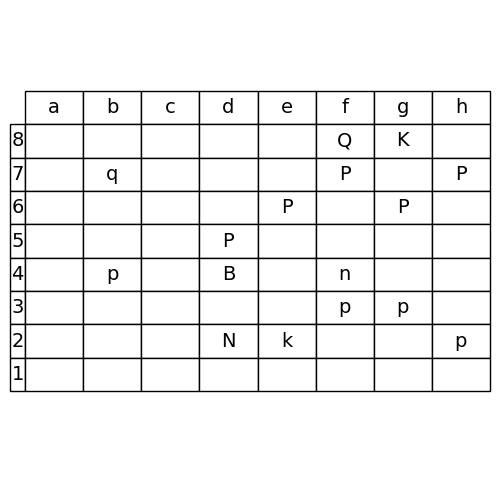

Next of batch 62
Idx 125


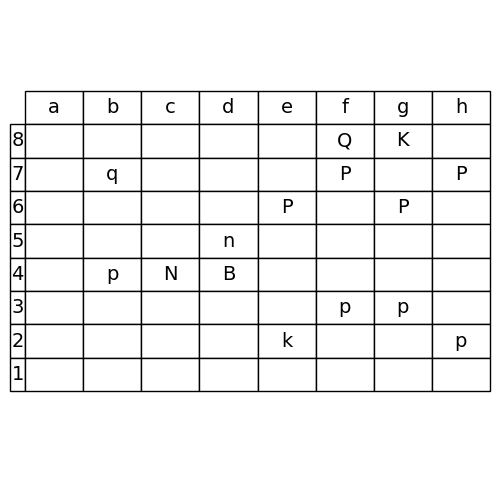

Batch: 63
Idx 126


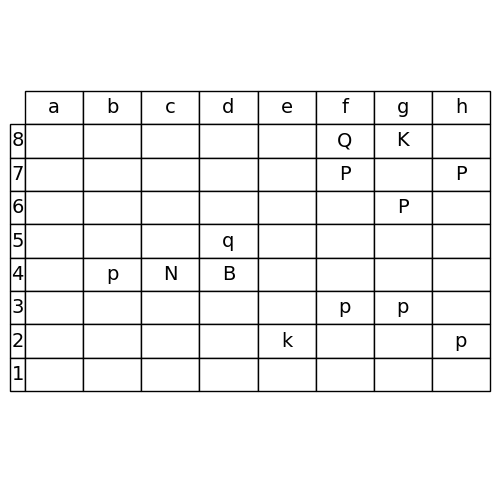

Next of batch 63
Idx 127


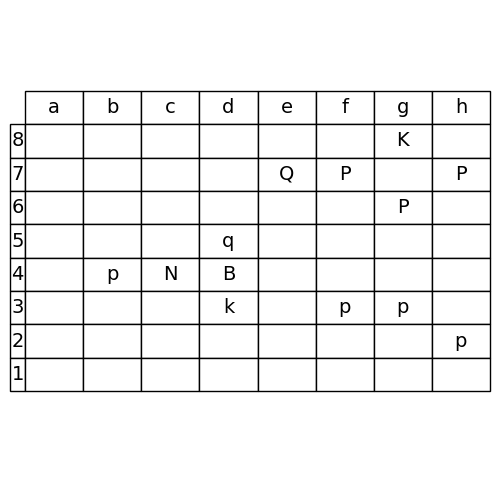

Batch: 64
Idx 128


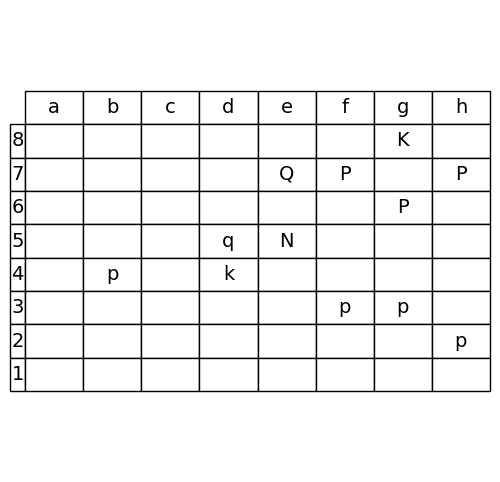

Next of batch 64
Idx 129


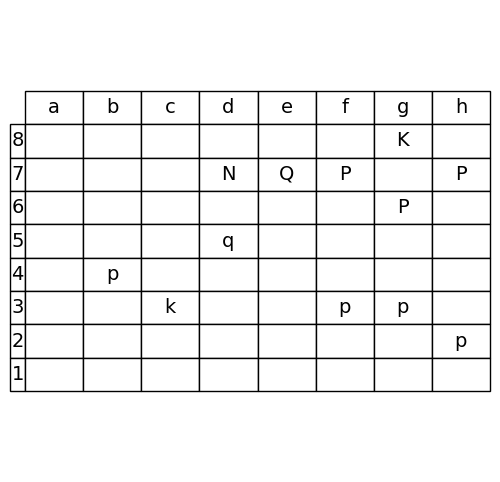

Batch: 65
Idx 130


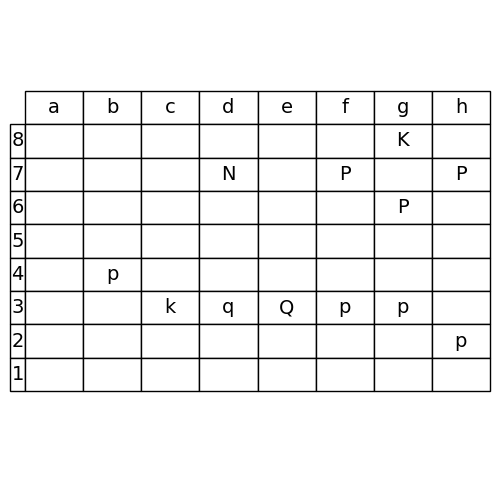

Next of batch 65
Idx 131


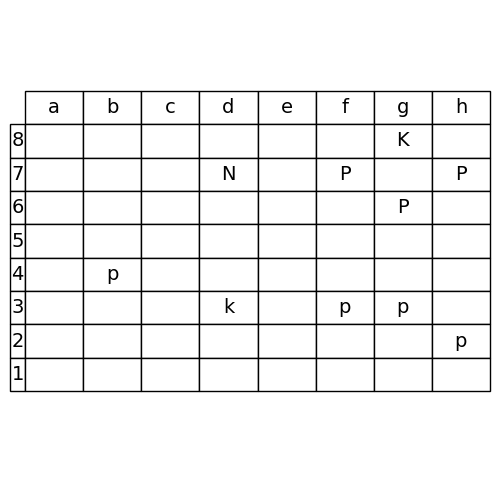

Batch: 66
Idx 132


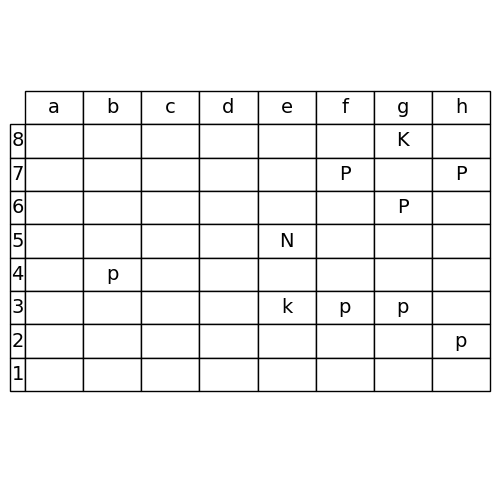

Next of batch 66
Idx 133


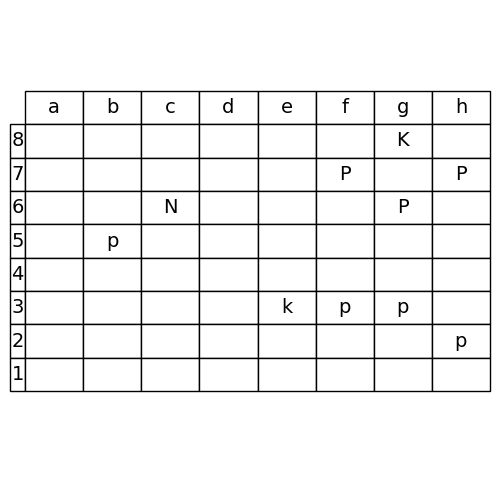

Batch: 67
Idx 134


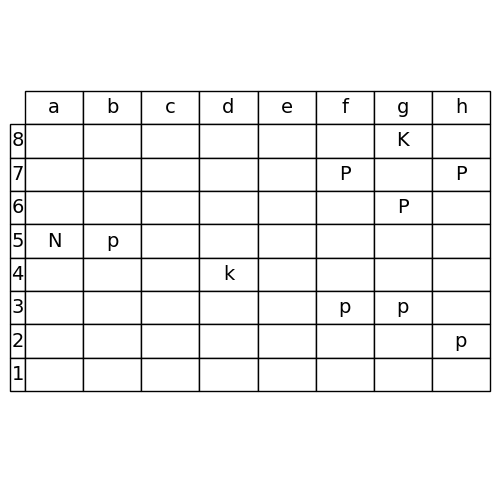

Next of batch 67
Idx 135


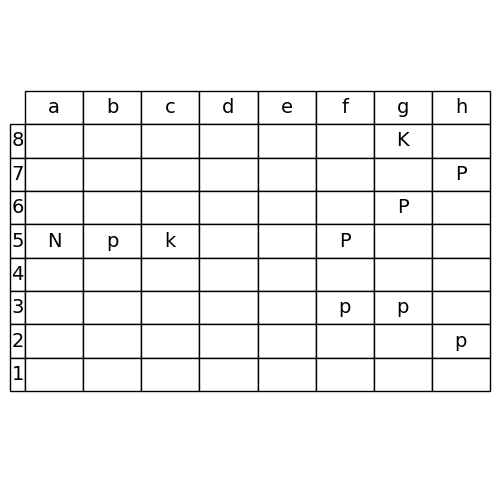

Batch: 68
Idx 136


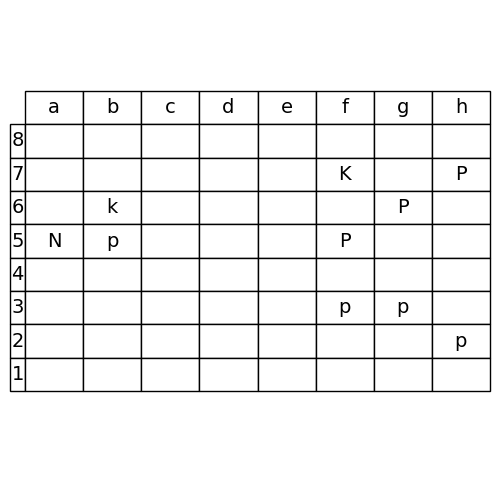

Next of batch 68
Idx 137


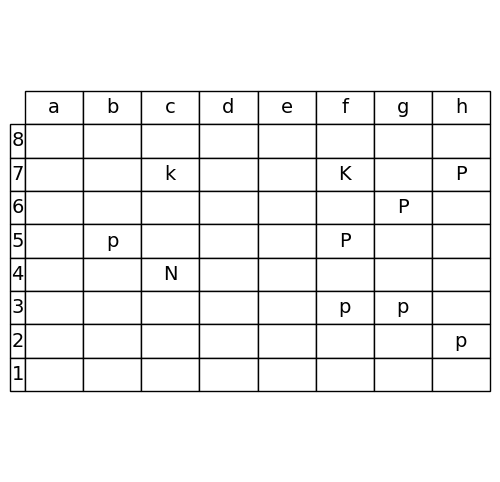

Batch: 69
Idx 138


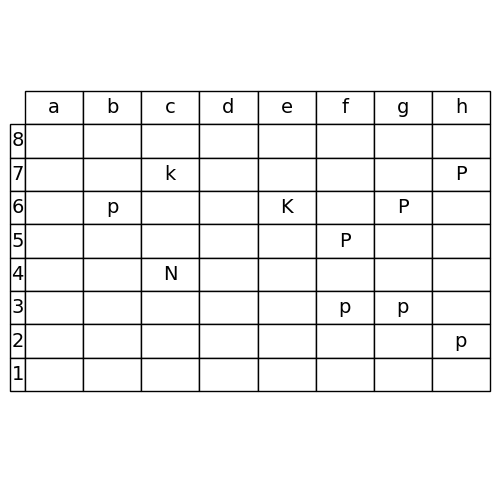

Next of batch 69
Idx 139


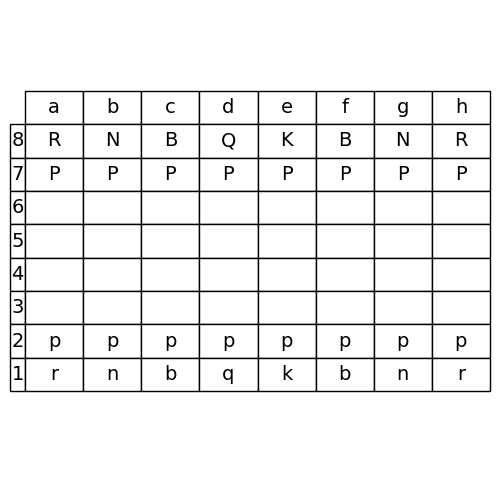

Batch: 70
Idx 140


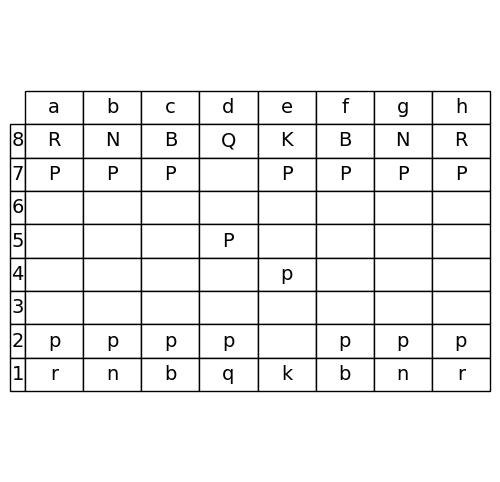

Next of batch 70
Idx 141


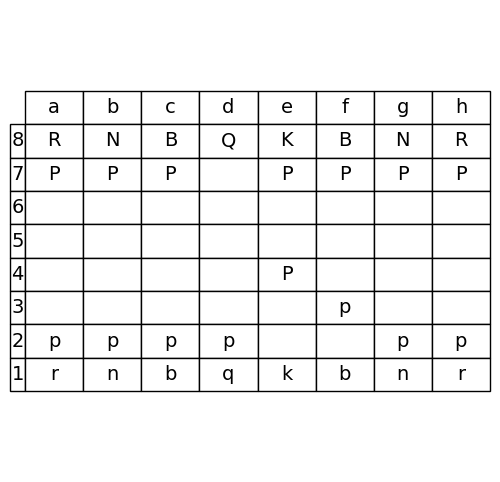

Batch: 71
Idx 142


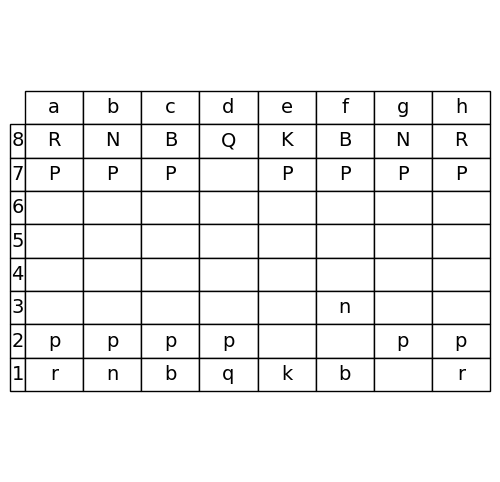

Next of batch 71
Idx 143


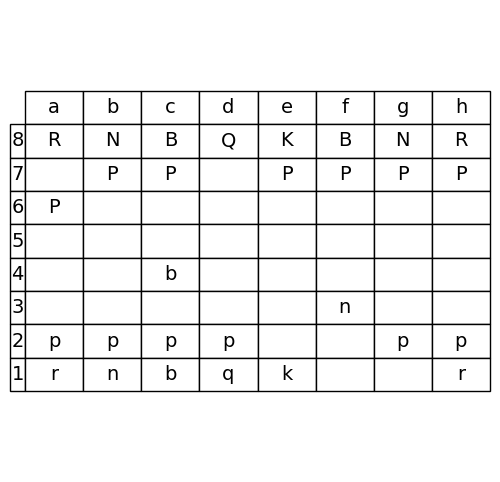

Batch: 72
Idx 144


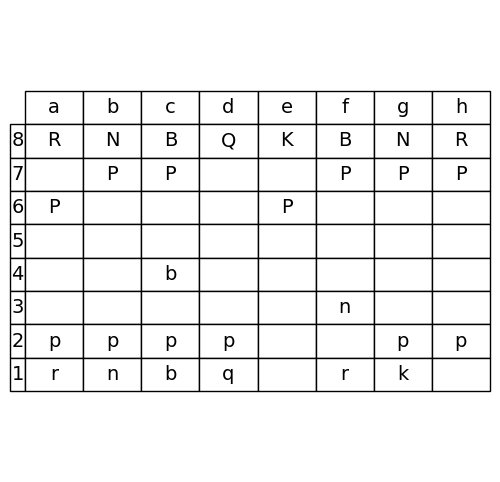

Next of batch 72
Idx 145


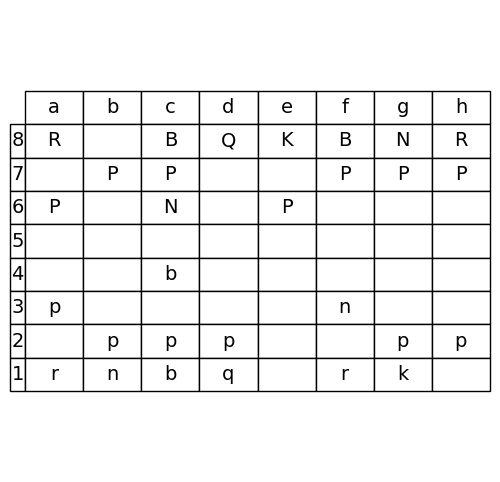

Batch: 73
Idx 146


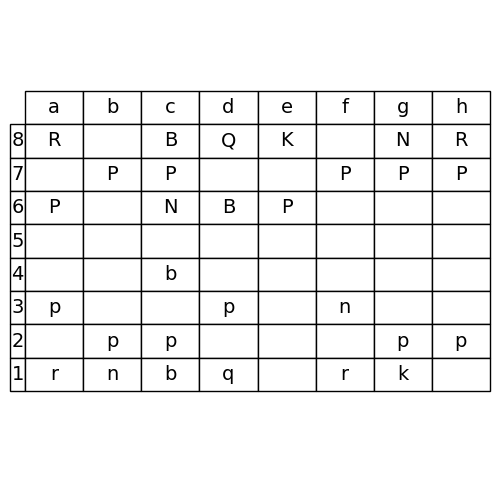

Next of batch 73
Idx 147


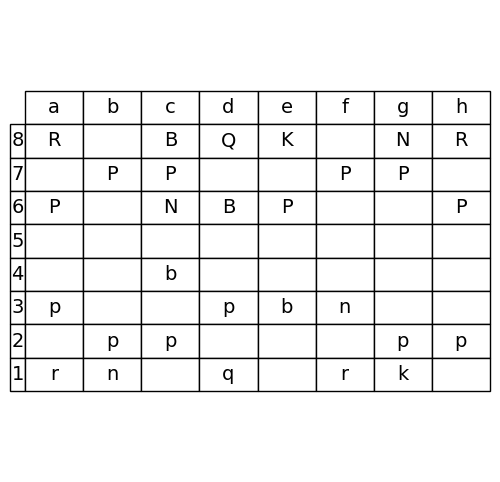

Batch: 74
Idx 148


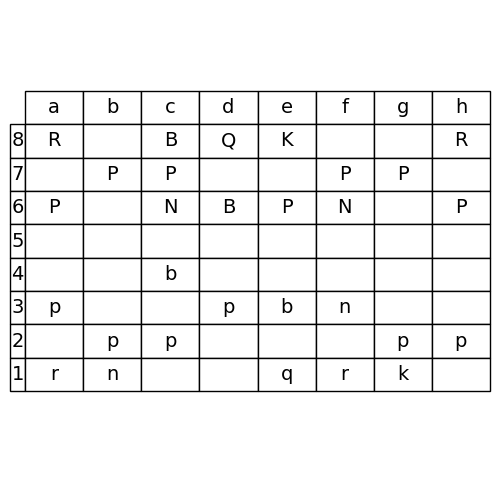

Next of batch 74
Idx 149


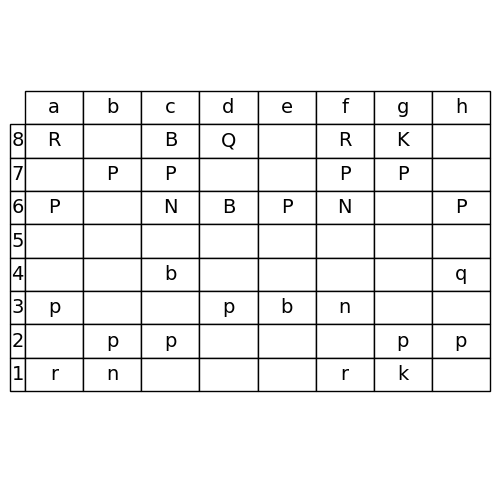

Batch: 75
Idx 150


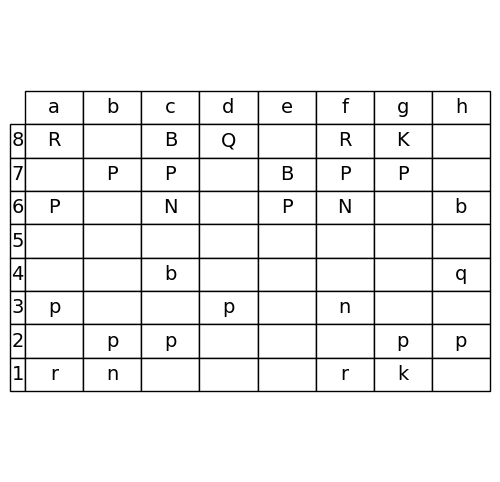

Next of batch 75
Idx 151


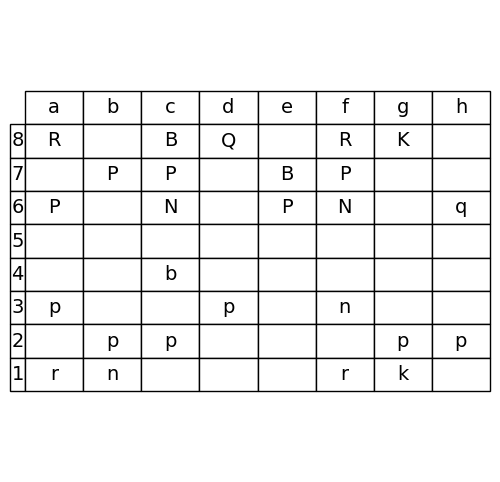

Batch: 76
Idx 152


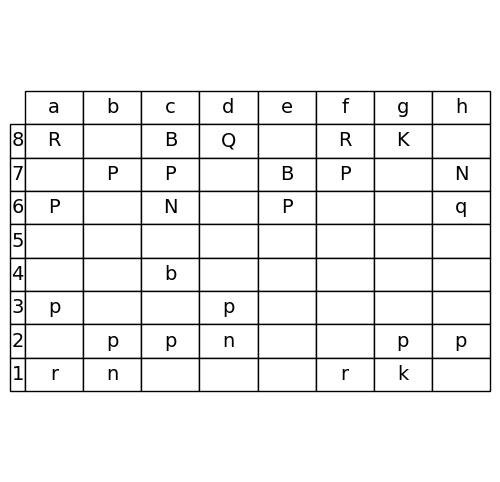

Next of batch 76
Idx 153


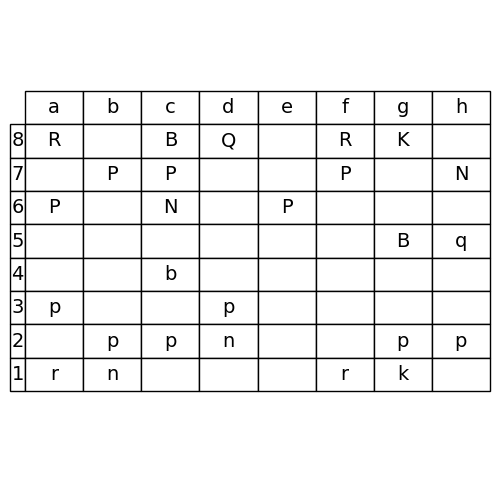

Batch: 77
Idx 154


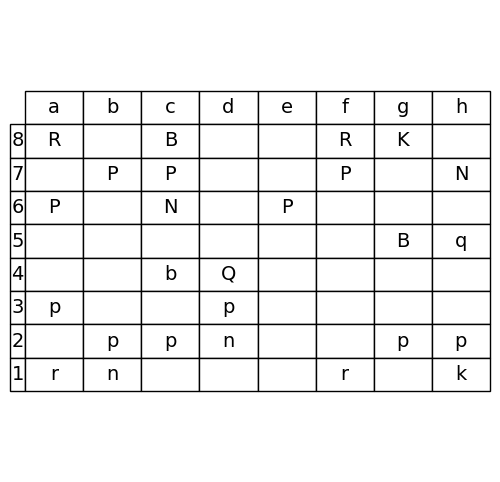

Next of batch 77
Idx 155


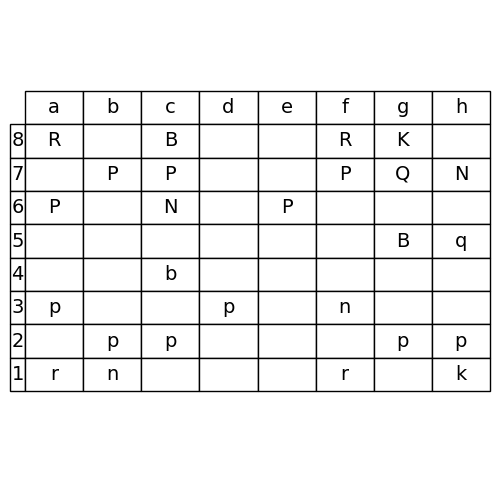

Batch: 78
Idx 156


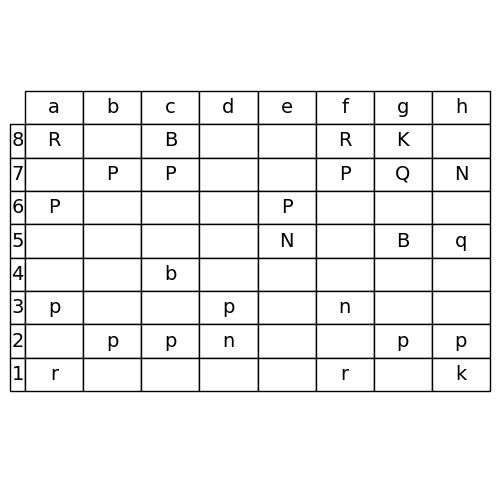

Next of batch 78
Idx 157


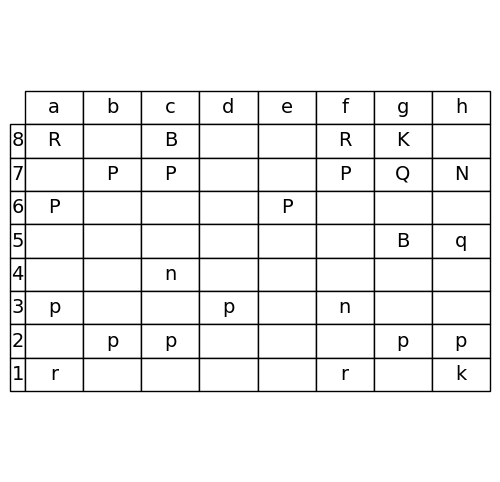

Batch: 79
Idx 158


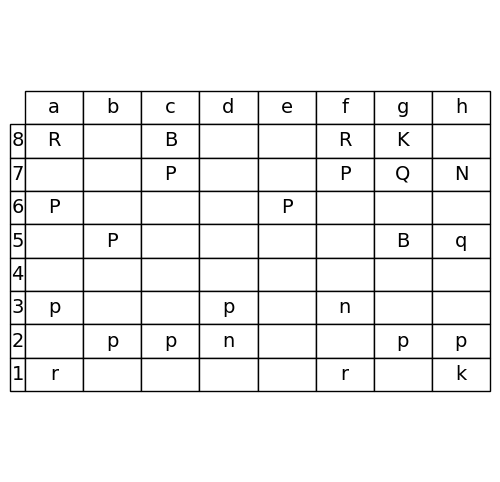

Next of batch 79
Idx 159


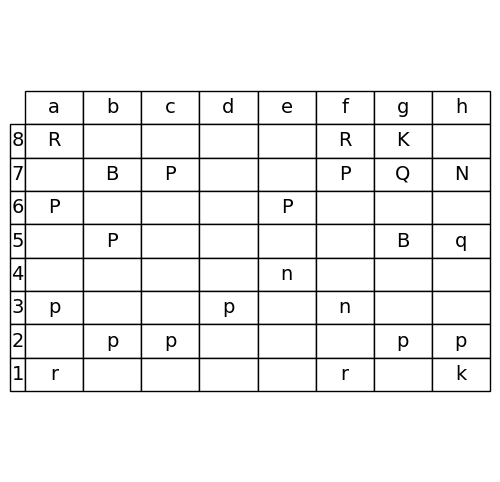

Batch: 80
Idx 160


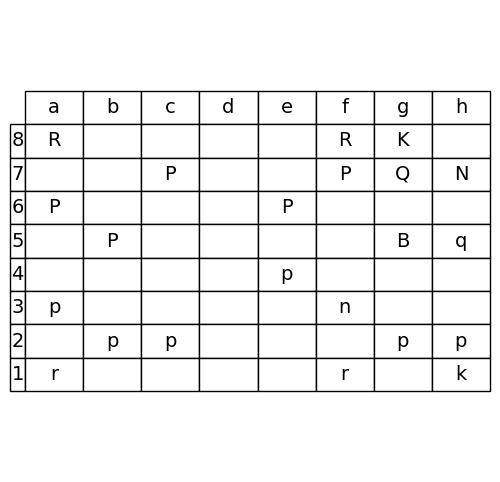

Next of batch 80
Idx 161


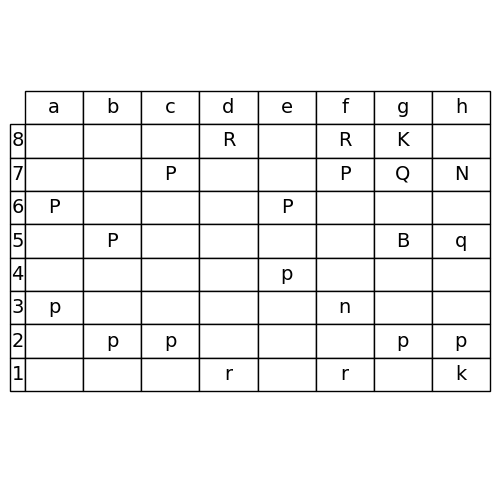

Batch: 81
Idx 162


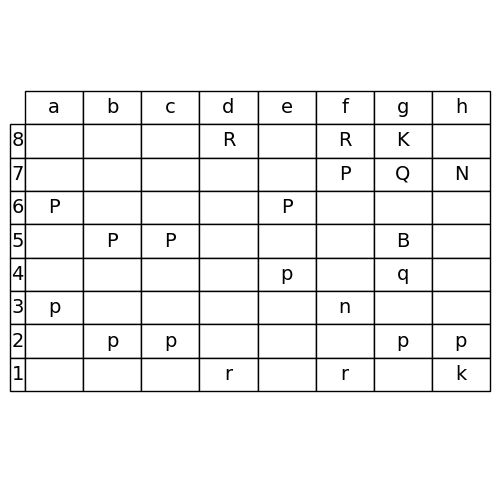

Next of batch 81
Idx 163


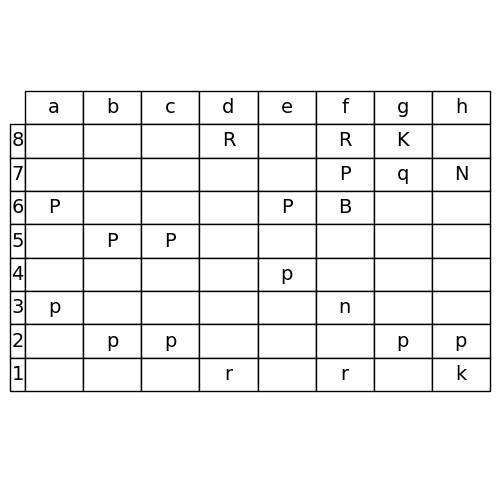

Batch: 82
Idx 164


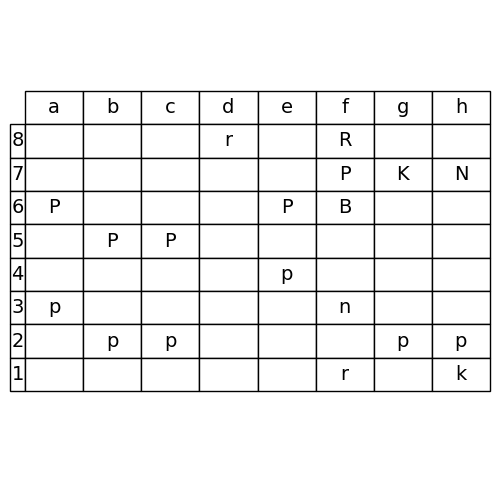

Next of batch 82
Idx 165


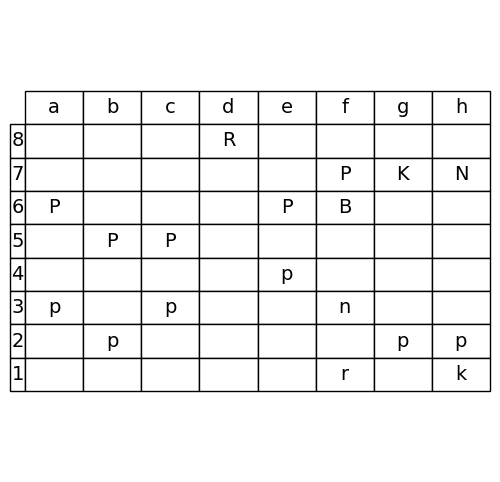

Batch: 83
Idx 166


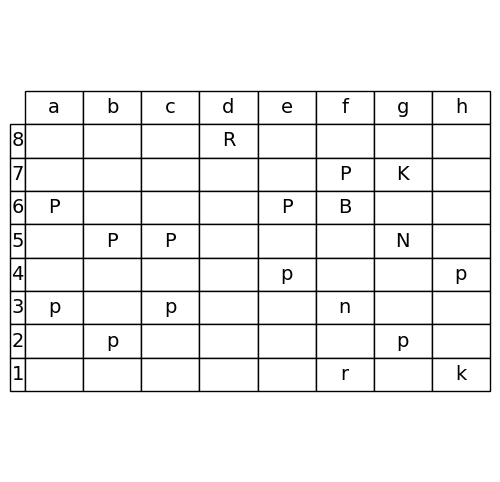

Next of batch 83
Idx 167


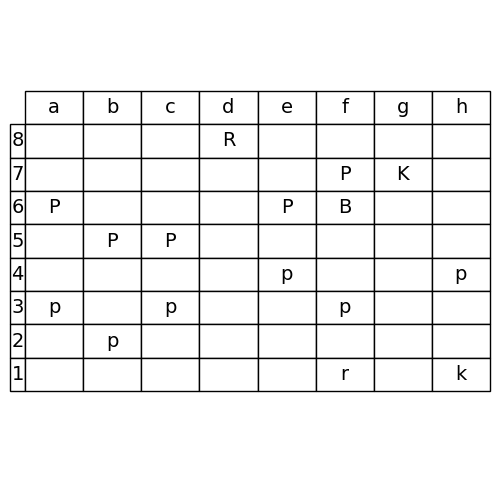

Batch: 84
Idx 168


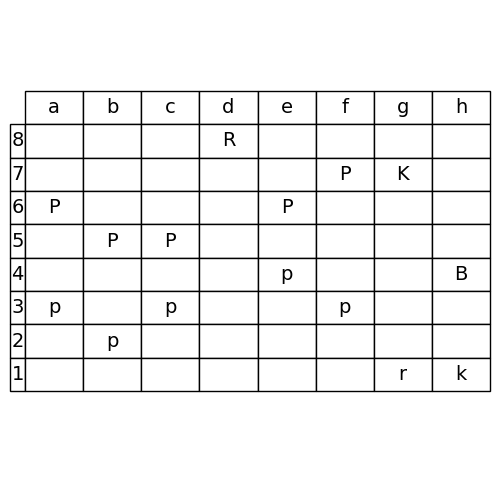

Next of batch 84
Idx 169


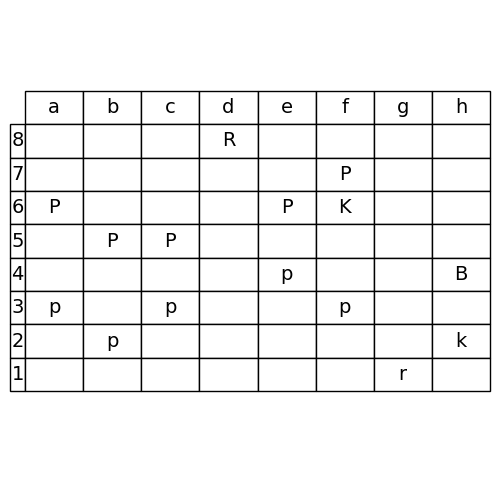

Batch: 85
Idx 170


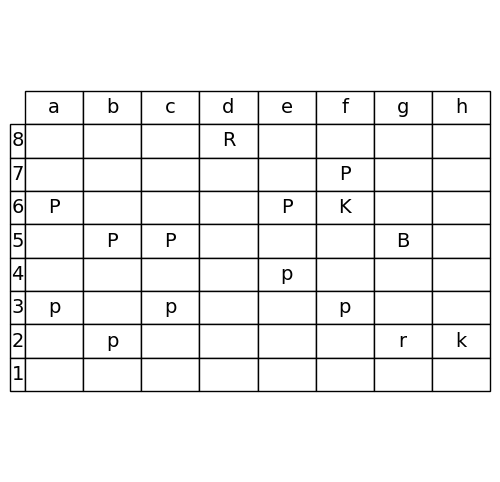

Next of batch 85
Idx 171


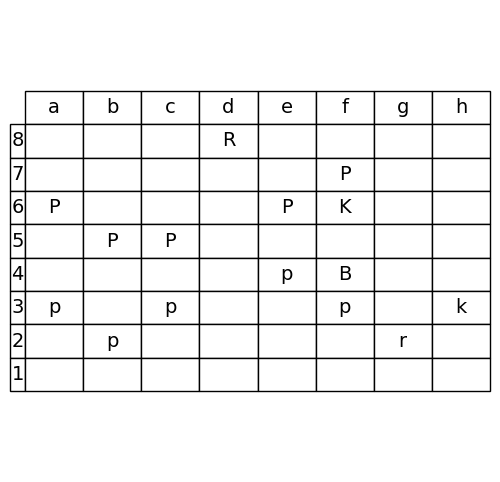

Batch: 86
Idx 172


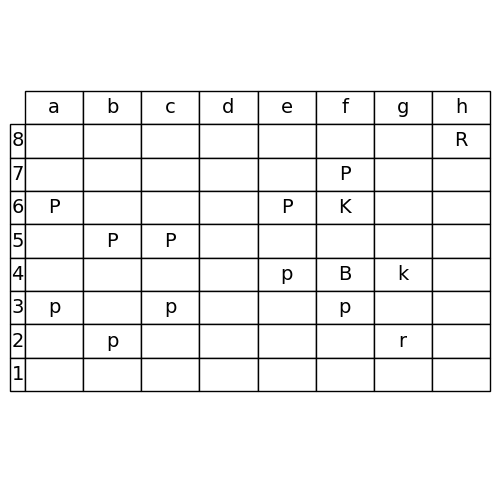

Next of batch 86
Idx 173


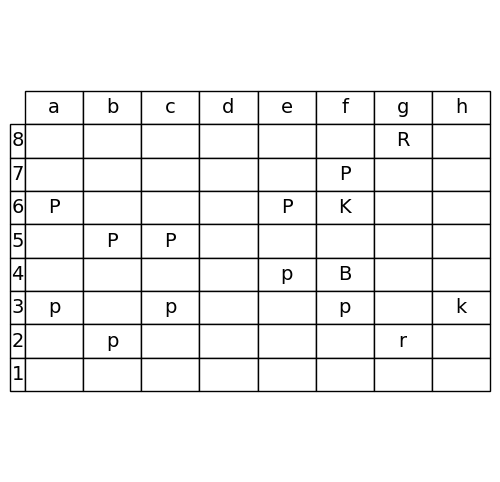

Batch: 87
Idx 174


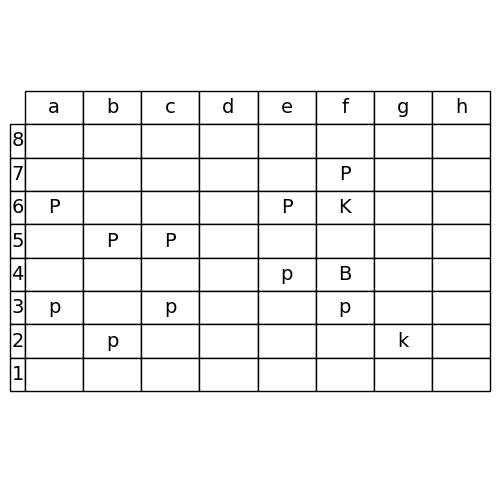

Next of batch 87
Idx 175


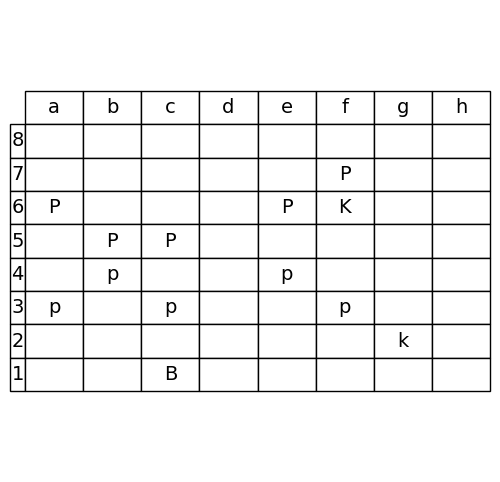

Batch: 88
Idx 176


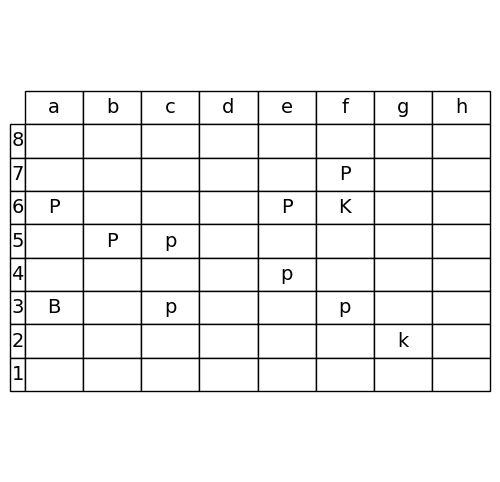

Next of batch 88
Idx 177


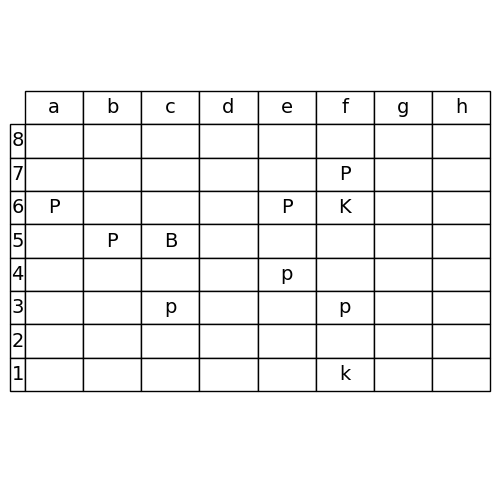

Batch: 89
Idx 178


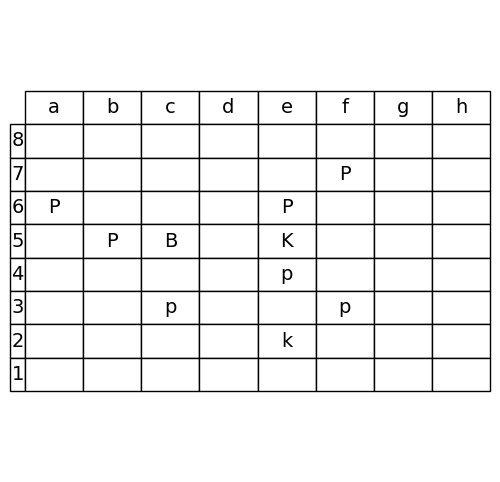

Next of batch 89
Idx 179


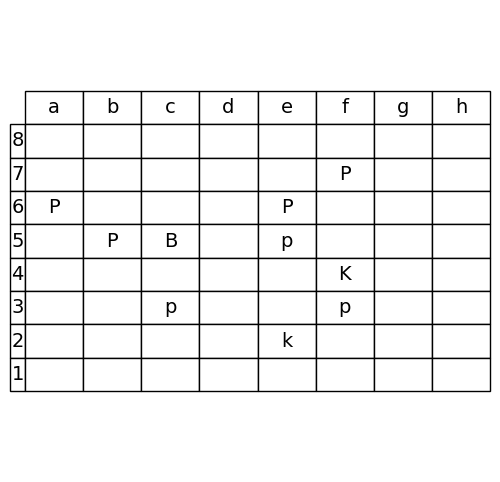

Batch: 90
Idx 180


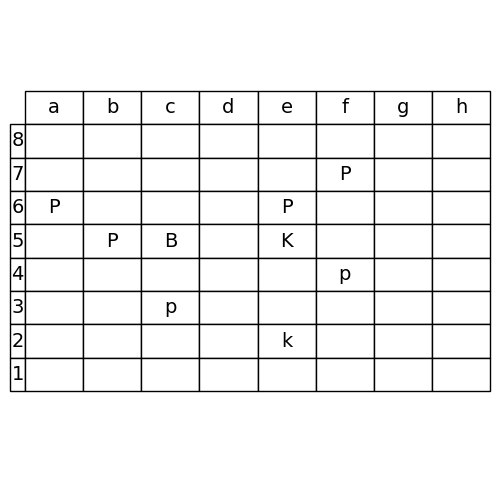

Next of batch 90
Idx 181


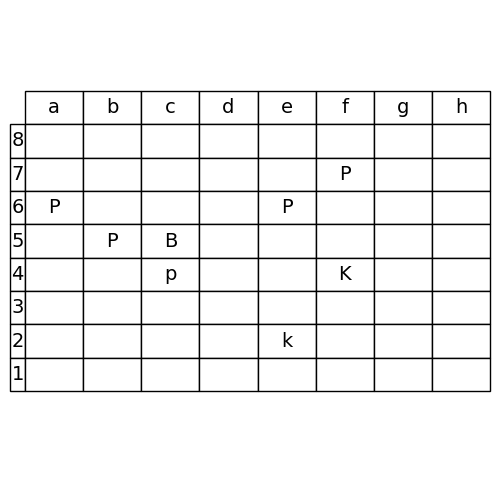

Batch: 91
Idx 182


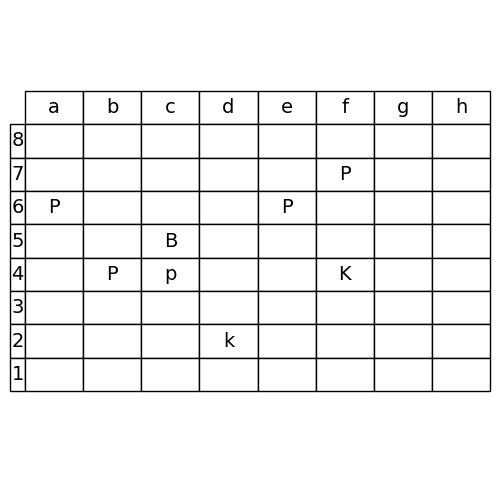

Next of batch 91
Idx 183


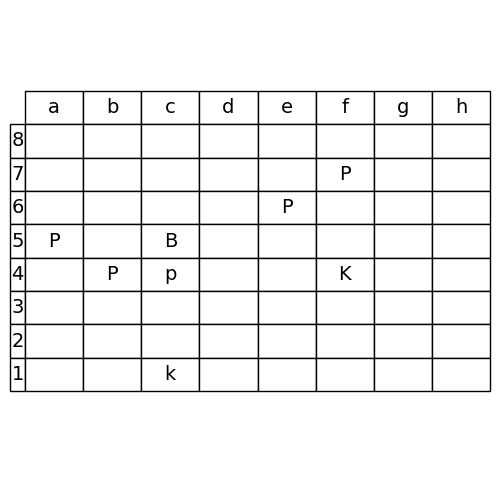

Batch: 92
Idx 184


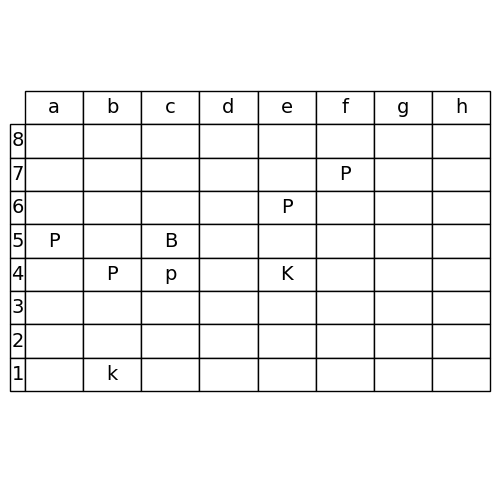

Next of batch 92
Idx 185


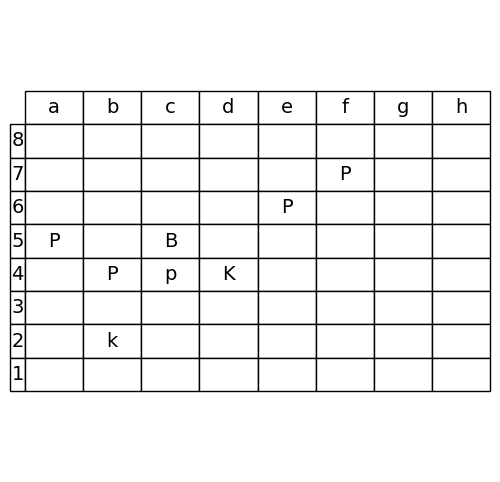

Batch: 93
Idx 186


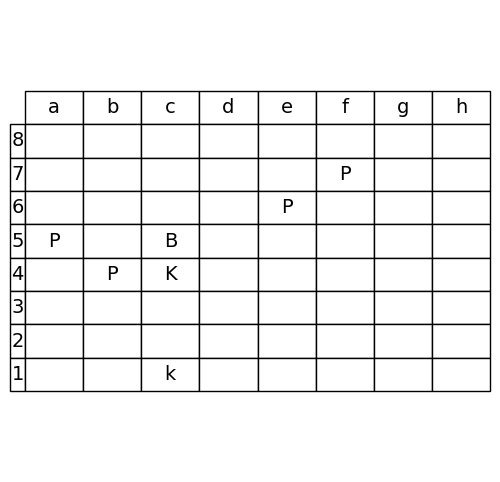

Next of batch 93
Idx 187


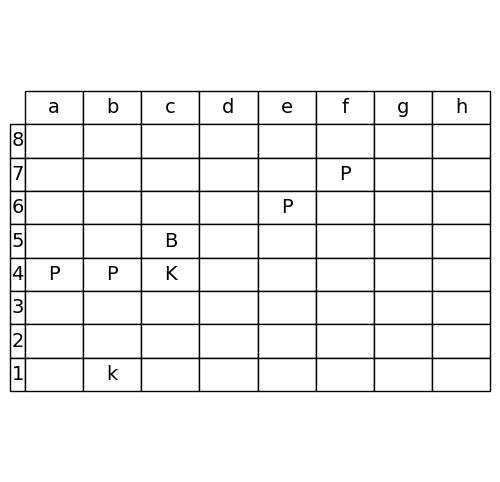

Batch: 94
Idx 188


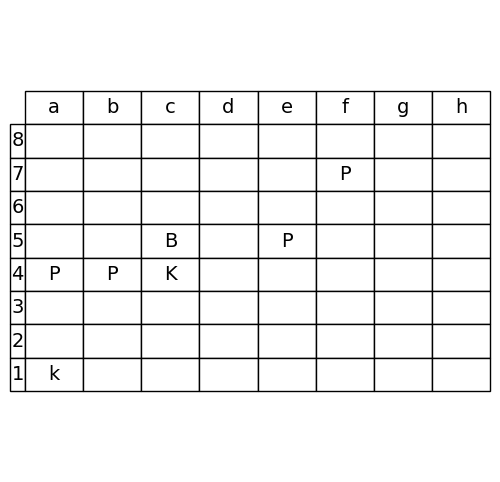

Next of batch 94
Idx 189


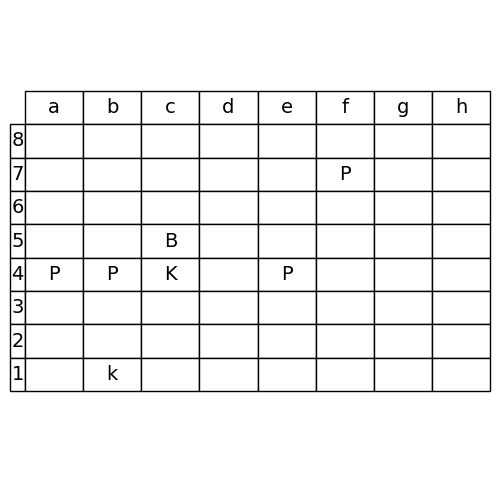

Batch: 95
Idx 190


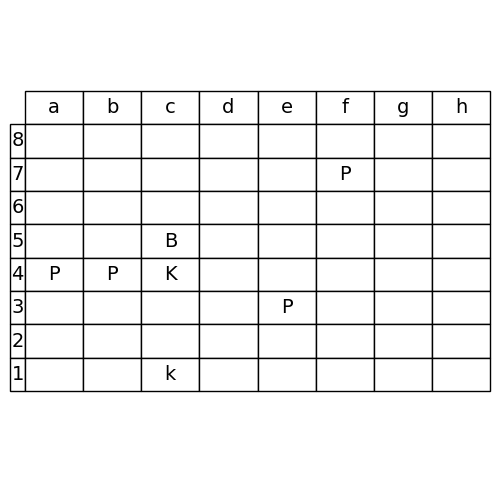

Next of batch 95
Idx 191


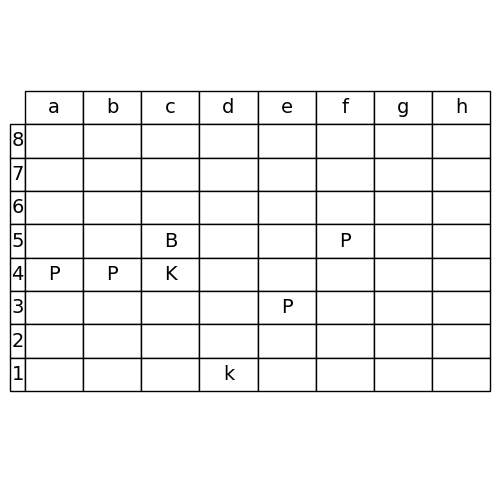

Batch: 96
Idx 192


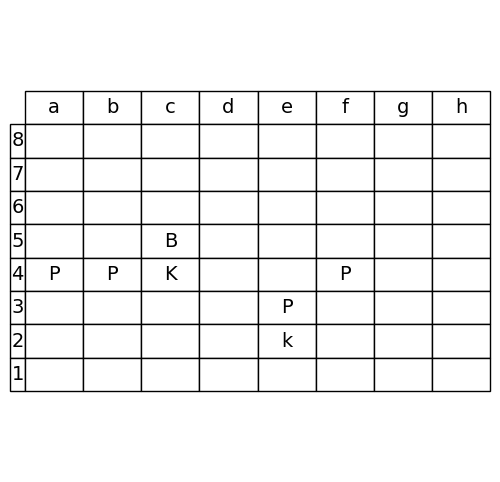

Next of batch 96
Idx 193


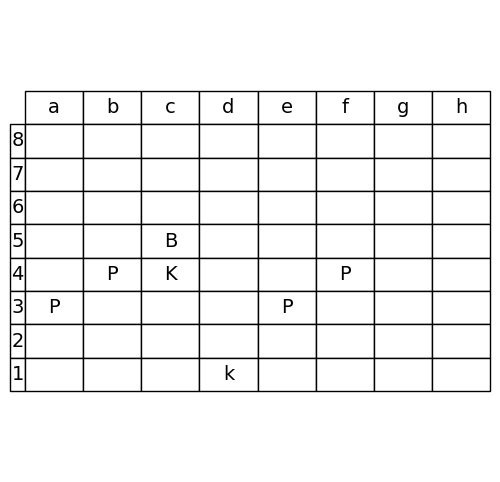

Batch: 97
Idx 194


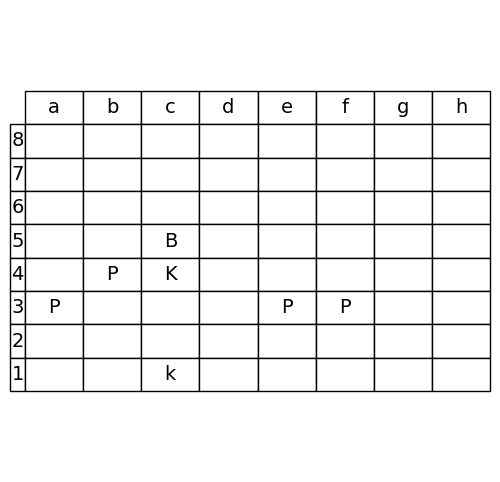

Next of batch 97
Idx 195


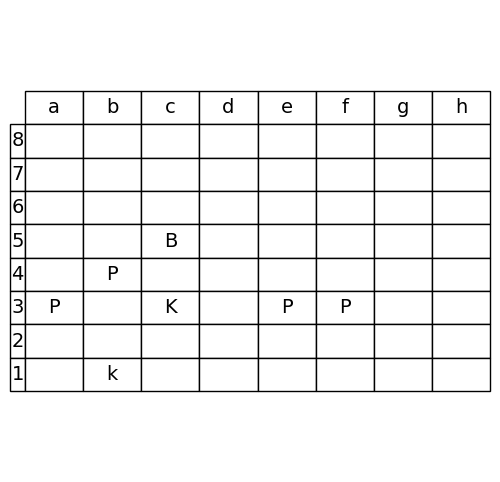

Batch: 98
Idx 196


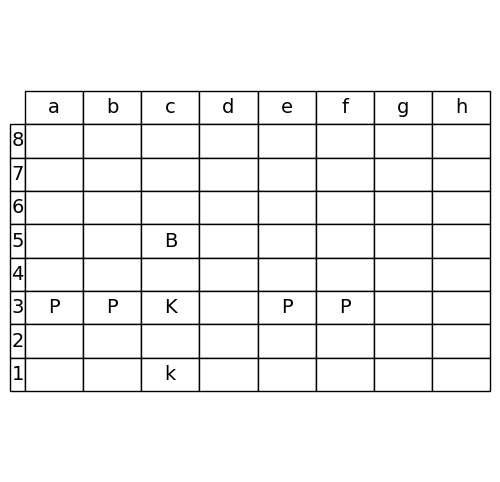

Next of batch 98
Idx 197


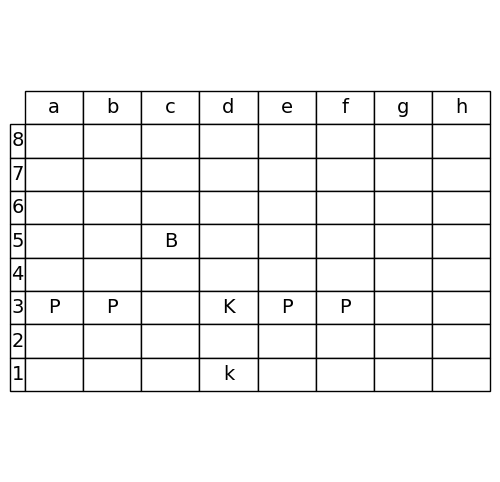

Batch: 99
Idx 198


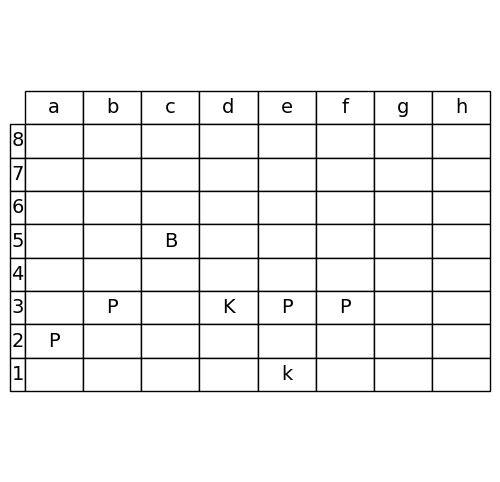

Next of batch 99
Idx 199


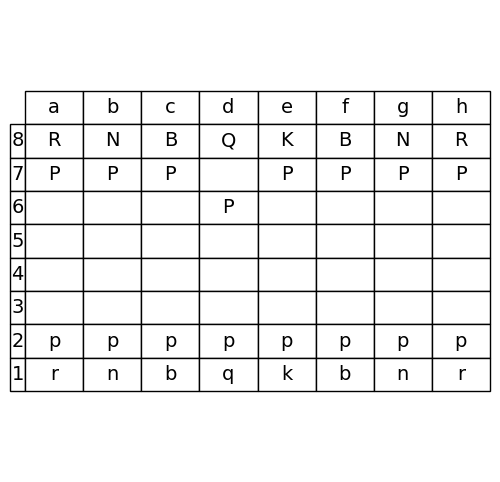

Batch: 100
Idx 200


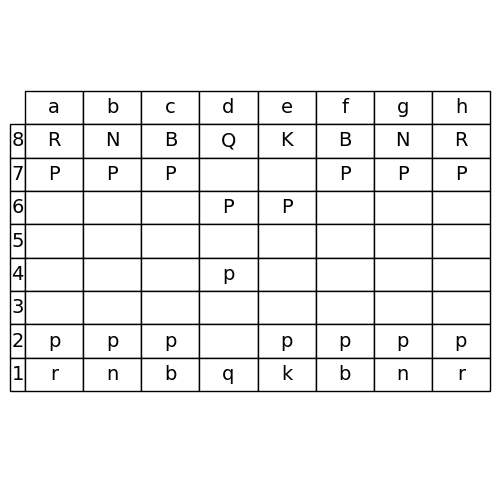

Next of batch 100
Idx 201


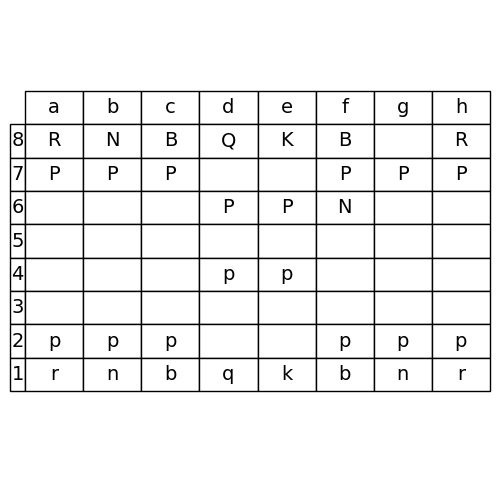

Batch: 101
Idx 202


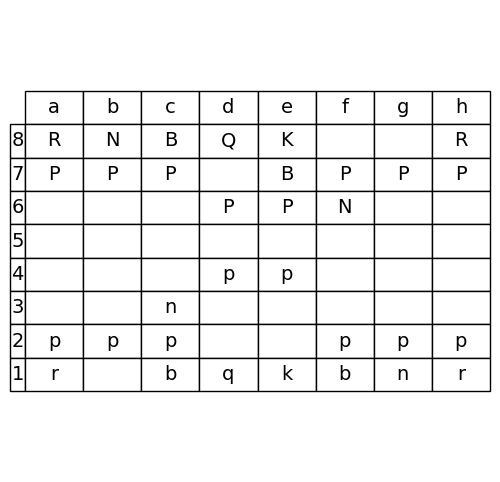

Next of batch 101
Idx 203


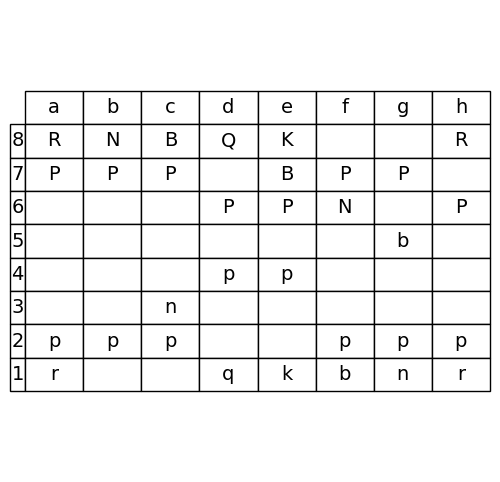

Batch: 102
Idx 204


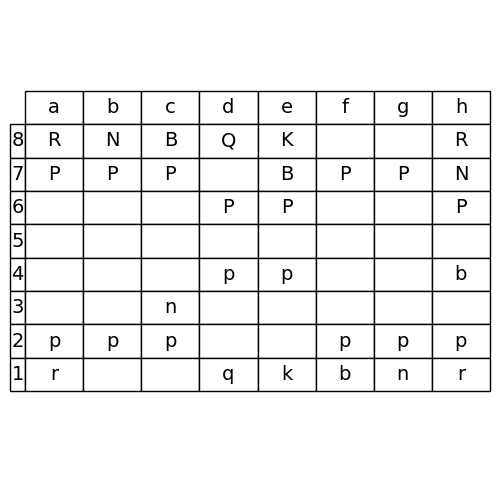

Next of batch 102
Idx 205


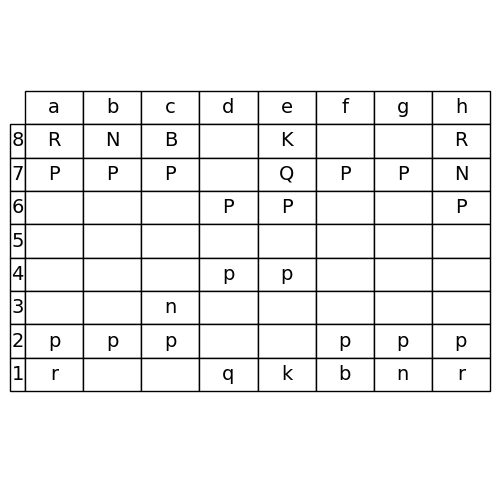

Batch: 103
Idx 206


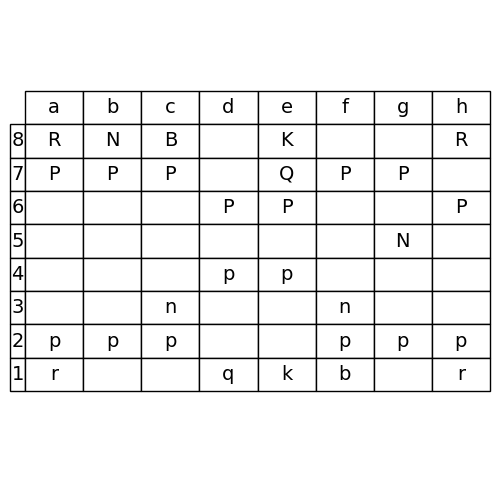

Next of batch 103
Idx 207


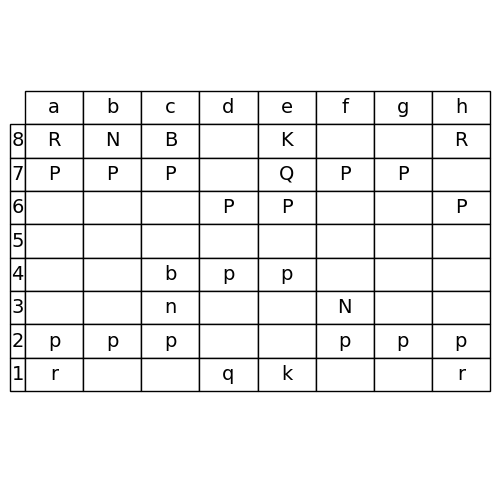

Batch: 104
Idx 208


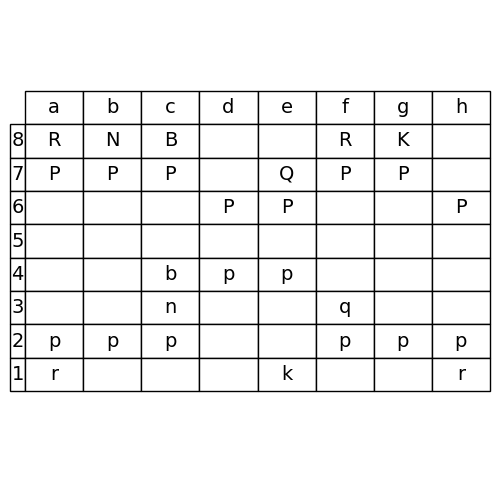

Next of batch 104
Idx 209


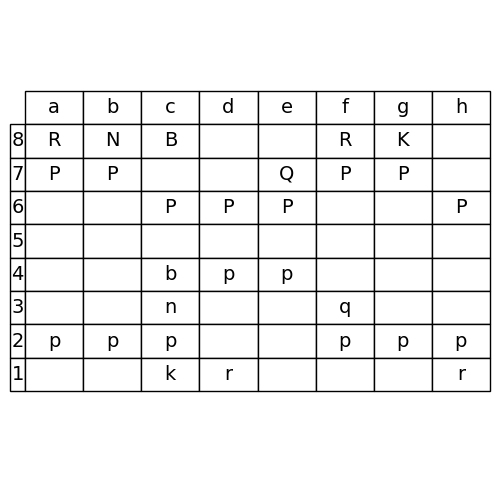

Batch: 105
Idx 210


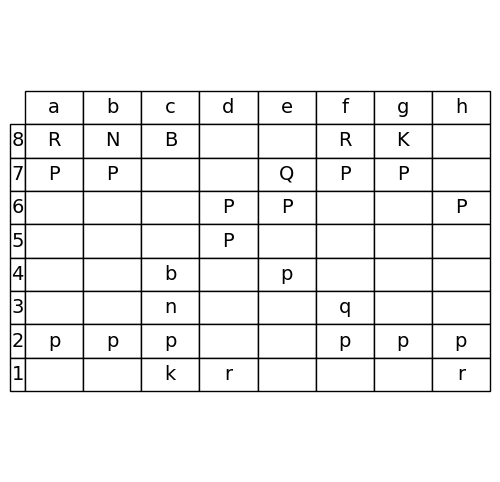

Next of batch 105
Idx 211


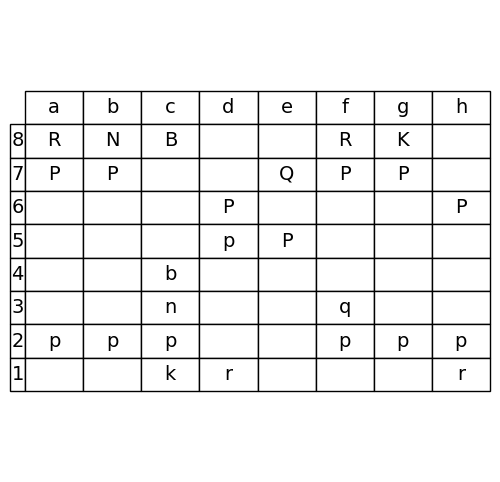

Batch: 106
Idx 212


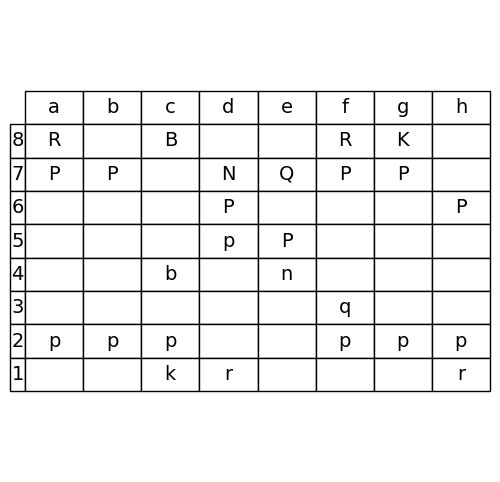

Next of batch 106
Idx 213


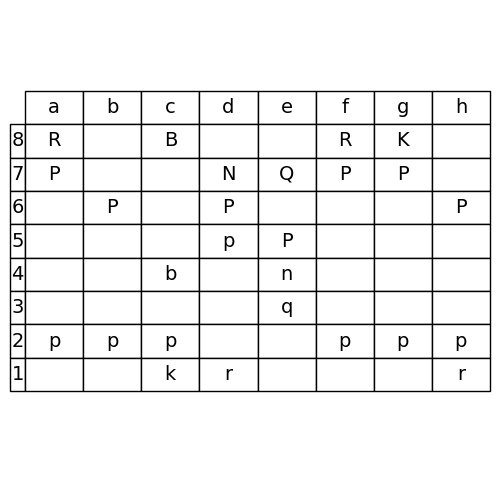

Batch: 107
Idx 214


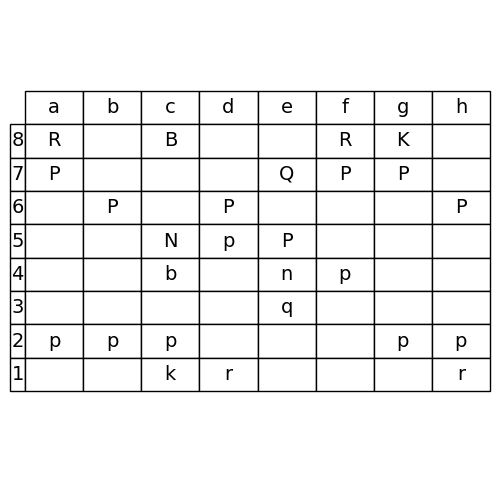

Next of batch 107
Idx 215


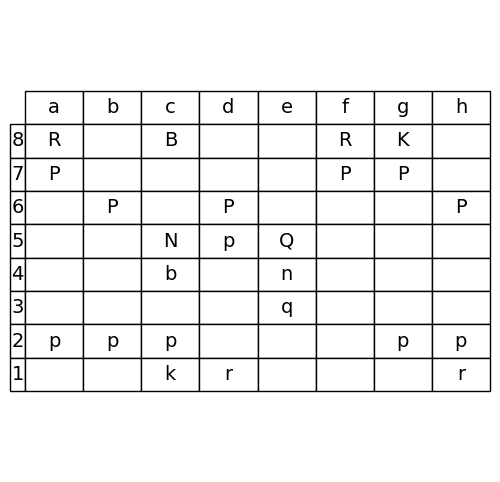

Batch: 108
Idx 216


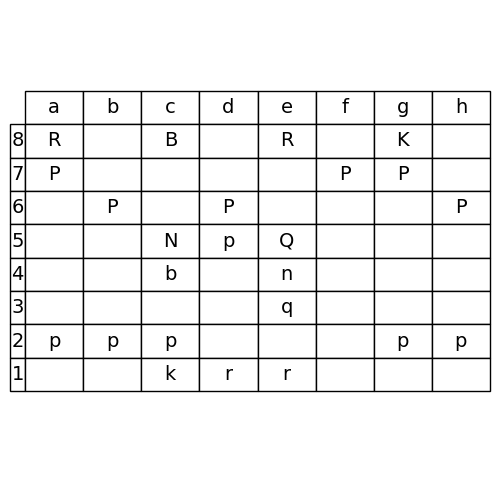

Next of batch 108
Idx 217


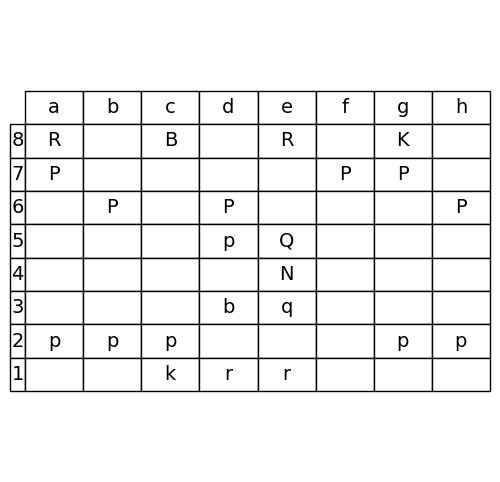

Batch: 109
Idx 218


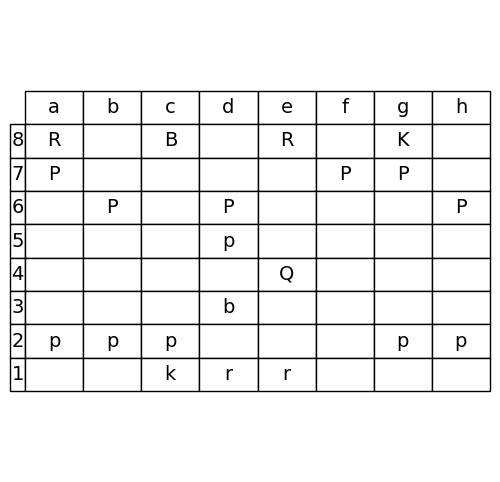

Next of batch 109
Idx 219


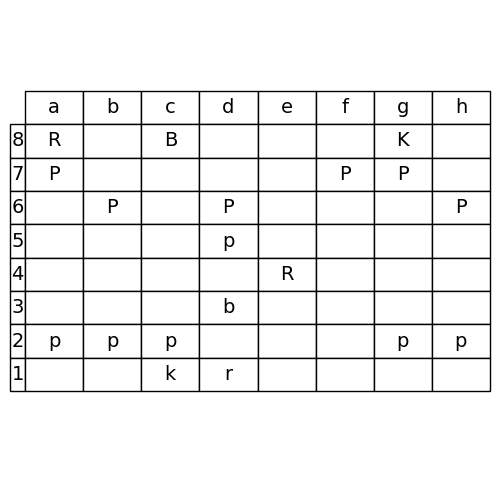

Batch: 110
Idx 220


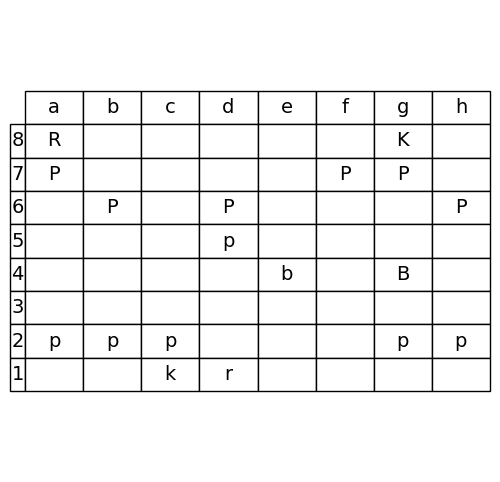

Next of batch 110
Idx 221


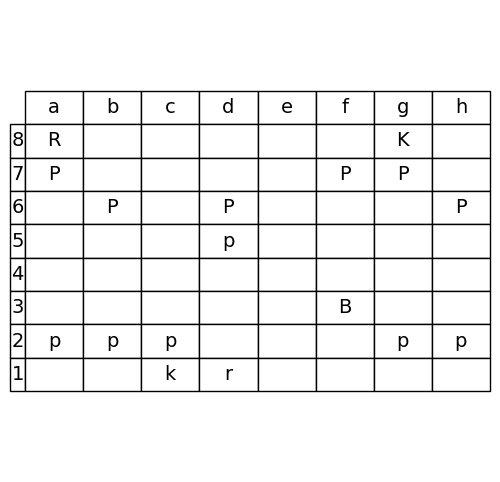

Batch: 111
Idx 222


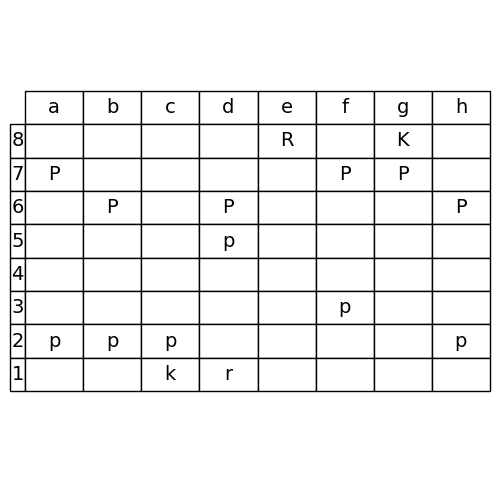

Next of batch 111
Idx 223


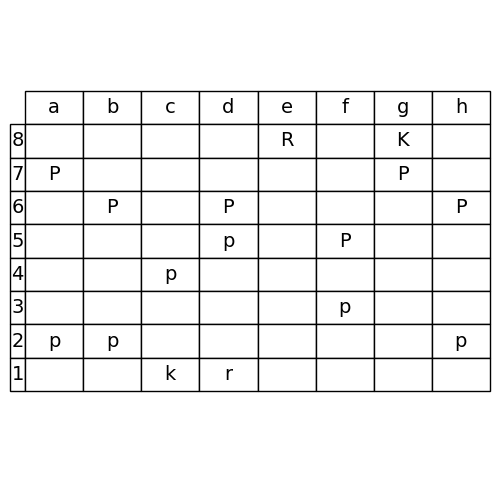

Batch: 112
Idx 224


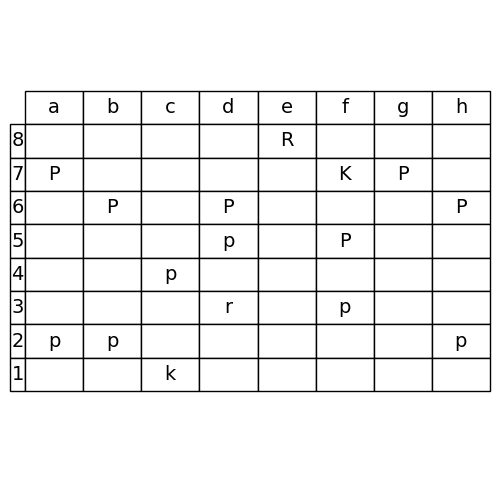

Next of batch 112
Idx 225


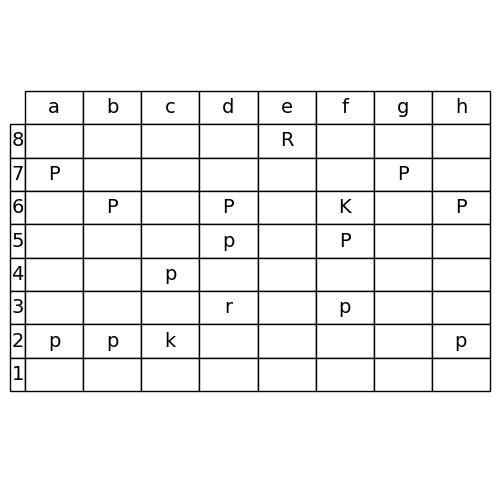

Batch: 113
Idx 226


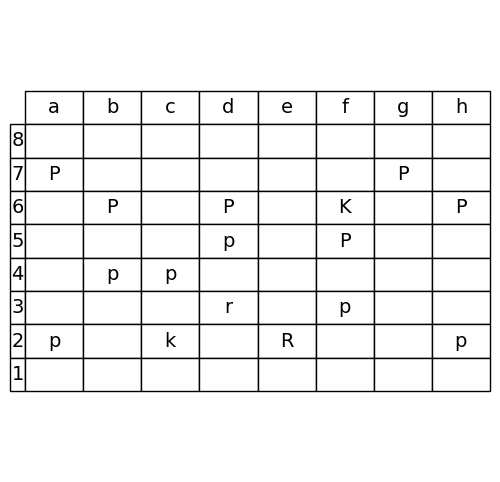

Next of batch 113
Idx 227


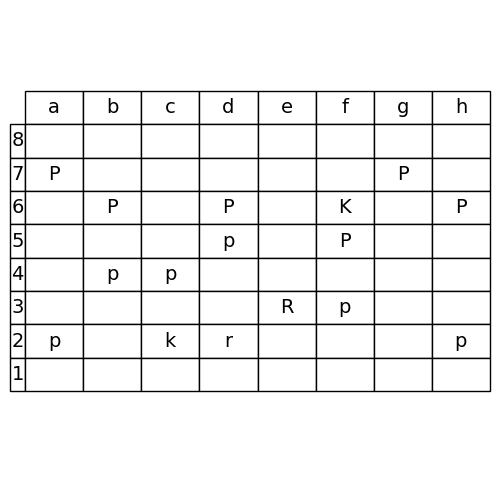

Batch: 114
Idx 228


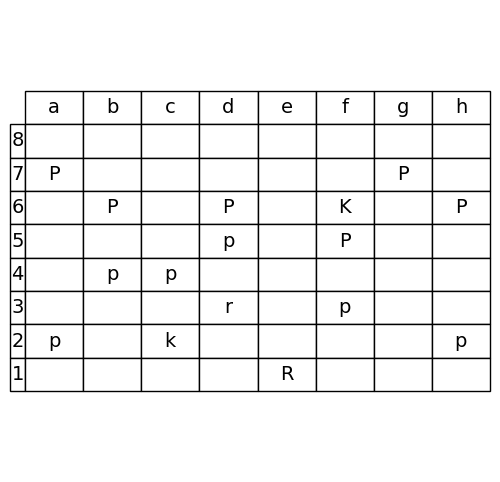

Next of batch 114
Idx 229


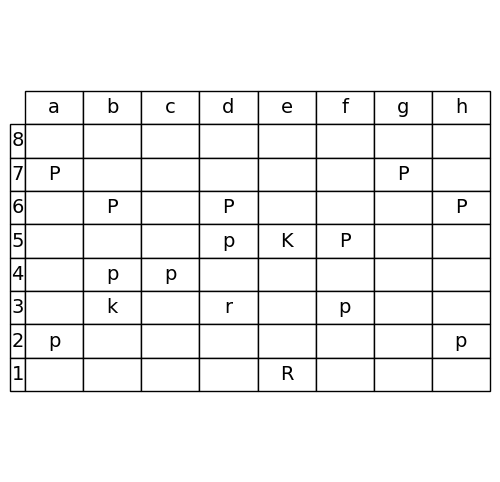

Batch: 115
Idx 230


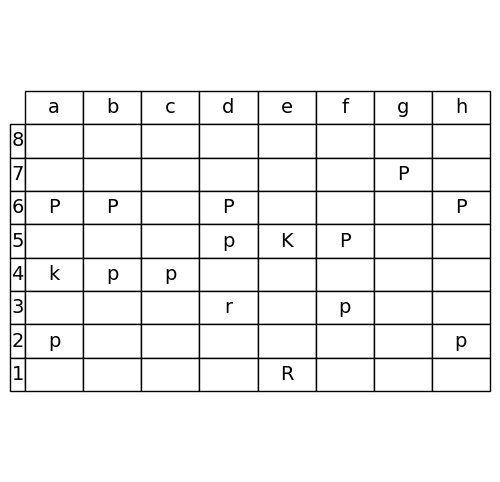

Next of batch 115
Idx 231


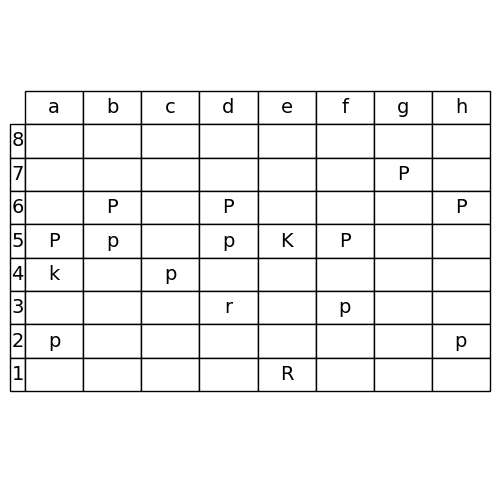

Batch: 116
Idx 232


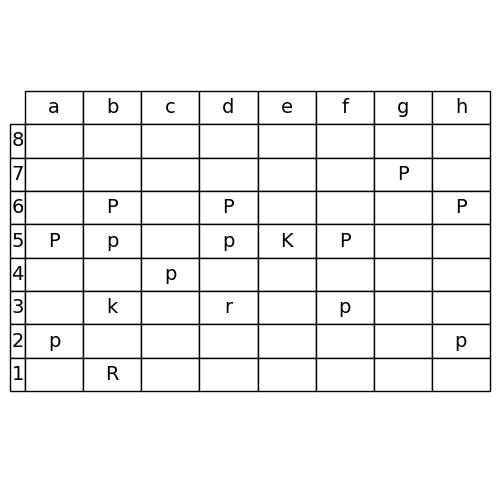

Next of batch 116
Idx 233


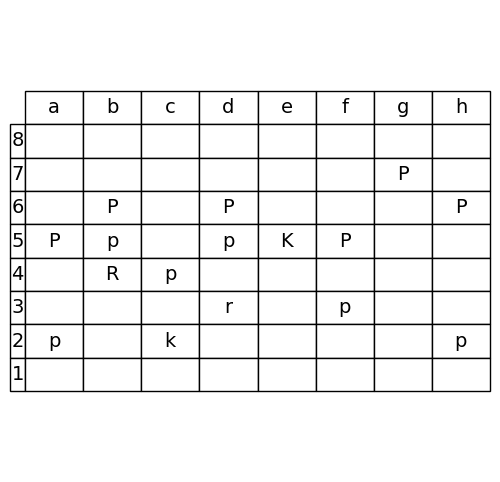

Batch: 117
Idx 234


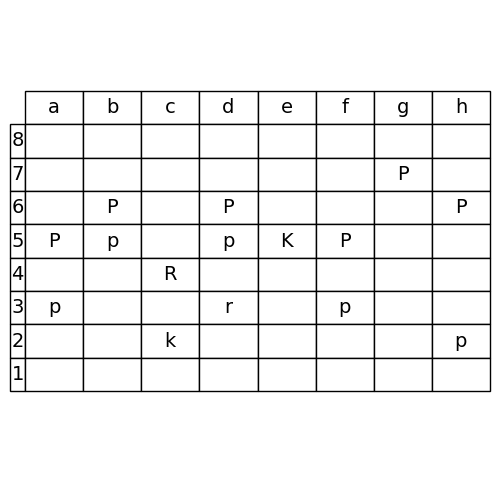

Next of batch 117
Idx 235


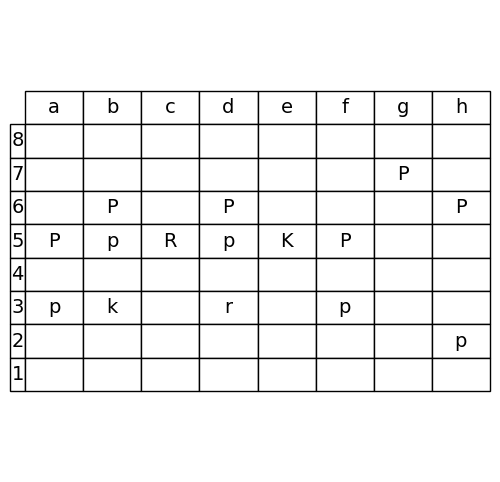

Batch: 118
Idx 236


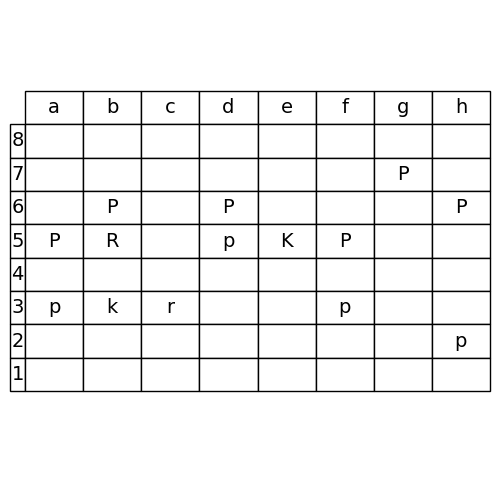

Next of batch 118
Idx 237


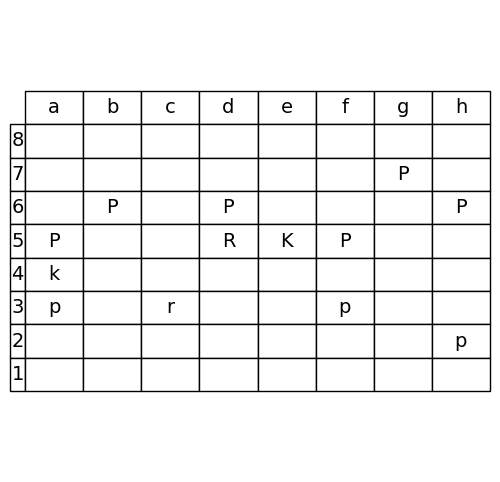

Batch: 119
Idx 238


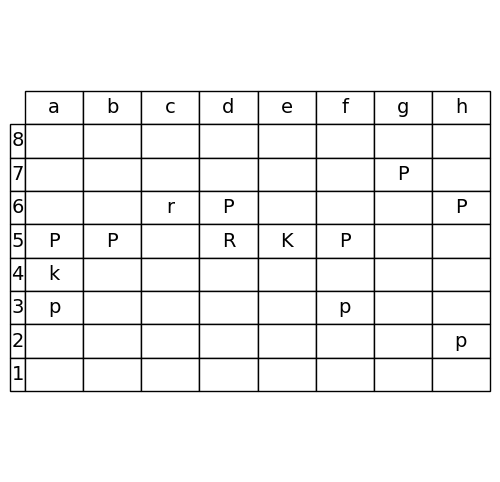

Next of batch 119
Idx 239


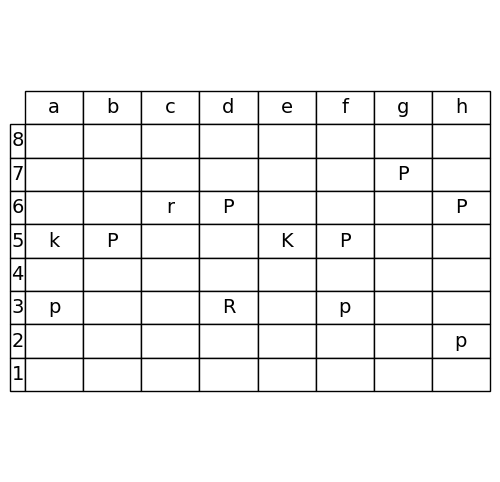

Batch: 120
Idx 240


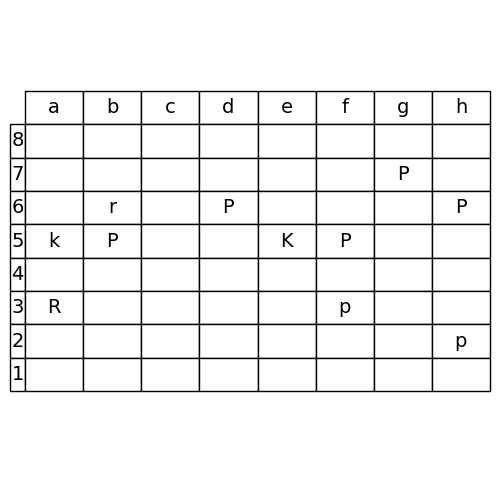

Next of batch 120
Idx 241


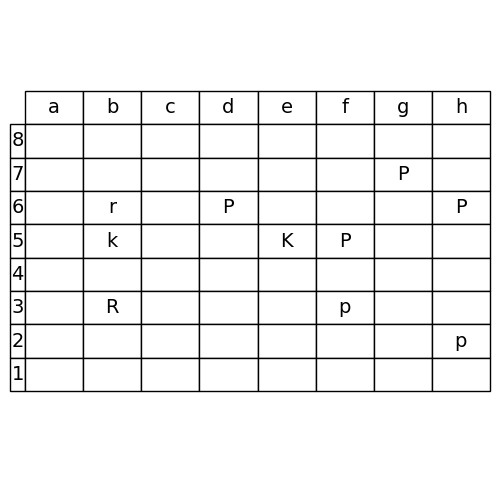

Batch: 121
Idx 242


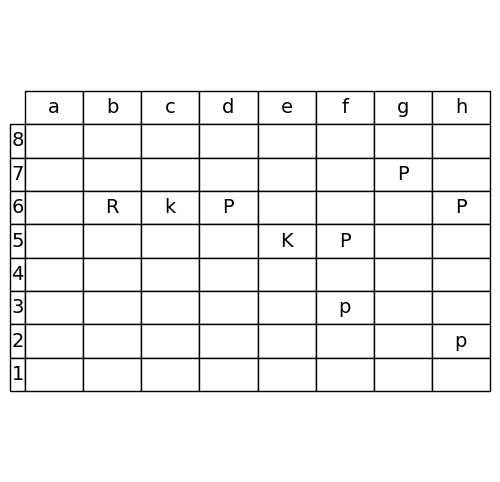

Next of batch 121
Idx 243


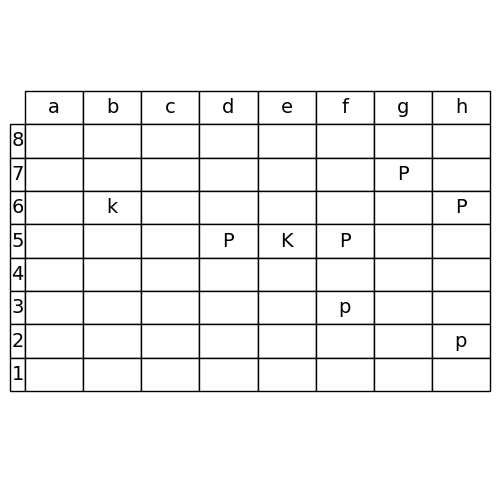

Batch: 122
Idx 244


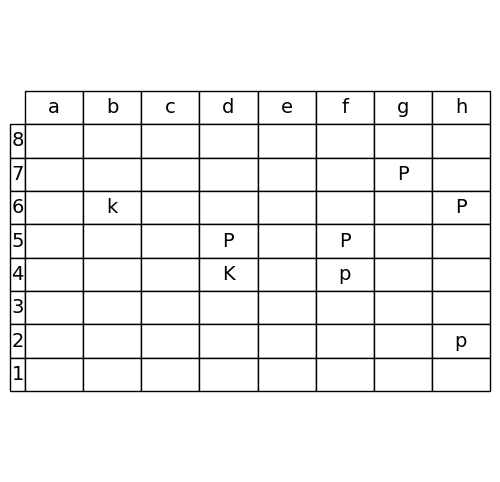

Next of batch 122
Idx 245


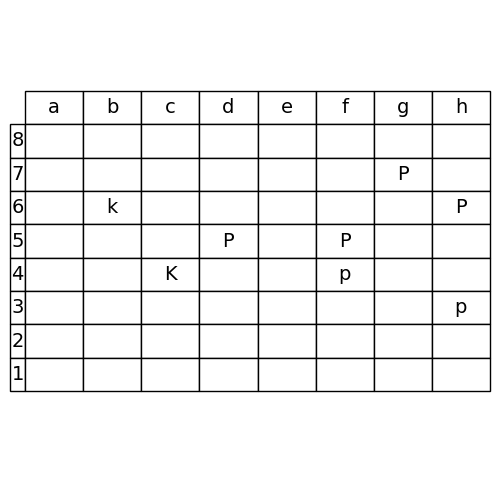

Batch: 123
Idx 246


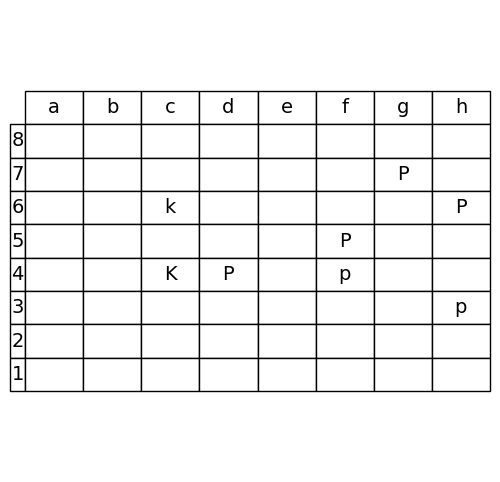

Next of batch 123
Idx 247


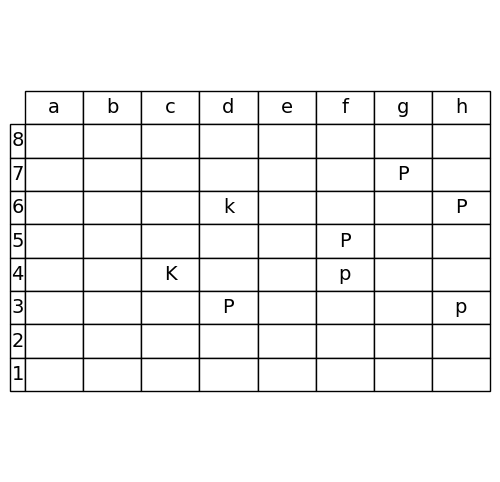

Batch: 124
Idx 248


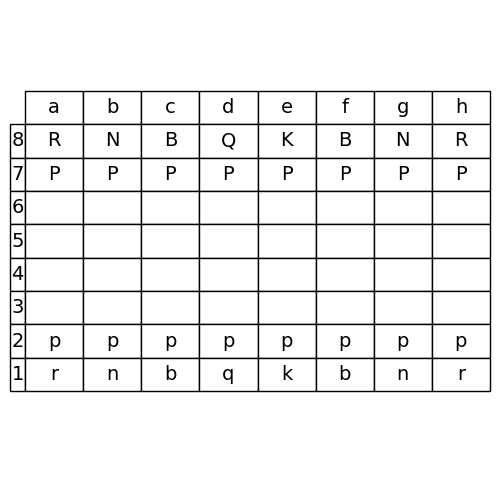

Next of batch 124
Idx 249


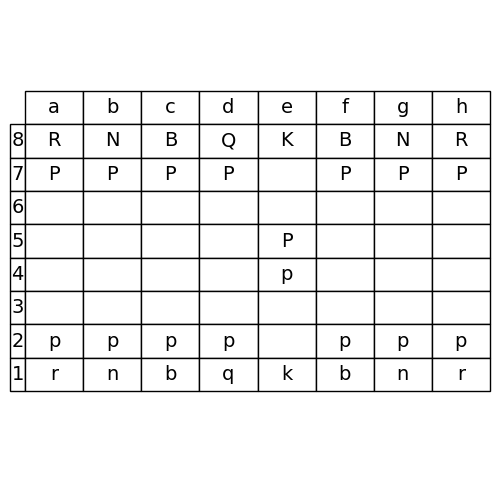

Batch: 125
Idx 250


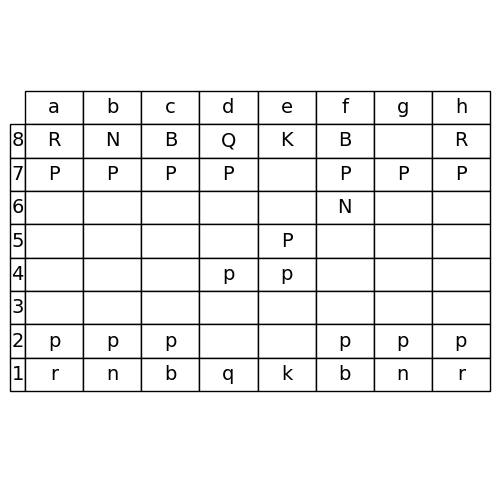

Next of batch 125
Idx 251


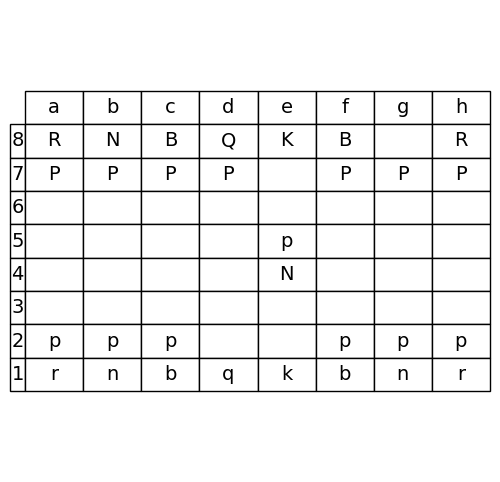

Batch: 126
Idx 252


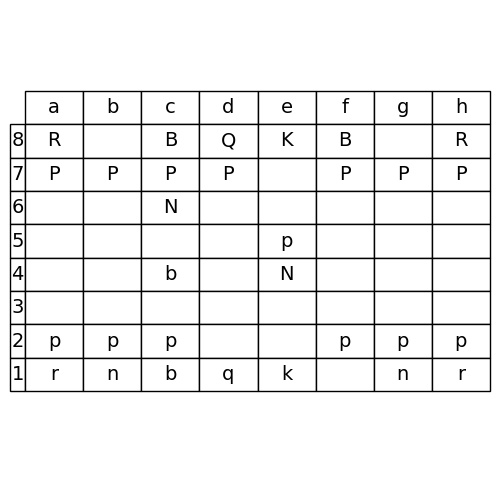

Next of batch 126
Idx 253


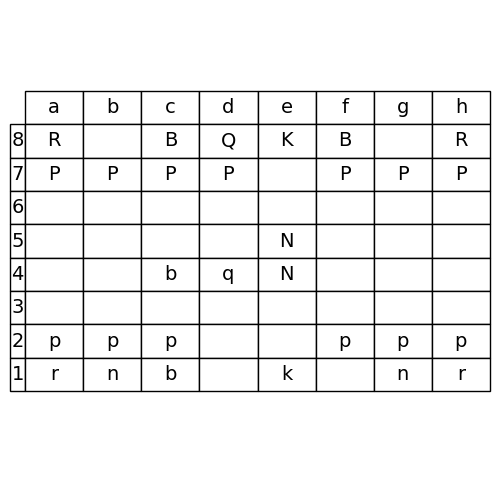

Batch: 127
Idx 254


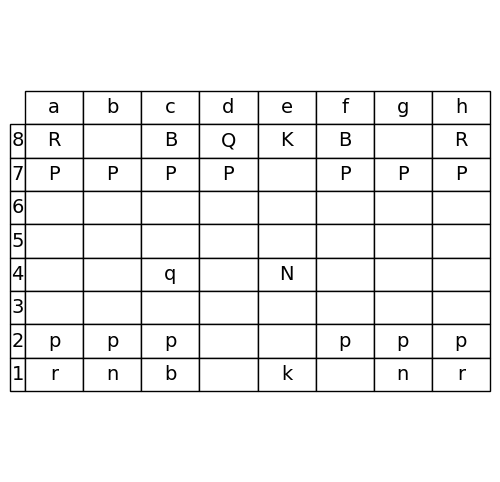

Next of batch 127
Idx 255


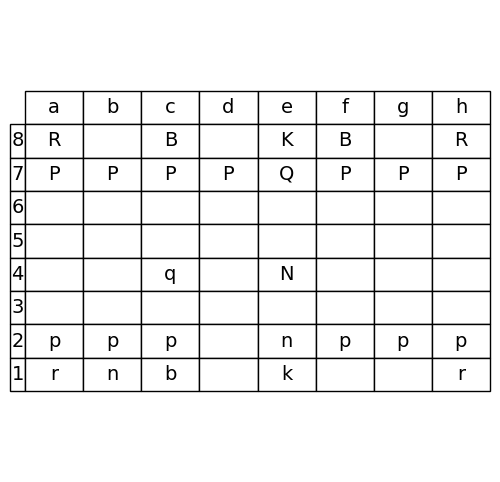

Batch: 128
Idx 256


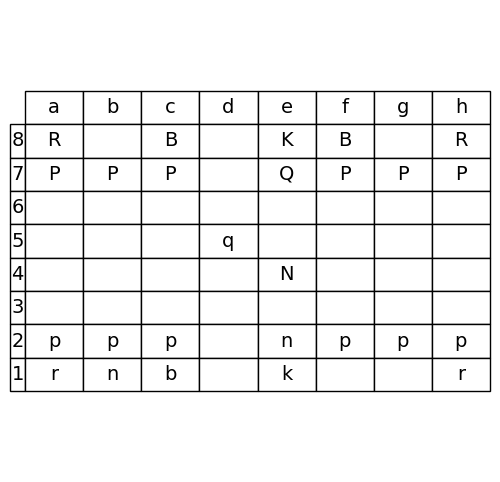

Next of batch 128
Idx 257


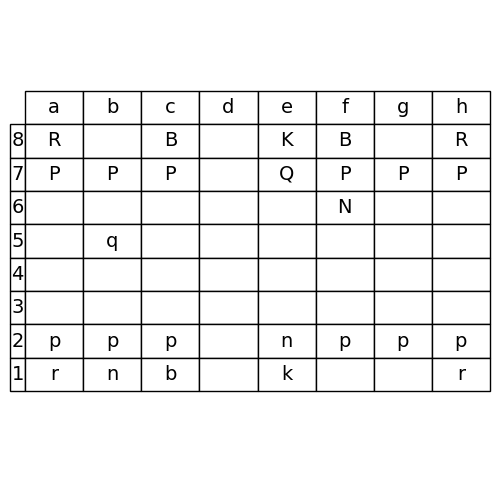

Batch: 129
Idx 258


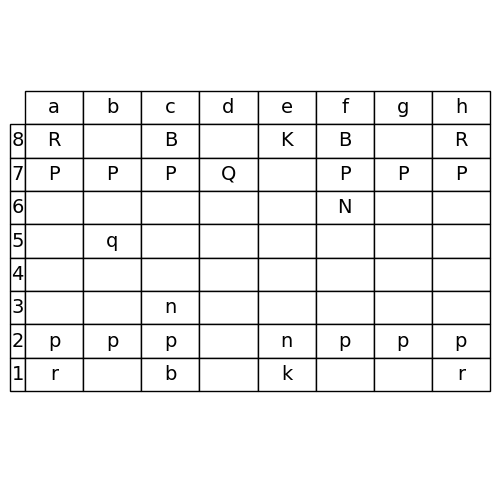

Next of batch 129
Idx 259


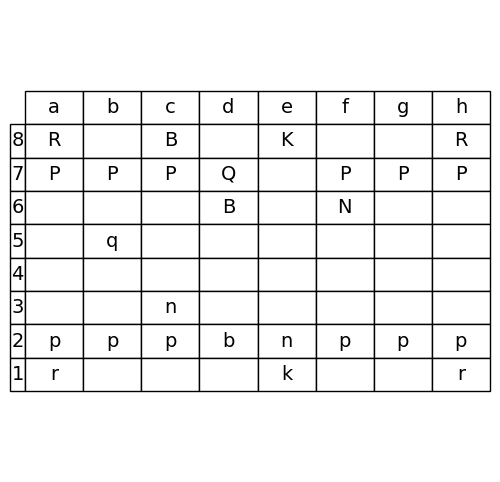

Batch: 130
Idx 260


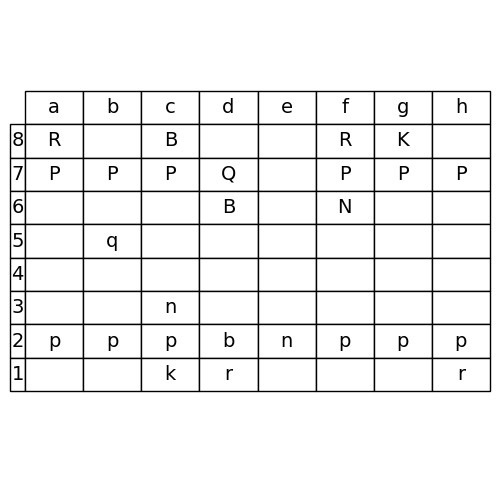

Next of batch 130
Idx 261


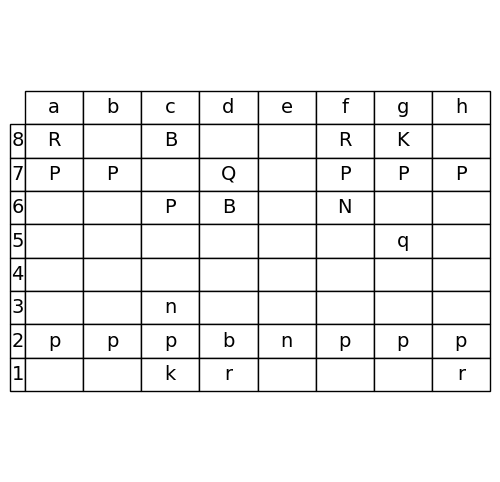

Batch: 131
Idx 262


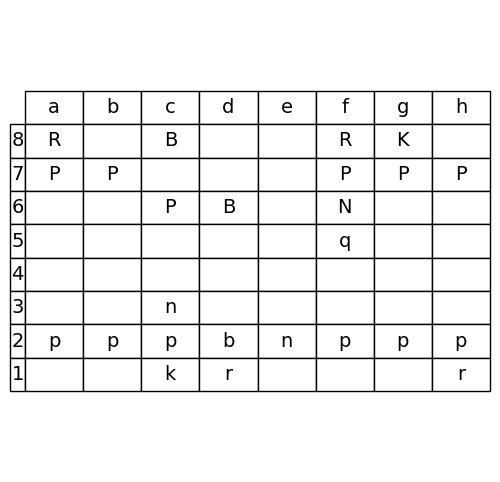

Next of batch 131
Idx 263


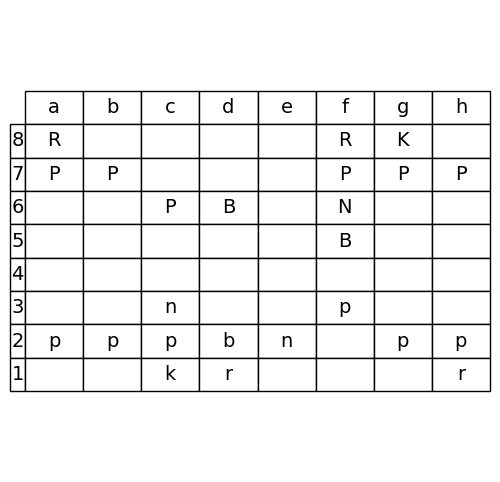

Batch: 132
Idx 264


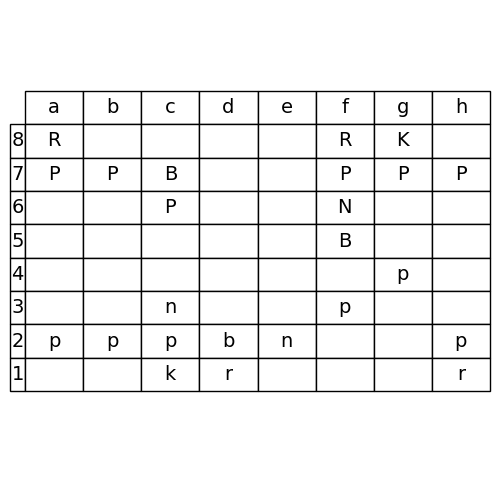

Next of batch 132
Idx 265


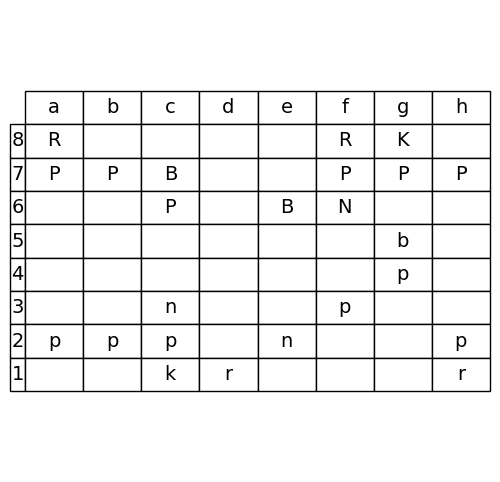

Batch: 133
Idx 266


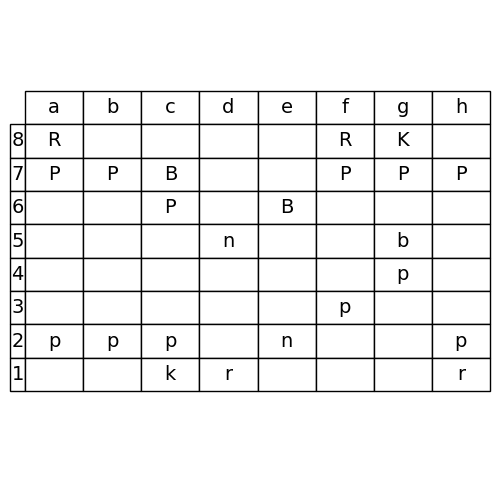

Next of batch 133
Idx 267


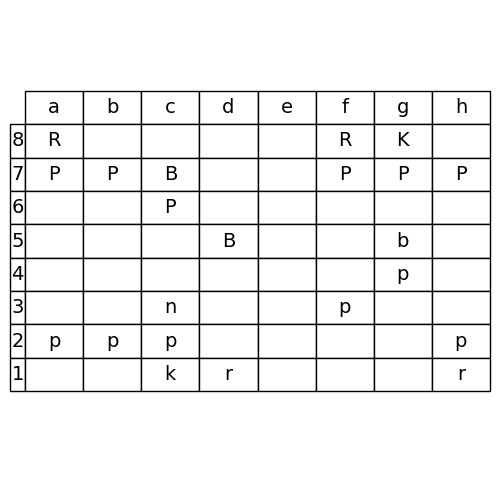

Batch: 134
Idx 268


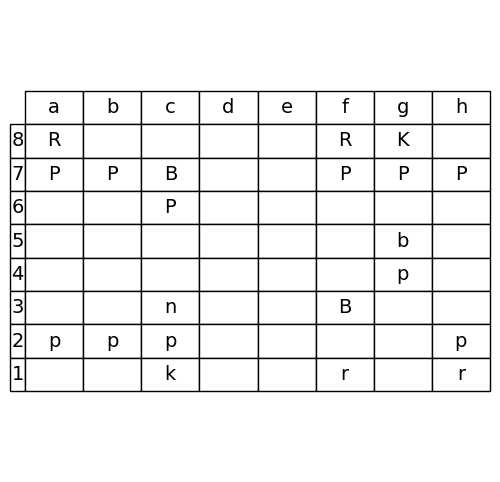

Next of batch 134
Idx 269


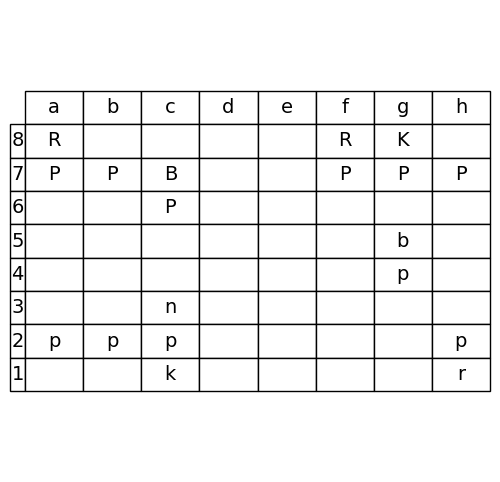

Batch: 135
Idx 270


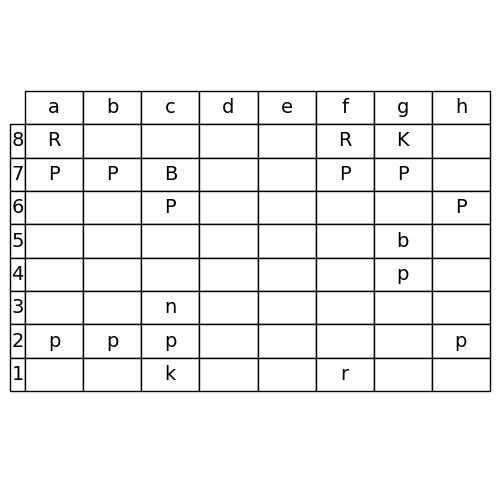

Next of batch 135
Idx 271


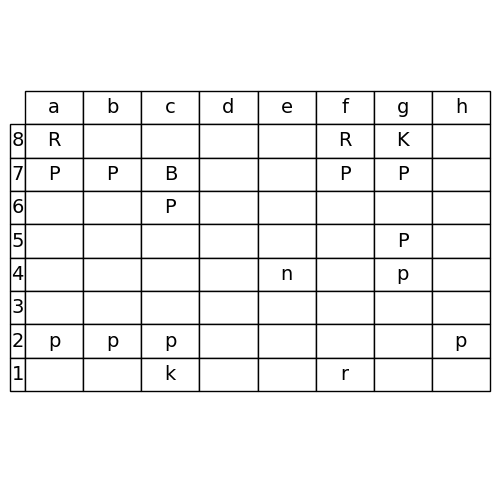

Batch: 136
Idx 272


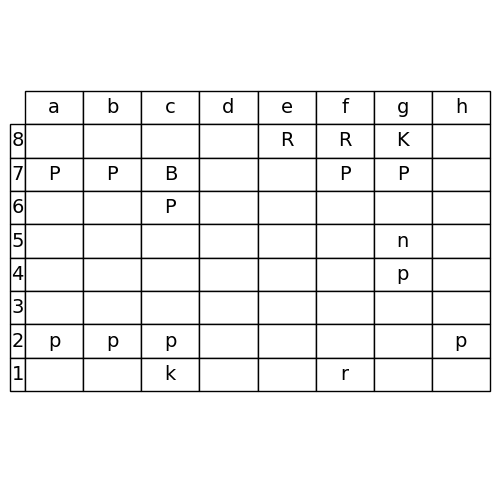

Next of batch 136
Idx 273


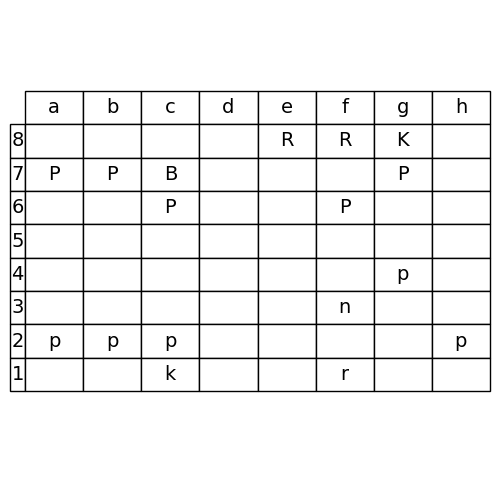

Batch: 137
Idx 274


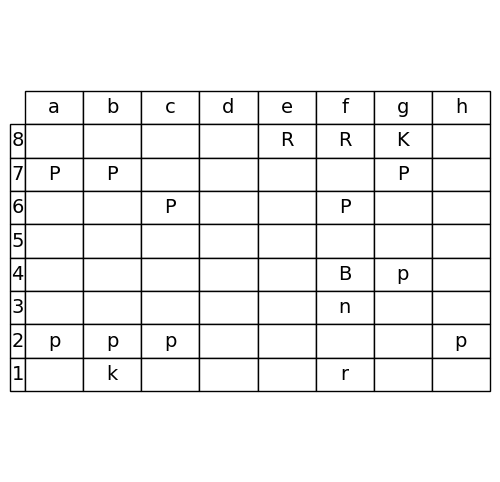

Next of batch 137
Idx 275


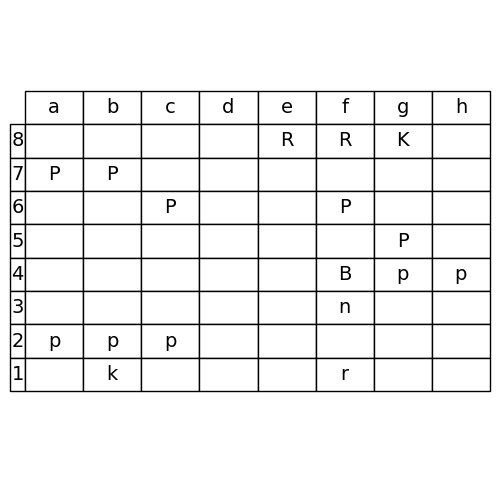

Batch: 138
Idx 276


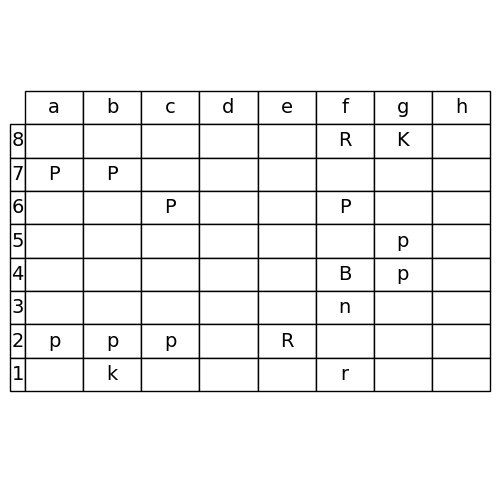

Next of batch 138
Idx 277


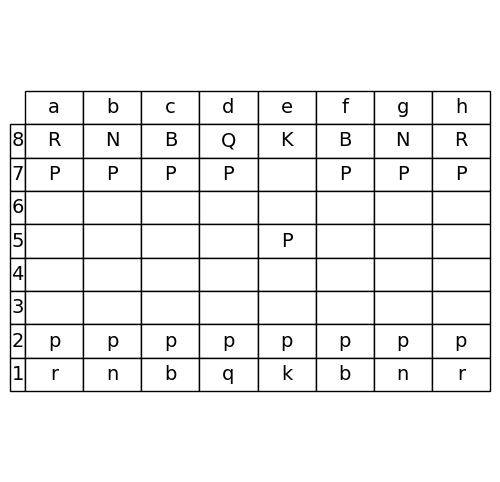

Batch: 139
Idx 278


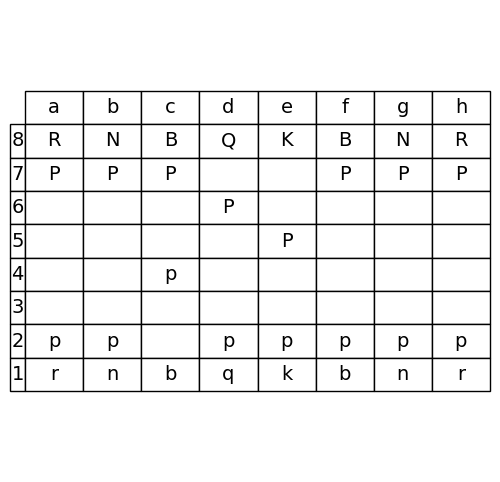

Next of batch 139
Idx 279


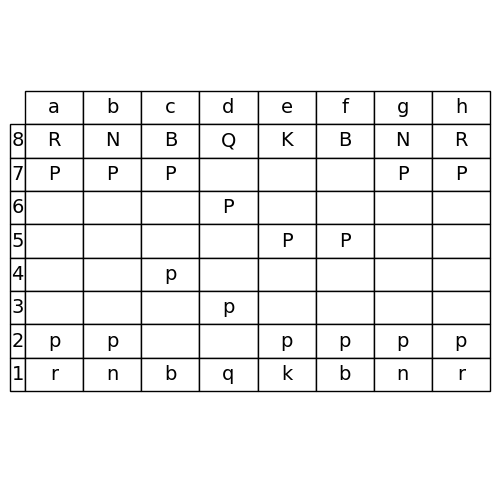

Batch: 140
Idx 280


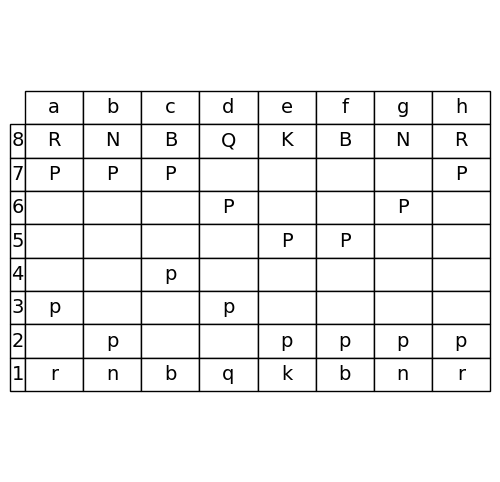

Next of batch 140
Idx 281


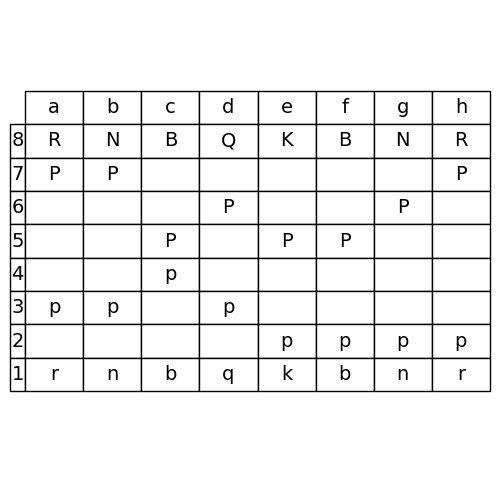

Batch: 141
Idx 282


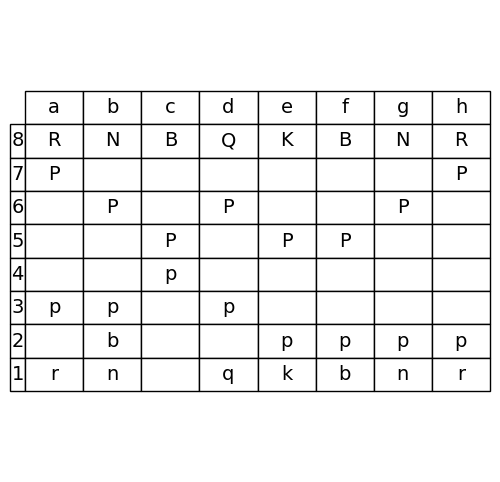

Next of batch 141
Idx 283


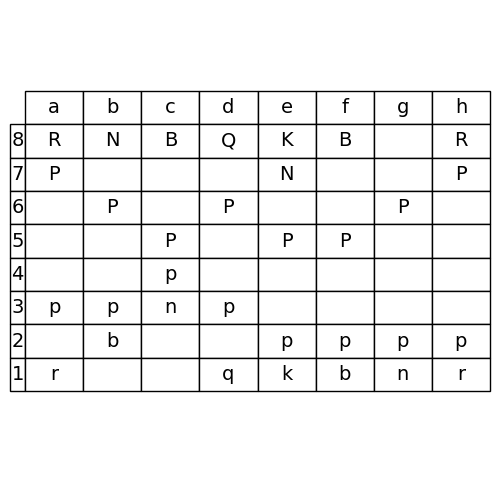

Batch: 142
Idx 284


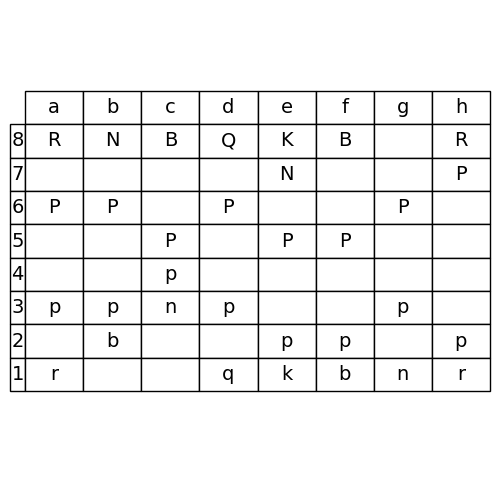

Next of batch 142
Idx 285


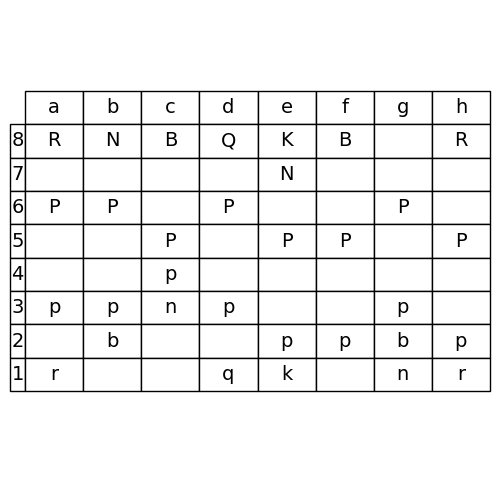

Batch: 143
Idx 286


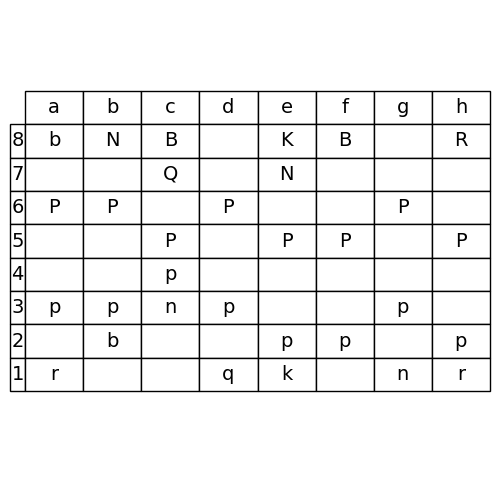

Next of batch 143
Idx 287


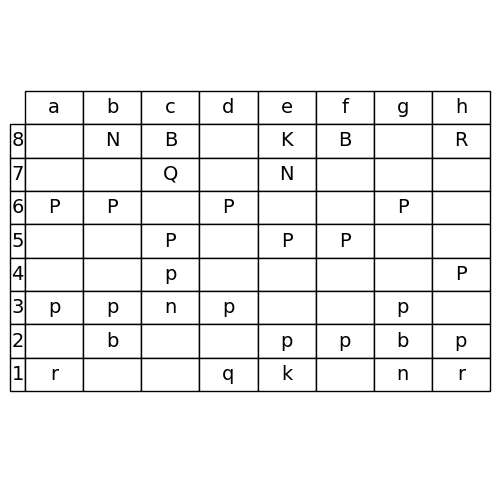

Batch: 144
Idx 288


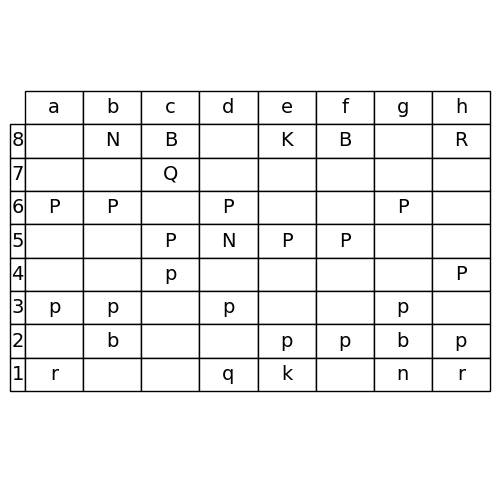

Next of batch 144
Idx 289


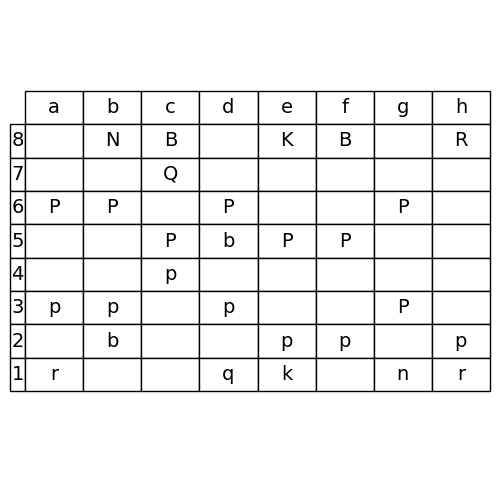

Batch: 145
Idx 290


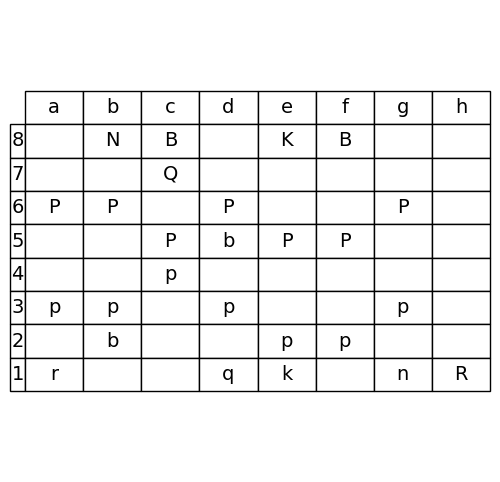

Next of batch 145
Idx 291


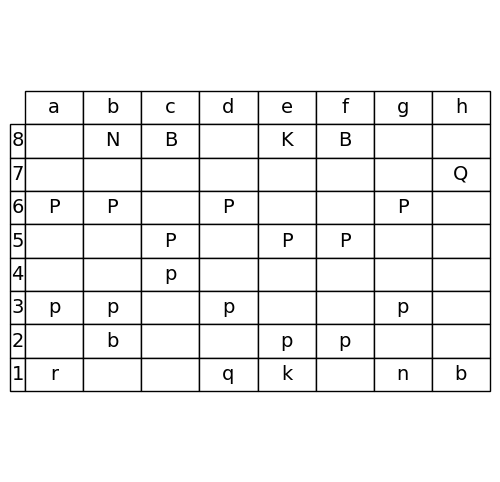

Batch: 146
Idx 292


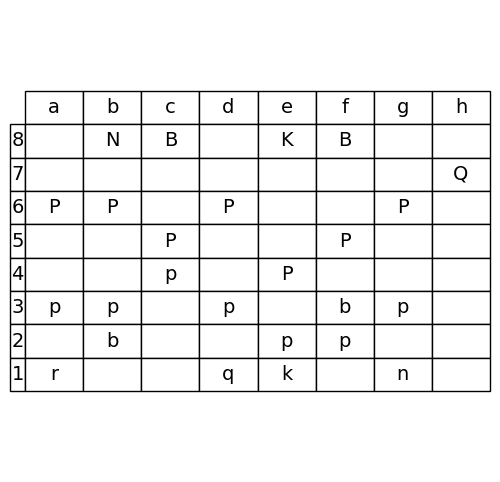

Next of batch 146
Idx 293


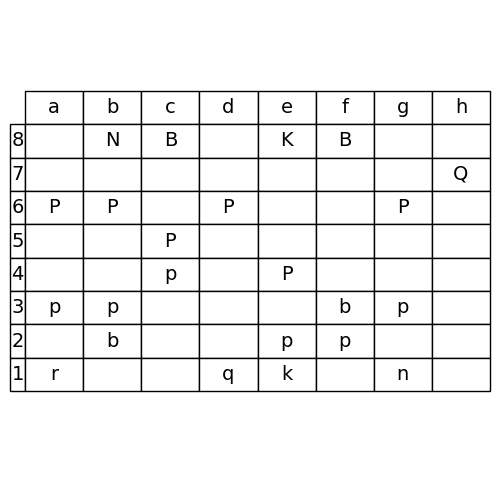

Batch: 147
Idx 294


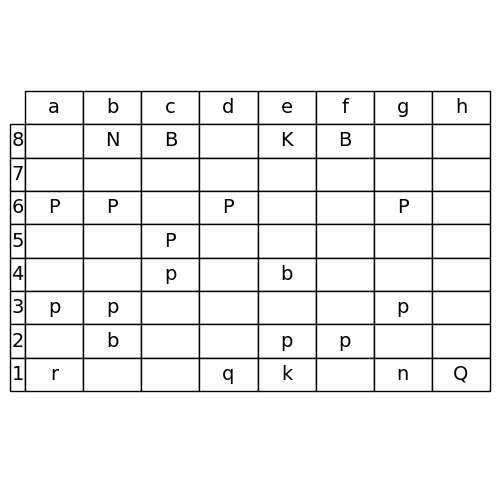

Next of batch 147
Idx 295


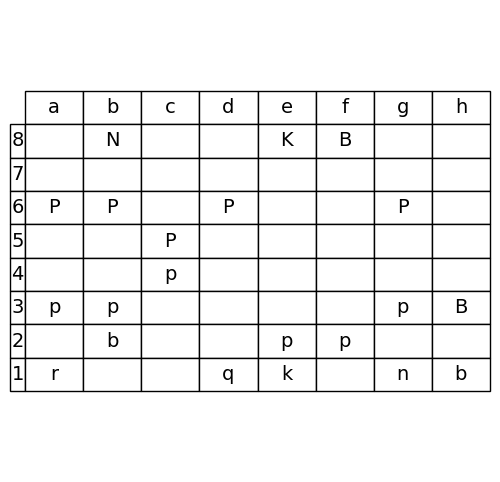

Batch: 148
Idx 296


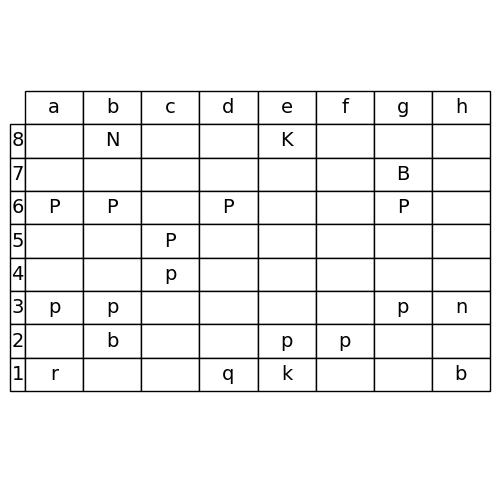

Next of batch 148
Idx 297


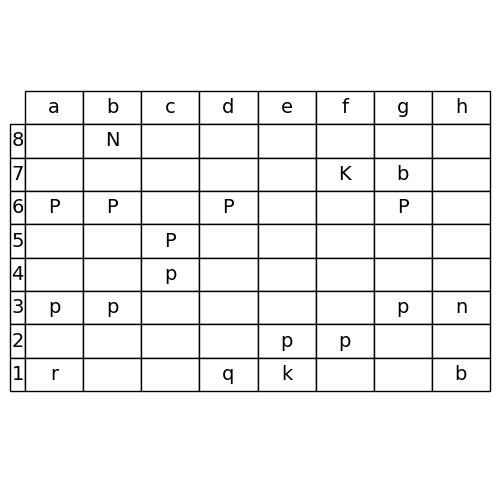

Batch: 149
Idx 298


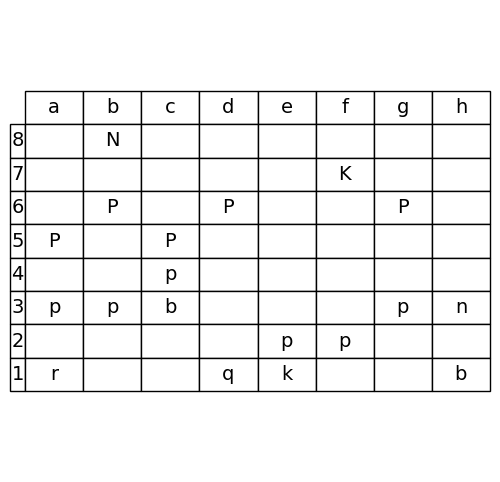

Next of batch 149
Idx 299


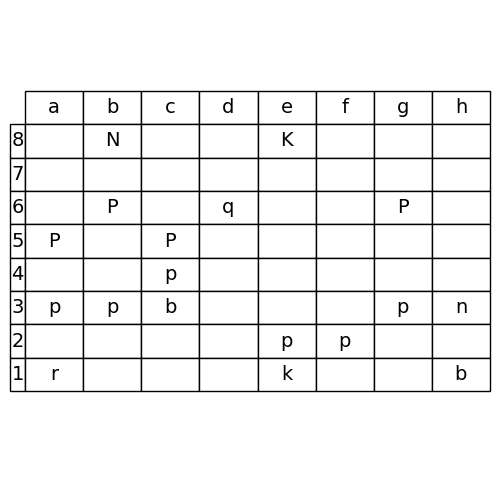

Batch: 150
Idx 300


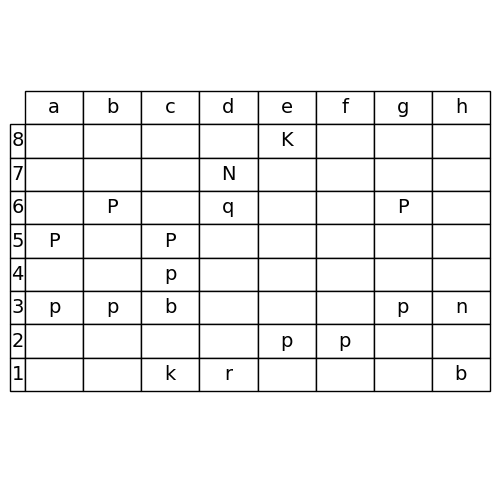

Next of batch 150
Idx 301


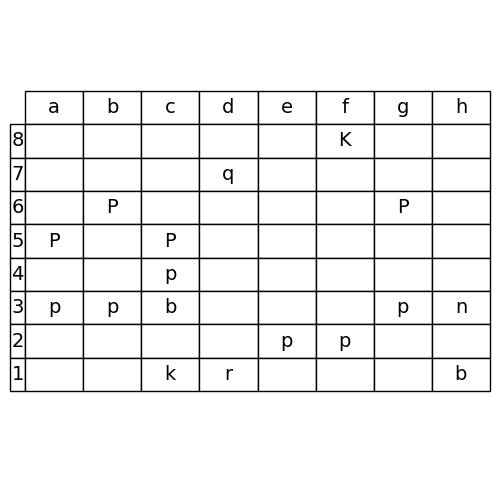

Batch: 151
Idx 302


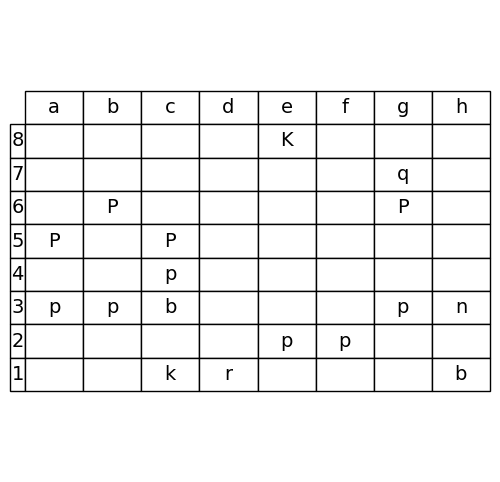

Next of batch 151
Idx 303


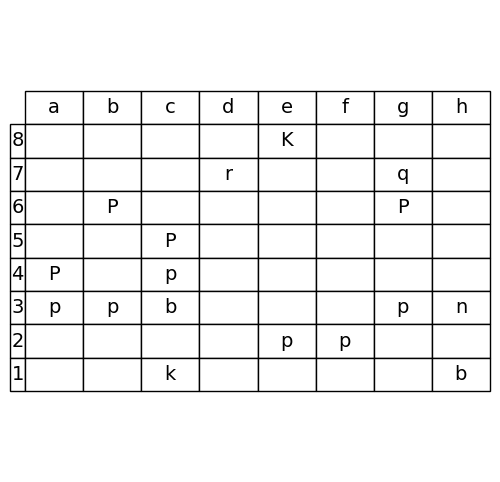

Batch: 152
Idx 304


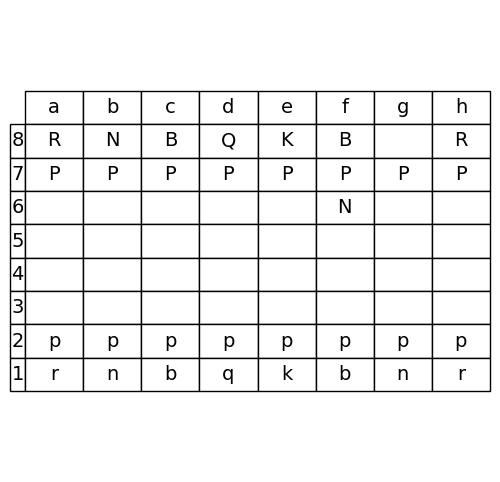

Next of batch 152
Idx 305


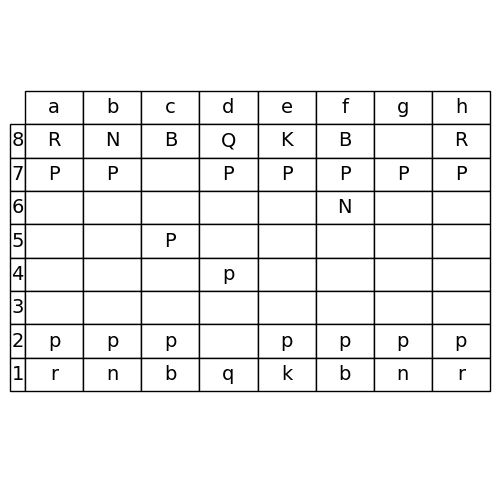

Batch: 153
Idx 306


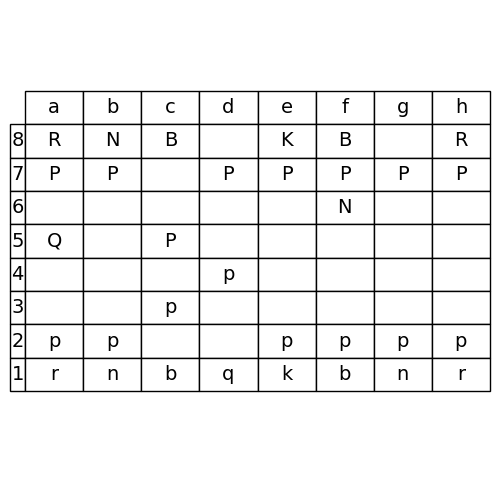

Next of batch 153
Idx 307


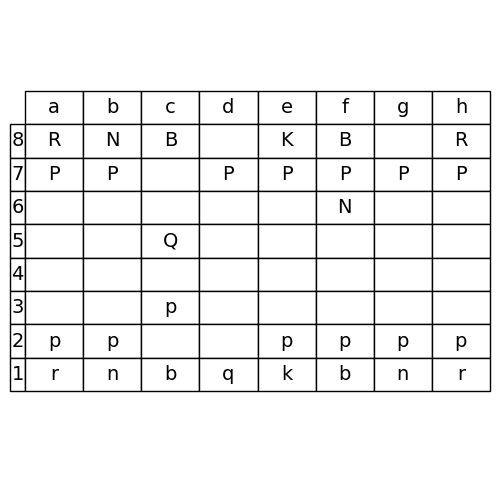

Batch: 154
Idx 308


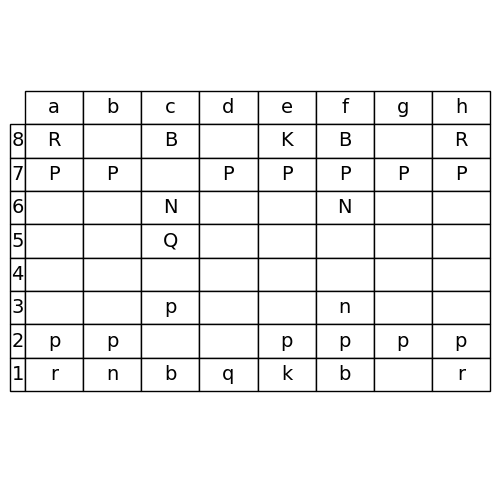

Next of batch 154
Idx 309


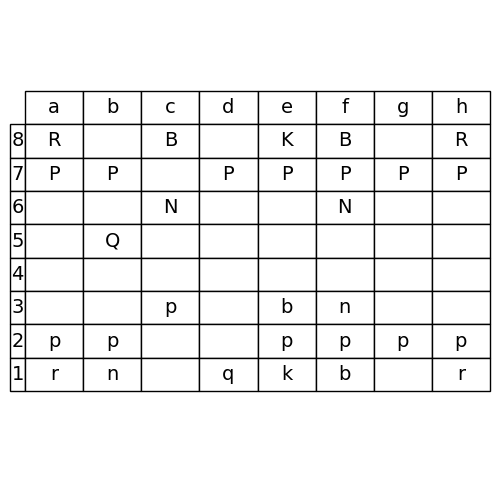

Batch: 155
Idx 310


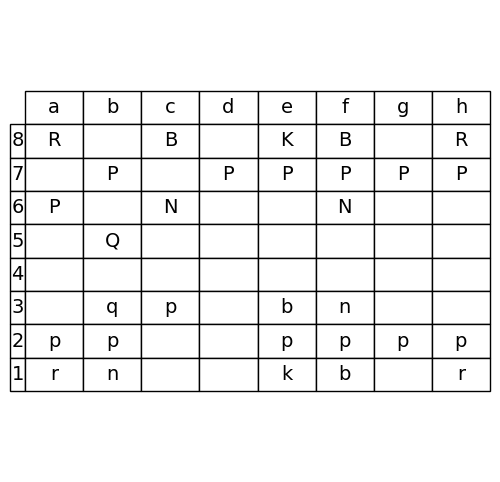

Next of batch 155
Idx 311


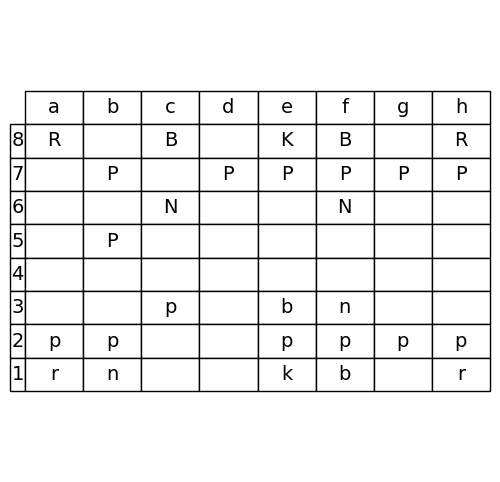

Batch: 156
Idx 312


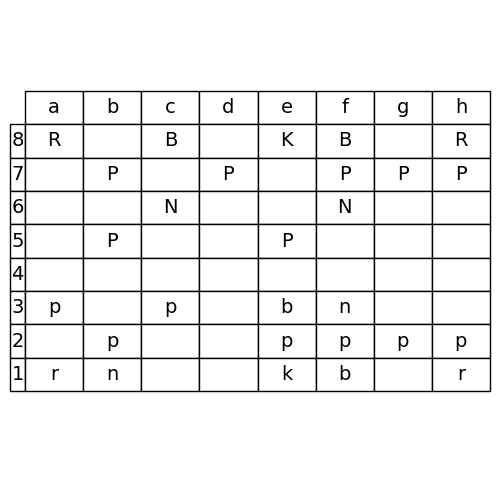

Next of batch 156
Idx 313


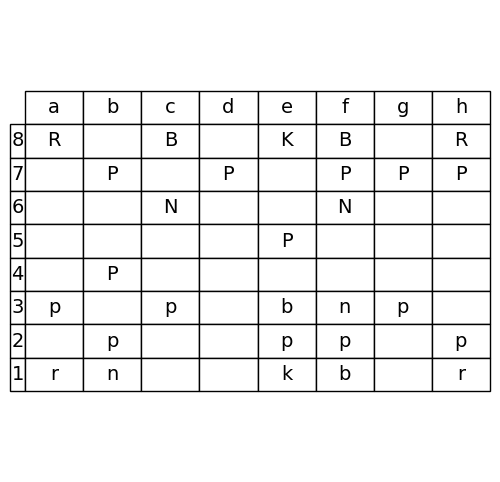

Batch: 157
Idx 314


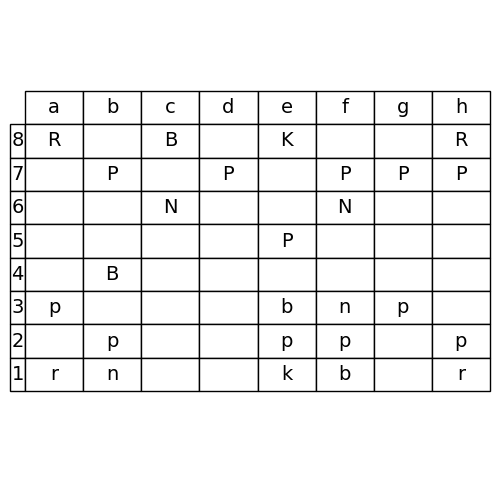

Next of batch 157
Idx 315


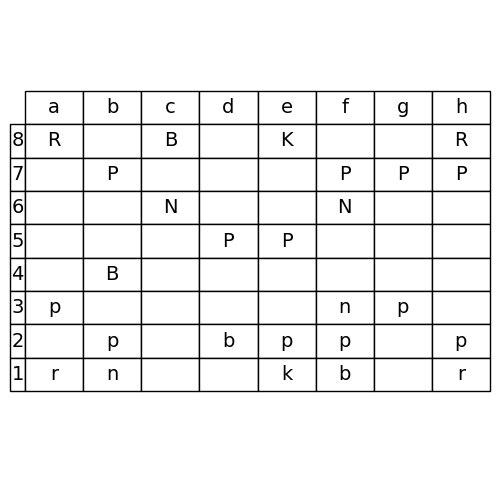

Batch: 158
Idx 316


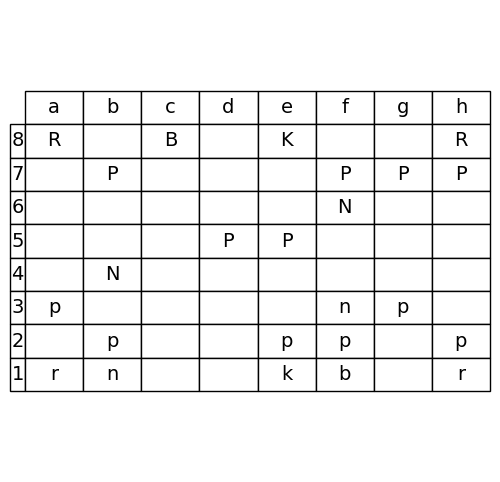

Next of batch 158
Idx 317


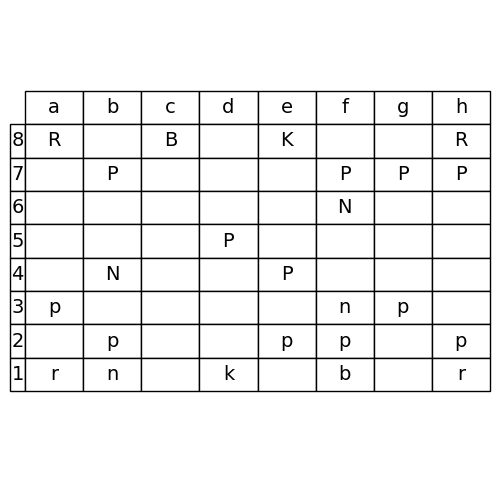

Batch: 159
Idx 318


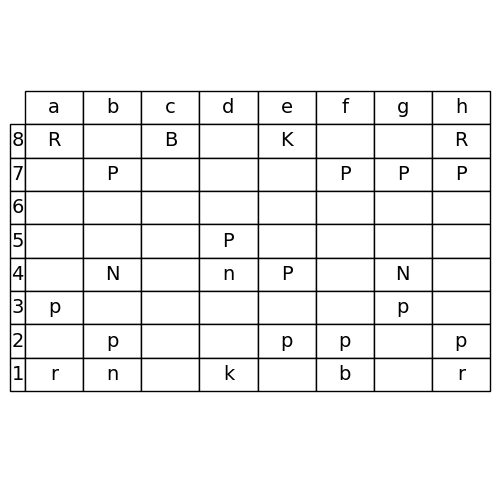

Next of batch 159
Idx 319


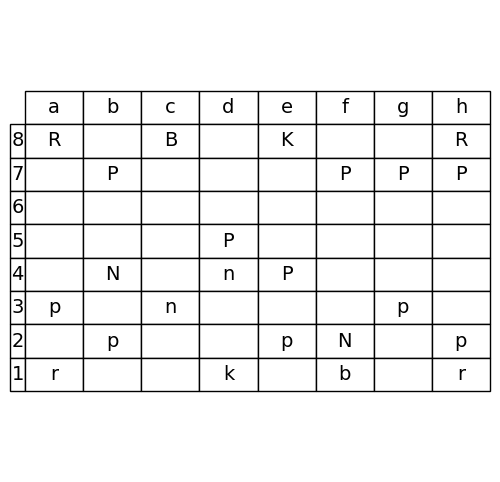

Batch: 160
Idx 320


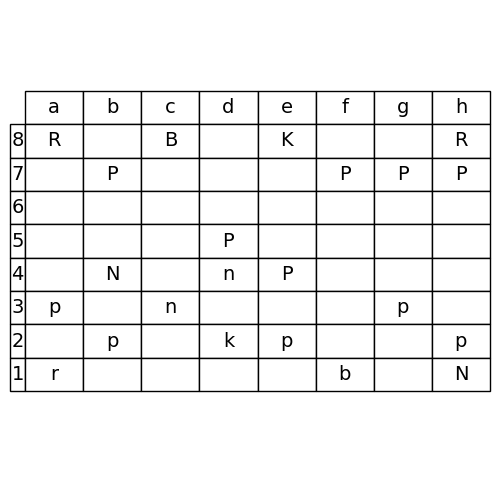

Next of batch 160
Idx 321


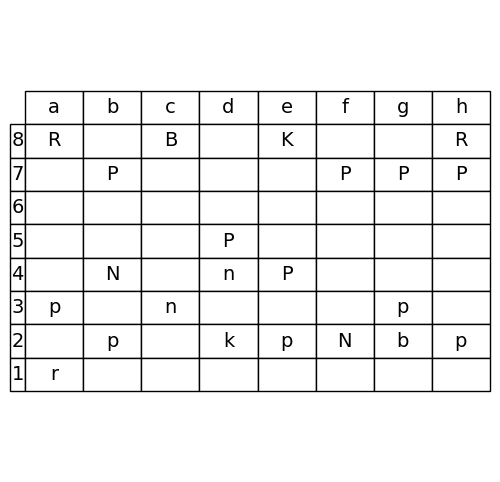

Batch: 161
Idx 322


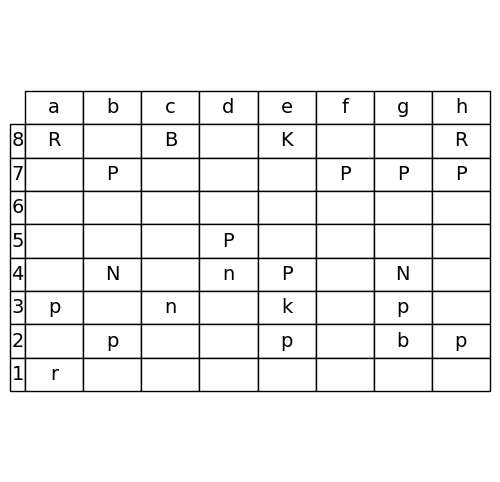

Next of batch 161
Idx 323


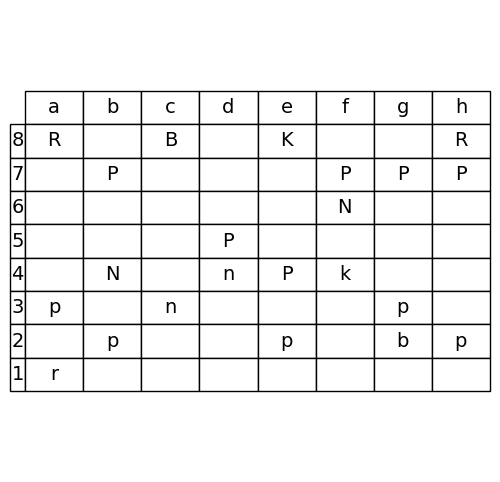

Batch: 162
Idx 324


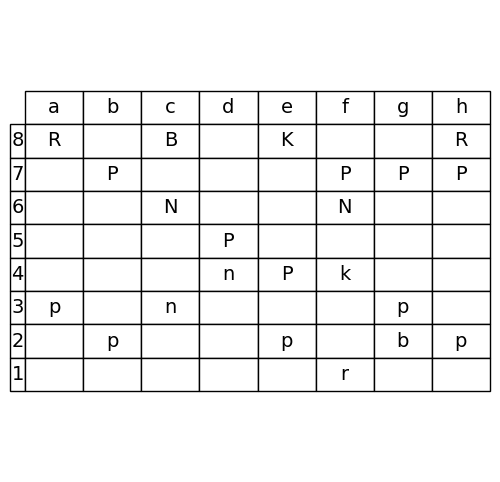

Next of batch 162
Idx 325


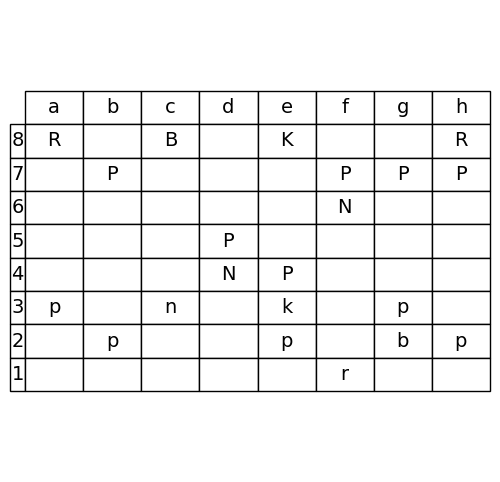

Batch: 163
Idx 326


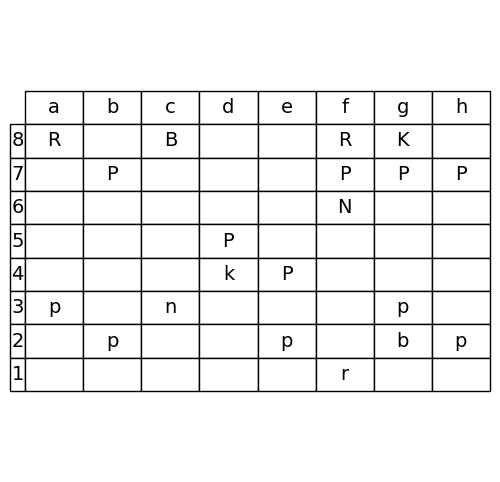

Next of batch 163
Idx 327


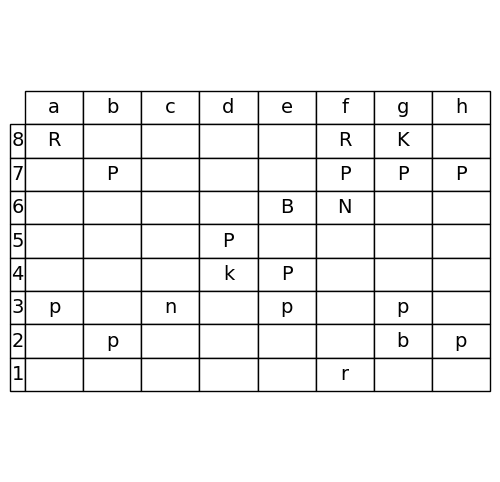

Batch: 164
Idx 328


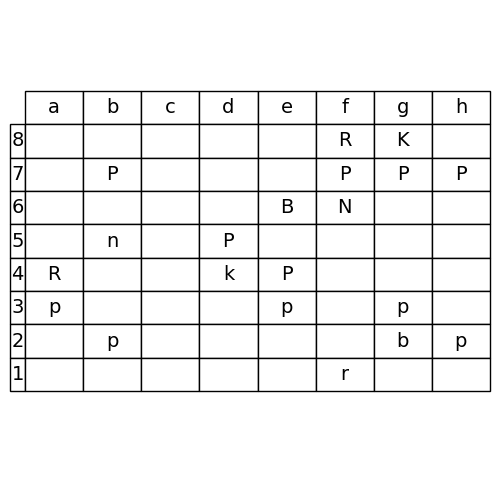

Next of batch 164
Idx 329


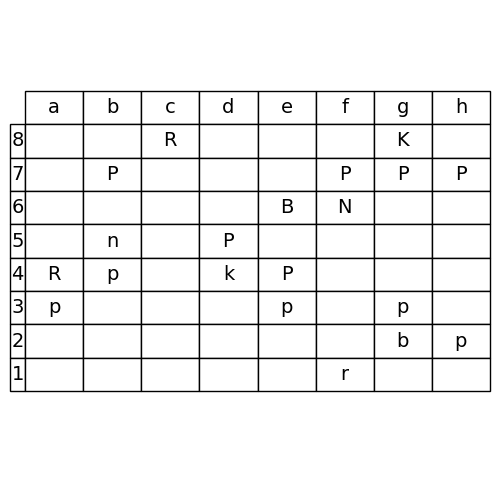

Batch: 165
Idx 330


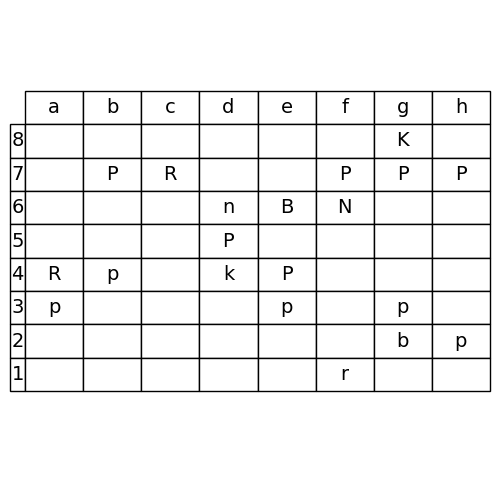

Next of batch 165
Idx 331


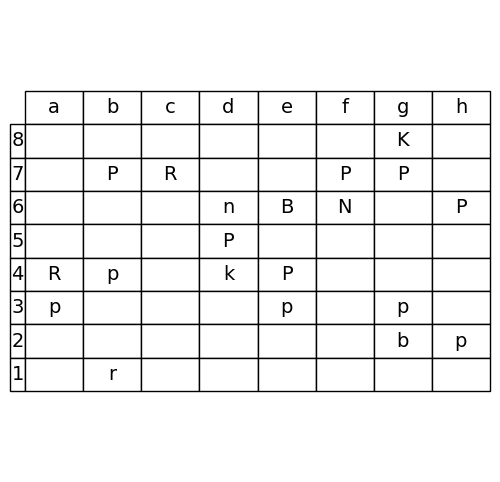

Batch: 166
Idx 332


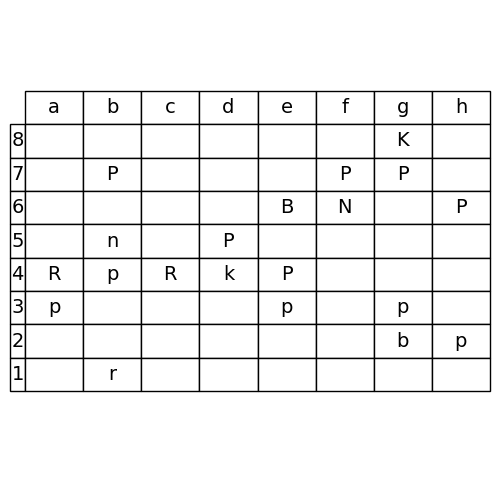

Next of batch 166
Idx 333


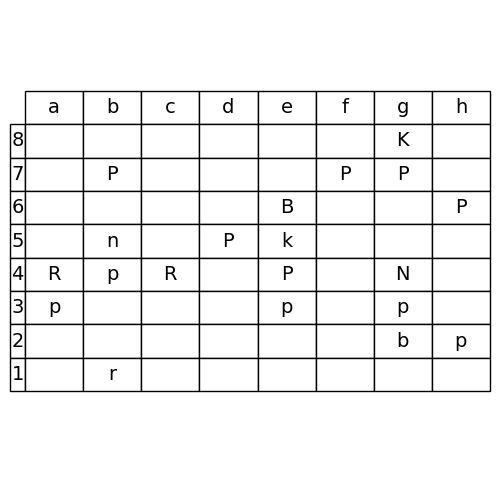

Batch: 167
Idx 334


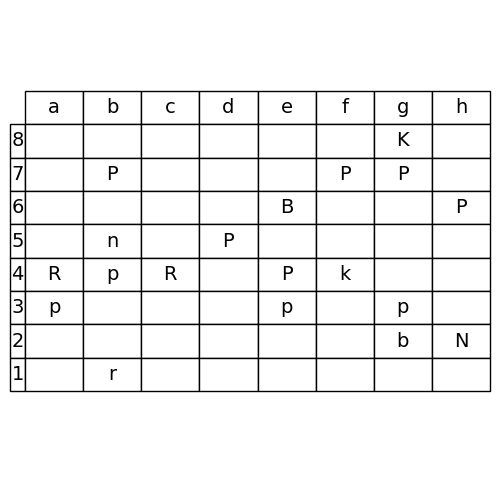

Next of batch 167
Idx 335


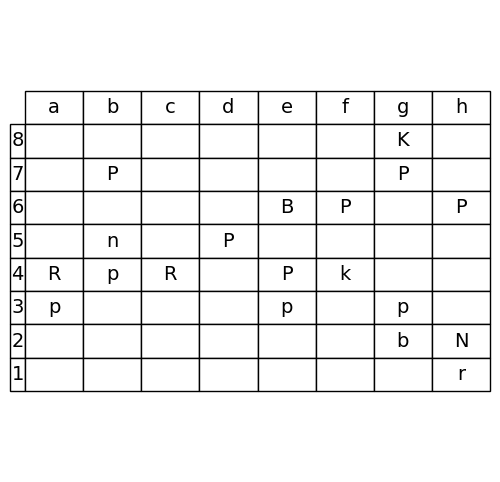

Batch: 168
Idx 336


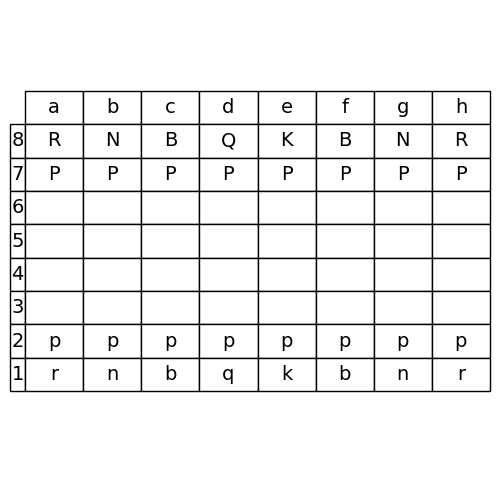

Next of batch 168
Idx 337


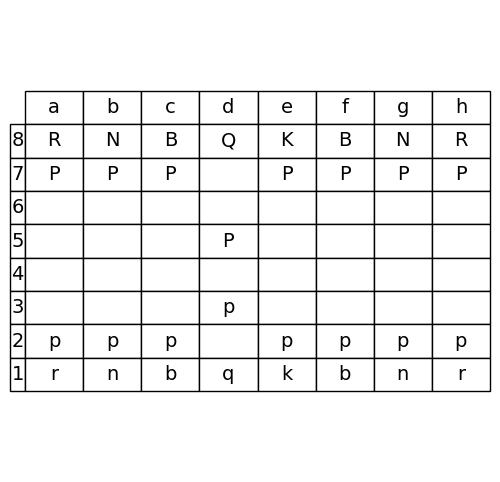

Batch: 169
Idx 338


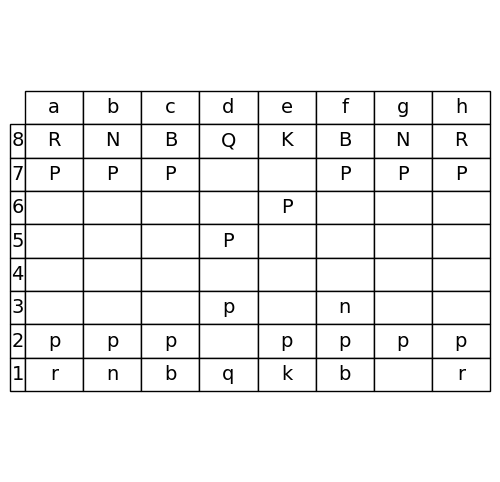

Next of batch 169
Idx 339


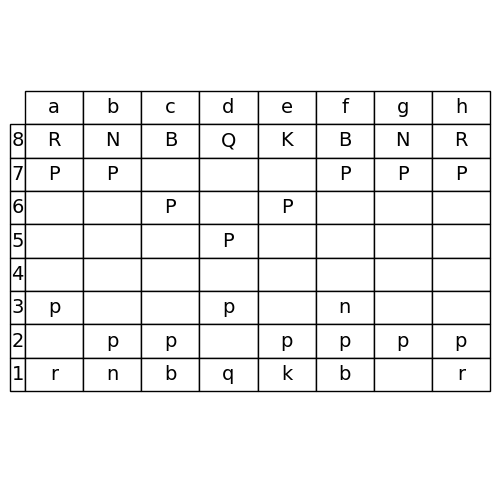

Batch: 170
Idx 340


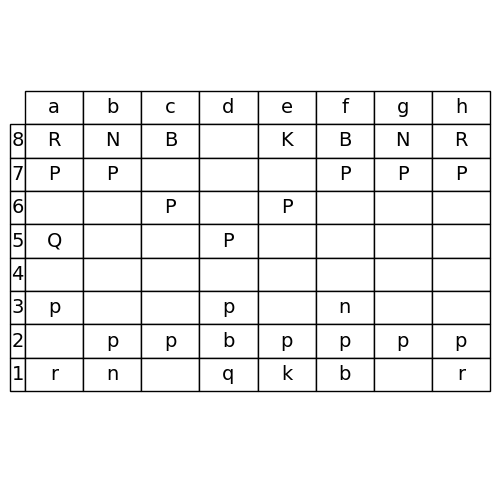

Next of batch 170
Idx 341


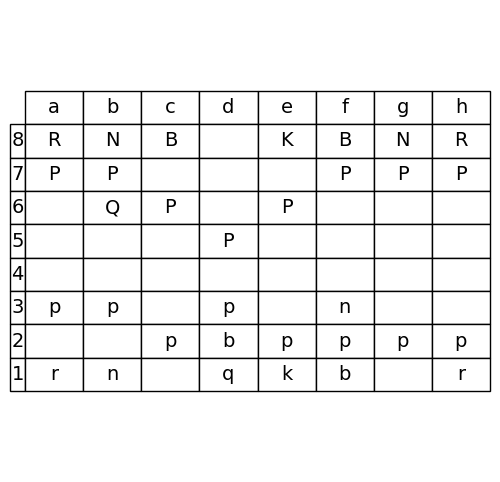

Batch: 171
Idx 342


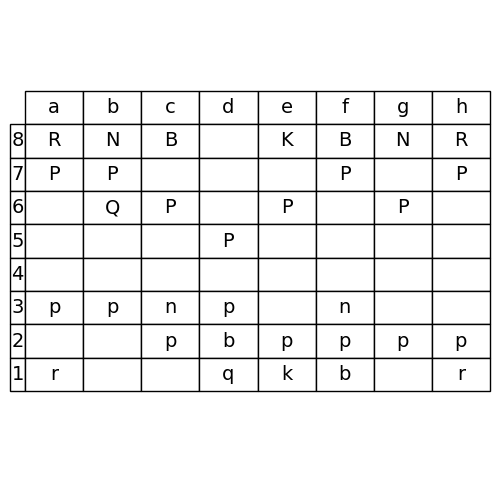

Next of batch 171
Idx 343


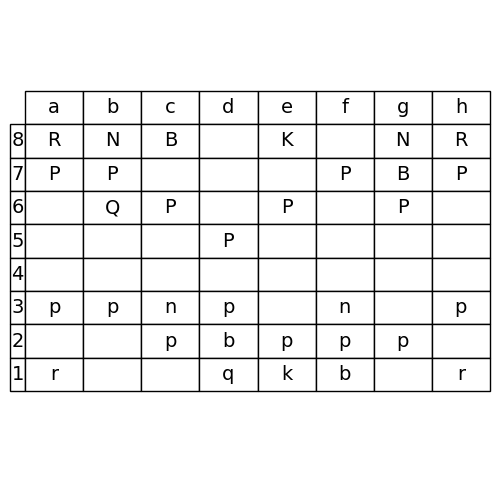

Batch: 172
Idx 344


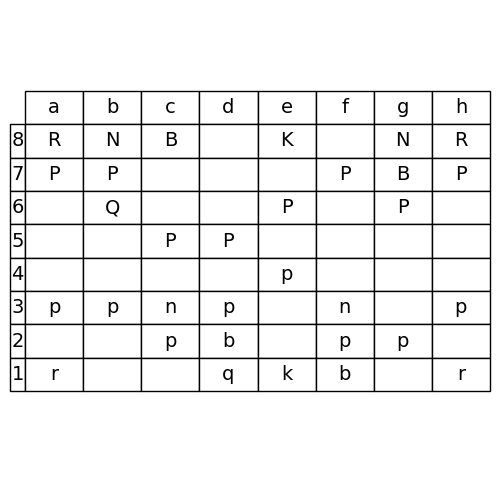

Next of batch 172
Idx 345


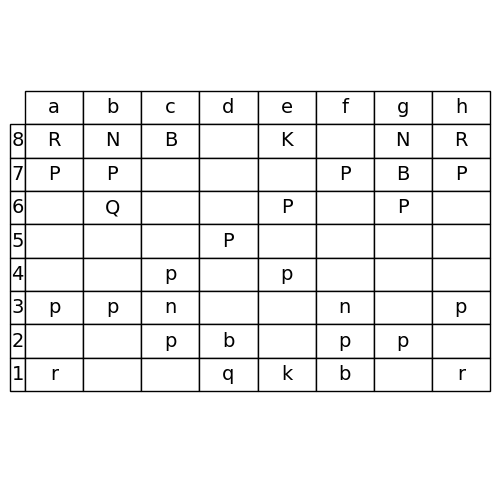

Batch: 173
Idx 346


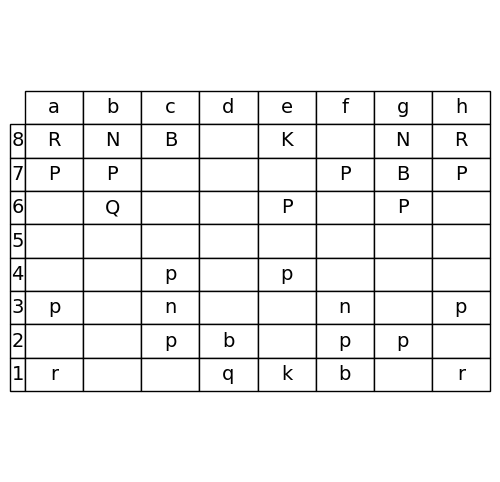

Next of batch 173
Idx 347


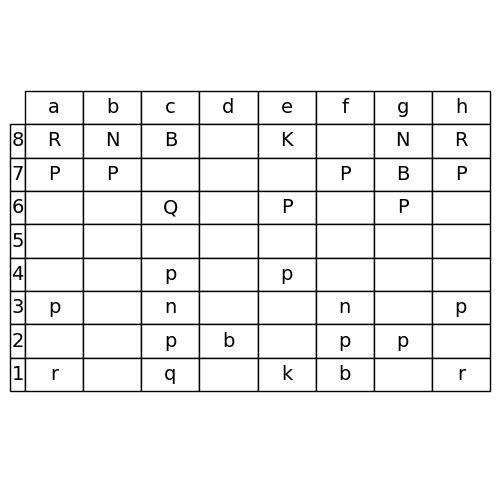

Batch: 174
Idx 348


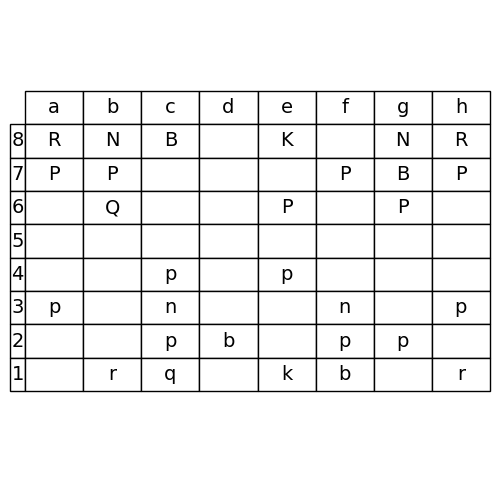

Next of batch 174
Idx 349


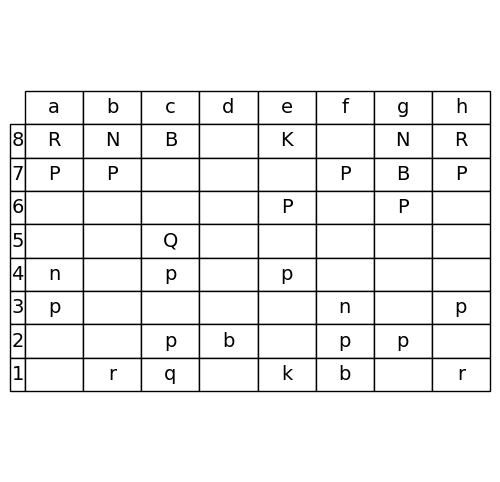

Batch: 175
Idx 350


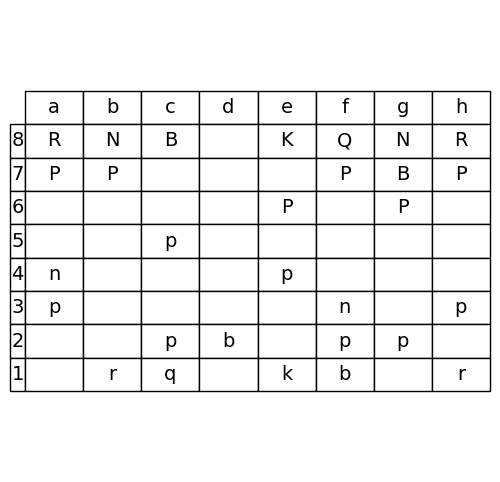

Next of batch 175
Idx 351


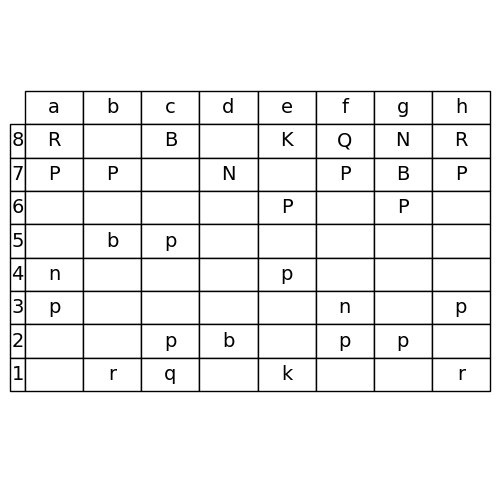

Batch: 176
Idx 352


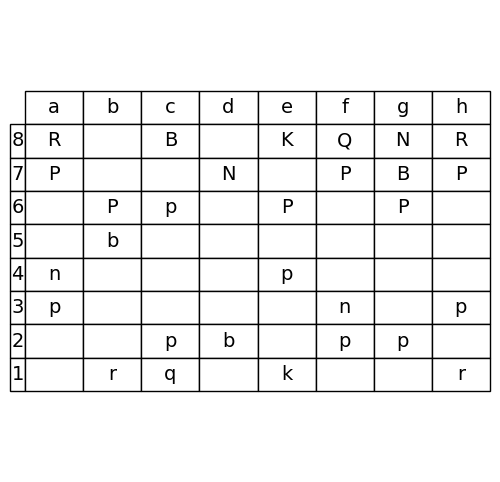

Next of batch 176
Idx 353


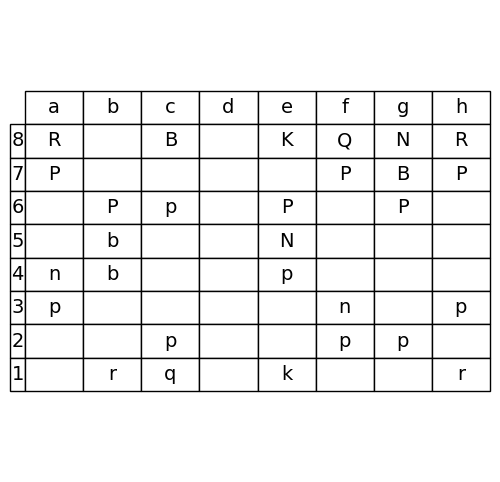

Batch: 177
Idx 354


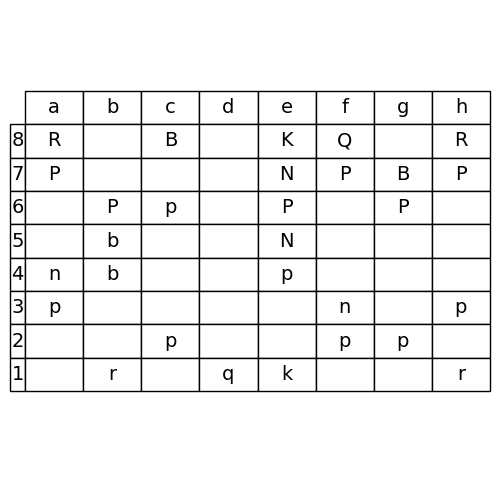

Next of batch 177
Idx 355


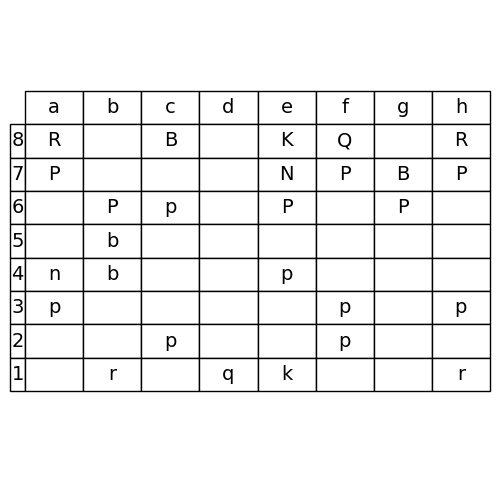

Batch: 178
Idx 356


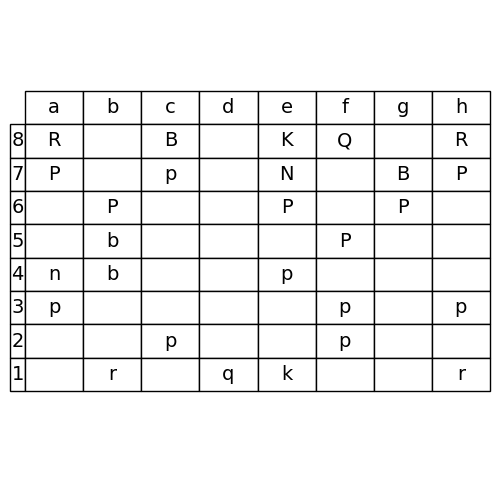

Next of batch 178
Idx 357


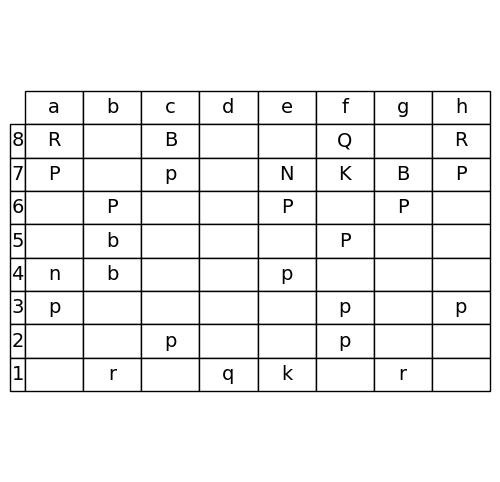

Batch: 179
Idx 358


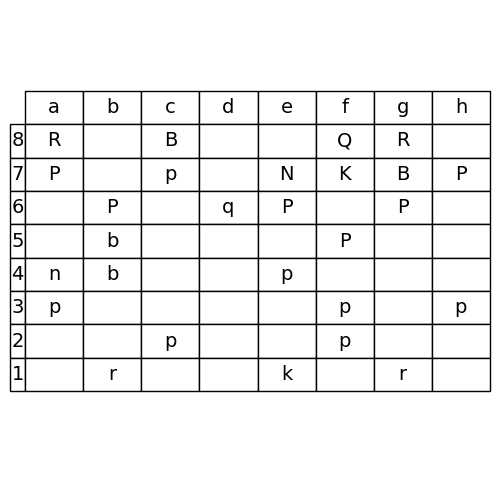

Next of batch 179
Idx 359


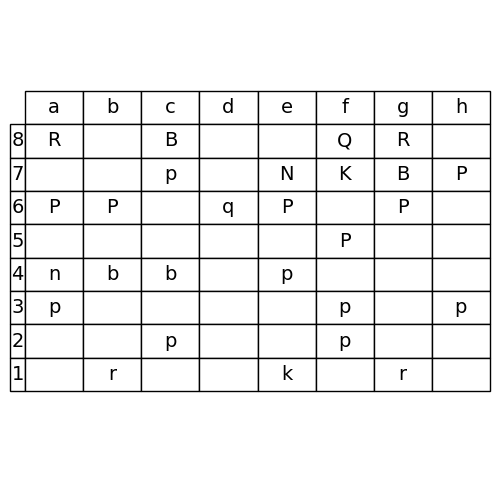

Batch: 180
Idx 360


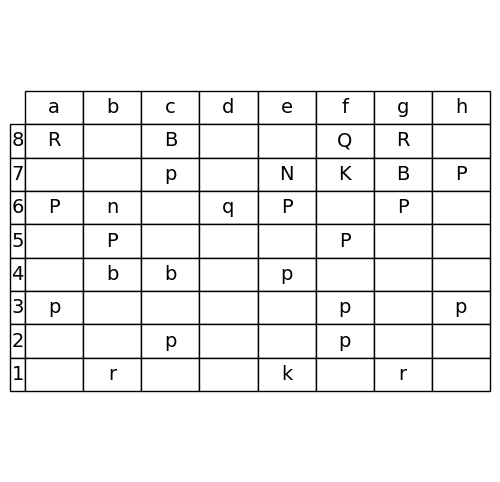

Next of batch 180
Idx 361


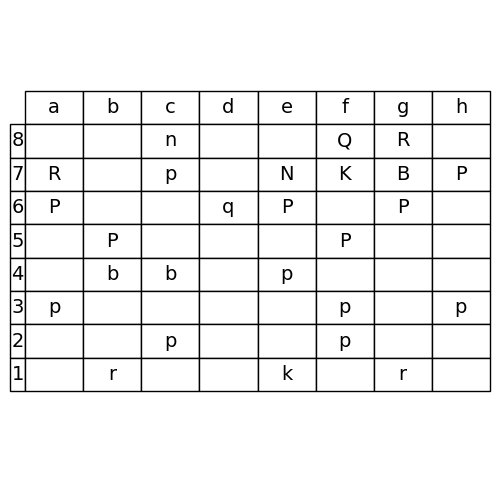

Batch: 181
Idx 362


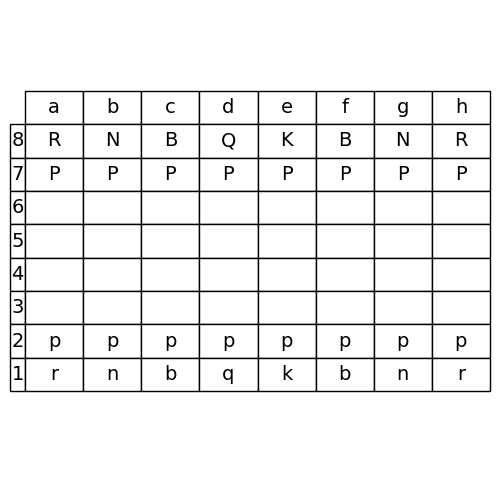

Next of batch 181
Idx 363


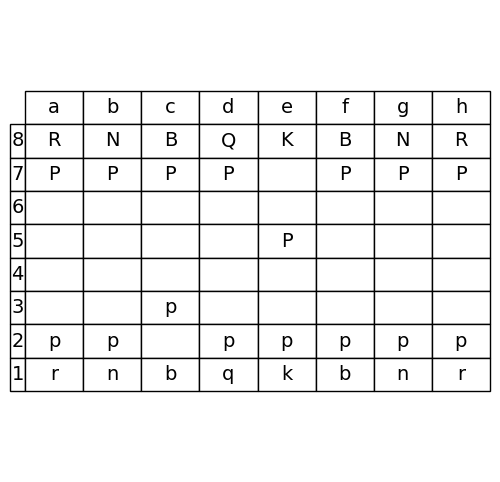

Batch: 182
Idx 364


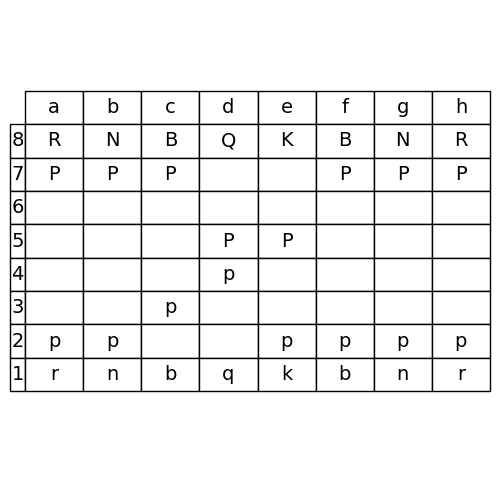

Next of batch 182
Idx 365


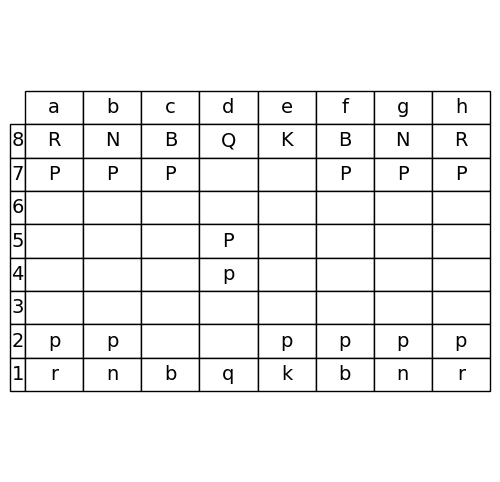

Batch: 183
Idx 366


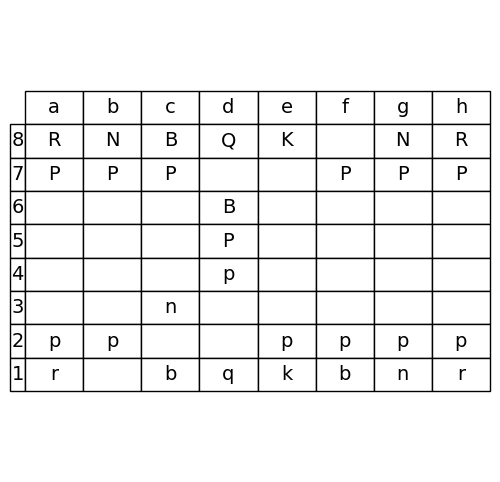

Next of batch 183
Idx 367


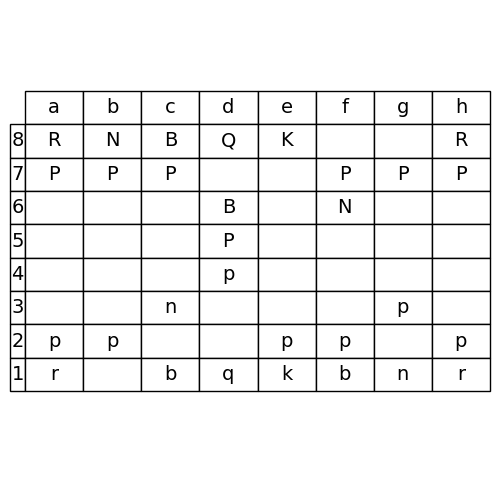

Batch: 184
Idx 368


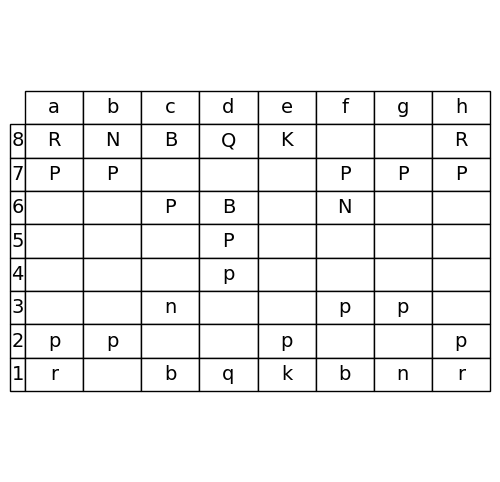

Next of batch 184
Idx 369


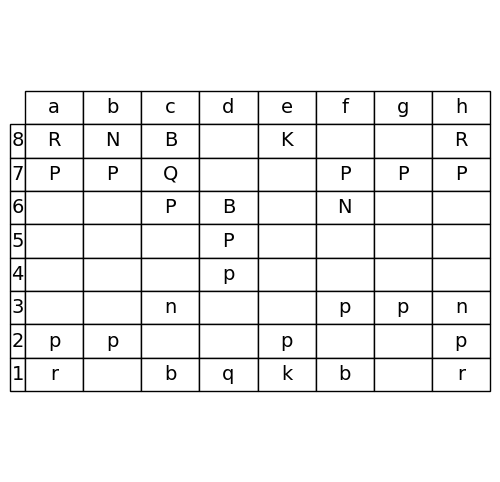

Batch: 185
Idx 370


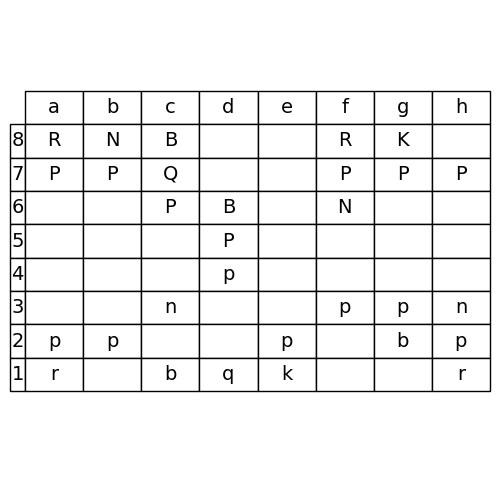

Next of batch 185
Idx 371


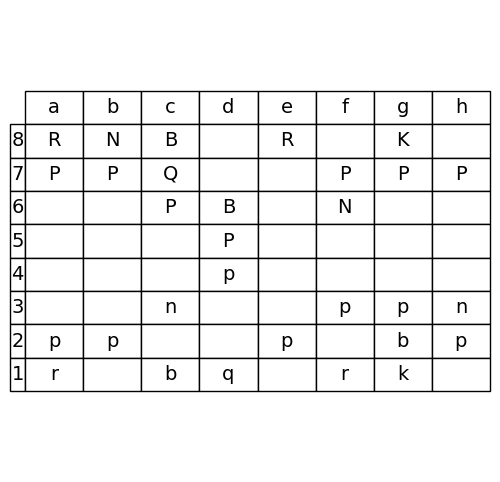

Batch: 186
Idx 372


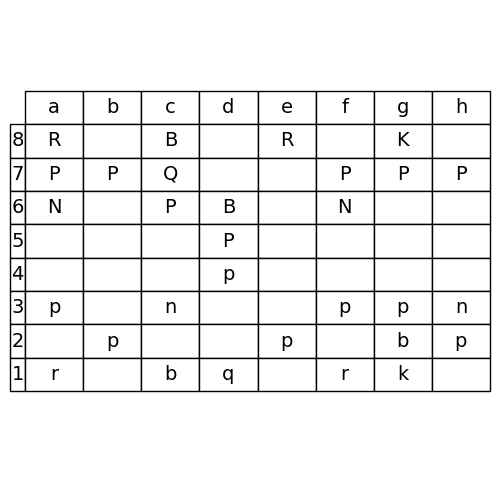

Next of batch 186
Idx 373


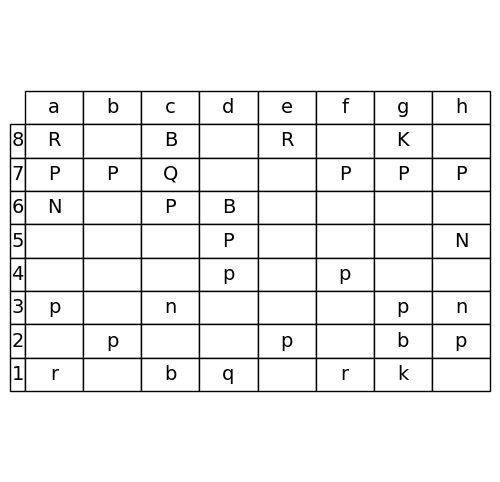

Batch: 187
Idx 374


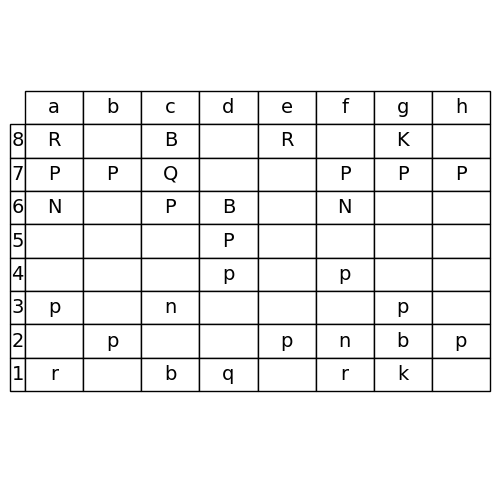

Next of batch 187
Idx 375


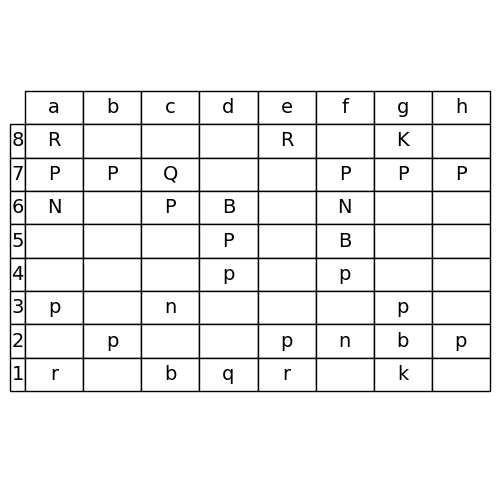

Batch: 188
Idx 376


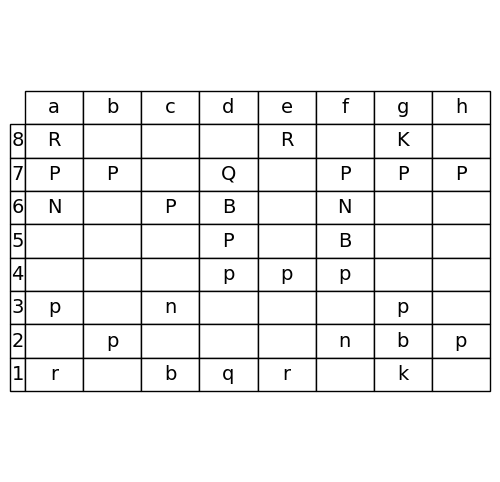

Next of batch 188
Idx 377


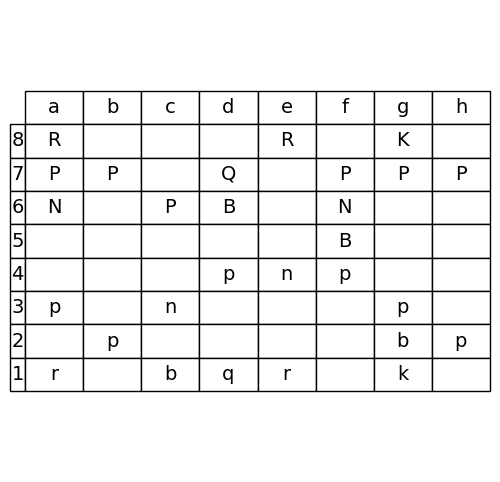

Batch: 189
Idx 378


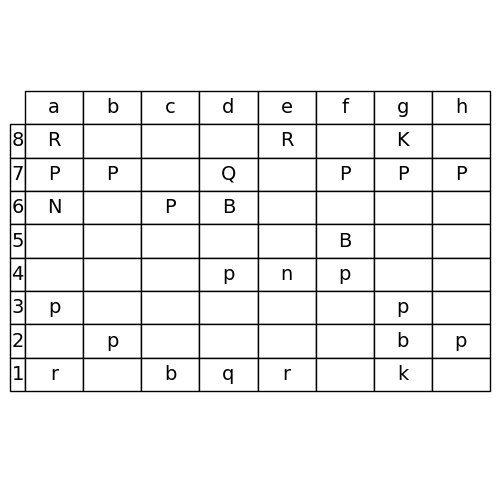

Next of batch 189
Idx 379


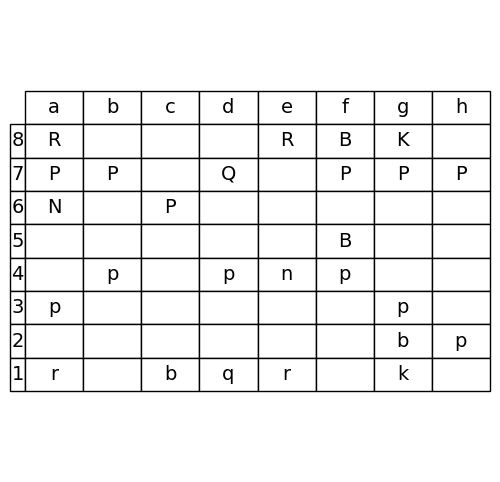

Batch: 190
Idx 380


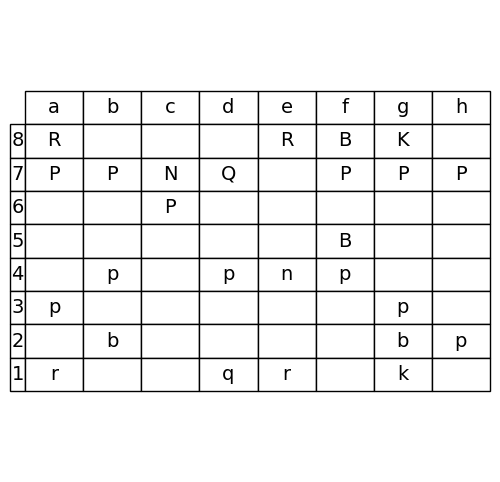

Next of batch 190
Idx 381


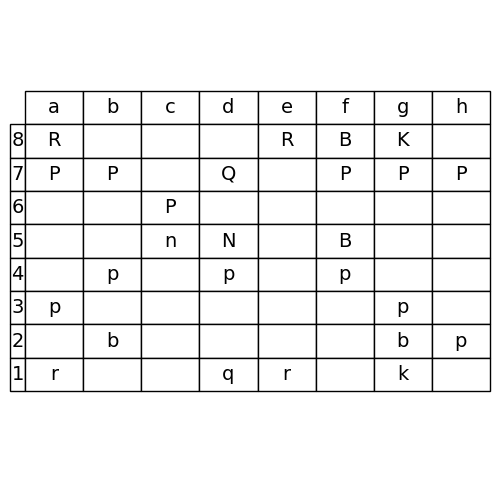

Batch: 191
Idx 382


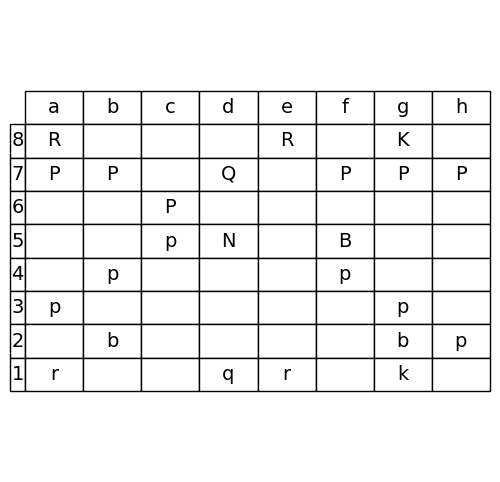

Next of batch 191
Idx 383


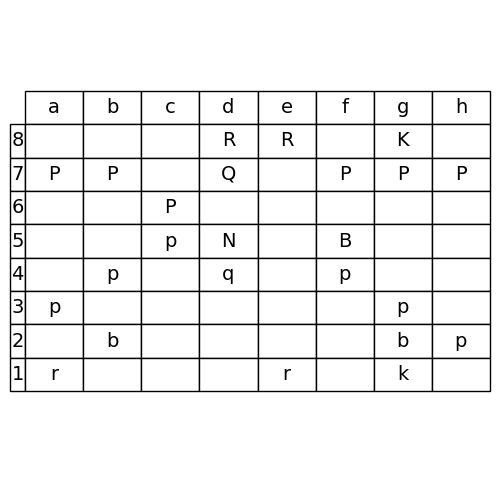

Batch: 192
Idx 384


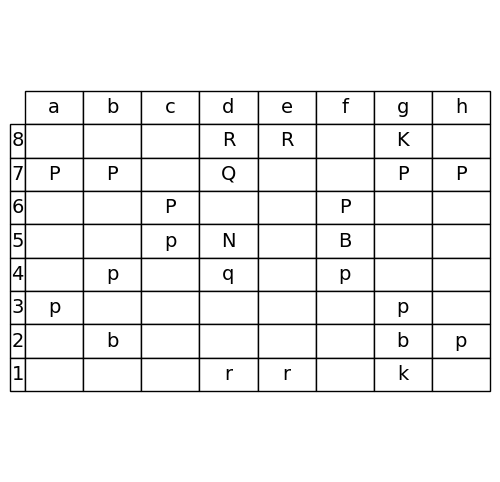

Next of batch 192
Idx 385


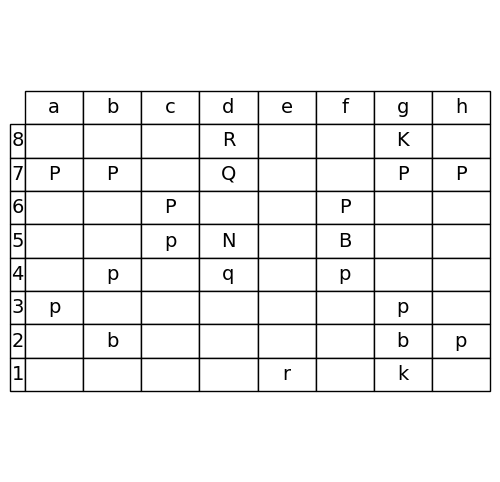

Batch: 193
Idx 386


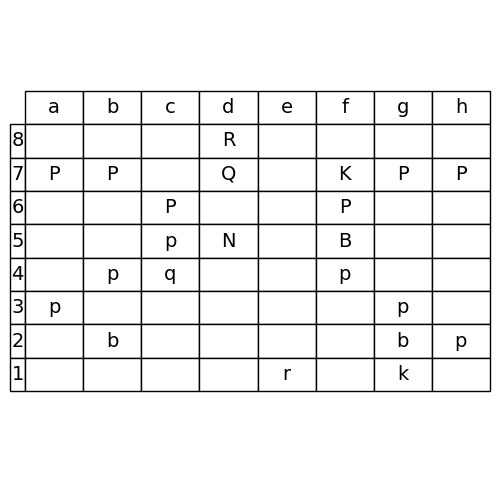

Next of batch 193
Idx 387


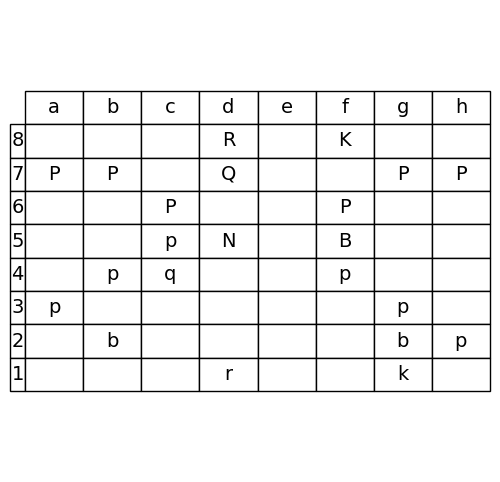

Batch: 194
Idx 388


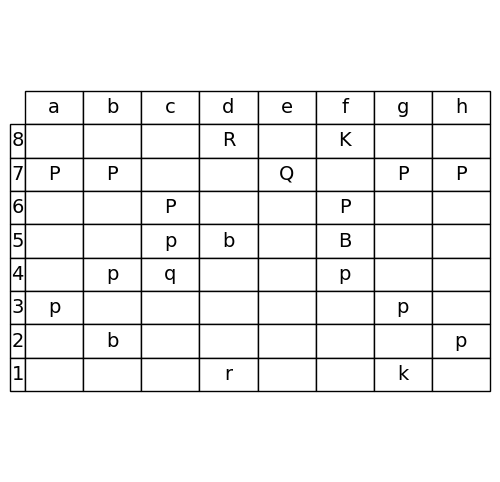

Next of batch 194
Idx 389


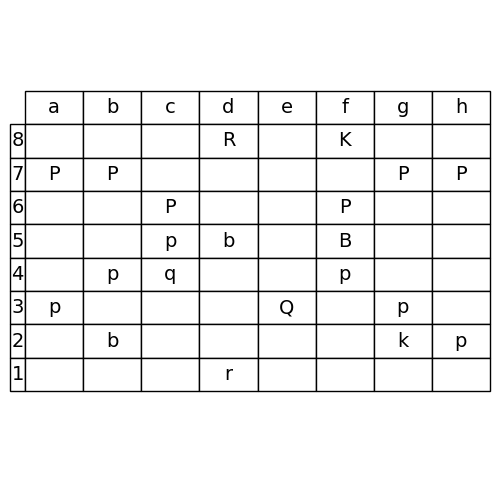

Batch: 195
Idx 390


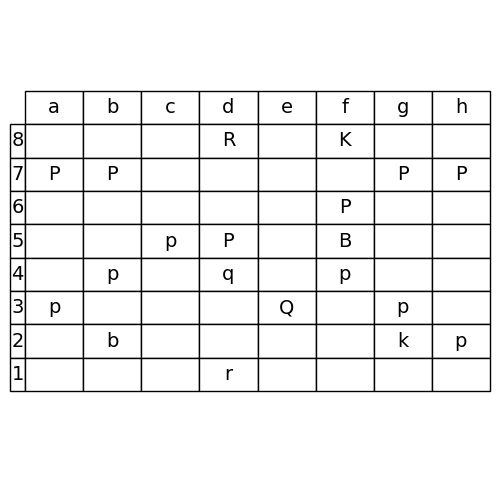

Next of batch 195
Idx 391


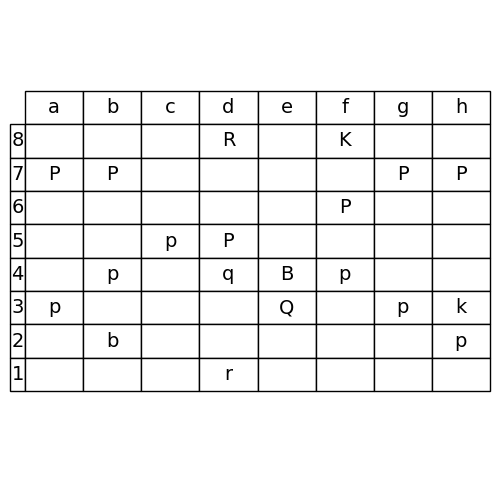

Batch: 196
Idx 392


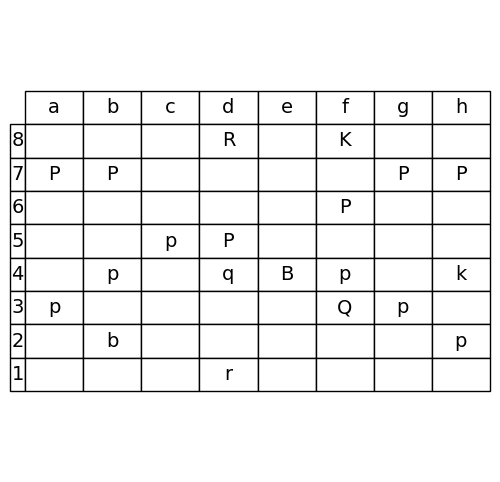

Next of batch 196
Idx 393


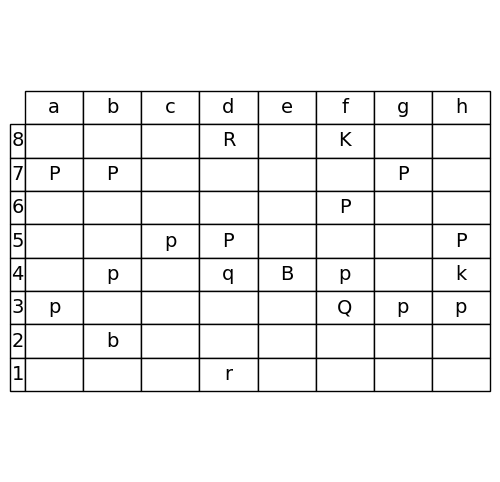

Batch: 197
Idx 394


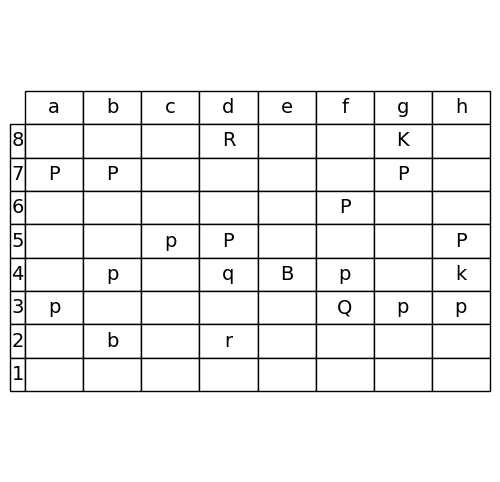

Next of batch 197
Idx 395


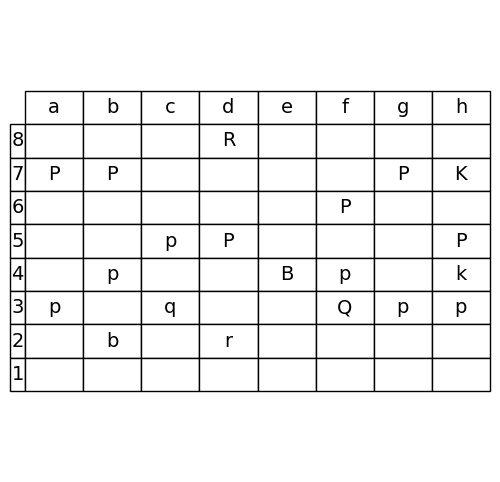

Batch: 198
Idx 396


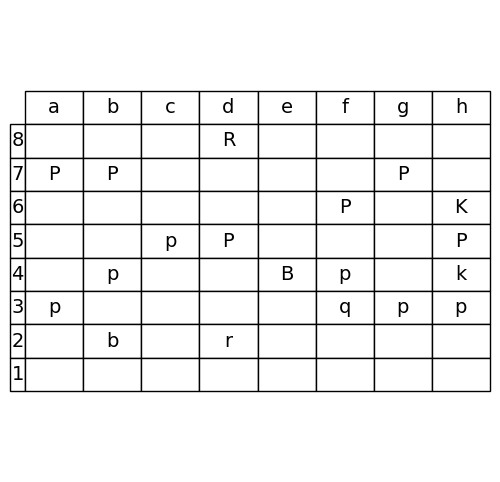

Next of batch 198
Idx 397


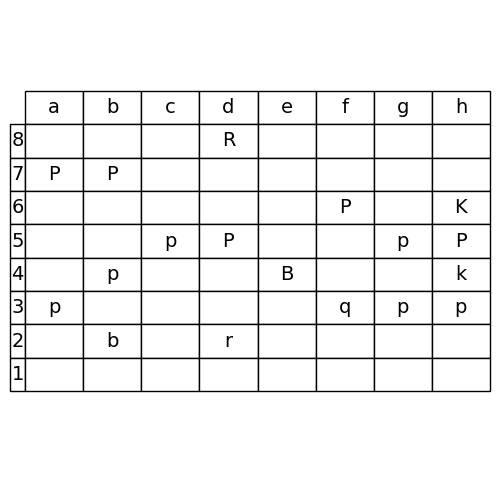

Batch: 199
Idx 398


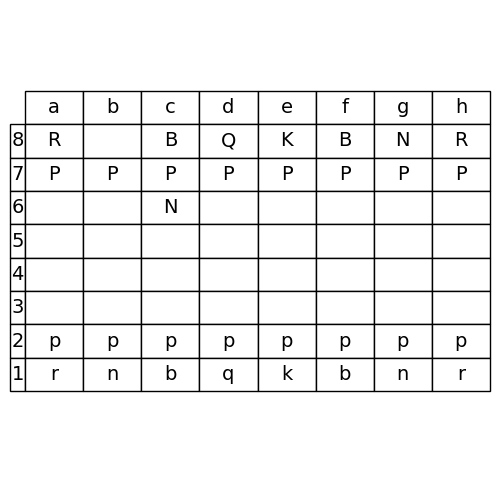

Next of batch 199
Idx 399


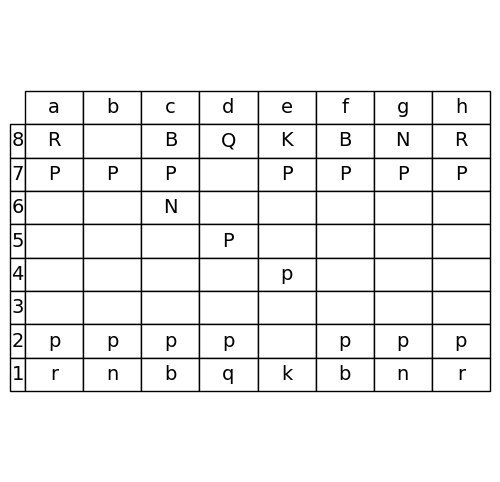

Batch: 200
Idx 400


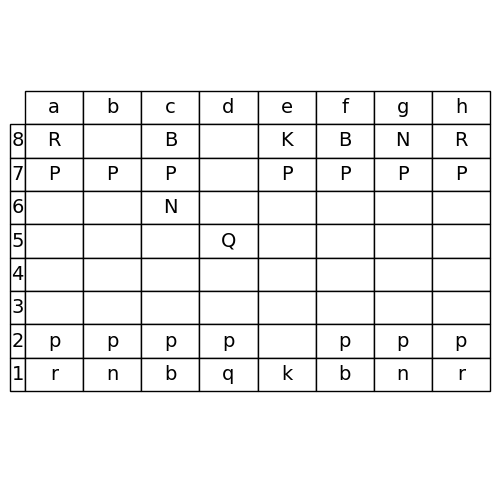

Next of batch 200
Idx 401


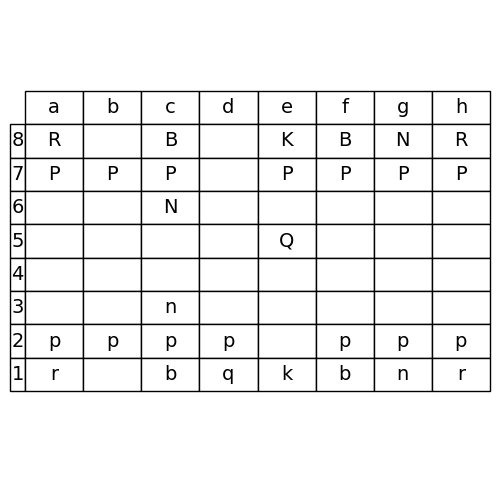

Batch: 201
Idx 402


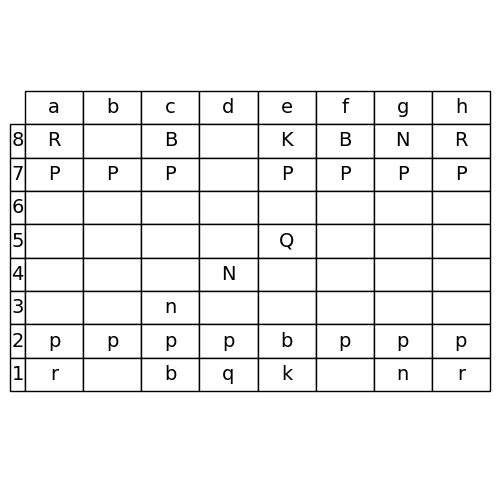

Next of batch 201
Idx 403


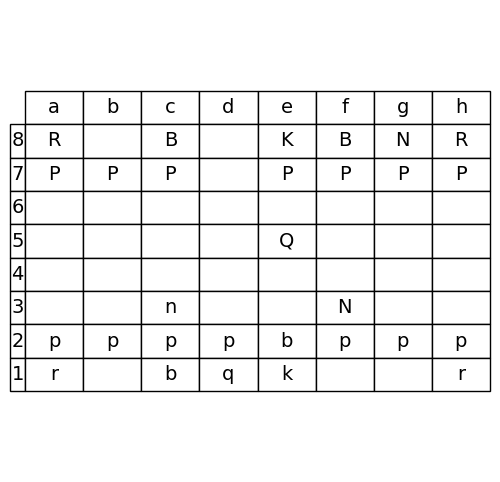

Batch: 202
Idx 404


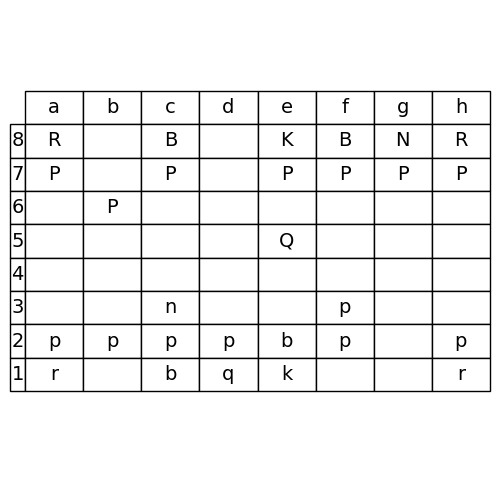

Next of batch 202
Idx 405


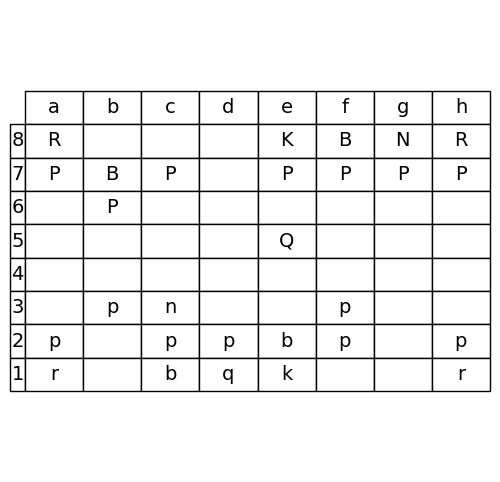

Batch: 203
Idx 406


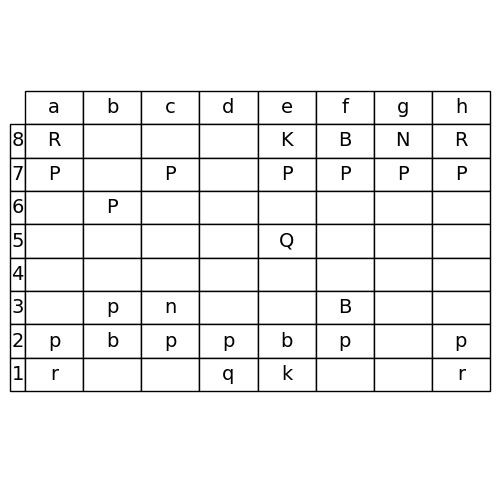

Next of batch 203
Idx 407


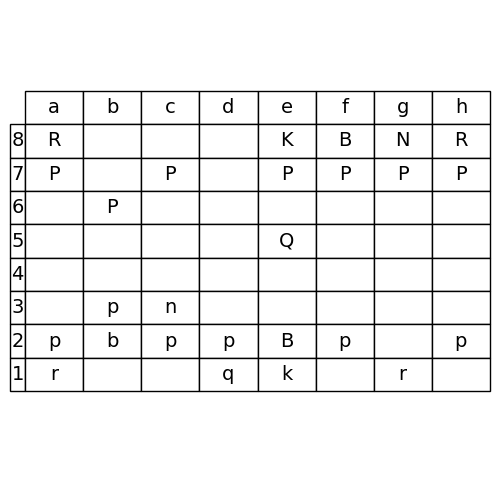

Batch: 204
Idx 408


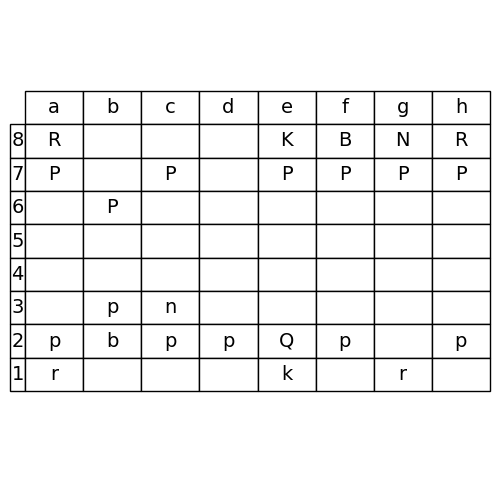

Next of batch 204
Idx 409


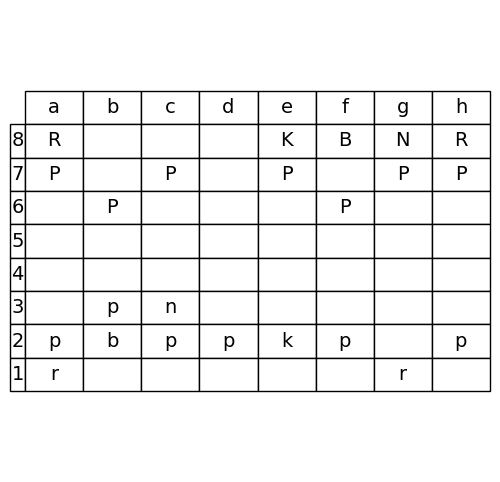

Batch: 205
Idx 410


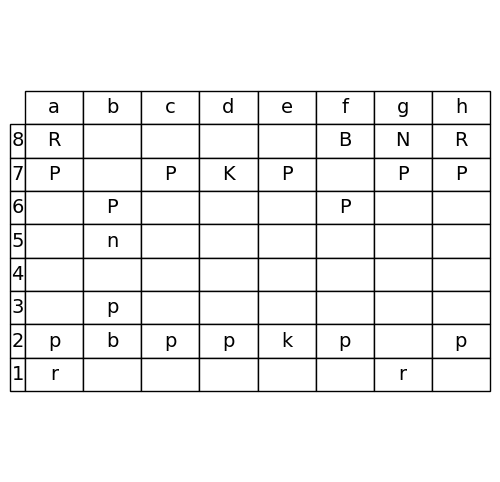

Next of batch 205
Idx 411


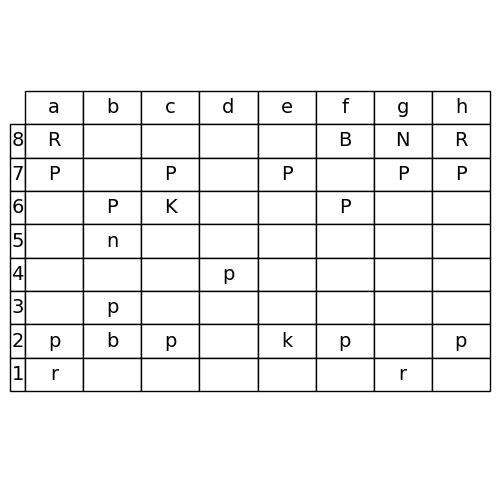

Batch: 206
Idx 412


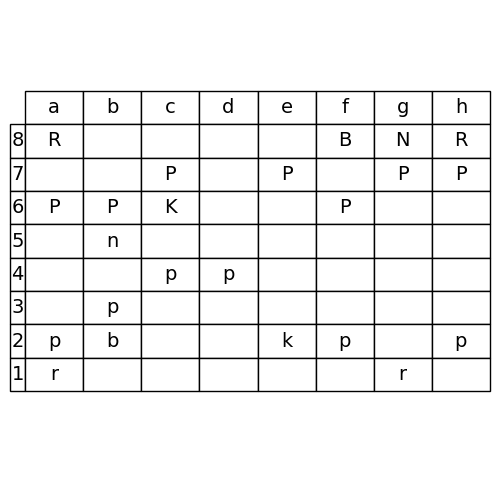

Next of batch 206
Idx 413


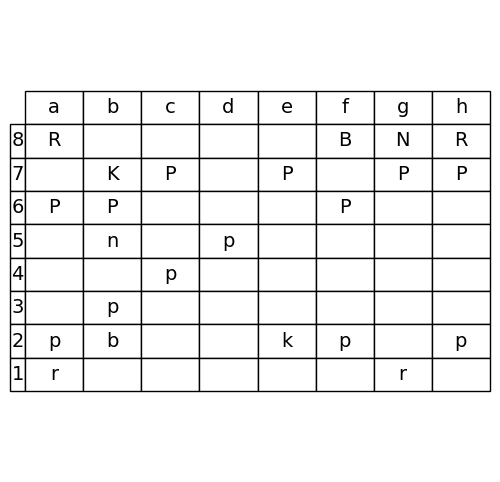

Batch: 207
Idx 414


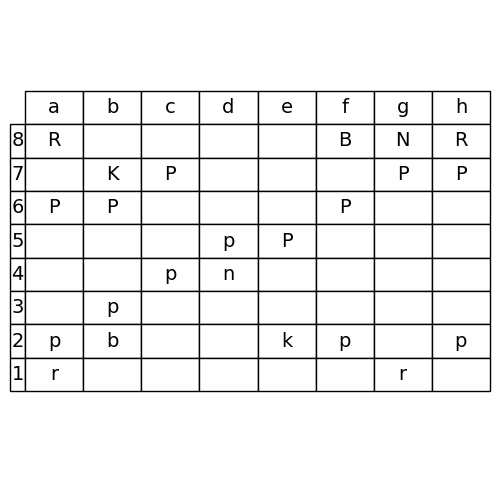

Next of batch 207
Idx 415


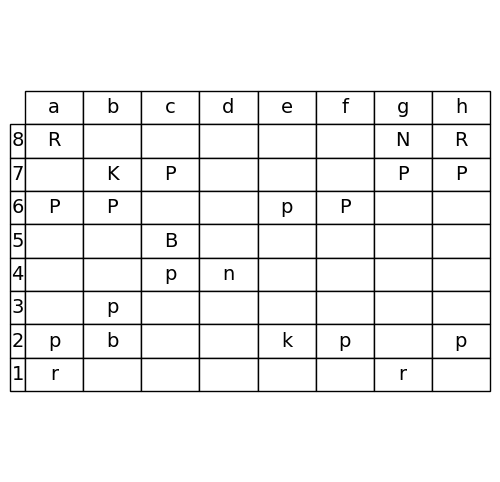

Batch: 208
Idx 416


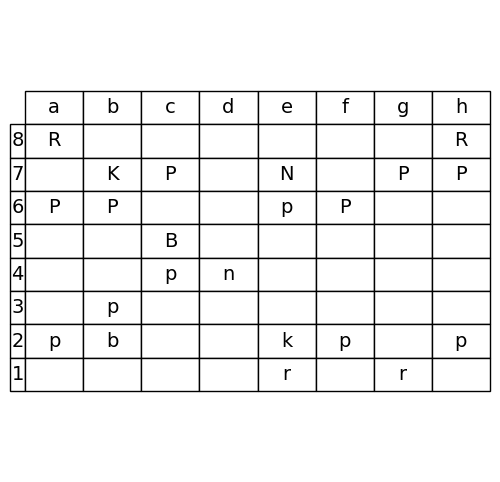

Next of batch 208
Idx 417


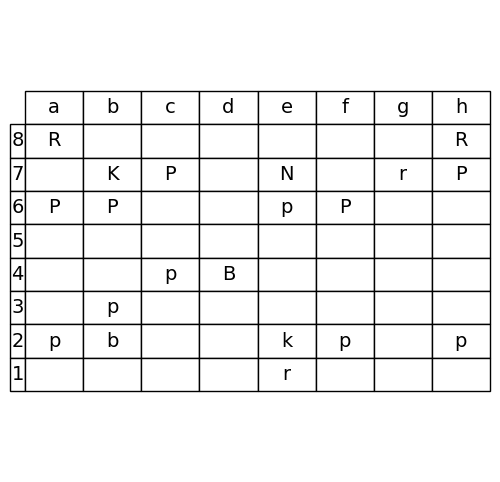

Batch: 209
Idx 418


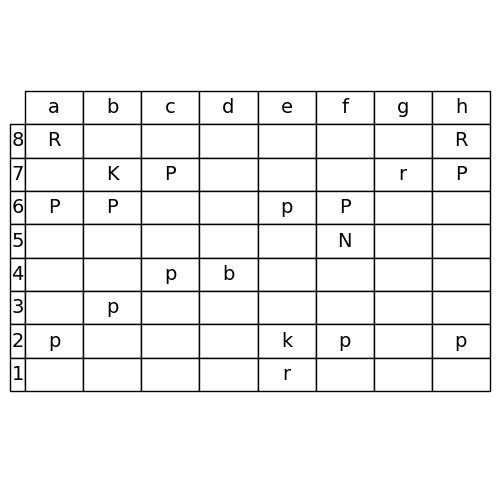

Next of batch 209
Idx 419


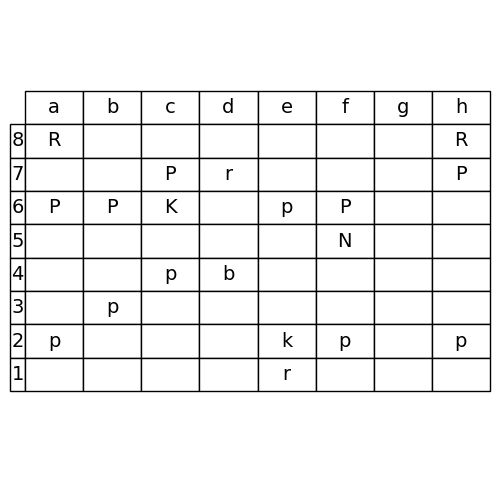

Batch: 210
Idx 420


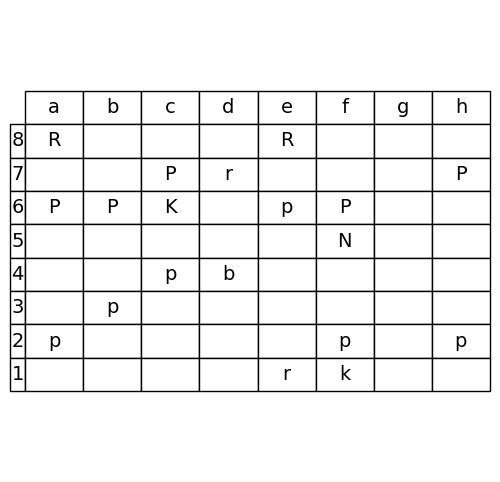

Next of batch 210
Idx 421


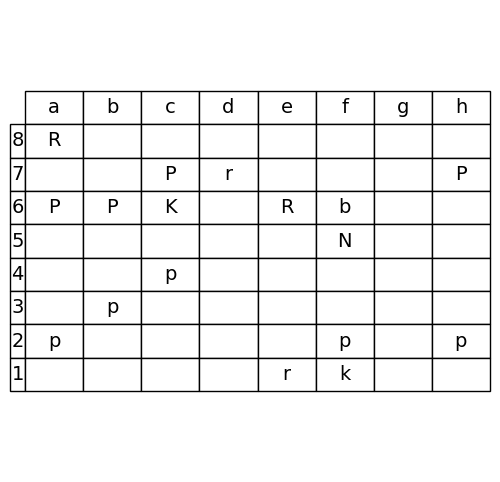

Batch: 211
Idx 422


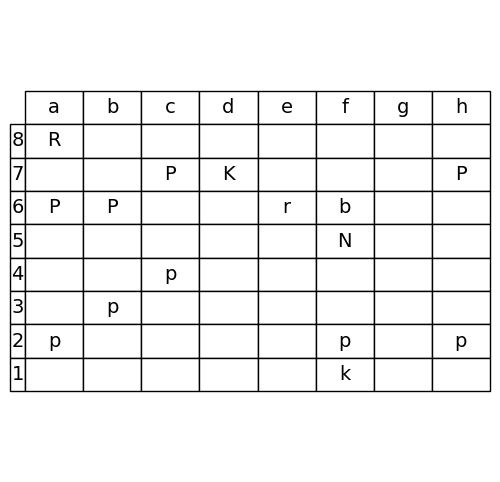

Next of batch 211
Idx 423


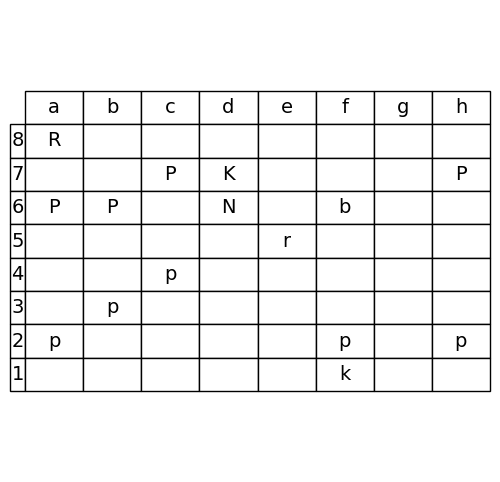

Batch: 212
Idx 424


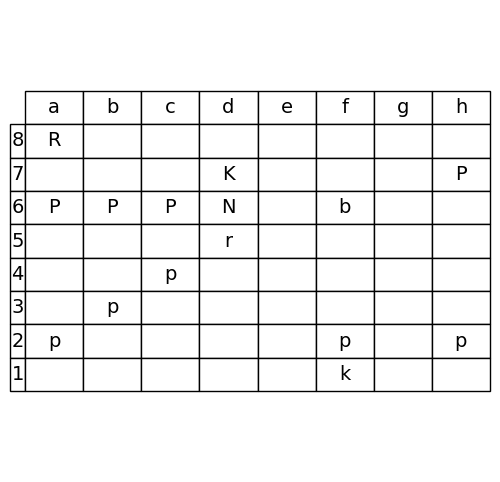

Next of batch 212
Idx 425


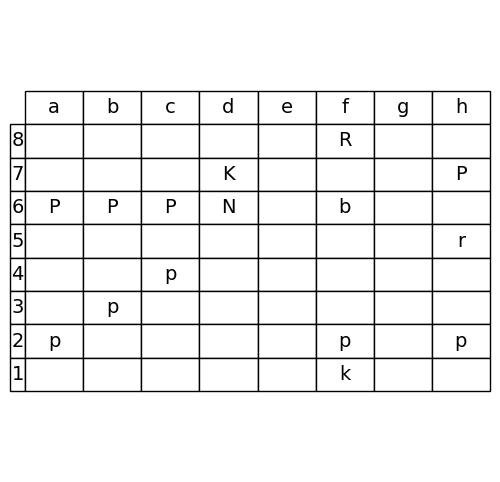

Batch: 213
Idx 426


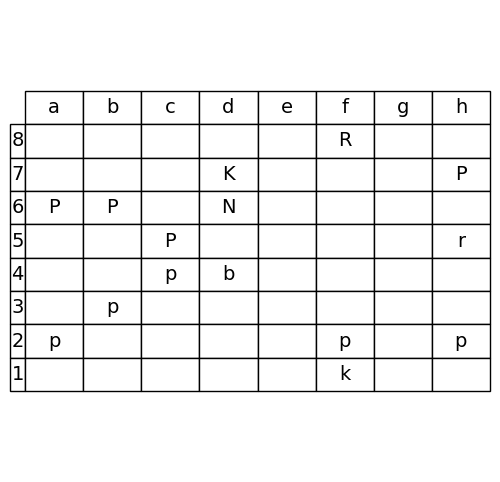

Next of batch 213
Idx 427


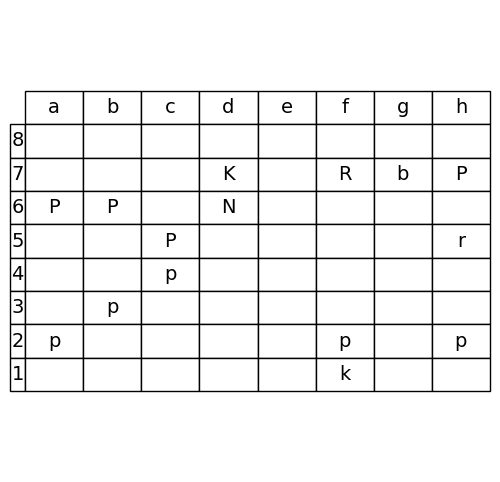

Batch: 214
Idx 428


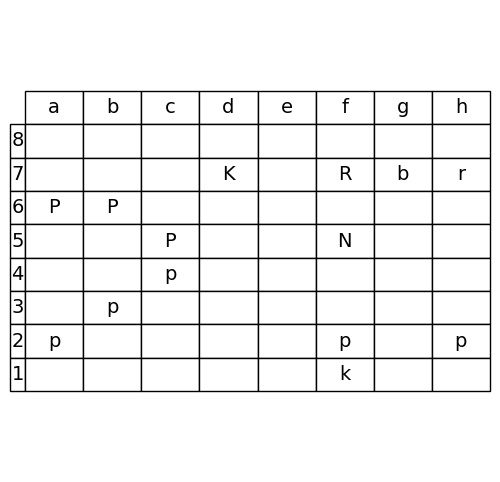

Next of batch 214
Idx 429


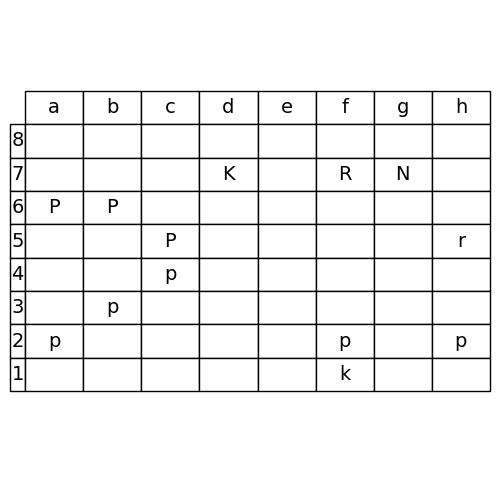

Batch: 215
Idx 430


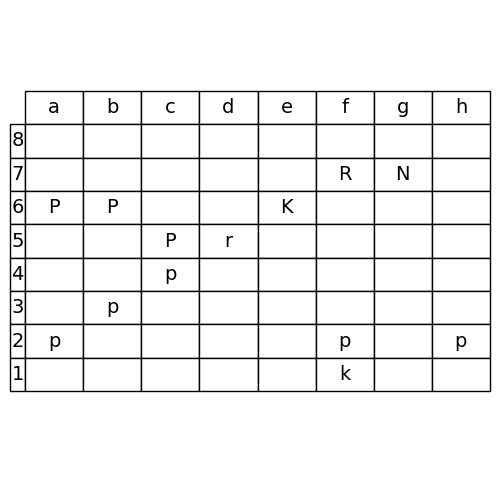

Next of batch 215
Idx 431


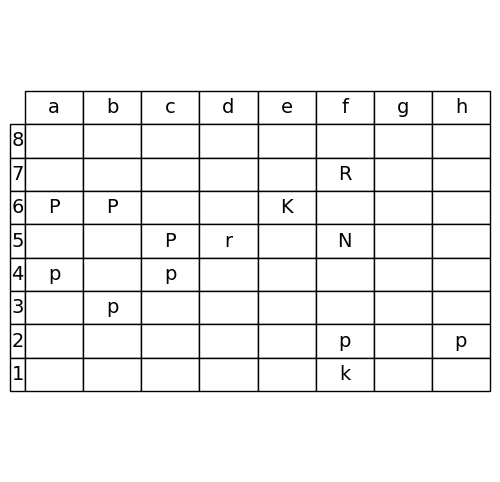

Batch: 216
Idx 432


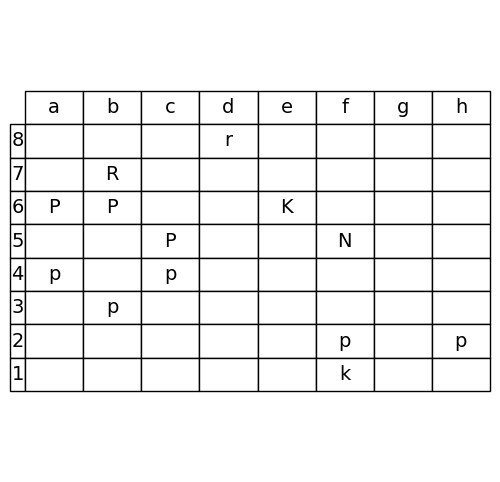

Next of batch 216
Idx 433


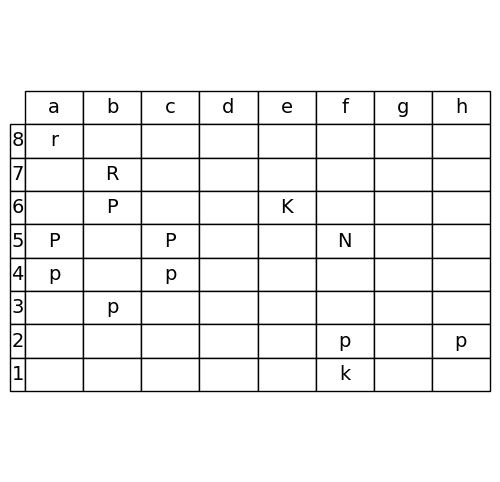

Batch: 217
Idx 434


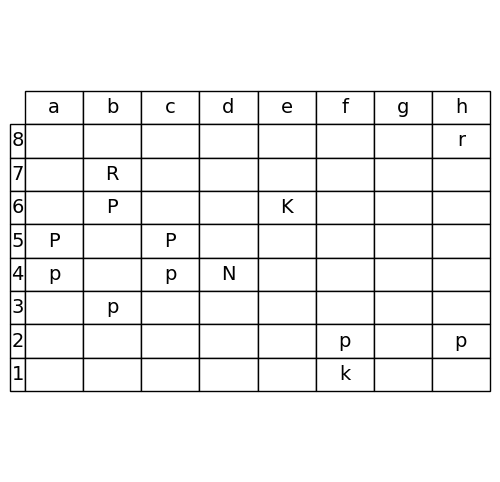

Next of batch 217
Idx 435


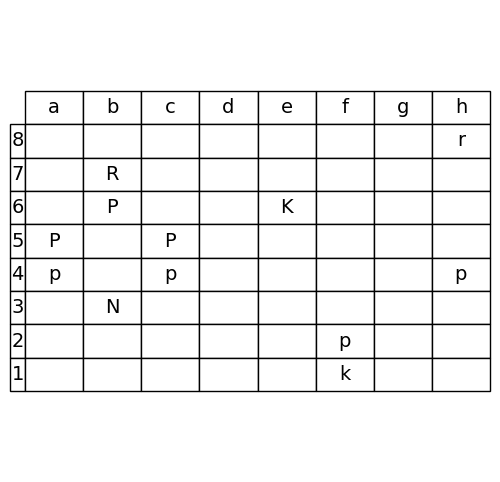

Batch: 218
Idx 436


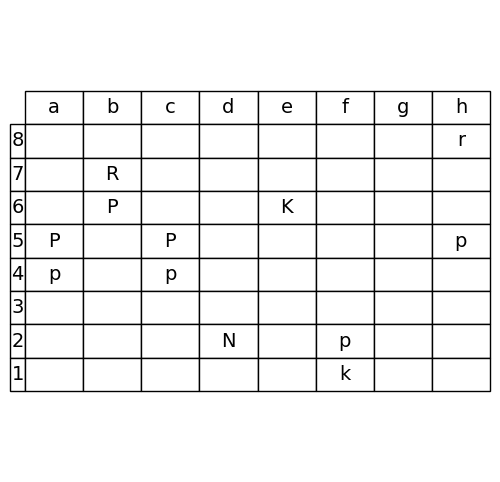

Next of batch 218
Idx 437


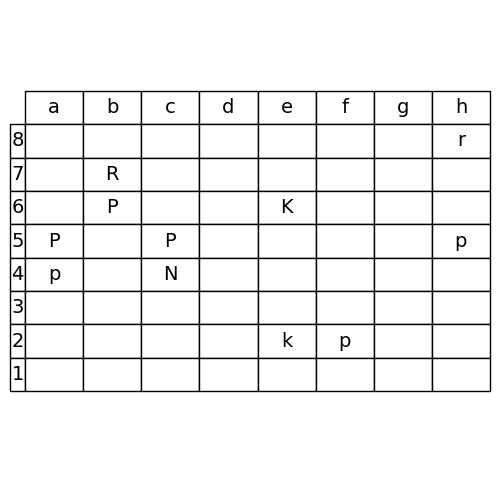

Batch: 219
Idx 438


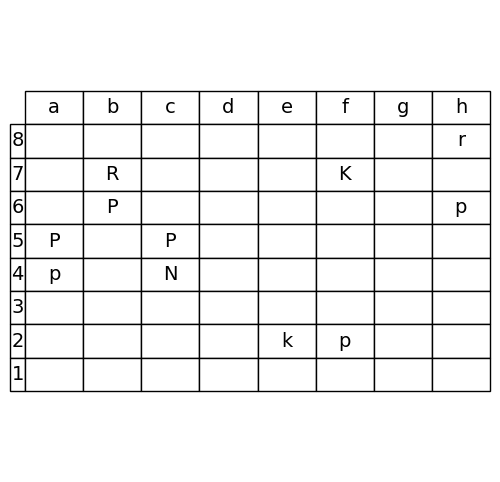

Next of batch 219
Idx 439


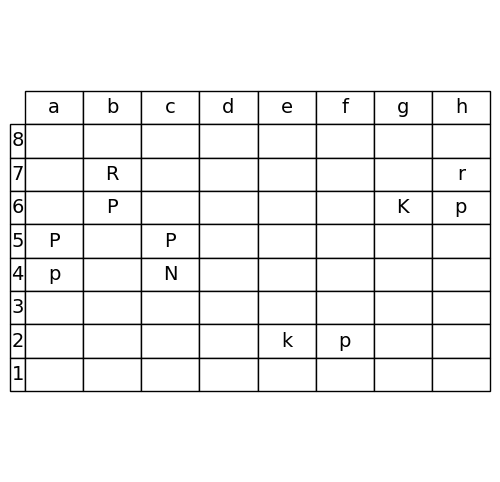

Batch: 220
Idx 440


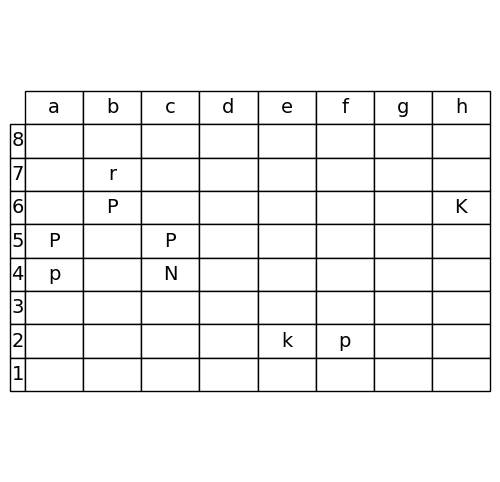

Next of batch 220
Idx 441


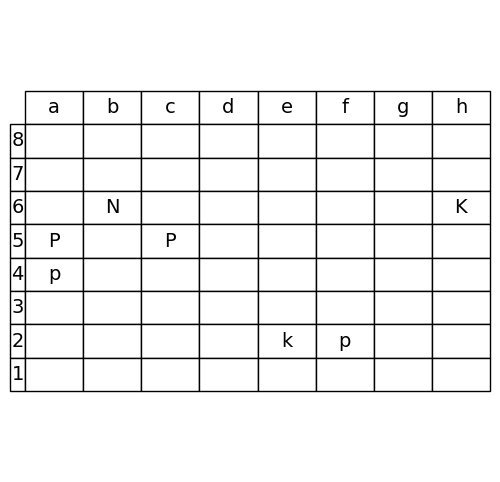

Batch: 221
Idx 442


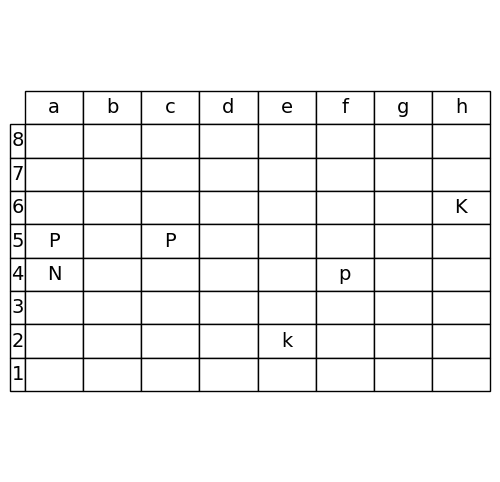

Next of batch 221
Idx 443


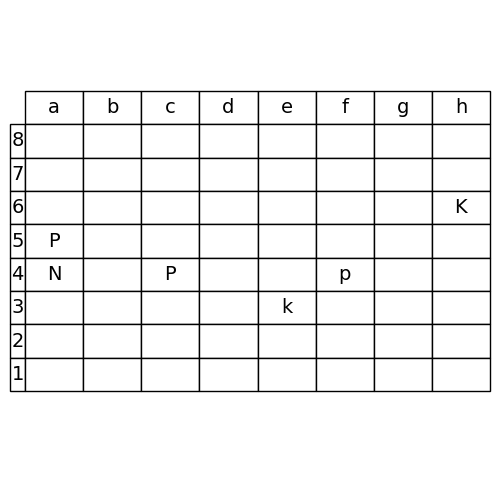

Batch: 222
Idx 444


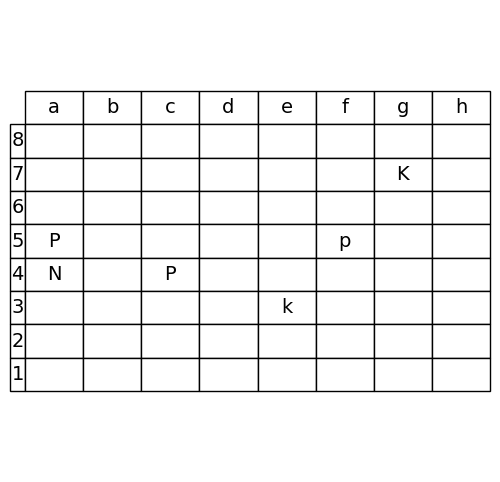

Next of batch 222
Idx 445


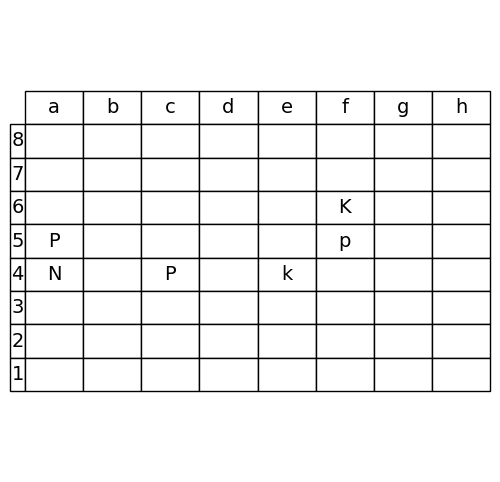

Batch: 223
Idx 446


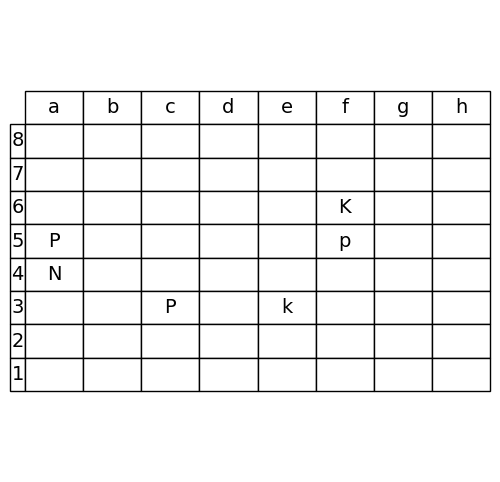

Next of batch 223
Idx 447


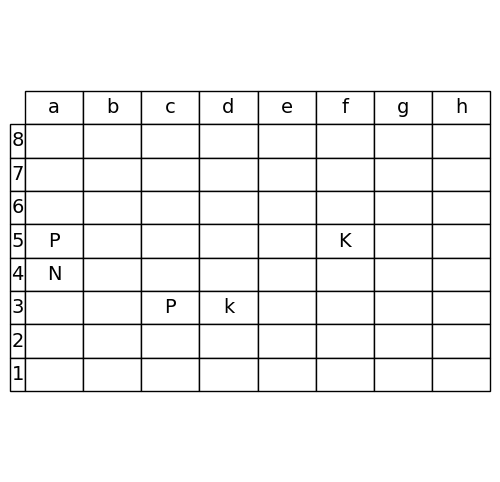

Batch: 224
Idx 448


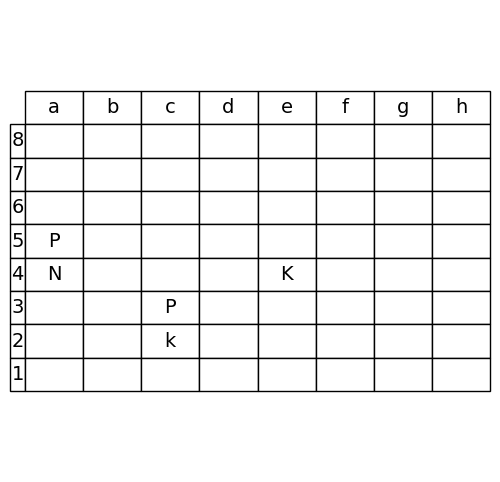

Next of batch 224
Idx 449


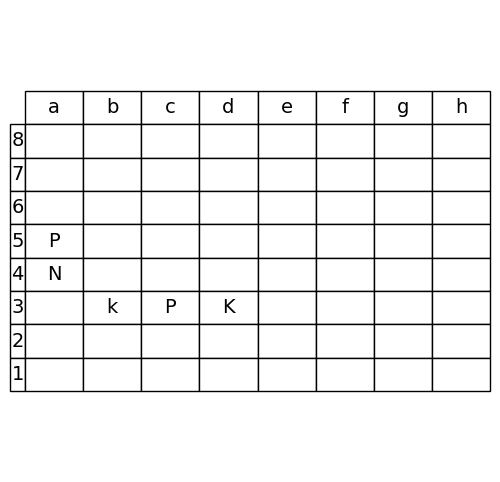

Batch: 225
Idx 450


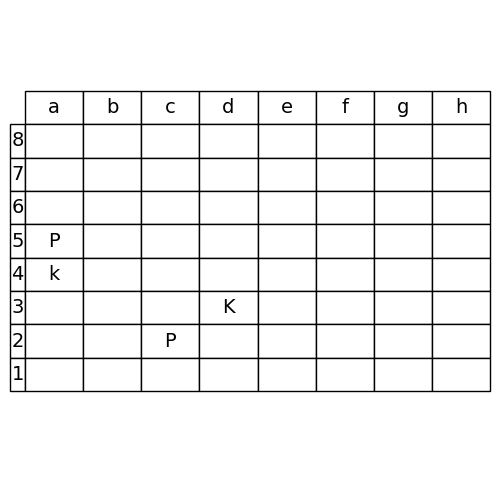

Next of batch 225
Idx 451


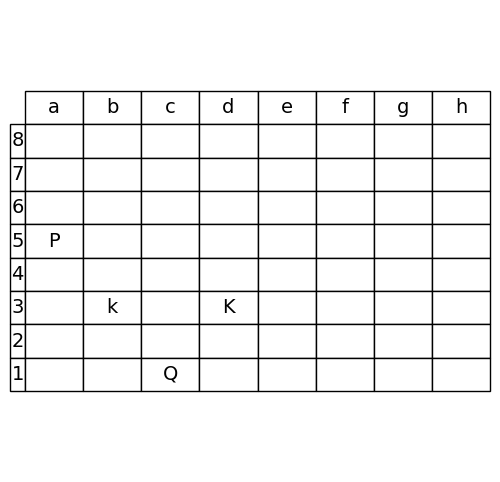

Batch: 226
Idx 452


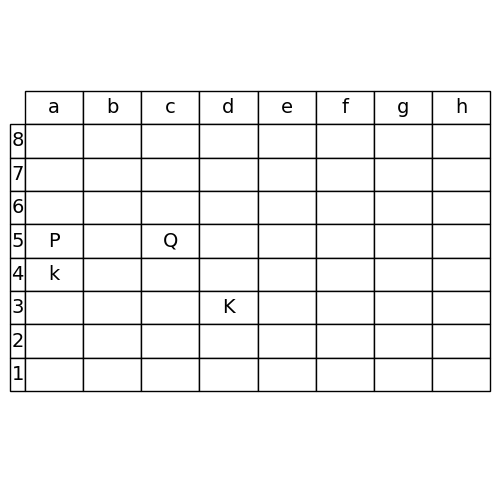

Next of batch 226
Idx 453


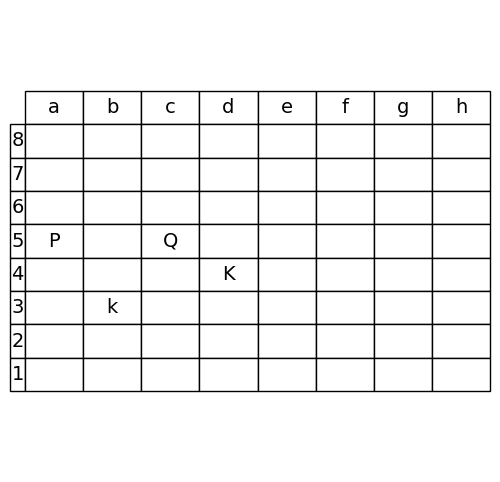

Batch: 227
Idx 454


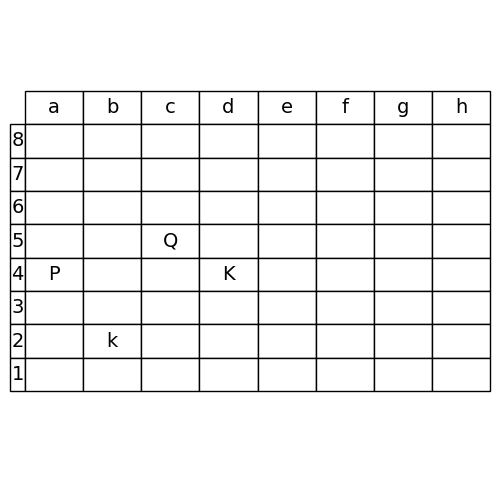

Next of batch 227
Idx 455


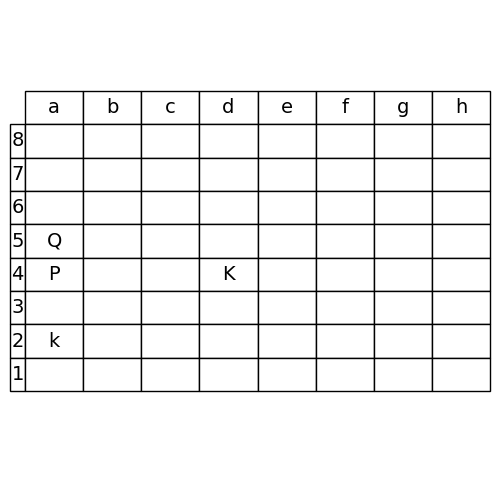

Batch: 228
Idx 456


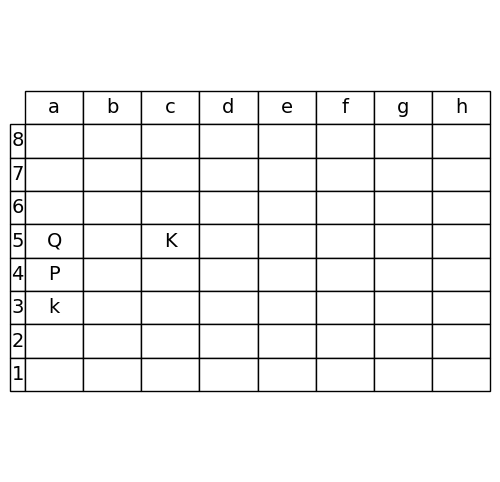

Next of batch 228
Idx 457


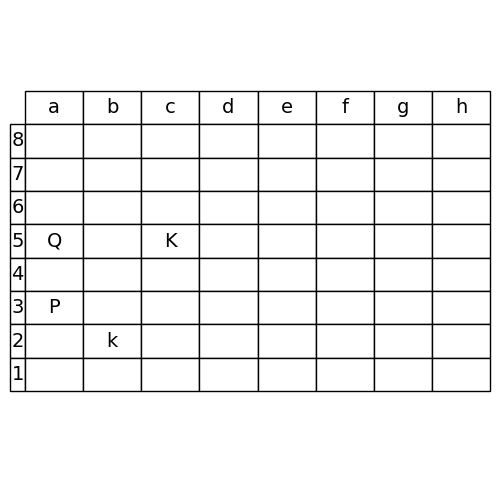

Batch: 229
Idx 458


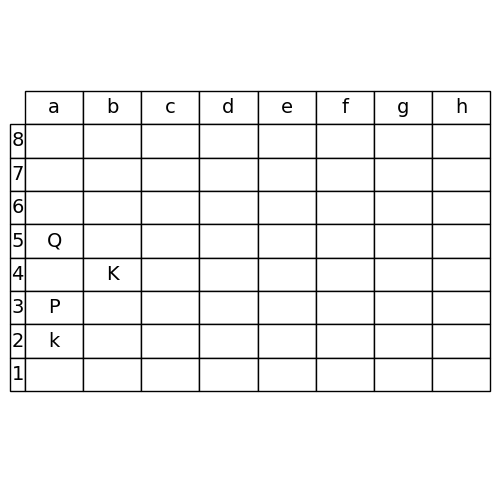

Next of batch 229
Idx 459


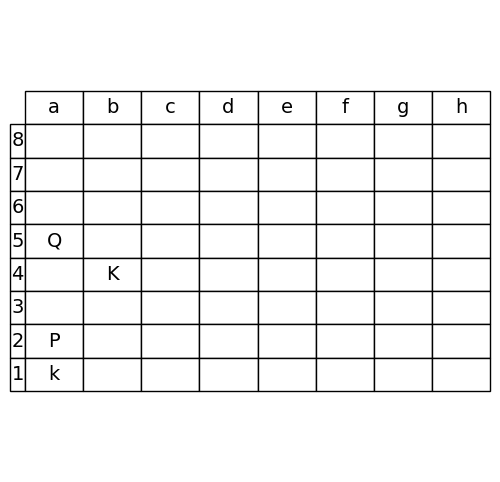

Batch: 230
Idx 460


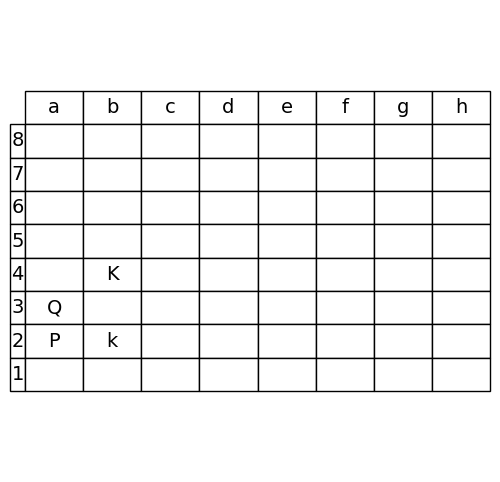

Next of batch 230
Idx 461


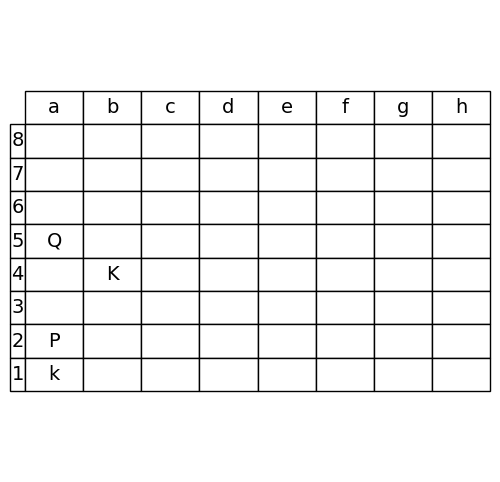

Batch: 231
Idx 462


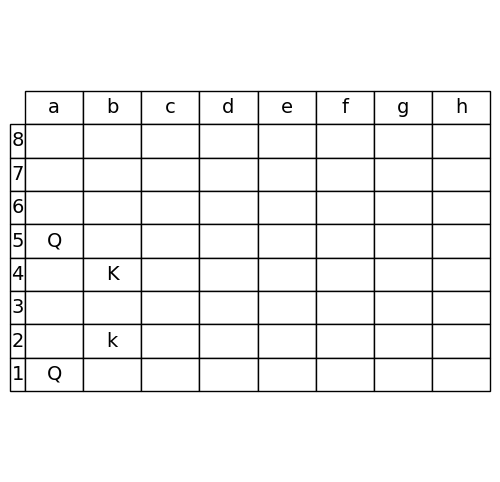

Next of batch 231
Idx 463


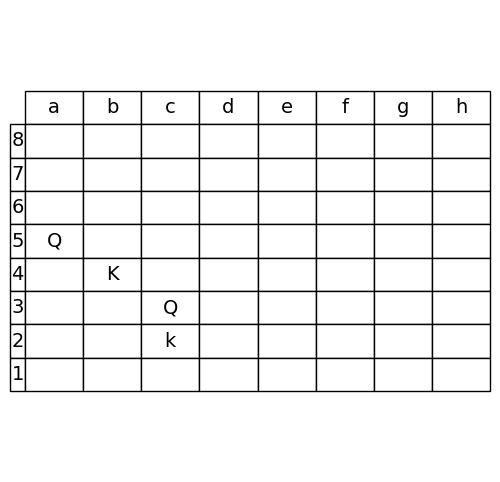

Batch: 232
Idx 464


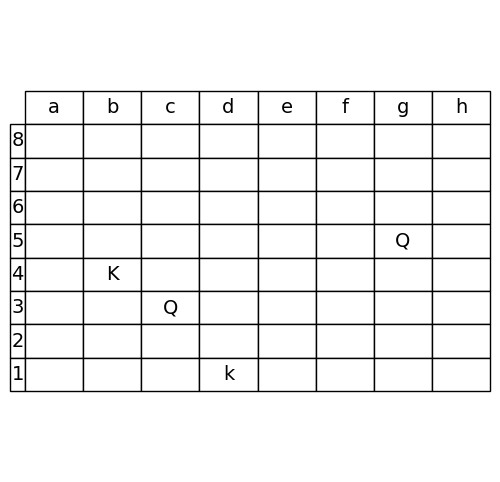

Next of batch 232
Idx 465


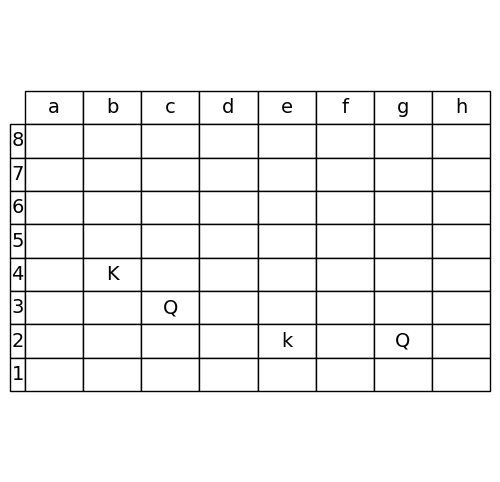

Batch: 233
Idx 466


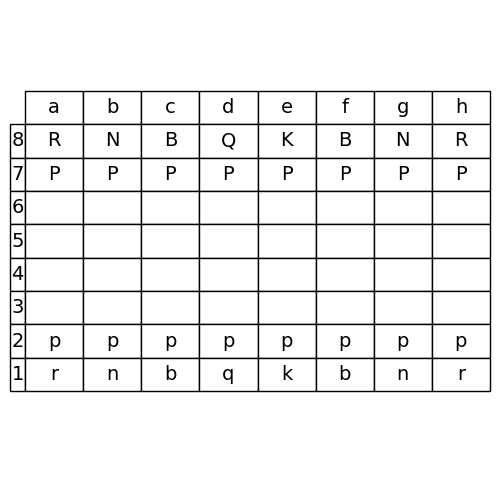

Next of batch 233
Idx 467


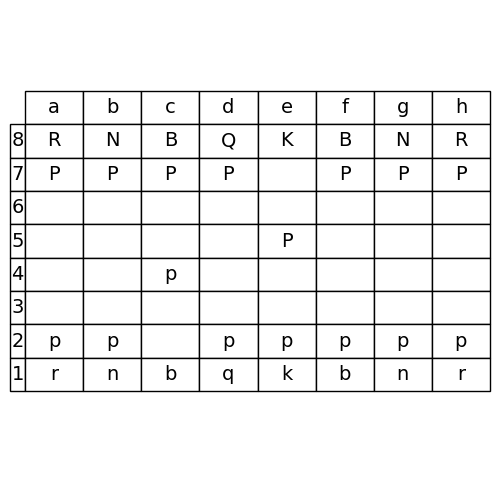

Batch: 234
Idx 468


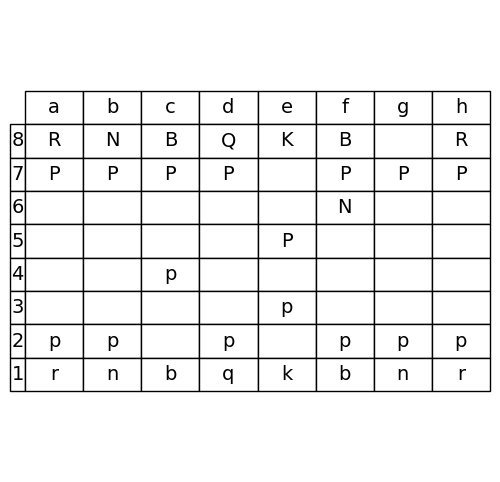

Next of batch 234
Idx 469


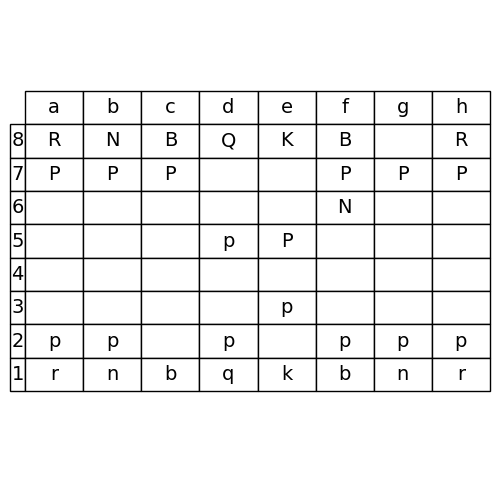

Batch: 235
Idx 470


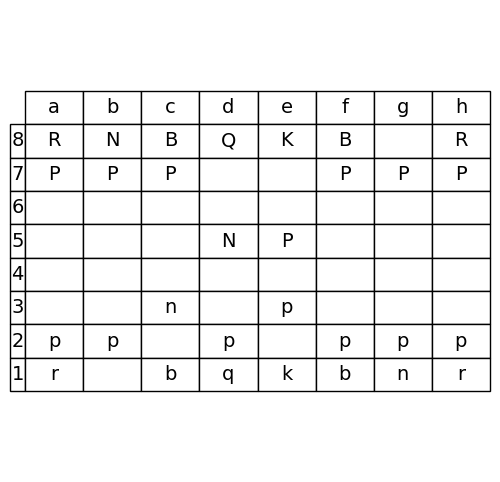

Next of batch 235
Idx 471


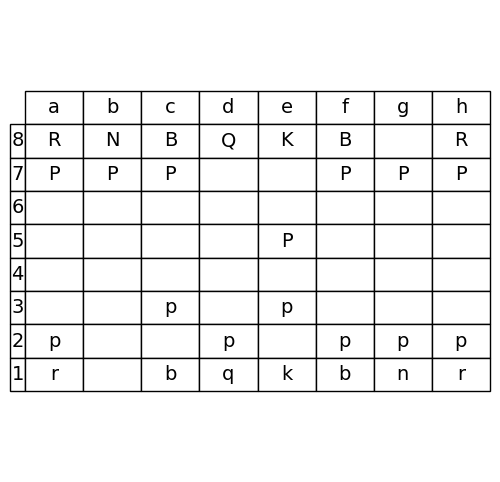

Batch: 236
Idx 472


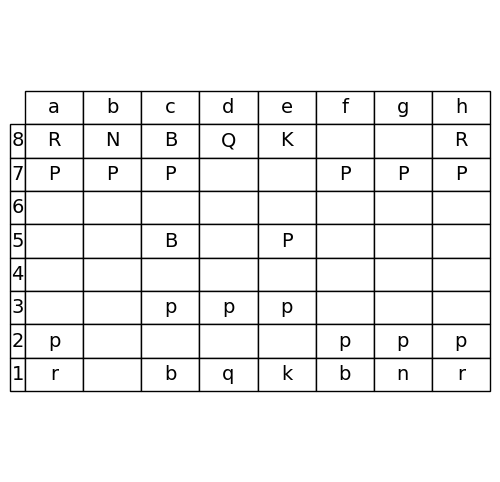

Next of batch 236
Idx 473


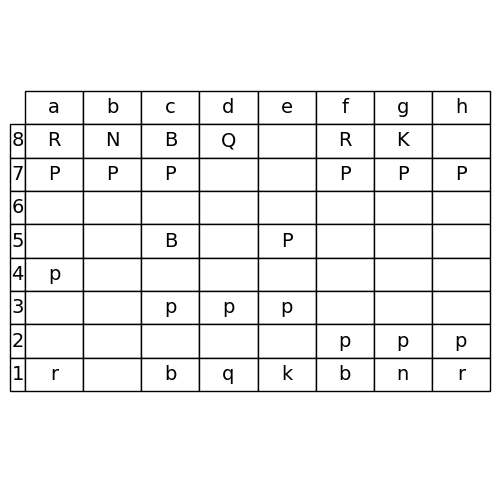

Batch: 237
Idx 474


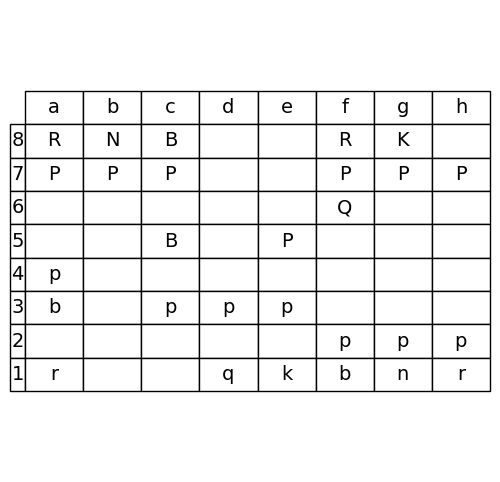

Next of batch 237
Idx 475


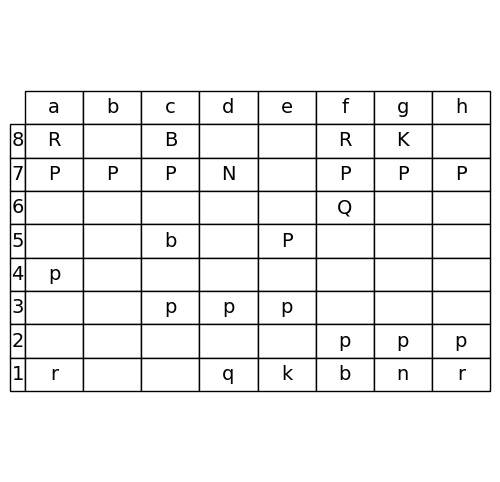

Batch: 238
Idx 476


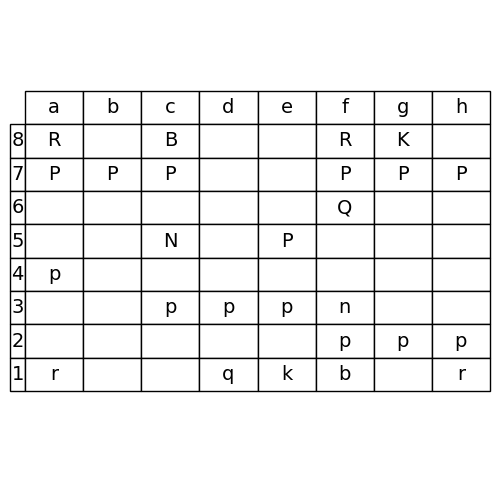

Next of batch 238
Idx 477


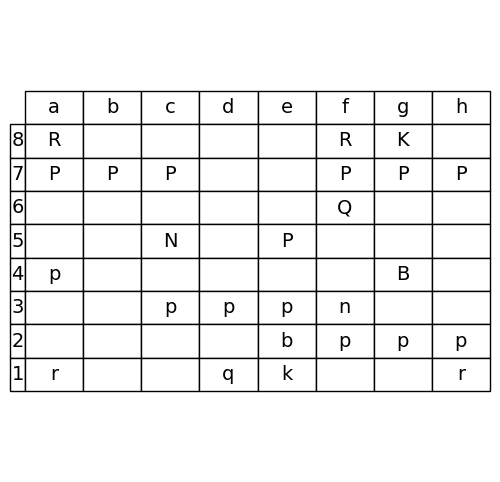

Batch: 239
Idx 478


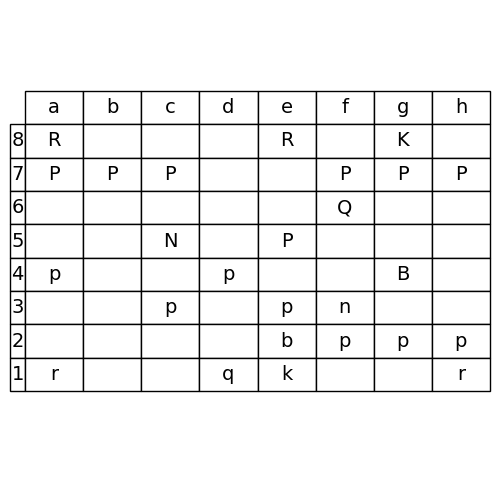

Next of batch 239
Idx 479


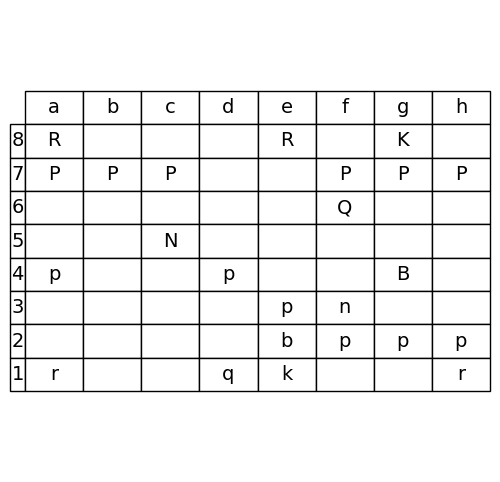

Batch: 240
Idx 480


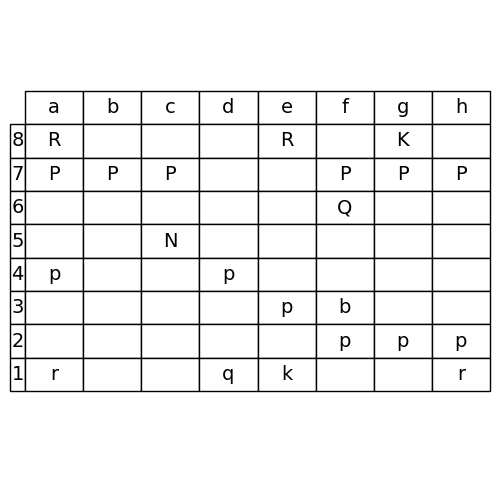

Next of batch 240
Idx 481


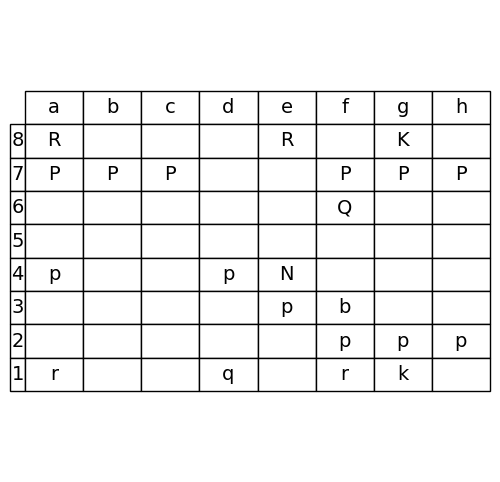

Batch: 241
Idx 482


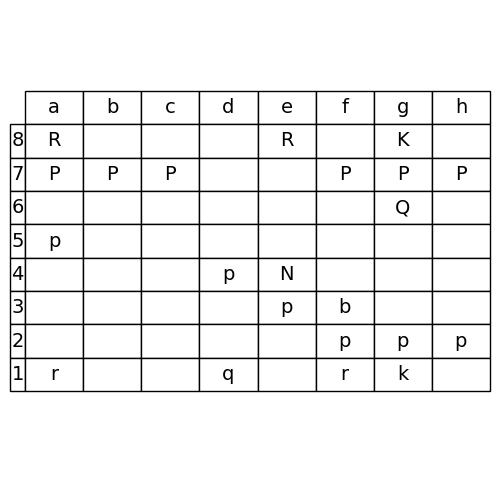

Next of batch 241
Idx 483


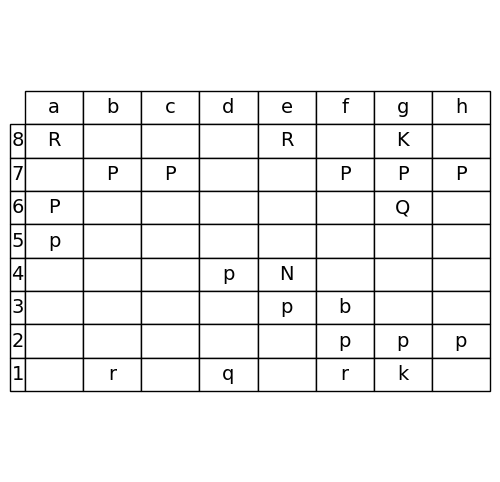

Batch: 242
Idx 484


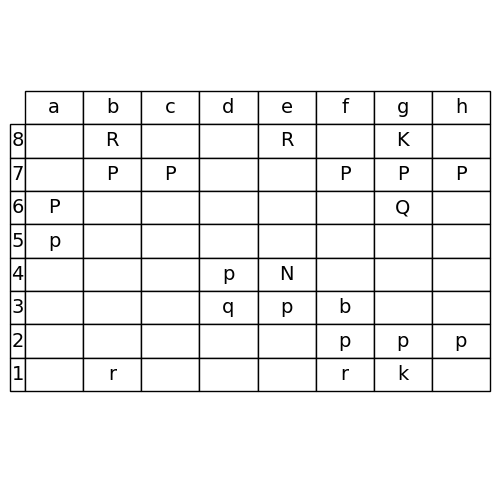

Next of batch 242
Idx 485


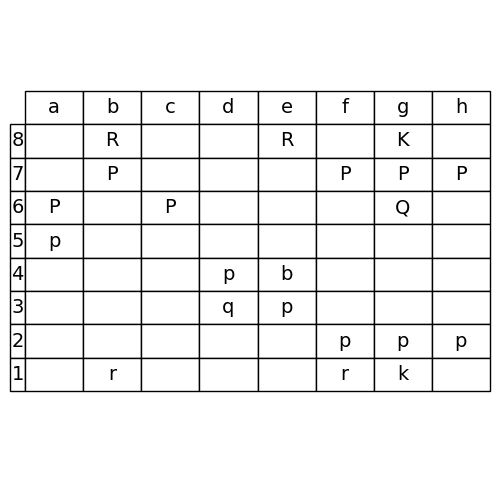

Batch: 243
Idx 486


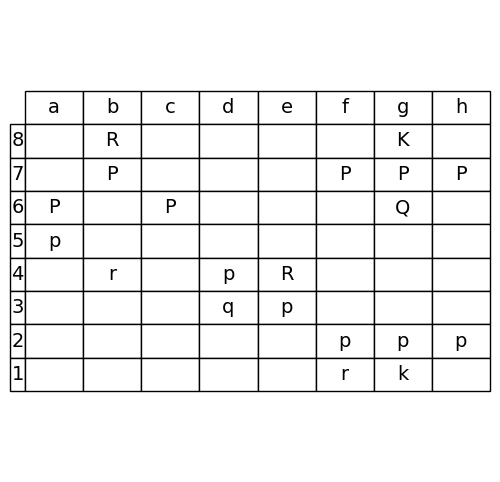

Next of batch 243
Idx 487


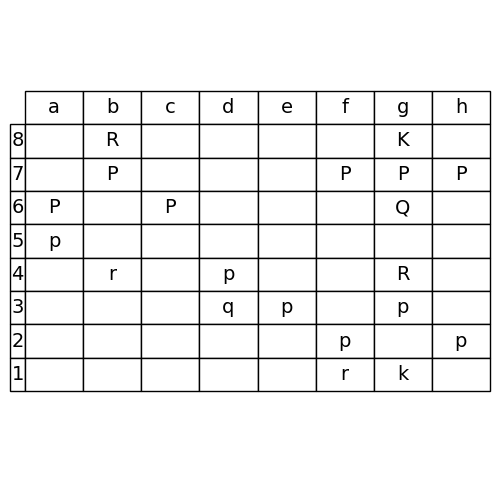

Batch: 244
Idx 488


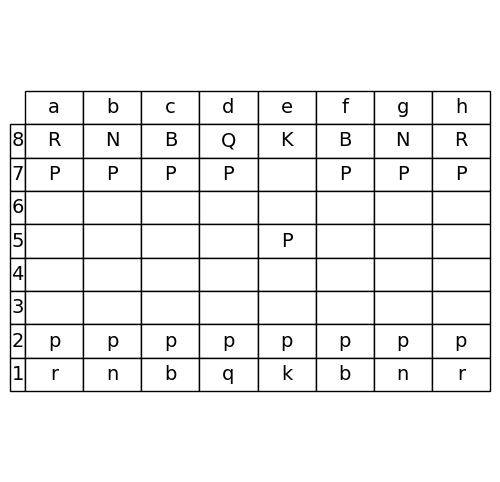

Next of batch 244
Idx 489


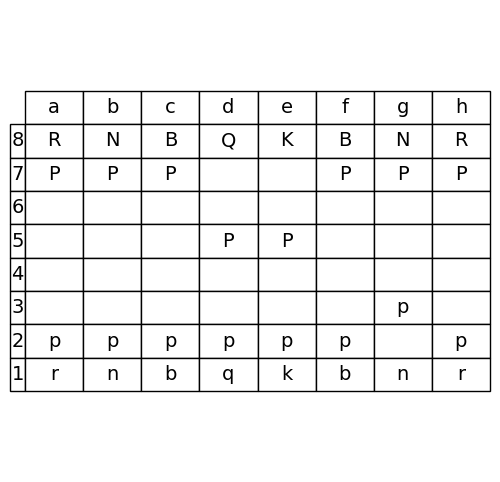

Batch: 245
Idx 490


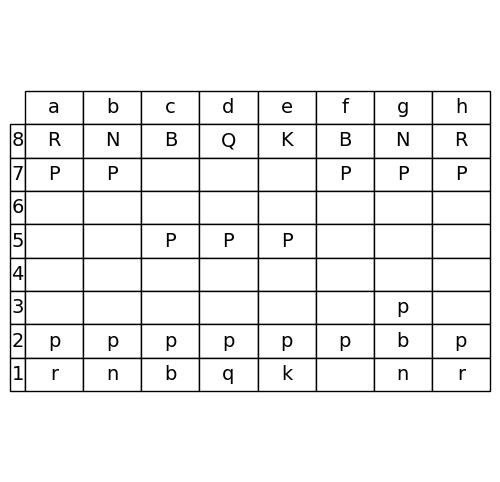

Next of batch 245
Idx 491


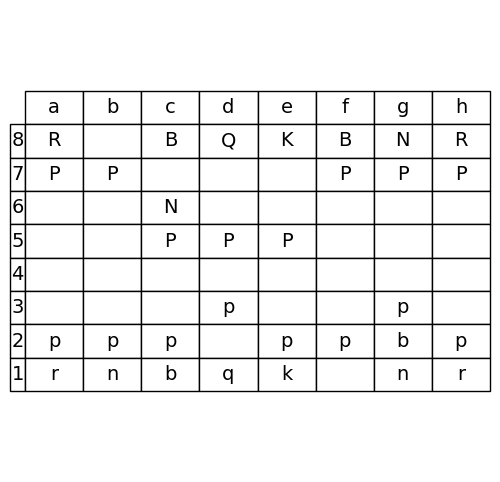

Batch: 246
Idx 492


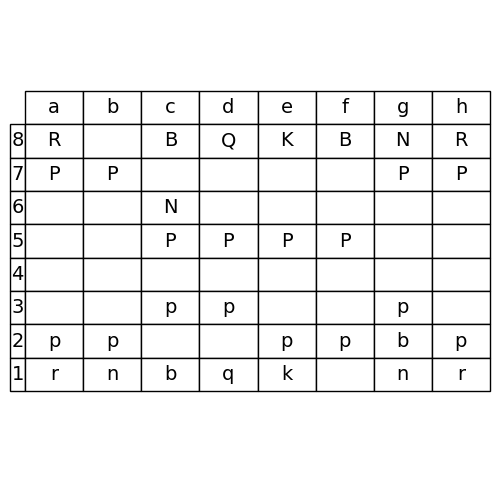

Next of batch 246
Idx 493


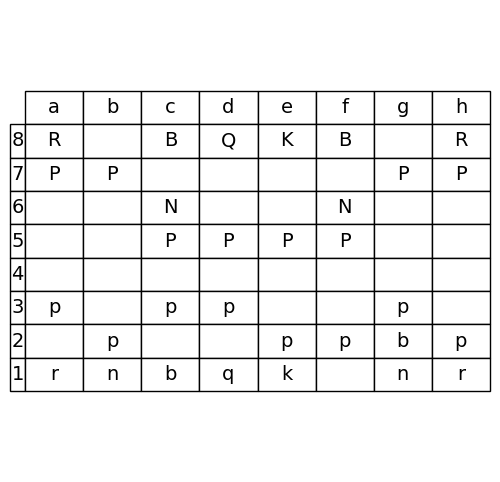

Batch: 247
Idx 494


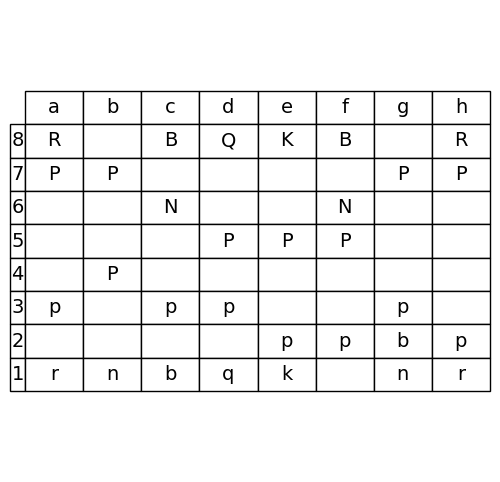

Next of batch 247
Idx 495


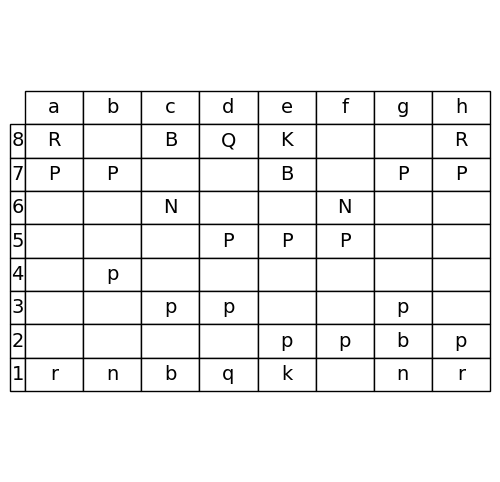

Batch: 248
Idx 496


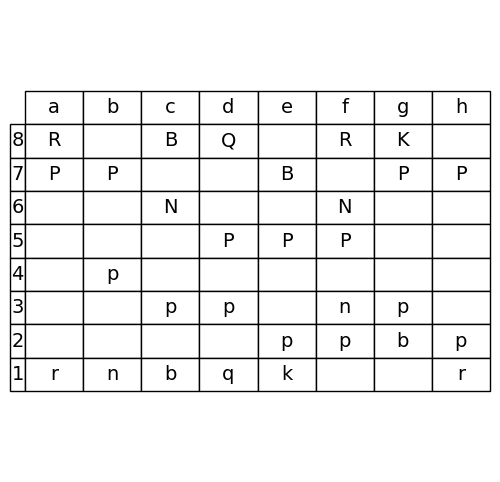

Next of batch 248
Idx 497


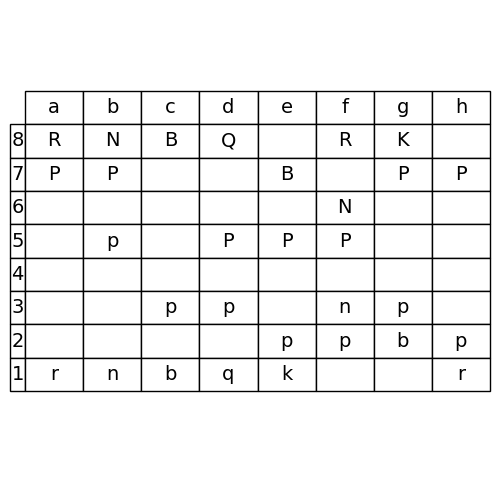

Batch: 249
Idx 498


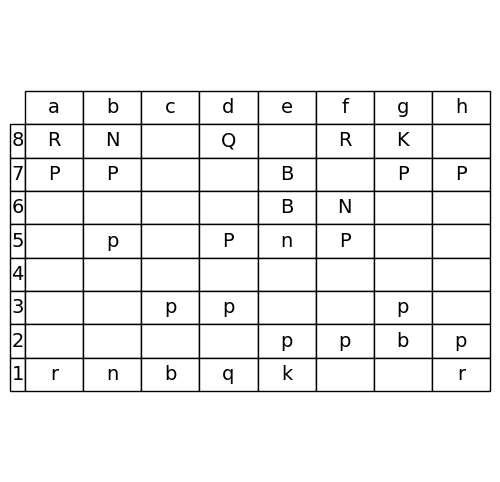

Next of batch 249
Idx 499


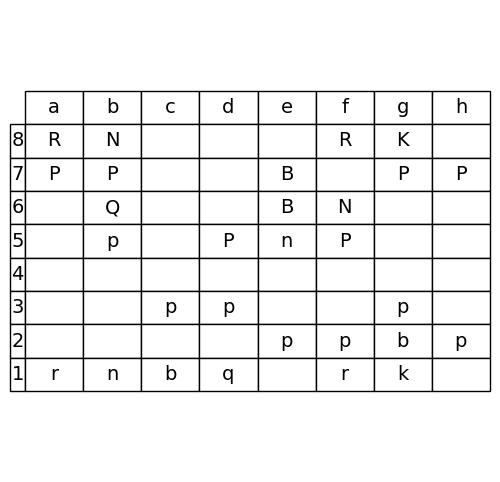

Batch: 250
Idx 500


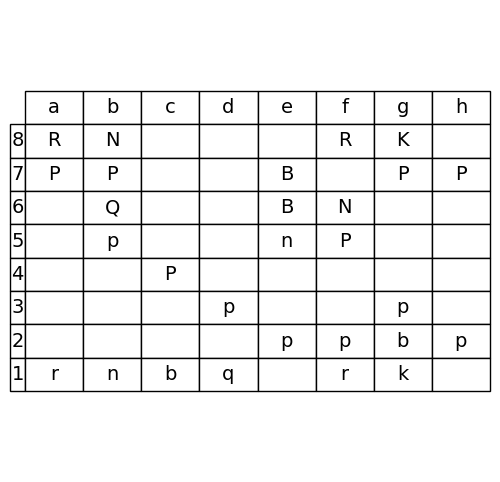

Next of batch 250
Idx 501


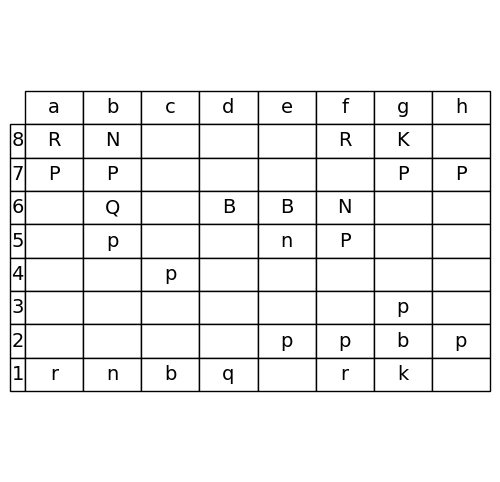

Batch: 251
Idx 502


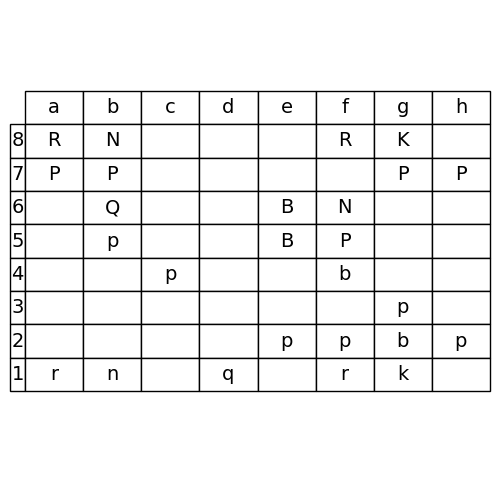

Next of batch 251
Idx 503


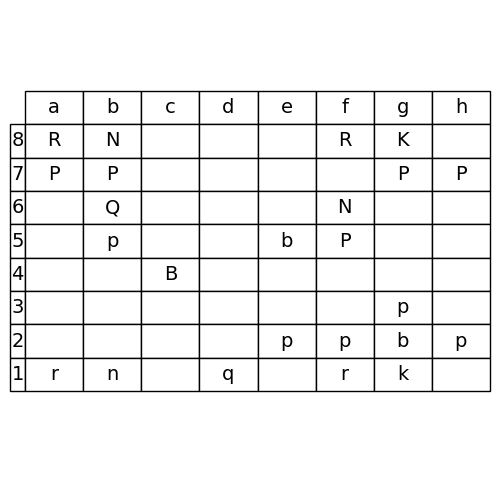

Batch: 252
Idx 504


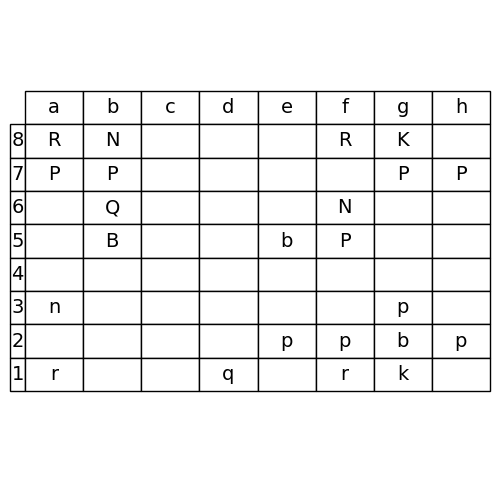

Next of batch 252
Idx 505


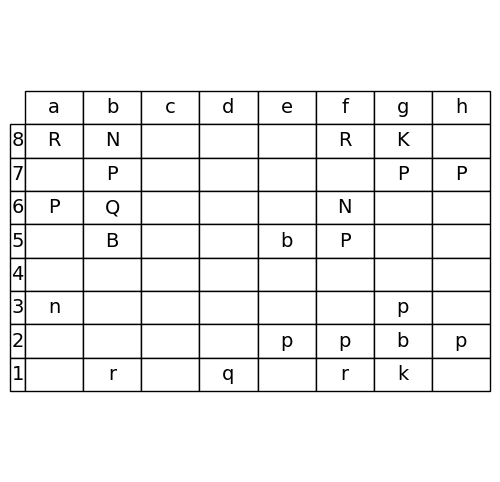

Batch: 253
Idx 506


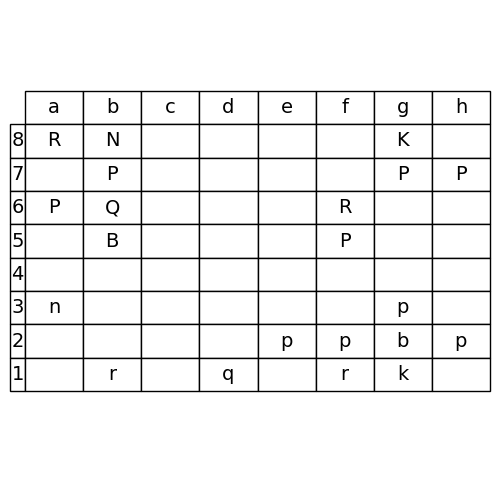

Next of batch 253
Idx 507


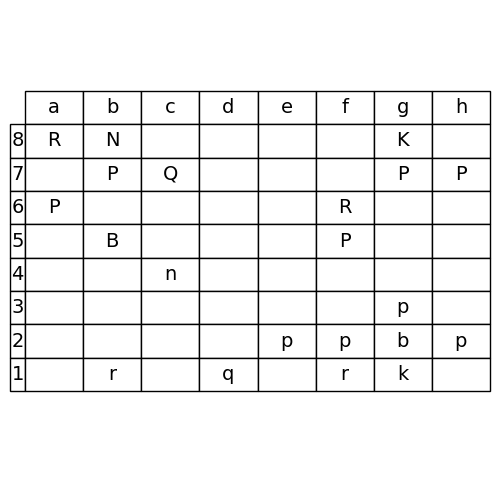

Batch: 254
Idx 508


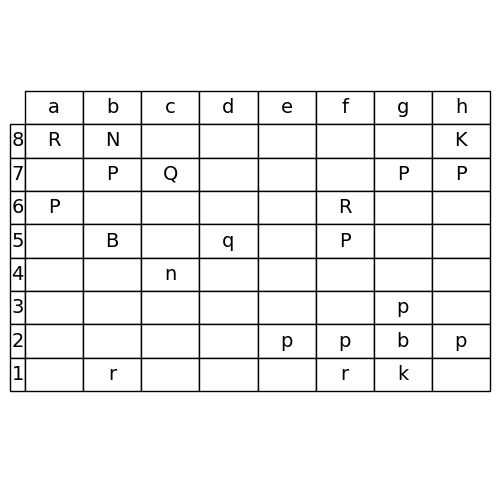

Next of batch 254
Idx 509


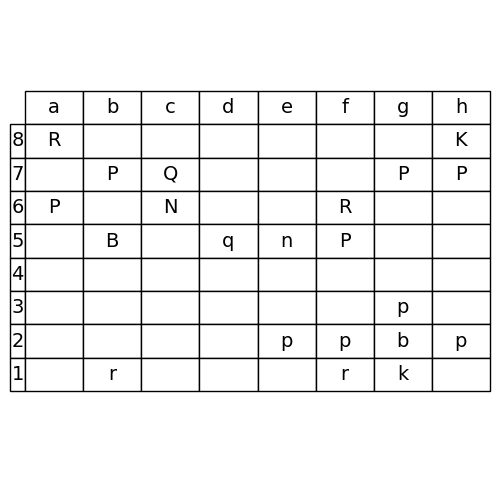

Batch: 255
Idx 510


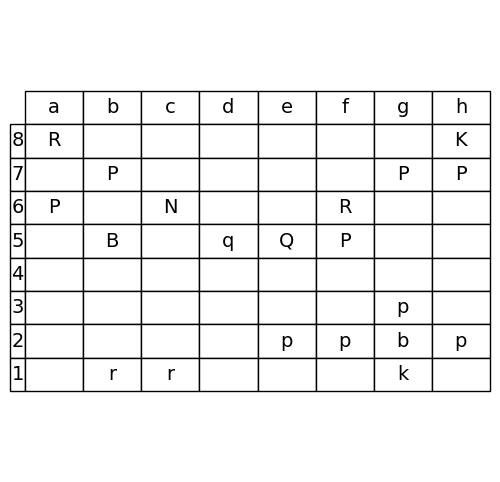

Next of batch 255
Idx 511


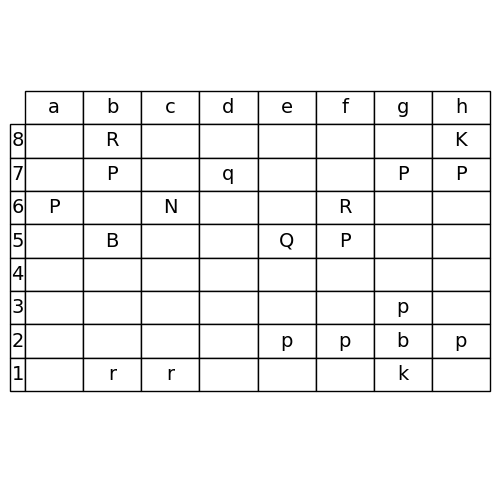

Batch: 256
Idx 512


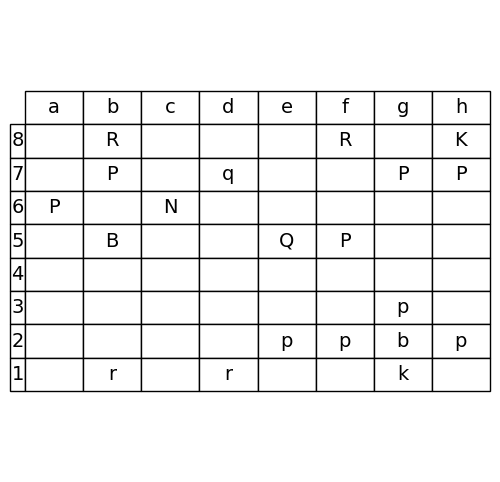

Next of batch 256
Idx 513


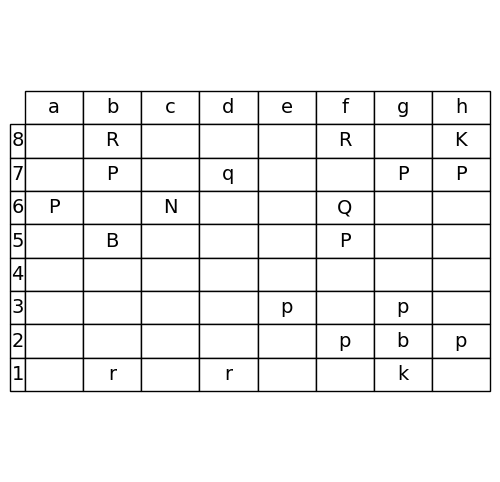

Batch: 257
Idx 514


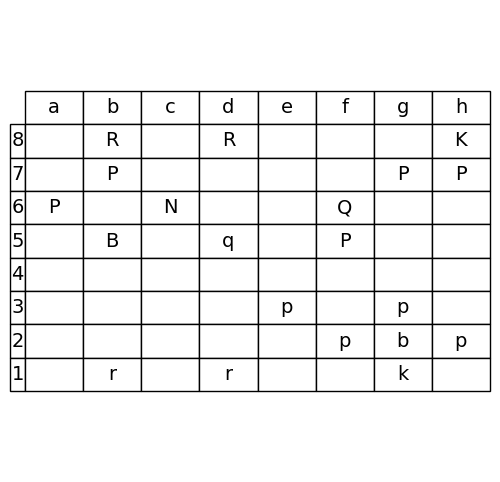

Next of batch 257
Idx 515


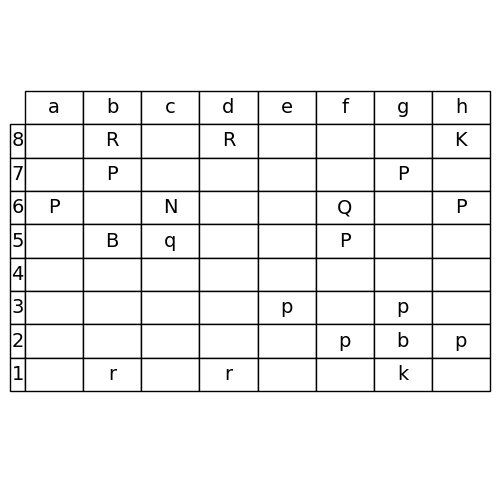

Batch: 258
Idx 516


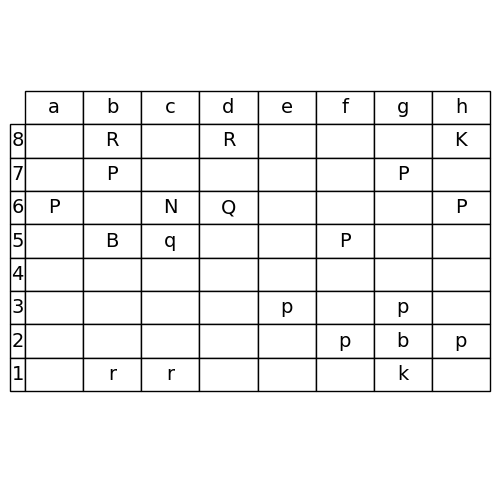

Next of batch 258
Idx 517


KeyboardInterrupt: 

In [65]:
def load_data_in_chunks(file_path):
    """
    Load data from file in chunks using pickle.
    Yields one chunk (a list of (position, move) pairs) at a time.
    """
    with open(file_path, 'rb') as f:
        while True:
            try:
                chunk = pickle.load(f)
                yield chunk
            except EOFError:
                break

def generate_batches_in_sequence(file_path, batch_size):
    """
    Generates batches of board positions in sequential order.
    Each board position is transposed to (14, 8, 8).
    The generator yields numpy arrays of shape (batch_size, 14, 8, 8).
    If the final batch is not full, it yields whatever is left.
    
    Parameters
    ----------
    file_path : str
        Path to the .pkl file containing chunks of data.
    batch_size : int
        Number of board positions per batch.
    """
    buffer = []

    # 1) Stream chunk by chunk
    for chunk in load_data_in_chunks(file_path):
        # 2) In each chunk, go over every (position, move) pair
        for (position, next_move) in chunk:
            # position is shape (8, 8, 14); transpose to (14, 8, 8)
            position_14x8x8 = np.transpose(position, (2, 0, 1))

            # 3) Add to our in-memory buffer
            buffer.append(position_14x8x8)

            # 4) If the buffer is full, yield a batch
            if len(buffer) == batch_size:
                yield np.array(buffer, dtype=np.float32)
                buffer = []

    # 5) If there's leftover data (smaller than batch_size), yield that as a final batch
    if buffer:
        yield np.array(buffer, dtype=np.float32)

# Example: We want a batch size of 32
batch_size = 2
next_show = False
for idx, batch in enumerate(generate_batches_in_sequence('testdata.pkl', batch_size)):
    #print(f"Batch {idx} -> shape: {batch.shape}")
    # shape is typically (32, 14, 8, 8), 
    # except possibly the last batch which can be smaller in the first dimension

    if next_show:
        next_show = False
        print("Next of batch", idx//batch_size)
        print('Idx', idx)
        visualize_chessboard_(batch[0])

    if idx % batch_size == 0:
        print("Batch:", idx // batch_size)
        print('Idx', idx)
        next_show = True
        visualize_chessboard_(batch[0])
        
    # Here you could feed `batch` into your model, etc.
    # model_output = my_model(batch)
    # ...

    #Its not the same game in the next batch


Chunk: 2


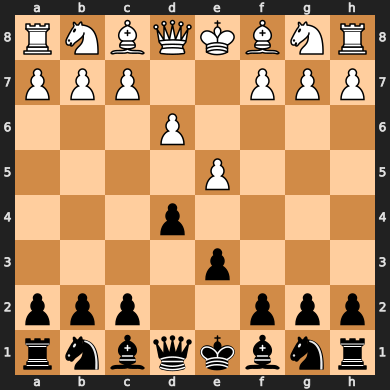

In [39]:
import matplotlib.pyplot as plt
from matplotlib.table import Table

def visualize_chessboard_(tensor):
    """
    Visualizes a chessboard from a tensor with shape (14, 8, 8).
    """
    # Check the tensor shape
    if tensor.shape != (14, 8, 8):
        raise ValueError(f"Expected tensor shape (14, 8, 8), but got {tensor.shape}")

    # Define piece mapping
    piece_map = {
        0: "P", 1: "N", 2: "B", 3: "R", 4: "Q", 5: "K",  # White pieces
        6: "p", 7: "n", 8: "b", 9: "r", 10: "q", 11: "k"  # Black pieces
    }

    # Decode the tensor
    board = [["" for _ in range(8)] for _ in range(8)]
    for channel in range(12):  # Only consider the first 12 channels for pieces
        for row in range(8):
            for col in range(8):
                if tensor[channel, row, col] == 1:
                    board[row][col] = piece_map[channel]

    # Create a figure and add a table to represent the board
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_axis_off()

    table = ax.table(
        cellText=board,
        loc='center',
        cellLoc='center',
        colLabels=["a", "b", "c", "d", "e", "f", "g", "h"],
        rowLabels=[8, 7, 6, 5, 4, 3, 2, 1],
    )
    table.scale(1, 2)
    table.set_fontsize(14)
    plt.show()

data = load_data_from_pickle('testdata.pkl', 1)
pos, moves = data[4]
pos
visualize_board(pos)


In [23]:
import numpy as np

def generate_batches(dataset, batch_size):
    """
    Yields batches of size (batch_size, 14, 8, 8) in sequential order.
    If a game has more than batch_size moves, it continues to yield
    additional batches until that game is exhausted, then moves on.
    The generator yields until all games and positions are exhausted.
    
    Parameters
    ----------
    dataset : list[list[np.ndarray]]
        A list of games, each a list of board positions.
        Each board position has shape (8, 8, 14).
    batch_size : int
        The number of board positions per batch.

    Yields
    ------
    np.ndarray
        Shape (batch_size, 14, 8, 8) or smaller if the last batch has leftovers.
    """
    batch = []
    for game in dataset:
        for position in game:
            # Convert from (8,8,14) to (14,8,8)
            position_14x8x8 = np.transpose(position, (2, 0, 1))
            batch.append(position_14x8x8)

            # If we filled up a batch, yield and reset
            if len(batch) == batch_size:
                yield np.array(batch, dtype=np.float32)
                batch = []

    # If there's leftover data in batch after all games/positions, yield it as well
    if len(batch) > 0:
        yield np.array(batch, dtype=np.float32)

data = load_data_from_pickle('testdata.pkl', 1)
pos, moves = data[0]
batch_size = 32


Chunk: 2


ValueError: axes don't match array

Chunk: 2
Starting preprocessing with sequence length 20...
Total data length: 100

Processing index 0 (sequence 0 to 19)...
  Sequence index 0: Tensor shape torch.Size([14, 8, 8])
  Sequence index 1: Tensor shape torch.Size([14, 8, 8])
  Sequence index 2: Tensor shape torch.Size([14, 8, 8])
  Sequence index 3: Tensor shape torch.Size([14, 8, 8])
  Sequence index 4: Tensor shape torch.Size([14, 8, 8])
  Sequence index 5: Tensor shape torch.Size([14, 8, 8])
  Sequence index 6: Tensor shape torch.Size([14, 8, 8])
  Sequence index 7: Tensor shape torch.Size([14, 8, 8])
  Sequence index 8: Tensor shape torch.Size([14, 8, 8])
  Sequence index 9: Tensor shape torch.Size([14, 8, 8])
  Sequence index 10: Tensor shape torch.Size([14, 8, 8])
  Sequence index 11: Tensor shape torch.Size([14, 8, 8])
  Sequence index 12: Tensor shape torch.Size([14, 8, 8])
  Sequence index 13: Tensor shape torch.Size([14, 8, 8])
  Sequence index 14: Tensor shape torch.Size([14, 8, 8])
  Sequence index 15: Tensor sha

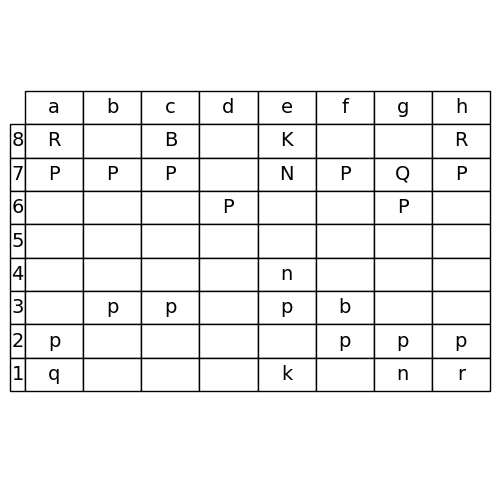

In [125]:
import torch
import chess

def preprocess_data_for_sequences(data, seq_len=10):
    """
    Create sequences of board states and encode moves as integers for training.
    
    Args:
        data (list): List of tuples where each element is (board_state, move),
                     where `board_state` is a (8, 8, 14) numpy array or similar,
                     and `move` is a string in UCI format.
        seq_len (int): The length of the input sequence for each training example.
    
    Returns:
        tuple: (inputs, targets) where:
            - inputs is a tensor of shape (num_sequences, seq_len, 14, 8, 8)
            - targets is a tensor of shape (num_sequences,) with encoded moves
    """
    inputs, targets = [], []
    print(f"Starting preprocessing with sequence length {seq_len}...")
    print(f"Total data length: {len(data)}")
    
    for i in range(len(data) - seq_len):
        try:
            print(f"\nProcessing index {i} (sequence {i} to {i + seq_len - 1})...")
            
            # Extract sequence of board states
            sequence = []
            for j in range(i, i + seq_len):
                tensor = torch.tensor(data[j][0], dtype=torch.float32).permute(2, 0, 1)  # (14, 8, 8)
                print(f"  Sequence index {j}: Tensor shape {tensor.shape}")
                sequence.append(tensor)
            
            # Extract and validate the move
            move = data[i + seq_len][1]  # Next move in UCI format
            print(f"  Move at index {i + seq_len}: {move}")
            
            chess_move = chess.Move.from_uci(move)  # Validate the move
            from_square = chess_move.from_square
            to_square = chess_move.to_square
            print(f"  From square: {from_square} ({chess.square_name(from_square)}), "
                  f"To square: {to_square} ({chess.square_name(to_square)})")
            
            # Encode move as a single integer
            target = from_square * 64 + to_square
            print(f"  Encoded target: {target}")
            
            # Append to dataset
            inputs.append(torch.stack(sequence))  # (seq_len, 14, 8, 8)
            targets.append(target)
            print(f"  Sequence added: inputs shape {inputs[-1].shape}, targets size {len(targets)}")
        
        except (ValueError, AttributeError) as e:
            print(f"Skipping invalid entry at index {i}: {e}")
            continue
    
    if not inputs:
        raise ValueError("No valid data found during preprocessing.")
    
    print("\nPreprocessing complete.")
    print(f"Total sequences: {len(inputs)}, Total targets: {len(targets)}")
    return torch.stack(inputs), torch.tensor(targets, dtype=torch.long)

data_unprocessed = load_data_from_pickle(r"testdata.pkl", 1)

data = preprocess_data_for_sequences(data_unprocessed[:100], seq_len=20)

inputs, targets  = data

inputs.shape, targets.shape

visualize_chessboard_(inputs[4][19])

In [66]:
inputs[0][1].shape

torch.Size([14, 8, 8])

In [44]:
data_unprocessed[:1]

[(array([[[0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.]],
  
         [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
          [1., 0., 0., 0., 0., 0., 0., 0., 0

tensor([[[0., 0., 0., 0., 0., 0., 0., 0.],
         [1., 1., 1., 1., 1., 1., 1., 1.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 1., 0., 0., 0., 0., 1., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 1., 0., 0., 1., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0.],
       

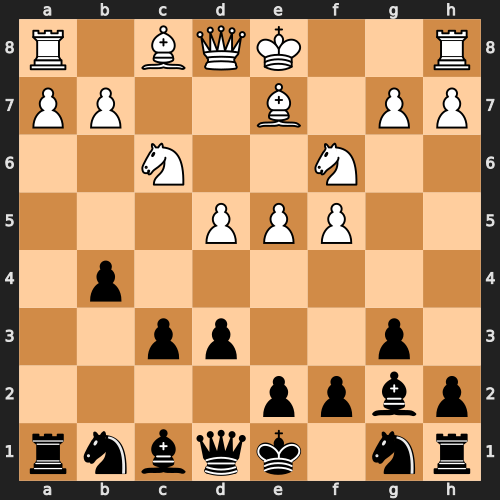

In [33]:
pos, moves = data_unprocessed[]
board = visualize_board(pos)

# Display the board
display(SVG(chess.svg.board(board=board, size=500)))
#print(f"Next move: {next_move}")

In [10]:
import torch.nn as nn
import torch.nn.functional as F

class BoardCNN(nn.Module):
    def __init__(self, cnn_output_dim=256):
        super(BoardCNN, self).__init__()
        self.conv1 = nn.Conv2d(14, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.fc = nn.Linear(128 * 8 * 8, cnn_output_dim)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc(x))
        return x

class MoveTransformer(nn.Module):
    def __init__(self, transformer_dim=256, num_heads=4, num_layers=12):
        super(MoveTransformer, self).__init__()
        self.embedding = nn.Linear(transformer_dim, transformer_dim)
        self.encoder_layer = nn.TransformerEncoderLayer(d_model=transformer_dim, nhead=num_heads)
        self.transformer = nn.TransformerEncoder(self.encoder_layer, num_layers)

    def forward(self, x):
        """
        x: (seq_len, batch_size, feature_dim)
        """
        # No need to unpack dimensions; use input directly
        x = self.embedding(x)  # Add embedding layer if necessary
        x = self.transformer(x)  # Pass through Transformer
        return x

class HybridChessModel(nn.Module):
    def __init__(self, cnn_output_dim=512, transformer_dim=512, num_classes=4096):
        super(HybridChessModel, self).__init__()
        self.cnn = BoardCNN(cnn_output_dim)
        self.transformer = MoveTransformer(transformer_dim=cnn_output_dim)
        self.fc = nn.Linear(transformer_dim, num_classes)

    def forward(self, x):
        """
        x: (batch_size, seq_len, 14, 8, 8)
        """
        batch_size, seq_len, channels, height, width = x.size()
        cnn_features = []
        for t in range(seq_len):
            logits = self.cnn(x[:, t])
            cnn_features.append(logits)
            print("CNN Logits min/max:", logits.min().item(), logits.max().item())
            #print("CNN logits:", logits, logits.shape)
        cnn_features = torch.stack(cnn_features, dim=0)  # (seq_len, batch_size, cnn_output_dim)
        transformer_output = self.transformer(cnn_features)  # (seq_len, batch_size, transformer_dim)
        logits = self.fc(transformer_output[-1])  # Use the last sequence output
        print("Transformer Logits min/max:", logits.min().item(), logits.max().item())
        #print("Transformer Logits:", logits, logits.shape)
        return logits.view(batch_size, -1)  # Ensure logits match (batch_size, num_classes)


In [11]:
from torch.utils.data import DataLoader, TensorDataset

pickle_file_path = r'testdata.pkl'
data = load_data_from_pickle(pickle_file_path, num_to_load=1)
print(len(data))

model = HybridChessModel()
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
epochs = 1
mini_batch = float('inf')

seq_len = 10
inputs, targets = preprocess_data_for_sequences(data, seq_len)
dataset = TensorDataset(inputs, targets)  # inputs: (num_sequences, seq_len, 14, 8, 8)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

Chunk: 2
1000


c:\Users\johns\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


In [11]:
pos, move = dataset[0]

In [15]:
pos, move

(tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
           [1., 1., 1.,  ..., 1., 1., 1.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]],
 
          [[0., 1., 0.,  ..., 0., 1., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]],
 
          [[0., 0., 1.,  ..., 1., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]],
 
          ...,
 
          [[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
       

In [12]:
pos.shape, move.shape

(torch.Size([10, 14, 8, 8]), torch.Size([]))

In [20]:
for pos, move in dataloader:
    print(pos.shape)
    print(move)
    break

torch.Size([1, 10, 14, 8, 8])
tensor([4090])


In [13]:
# Change formatting of data so that each tensor for the CNN contains all
# pieces instead of having 14 channels for each piece.

In [12]:
from torch.utils.data import DataLoader, TensorDataset

pickle_file_path = r'testdata.pkl'
data = load_data_from_pickle(pickle_file_path, num_to_load=1)
print(len(data))

model = HybridChessModel()
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
epochs = 1
mini_batch = float('inf')

seq_len = 10
inputs, targets = preprocess_data_for_sequences(data, seq_len)
dataset = TensorDataset(inputs, targets)  # inputs: (num_sequences, seq_len, 14, 8, 8)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 10)

for board_sequences, targets in dataloader:
    if not torch.all((targets >= 0) & (targets < 4096)):
        print("Invalid targets found!")

for epoch in range(epochs):
    count = 0 
    for board_sequences, targets in dataloader:
        logits = model(board_sequences)
        print("Predicted:", torch.argmax(torch.softmax(logits, dim=-1)).item(), "Actual:", targets)
        loss = criterion(logits, targets)
        
        optimizer.zero_grad()
        loss.backward()
        # After loss.backward()
        # for name, param in model.named_parameters():
        #     if param.grad is not None:
        #         print(f"{name} - Mean Gradient: {param.grad.abs().mean():.6f}")
        #     else:
        #         print(f"{name} has no gradient.")

        norm = torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        count += 1
        if count > mini_batch:
            break
    
        print(f"Epoch {epoch + 1}/{epochs}, norm: {norm}, Loss: {loss.item():.4f}")


Chunk: 2
1000


c:\Users\johns\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


CNN Logits min/max: 0.0 0.038984499871730804
CNN Logits min/max: 0.0 0.03755689412355423
CNN Logits min/max: 0.0 0.037677329033613205
CNN Logits min/max: 0.0 0.03586198017001152
CNN Logits min/max: 0.0 0.03650810569524765
CNN Logits min/max: 0.0 0.03526778146624565
CNN Logits min/max: 0.0 0.034186940640211105
CNN Logits min/max: 0.0 0.03740060701966286
CNN Logits min/max: 0.0 0.03717001900076866
CNN Logits min/max: 0.0 0.03606664761900902
Transformer Logits min/max: -2.0199801921844482 1.965436577796936
Predicted: 507 Actual: tensor([97])
Epoch 1/1, norm: 50.18548583984375, Loss: 9.2361
CNN Logits min/max: 0.0 0.1287555694580078
CNN Logits min/max: 0.0 0.12657347321510315
CNN Logits min/max: 0.0 0.12681493163108826
CNN Logits min/max: 0.0 0.12801378965377808
CNN Logits min/max: 0.0 0.12747785449028015
CNN Logits min/max: 0.0 0.12694860994815826
CNN Logits min/max: 0.0 0.12613336741924286
CNN Logits min/max: 0.0 0.12430605292320251
CNN Logits min/max: 0.0 0.12545184791088104
CNN Logits 

KeyboardInterrupt: 

In [8]:
len(data[0][0][:])

8

In [6]:
import pickle
import torch
import chess

def load_data_from_pickle(file_path, num_to_load):
    """
    Load data stored in a pickle file incrementally.
    """
    data = []
    with open(file_path, 'rb') as f:
        count = 0
        while count <= num_to_load - 1:
            try:
                chunk = pickle.load(f)
                data.extend(chunk)  # Add chunk to data list
                count += 1
                print(f'Chunk: {count}')
            except EOFError:
                break  # Reached the end of the file
    return data

def preprocess_data_for_sequences(data, seq_len=10):
    """
    Create sequences of board states for training, encoding moves as integers.
    """
    inputs, targets = [], []
    for i in range(len(data) - seq_len):
        sequence = [torch.tensor(data[j][0], dtype=torch.float32).permute(2, 0, 1)  # (14, 8, 8)
                    for j in range(i, i + seq_len)]
        
        move = data[i + seq_len][1]  # Next move (UCI format)
        
        # Encode move as a single integer
        try:
            from_square = chess.SQUARE_NAMES.index(move[:2])
            to_square = chess.SQUARE_NAMES.index(move[2:4])
            target = from_square * 64 + to_square  # Encode as single integer
        except ValueError:
            print(f"Skipping invalid move: {move}")
            continue

        inputs.append(torch.stack(sequence))  # (seq_len, 14, 8, 8)
        targets.append(target)

    return torch.stack(inputs), torch.tensor(targets, dtype=torch.long)

# File path to the .pkl file
pickle_file_path = r'testdata.pkl'

# Load data
data = load_data_from_pickle(pickle_file_path, num_to_load=1)

# Example: Access the first (position, move) pair
if data:
    position, move = data[0]
    print("Position tensor shape:", position.shape)
    print("Next move:", move)

# Generate sequences
seq_len = 10
inputs, targets = preprocess_data_for_sequences(data, seq_len)


for position, move in data:
    print(move)

len(data)

Chunk: 1
Position tensor shape: (8, 8, 14)
Next move: e2e4
e2e4
e7e6
d2d3
d7d5
b1d2
d5e4
d2e4
b7b6
g2g3
c8b7
f1g2
f8e7
e4f6
e7f6
g2b7
b8d7
b7a8
d8a8
d1f3
c7c6
g1e2
d7e5
f3g2
g8e7
e1g1
a8d8
f2f4
e5g4
h2h3
f6d4
g1h1
g4f6
c2c3
d4c5
d3d4
h7h5
d4c5
b6c5
c1e3
d8d3
e3c5
f6d5
c5e7
e8e7
a1d1
d3c2
d1d5
c6d5
e2d4
c2a4
a2a3
h8c8
g2e2
a4d7
f4f5
c8c4
f5e6
f7e6
e2h5
e7d6
h5g5
d7b7
g5f4
d6c5
d4e6
c5b5
e6d4
b5a5
b2b4
a5a4
f4c1
c4d4
c1c2
a4b5
c3d4
b7e7
c2c5
d2d4
c7c5
c2c4
c5d4
g1f3
b8c6
e2e3
e7e6
e3d4
g8f6
b1c3
d7d5
c4d5
e6d5
f1b5
c8f5
d1a4
f8d6
b5c6
b7c6
a4c6
e8e7
c3d5
f6d5
c6d5
h8e8
d5f5
e7f8
c1e3
g7g6
f5d3
f8g8
e1g1
f7f5
f1e1
d8c7
e3h6
e8e1
a1e1
a8d8
d3b3
c7f7
b3f7
g8f7
f3g5
f7g8
g5e6
d8e8
d4d5
g8f7
e1c1
f7f6
c1c6
e8b8
h6g5
e2e4
c7c5
g1f3
d7d6
d2d4
c5d4
f3d4
g8f6
b1c3
g7g6
f1e2
f8g7
c1e3
e8g8
d1d2
b8c6
h2h4
f6g4
e2g4
c8g4
f2f3
c6d4
e3d4
g7d4
f3g4
d4c3
d2c3
a8c8
c3d3
d8a5
c2c3
a5e5
e1g1
b7b5
a1e1
c8c4
h4h5
f8c8
d3f3
f7f6
h5g6
h7g6
f3h3
g8g7
h3f3
c8h8
g2g3
b5b4
f3g2
b4c3
f1f5
g6f5
e4f5
e5e1
c2c4
e7e6
g

1000